In [1]:
import os
import boto3
from dotenv import load_dotenv
import pandas as pd
import numpy as np
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import lightgbm as lgb
from catboost import CatBoostClassifier, Pool
from bayes_opt import BayesianOptimization

In [2]:
load_dotenv()

True

In [3]:
# Custom function to reduce memory usage of data

def reduce_mem_usage(df, verbose=True):
    numerics = ['int8','int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [4]:
AWS_S3_BUCKET = os.getenv("AWS_S3_BUCKET")
AWS_ACCESS_KEY_ID = os.getenv("AWS_ACCESS_KEY_ID")
AWS_SECRET_ACCESS_KEY = os.getenv("AWS_SECRET_ACCESS_KEY")

In [5]:
s3_client = boto3.client(
    "s3",
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

response = s3_client.get_object(Bucket=AWS_S3_BUCKET, Key="processed/tcga_processed.csv")

status = response.get("ResponseMetadata", {}).get("HTTPStatusCode")

if status == 200:
    print(f"Successful S3 get_object response. Status - {status}")
    input_df = reduce_mem_usage(pd.read_csv(response.get("Body")))
    print(input_df.info())
else:
    print(f"Unsuccessful S3 get_object response. Status - {status}")

Successful S3 get_object response. Status - 200
Mem. usage decreased to  0.54 Mb (87.0% reduction)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10017 entries, 0 to 10016
Data columns (total 54 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Primary_Site                                    10017 non-null  int8   
 1   Deceased_Status                                 10017 non-null  int8   
 2   Age_At_Diagnosis                                10017 non-null  float16
 3   Prior_Malignancy                                10017 non-null  int8   
 4   Synchronous_Malignancy                          10017 non-null  int8   
 5   TP53                                            10017 non-null  int8   
 6   PIK3CA                                          10017 non-null  int8   
 7   TTN                                             10017 non-null  int8   
 8   CDH1             

In [6]:
print(input_df.shape)
input_df.head()

(10017, 54)


,Primary_Site,Deceased_Status,Age_At_Diagnosis,Prior_Malignancy,Synchronous_Malignancy,TP53,PIK3CA,TTN,CDH1,GATA3,...,ICE1,SMAD4,CDKN2A,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_native hawaiian or other pacific islander,Race_other,Race_white,Weight
0,0,0,9.601562,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0.231201
1,0,0,6.378906,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201
2,0,0,16.750000,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201
3,0,0,16.046875,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201
4,0,0,14.046875,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201


In [7]:
# Splitting training and testing data

target = input_df['Primary_Site']
features = input_df.drop('Primary_Site', axis=1)

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.1, random_state=42)

X_train.shape, X_test.shape

((9015, 53), (1002, 53))

## LightGBM Algorithm

In [10]:
# Creating lightgbm datasets

lgb_train = lgb.Dataset(X_train.drop('Weight', axis=1), label=y_train, weight=X_train['Weight'])
lgb_test = lgb.Dataset(X_test.drop('Weight', axis=1), label=y_test, weight=X_test['Weight'], reference=lgb_train)

In [11]:
def bayes_parameter_opt_lgb(X, y, init_round=15, opt_round=25, n_folds=3, random_seed=6,n_estimators=10000, output_process=False):
    # prepare data
    train_data = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
    # parameters
    def lgb_eval(num_class, learning_rate,num_leaves, feature_fraction, bagging_fraction, max_depth, max_bin, min_data_in_leaf,min_sum_hessian_in_leaf,subsample):
        params = {'objective':'multiclass', 'metric':'multi_logloss'}
        params['num_class'] = 9
        params['learning_rate'] = max(min(learning_rate, 1), 0)
        params["num_leaves"] = int(round(num_leaves))
        params['feature_fraction'] = max(min(feature_fraction, 1), 0)
        params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
        params['max_depth'] = int(round(max_depth))
        params['max_bin'] = int(round(max_depth))
        params['min_data_in_leaf'] = int(round(min_data_in_leaf))
        params['min_sum_hessian_in_leaf'] = min_sum_hessian_in_leaf
        params['subsample'] = max(min(subsample, 1), 0)
        
        cv_result = lgb.cv(params, train_data, nfold=n_folds, seed=random_seed, stratified=True, verbose_eval =200, metrics=['multi_logloss'])
        return max(cv_result['multi_logloss-mean'])
     
    lgbBO = BayesianOptimization(lgb_eval, {
                                            'num_class': (9, 9),
                                            'learning_rate': (0.01, 1.0),
                                            'num_leaves': (24, 80),
                                            'feature_fraction': (0.1, 0.9),
                                            'bagging_fraction': (0.8, 1),
                                            'max_depth': (5, 30),
                                            'max_bin':(20,90),
                                            'min_data_in_leaf': (20, 80),
                                            'min_sum_hessian_in_leaf':(0,100),
                                            'subsample': (0.01, 1.0)
                                            }, random_state=200)

    
    #n_iter: How many steps of bayesian optimization you want to perform. The more steps the more likely to find a good maximum you are.
    #init_points: How many steps of random exploration you want to perform. Random exploration can help by diversifying the exploration space.
    
    lgbBO.maximize(init_points=init_round, n_iter=opt_round)
    
    model_acc=[]
    for model in range(len(lgbBO.res)):
        model_acc.append(lgbBO.res[model]['target'])
    
    # return best parameters
    return lgbBO.res[pd.Series(model_acc).idxmax()]['target'],lgbBO.res[pd.Series(model_acc).idxmax()]['params']

opt_params = bayes_parameter_opt_lgb(X_train, y_train, init_round=5, opt_round=10, n_folds=3, random_seed=6,n_estimators=10000)

|   iter    |  target   | baggin... | featur... | learni... |  max_bin  | max_depth | min_da... | min_su... | num_class | num_le... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------------------
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_row_wise=true` t

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] bagging_fraction is set=0.9652100294394654, subsample=0.11437976620936573 will be ignored. Current value: bagging_fraction=0.9652100294394654
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 48
[LightGBM] [Warning] bagging_fraction is set=0.9652100294394654, subsample=0.11437976620936573 will be ignored. Current value: bagging_fraction=0.9652100294394654
[LightGBM] [Info] Start training from score -0.734247
[LightGBM] [Info] Start training from score -2.213496
[LightGBM] [Info] Start training from score -2.249131
[LightGBM] [Info] Start training from score -2.373243
[LightGBM] [Info] Start training from score -2.675314
[LightGBM] [Info] Start training from score -2.740

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

| 3         | 0.7962    | 0.9652    | 0.5147    | 0.8748    | 60.49     | 16.25     | 60.81     | 41.94     | 9.0       | 58.08     | 0.1144    |
[LightGBM] [Warning] bagging_fraction is set=0.9652100294394654, subsample=0.11437976620936573 will be ignored. Current value: bagging_fraction=0.9652100294394654
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current value: bagging_fraction=0.9932089178072061
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current value: bagging_fraction=0.9932089178072061
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current value: bagging_fraction=0.9932089178072061
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current va

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 51
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.837537828398457

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8790411164946128, subsample=0.31034307775929715 will be ignored. Current value: bagging_fraction=0.8790411164946128
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8790411164946128, subsample=0.31034307775929715 will be ignored. Current value: bagging_fraction=0.8790411164946128
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features:

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of 

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves 

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 129
[LightGBM] [Info] Number of data points in the train set: 6010, numbe

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number o

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 6010, numbe

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [12]:
opt_params[1]["num_leaves"] = int(round(opt_params[1]["num_leaves"]))
opt_params[1]['max_depth'] = int(round(opt_params[1]['max_depth']))
opt_params[1]['min_data_in_leaf'] = int(round(opt_params[1]['min_data_in_leaf']))
opt_params[1]['max_bin'] = int(round(opt_params[1]['max_bin']))
opt_params[1]['objective']='multiclass'
opt_params[1]['metric']='multi_logloss'
opt_params[1]['num_class'] = 9
opt_params[1]['boost_from_average']=False
lgb_params=opt_params[1]

lgb_params

{'bagging_fraction': 0.8,
 'feature_fraction': 0.1,
 'learning_rate': 0.01,
 'max_bin': 20,
 'max_depth': 5,
 'min_data_in_leaf': 20,
 'min_sum_hessian_in_leaf': 34.281493471663694,
 'num_class': 9,
 'num_leaves': 70,
 'subsample': 0.01,
 'objective': 'multiclass',
 'metric': 'multi_logloss',
 'boost_from_average': False}

In [13]:
# Training the model

lgb_clf = lgb.train(lgb_params, lgb_train, 15000, valid_sets=[lgb_train, lgb_test])

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 9015, number of used features: 52
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	training's multi_logloss: 1.92617	valid_1's multi_logloss: 1.94385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[128]	training's multi_logloss: 1.71843	valid_1's multi_logloss: 1.75476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	training's multi_logloss: 1.7169	valid_1's multi_logloss: 1.75348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	training's multi_logloss: 1.57257	valid_1's multi_logloss: 1.62002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[261]	training's multi_logloss: 1.47556	valid_1's multi_logloss: 1.5299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	training's multi_logloss: 1.40192	valid_1's multi_logloss: 1.46207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	training's multi_logloss: 1.33631	valid_1's multi_logloss: 1.40226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[378]	training's multi_logloss: 1.33561	valid_1's multi_logloss: 1.40173
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[441]	training's multi_logloss: 1.27564	valid_1's multi_logloss: 1.34771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[528]	training's multi_logloss: 1.2113	valid_1's multi_logloss: 1.28818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[614]	training's multi_logloss: 1.16031	valid_1's multi_logloss: 1.24298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[691]	training's multi_logloss: 1.12583	valid_1's multi_logloss: 1.21106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[692]	training's multi_logloss: 1.12525	valid_1's multi_logloss: 1.21057
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[779]	training's multi_logloss: 1.0914	valid_1's multi_logloss: 1.17997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[864]	training's multi_logloss: 1.06454	valid_1's multi_logloss: 1.15823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[865]	training's multi_logloss: 1.06427	valid_1's multi_logloss: 1.15798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[935]	training's multi_logloss: 1.04643	valid_1's multi_logloss: 1.14175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[988]	training's multi_logloss: 1.0352	valid_1's multi_logloss: 1.13206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[1045]	training's multi_logloss: 1.02277	valid_1's multi_logloss: 1.12153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1046]	training's multi_logloss: 1.02263	valid_1's multi_logloss: 1.12144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1135]	training's multi_logloss: 1.00571	valid_1's multi_logloss: 1.10808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1213]	training's multi_logloss: 0.993101	valid_1's multi_logloss: 1.0979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1214]	training's multi_lo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1290]	training's multi_logloss: 0.982958	valid_1's multi_logloss: 1.08909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1374]	training's multi_logloss: 0.973652	valid_1's multi_logloss: 1.08202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1430]	training's multi_logloss: 0.967751	valid_1's multi_logloss: 1.07759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1431]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1513]	training's multi_logloss: 0.958864	valid_1's multi_logloss: 1.07179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1584]	training's multi_logloss: 0.953058	valid_1's multi_logloss: 1.06779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1670]	training's multi_logloss: 0.946689	valid_1's multi_logloss: 1.06356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1761]	training's multi_logloss: 0.940605	valid_1's multi_logloss: 1.06017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1838]	training's multi_logloss: 0.936383	valid_1's multi_logloss: 1.05765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1914]	training's multi_logloss: 0.931833	valid_1's multi_logloss: 1.05489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1915]	training's multi_logloss: 0.931782	valid_1's multi_logloss: 1.05486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[2010]	training's multi_logloss: 0.92727	valid_1's multi_logloss: 1.05297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2011]	training's multi_logloss: 0.927211	valid_1's multi_logloss: 1.05294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2103]	training's multi_logloss: 0.922831	valid_1's multi_logloss: 1.05074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2203]	training's multi_logloss: 0.919079	valid_1's multi_logloss: 1.04892
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2204]	training's multi_logloss: 0.91906	valid_1's multi_logloss: 1.0489
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2297]	training's multi_logloss: 0.915382	valid_1's multi_logloss: 1.0478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[2389]	training's multi_logloss: 0.912178	valid_1's multi_logloss: 1.04674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2390]	training's multi_logloss: 0.912161	valid_1's multi_logloss: 1.04669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2484]	training's multi_logloss: 0.90878	valid_1's multi_logloss: 1.04518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2577]	training's multi_logloss: 0.905804	valid_1's multi_logloss: 1.04503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2578]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2665]	training's multi_logloss: 0.903423	valid_1's multi_logloss: 1.04424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2758]	training's multi_logloss: 0.900822	valid_1's multi_logloss: 1.0437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2759]	training's multi_logloss: 0.900803	valid_1's multi_logloss: 1.04368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2855]	training's multi_logloss: 0.898491	valid_1's multi_logloss: 1.04272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2954]	training's multi_logloss: 0.896121	valid_1's multi_logloss: 1.04203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3049]	training's multi_logloss: 0.893719	valid_1's multi_logloss: 1.04166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3050]	training's multi_logloss: 0.893692	valid_1's multi_logloss: 1.04167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3143]	training's multi_logloss: 0.891759	valid_1's multi_logloss: 1.04115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3144]	training's multi_logloss: 0.891728	valid_1's multi_logloss: 1.04119
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3237]	training's multi_logloss: 0.889667	valid_1's multi_logloss: 1.04064
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3328]	training's multi_logloss: 0.887687	valid_1's multi_logloss: 1.04025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3418]	training's multi_logloss: 0.886101	valid_1's multi_logloss: 1.03958
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3514]	training's multi_logloss: 0.884279	valid_1's multi_logloss: 1.03929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3587]	training's multi_logloss: 0.883063	valid_1's multi_logloss: 1.03925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3658]	training's multi_logloss: 0.881925	valid_1's multi_logloss: 1.03902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3746]	training's multi_logloss: 0.880647	valid_1's multi_logloss: 1.03886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3747]	training's multi_logloss: 0.880632	valid_1's multi_logloss: 1.03885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3844]	training's multi_logloss: 0.879104	valid_1's multi_logloss: 1.03855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3933]	training's multi_logloss: 0.877437	valid_1's multi_logloss: 1.03904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3934]	training's multi_logloss: 0.877424	valid_1's multi_logloss: 1.03904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4027]	training's multi_logloss: 0.876132	valid_1's multi_logloss: 1.03903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4154]	training's multi_logloss: 0.874208	valid_1's multi_logloss: 1.03866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[4278]	training's multi_logloss: 0.872457	valid_1's multi_logloss: 1.03841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4279]	training's multi_logloss: 0.872403	valid_1's multi_logloss: 1.03843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4406]	training's multi_logloss: 0.870766	valid_1's multi_logloss: 1.03838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4517]	training's multi_logloss: 0.869529	valid_1's multi_logloss: 1.0381
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4518]	training's multi_logloss: 0.869518	valid_1's multi_logloss: 1.0381
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4646]	training's multi_logloss: 0.867932	valid_1's multi_logloss: 1.03801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4761]	training's multi_logloss: 0.866757	valid_1's multi_logloss: 1.03795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4867]	training's multi_logloss: 0.865324	valid_1's multi_logloss: 1.03796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4967]	training's multi_logloss: 0.86431	valid_1's multi_logloss: 1.03785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[5077]	training's multi_logloss: 0.86316	valid_1's multi_logloss: 1.03784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5078]	training's multi_logloss: 0.863155	valid_1's multi_logloss: 1.03785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[5155]	training's multi_logloss: 0.862268	valid_1's multi_logloss: 1.03792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5156]	training's multi_logloss: 0.862262	valid_1's multi_logloss: 1.0379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5217]	training's multi_logloss: 0.861593	valid_1's multi_logloss: 1.03779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5218]	training's multi_logloss: 0.861592	valid_1's multi_logloss: 1.03779
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5320]	training's multi_logloss: 0.860451	valid_1's multi_logloss: 1.03786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5321]	training's multi_logloss: 0.86044	valid_1's multi_logloss: 1.03786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5415]	training's multi_logloss: 0.859357	valid_1's multi_logloss: 1.03823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[5544]	training's multi_logloss: 0.857945	valid_1's multi_logloss: 1.03814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5545]	training's multi_logloss: 0.857936	valid_1's multi_logloss: 1.03812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5669]	training's multi_logloss: 0.85668	valid_1's multi_logloss: 1.03788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[5768]	training's multi_logloss: 0.855701	valid_1's multi_logloss: 1.03797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5769]	training's multi_logloss: 0.855696	valid_1's multi_logloss: 1.03797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5890]	training's multi_logloss: 0.85457	valid_1's multi_logloss: 1.03816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5891]	training's multi_lo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6014]	training's multi_logloss: 0.853431	valid_1's multi_logloss: 1.03866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[6125]	training's multi_logloss: 0.85254	valid_1's multi_logloss: 1.03862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6126]	training's multi_logloss: 0.852532	valid_1's multi_logloss: 1.03862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6232]	training's multi_logloss: 0.851667	valid_1's multi_logloss: 1.03899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6328]	training's multi_logloss: 0.850895	valid_1's multi_logloss: 1.03904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6329]	training's multi_logloss: 0.850889	valid_1's multi_logloss: 1.03906
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6447]	training's multi_logloss: 0.849997	valid_1's multi_logloss: 1.03933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6448]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6580]	training's multi_logloss: 0.849013	valid_1's multi_logloss: 1.03948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[6692]	training's multi_logloss: 0.848147	valid_1's multi_logloss: 1.03967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6693]	training's multi_logloss: 0.848143	valid_1's multi_logloss: 1.03966
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6817]	training's multi_logloss: 0.847174	valid_1's multi_logloss: 1.04013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6937]	training's multi_logloss: 0.846346	valid_1's multi_logloss: 1.04054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7045]	training's multi_logloss: 0.845583	valid_1's multi_logloss: 1.04065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7140]	training's multi_logloss: 0.844948	valid_1's multi_logloss: 1.04089
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7234]	training's multi_logloss: 0.844289	valid_1's multi_logloss: 1.04106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7332]	training's multi_logloss: 0.843652	valid_1's multi_logloss: 1.04122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7417]	training's multi_logloss: 0.843063	valid_1's multi_logloss: 1.0414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7418]	training's multi_logloss: 0.843061	valid_1's multi_logloss: 1.04141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[7498]	training's multi_logloss: 0.842427	valid_1's multi_logloss: 1.04162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7499]	training's multi_logloss: 0.842423	valid_1's multi_logloss: 1.04163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7589]	training's multi_logloss: 0.841808	valid_1's multi_logloss: 1.04195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7682]	training's multi_logloss: 0.841182	valid_1's multi_logloss: 1.04209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[7776]	training's multi_logloss: 0.840584	valid_1's multi_logloss: 1.04234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7777]	training's multi_logloss: 0.840582	valid_1's multi_logloss: 1.04233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7892]	training's multi_logloss: 0.83993	valid_1's multi_logloss: 1.04289
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8012]	training's multi_logloss: 0.839231	valid_1's multi_logloss: 1.04303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[8142]	training's multi_logloss: 0.838339	valid_1's multi_logloss: 1.04356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8143]	training's multi_logloss: 0.838336	valid_1's multi_logloss: 1.04355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[8277]	training's multi_logloss: 0.837399	valid_1's multi_logloss: 1.04364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8278]	training's multi_logloss: 0.837381	valid_1's multi_logloss: 1.04362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8409]	training's multi_logloss: 0.836566	valid_1's multi_logloss: 1.04368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8542]	training's multi_logloss: 0.835733	valid_1's multi_logloss: 1.0442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[8670]	training's multi_logloss: 0.834932	valid_1's multi_logloss: 1.0448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8671]	training's multi_logloss: 0.834919	valid_1's multi_logloss: 1.0448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8804]	training's multi_logloss: 0.834173	valid_1's multi_logloss: 1.04542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8936]	training's multi_logloss: 0.833289	valid_1's multi_logloss: 1.04562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9070]	training's multi_logloss: 0.832531	valid_1's multi_logloss: 1.04578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9202]	training's multi_logloss: 0.831804	valid_1's multi_logloss: 1.04631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9319]	training's multi_logloss: 0.831153	valid_1's multi_logloss: 1.04685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9451]	training's multi_logloss: 0.830397	valid_1's multi_logloss: 1.04719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9584]	training's multi_logloss: 0.829842	valid_1's multi_logloss: 1.04738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9716]	training's multi_logloss: 0.829172	valid_1's multi_logloss: 1.04778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9844]	training's multi_logloss: 0.828536	valid_1's multi_logloss: 1.04801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9958]	training's multi_logloss: 0.828029	valid_1's multi_logloss: 1.04843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10061]	training's multi_logloss: 0.827483	valid_1's multi_logloss: 1.04893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10062]	training's multi_logloss: 0.827481	valid_1's multi_logloss: 1.04893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10148]	training's multi_logloss: 0.827034	valid_1's multi_logloss: 1.04927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10234]	training's multi_logloss: 0.826613	valid_1's multi_logloss: 1.04956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10333]	training's multi_logloss: 0.826221	valid_1's multi_logloss: 1.04969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10334]	training's multi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10418]	training's multi_logloss: 0.825831	valid_1's multi_logloss: 1.04985
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10517]	training's multi_logloss: 0.825336	valid_1's multi_logloss: 1.05018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10518]	training's multi_logloss: 0.825326	valid_1's multi_logloss: 1.05017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[10632]	training's multi_logloss: 0.8248	valid_1's multi_logloss: 1.05029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10633]	training's multi_logloss: 0.824794	valid_1's multi_logloss: 1.05028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[10752]	training's multi_logloss: 0.824236	valid_1's multi_logloss: 1.05075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10753]	training's multi_logloss: 0.824228	valid_1's multi_logloss: 1.05076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10890]	training's multi_logloss: 0.82363	valid_1's multi_logloss: 1.05118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11022]	training's multi_logloss: 0.823	valid_1's multi_logloss: 1.05171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11023]	training's multi_logloss: 0.822996	valid_1's multi_logloss: 1.0517
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11155]	training's multi_logloss: 0.822457	valid_1's multi_logloss: 1.05221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[11288]	training's multi_logloss: 0.821879	valid_1's multi_logloss: 1.05263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11289]	training's multi_logloss: 0.821877	valid_1's multi_logloss: 1.05262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11420]	training's multi_logloss: 0.821367	valid_1's multi_logloss: 1.05273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11421]	training's multi_logloss: 0.821364	valid_1's multi_logloss: 1.05273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[11548]	training's multi_logloss: 0.820843	valid_1's multi_logloss: 1.05289
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11549]	training's multi_logloss: 0.82084	valid_1's multi_logloss: 1.0529
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11679]	training's multi_logloss: 0.820354	valid_1's multi_logloss: 1.05316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11801]	training's multi_logloss: 0.819893	valid_1's multi_logloss: 1.05346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[11920]	training's multi_logloss: 0.819398	valid_1's multi_logloss: 1.05382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11921]	training's multi_logloss: 0.819372	valid_1's multi_logloss: 1.0538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12045]	training's multi_logloss: 0.81895	valid_1's multi_logloss: 1.05414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[12152]	training's multi_logloss: 0.818527	valid_1's multi_logloss: 1.05413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12153]	training's multi_logloss: 0.818524	valid_1's multi_logloss: 1.05414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12267]	training's multi_logloss: 0.818114	valid_1's multi_logloss: 1.05456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[12381]	training's multi_logloss: 0.817676	valid_1's multi_logloss: 1.05511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12382]	training's multi_logloss: 0.817674	valid_1's multi_logloss: 1.05511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12503]	training's multi_logloss: 0.817172	valid_1's multi_logloss: 1.05562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12590]	training's multi_logloss: 0.81684	valid_1's multi_logloss: 1.05575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12715]	training's multi_logloss: 0.816344	valid_1's multi_logloss: 1.0562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12848]	training's multi_logloss: 0.815873	valid_1's multi_logloss: 1.05653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12959]	training's multi_logloss: 0.815432	valid_1's multi_logloss: 1.05681
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13074]	training's multi_logloss: 0.814973	valid_1's multi_logloss: 1.05722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13075]	training's multi_logloss: 0.81497	valid_1's multi_logloss: 1.05723
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13208]	training's multi_logloss: 0.814507	valid_1's multi_logloss: 1.05775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13345]	training's multi_logloss: 0.814061	valid_1's multi_logloss: 1.05835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13346]	training's multi_logloss: 0.81406	valid_1's multi_logloss: 1.05835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13479]	training's multi_logloss: 0.813621	valid_1's multi_logloss: 1.05859
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13613]	training's multi_logloss: 0.813204	valid_1's multi_logloss: 1.05922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13614]	training's multi_logloss: 0.813196	valid_1's multi_logloss: 1.05921
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13743]	training's multi_logloss: 0.812754	valid_1's multi_logloss: 1.05967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13744]	training's multi_logloss: 0.812751	valid_1's multi_logloss: 1.05971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13878]	training's multi_logloss: 0.812357	valid_1's multi_logloss: 1.05991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14009]	training's multi_logloss: 0.811865	valid_1's multi_logloss: 1.06036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[14139]	training's multi_logloss: 0.81146	valid_1's multi_logloss: 1.06069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14140]	training's multi_logloss: 0.811453	valid_1's multi_logloss: 1.0607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[14273]	training's multi_logloss: 0.811015	valid_1's multi_logloss: 1.06122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14274]	training's multi_logloss: 0.811014	valid_1's multi_logloss: 1.06122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14409]	training's multi_logloss: 0.810586	valid_1's multi_logloss: 1.06153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14542]	training's multi_logloss: 0.810127	valid_1's multi_logloss: 1.06185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14665]	training's multi_logloss: 0.809753	valid_1's multi_logloss: 1.06243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14666]	training's multi_logloss: 0.809753	valid_1's multi_logloss: 1.06244
[LightGBM] [Warning] No

[14779]	training's multi_logloss: 0.809467	valid_1's multi_logloss: 1.06266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14780]	training's multi_logloss: 0.809463	valid_1's multi_logloss: 1.06266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14911]	training's multi_logloss: 0.809052	valid_1's multi_logloss: 1.06318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

In [14]:
lgb_pred = lgb_clf.predict(X_test.drop('Weight', axis=1), num_iteration = lgb_clf.best_iteration)
lgb_pred.shape
lgb_pred[:4]

array([[0.17379164, 0.05566178, 0.25500166, 0.22814174, 0.04766524,
        0.03203768, 0.00693967, 0.18160251, 0.01915808],
       [0.09614006, 0.08857273, 0.33415842, 0.16372547, 0.03442101,
        0.15687388, 0.01369345, 0.10546693, 0.00694806],
       [0.05336418, 0.02360879, 0.41462302, 0.12334705, 0.00850613,
        0.19445336, 0.00950388, 0.10236912, 0.07022448],
       [0.04291462, 0.08986122, 0.23699145, 0.19698624, 0.00486137,
        0.25302329, 0.07808101, 0.04844869, 0.04883211]])

In [15]:
lgb_pred = np.argmax(lgb_pred, axis=1)
lgb_pred[:10]

array([2, 2, 2, 5, 2, 3, 8, 0, 0, 0], dtype=int64)

In [16]:
lgb_f1 = f1_score(y_test, lgb_pred, average='macro')
print(f'F1 Score: {lgb_f1}')

F1 Score: 0.5982955549138259


In [17]:
# Classification report for the LGBM prediction
lgb_report = classification_report(y_test, lgb_pred)
print(lgb_report)

              precision    recall  f1-score   support

           0       0.99      0.71      0.83       488
           1       0.71      0.65      0.68       100
           2       0.38      0.72      0.50       108
           3       0.47      0.44      0.46        93
           4       0.76      0.74      0.75        76
           5       0.61      0.65      0.63        52
           6       0.55      0.72      0.62        32
           7       0.46      0.72      0.56        36
           8       0.27      0.59      0.37        17

    accuracy                           0.68      1002
   macro avg       0.58      0.66      0.60      1002
weighted avg       0.76      0.68      0.70      1002



In [18]:
lgbm_feature_importance_df = pd.DataFrame()
lgbm_feature_importance_df["Feature"] = [c for c in X_train.columns if c not in ['Primary_Site', 'Weight']]
lgbm_feature_importance_df['Importance'] = lgb_clf.feature_importance()
lgbm_feature_importance_df = lgbm_feature_importance_df.sort_values(by =['Importance'], ascending=False)

lgbm_feature_importance_df

,Feature,Importance
51,Age_At_Diagnosis,145502
5,TTN,14330
50,Race_white,13515
3,TP53,13130
0,Deceased_Status,11677
12,MUC16,11399
47,Race_black or african american,9085
13,RYR2,8039
4,PIK3CA,7903
10,SYNE1,7535


<Axes: title={'center': 'LightGBM Feature Importance'}, xlabel='Feature'>

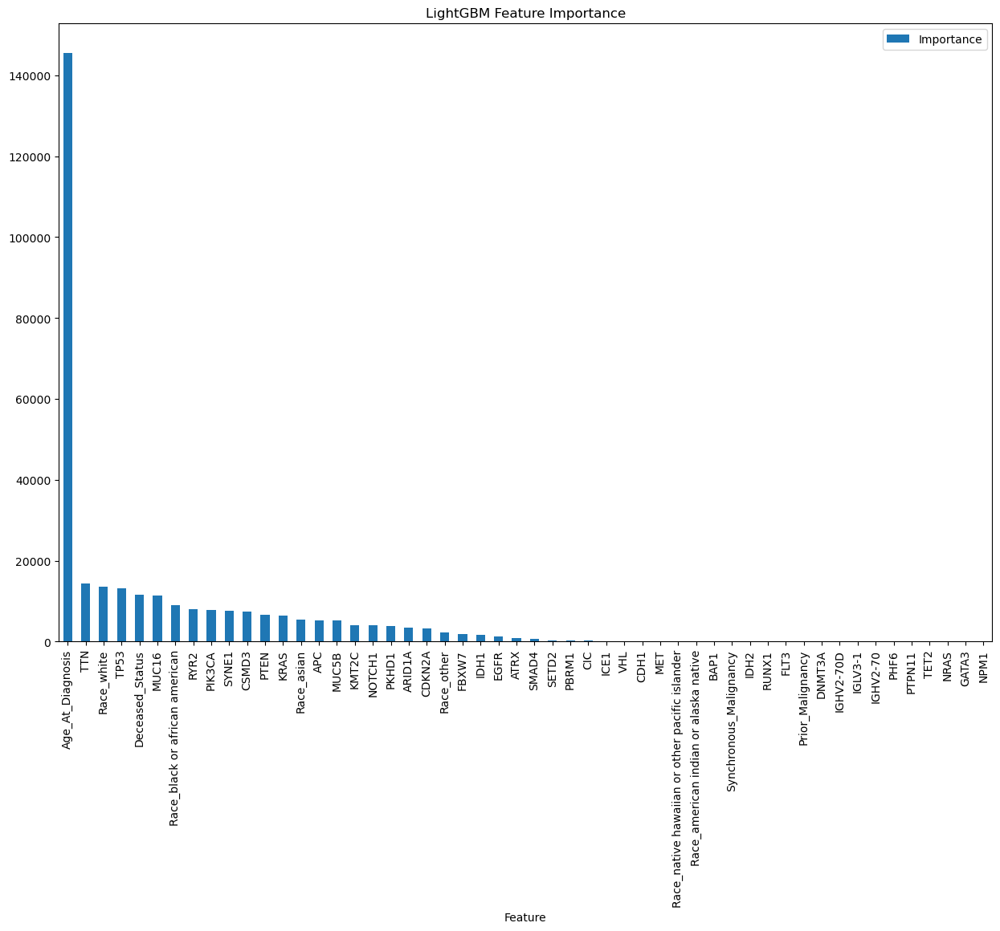

In [19]:
lgbm_feature_importance_df.plot(kind='bar', 
                                title='LightGBM Feature Importance', 
                                x='Feature', 
                                y='Importance', 
                                figsize=(15,10))

## CatBoost Algorithm

In [10]:
# Creating training and evaluating data sets

cat_train = X_train.drop('Weight', axis=1)
cat_eval = X_test.drop('Weight', axis=1)
train_label = y_train
eval_label = y_test
cat_features=[var for var in cat_train.columns if cat_train[var].dtype == "int8"]
print(cat_features)

['Deceased_Status', 'Prior_Malignancy', 'Synchronous_Malignancy', 'TP53', 'PIK3CA', 'TTN', 'CDH1', 'GATA3', 'APC', 'KRAS', 'SYNE1', 'CSMD3', 'MUC16', 'RYR2', 'PTEN', 'NRAS', 'MUC5B', 'TET2', 'PTPN11', 'NOTCH1', 'FBXW7', 'PHF6', 'IGHV2-70', 'IGLV3-1', 'IGHV2-70D', 'DNMT3A', 'NPM1', 'FLT3', 'IDH2', 'RUNX1', 'EGFR', 'IDH1', 'ATRX', 'CIC', 'ARID1A', 'VHL', 'PBRM1', 'SETD2', 'BAP1', 'MET', 'KMT2C', 'PKHD1', 'ICE1', 'SMAD4', 'CDKN2A', 'Race_american indian or alaska native', 'Race_asian', 'Race_black or african american', 'Race_native hawaiian or other pacific islander', 'Race_other', 'Race_white']


In [17]:
cat_index_list = []
for feature in cat_features:
    cat_index_list.append(input_df.columns.get_loc(feature))
    
print(cat_index_list)

[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


In [9]:
# Tuning hyperparameters using GridSearch

cat_model = CatBoostClassifier()

cat_grid_params = {'learning_rate': [0.05, 0.07, 0.1, 0.3],
                  'depth': [4,5,6],
                   'l2_leaf_reg': [1,5,7],
                   'random_strength': [2,4,6,8],
                  'iterations': [30,70,100]}

cat_grid_search = cat_model.grid_search(cat_grid_params, X=X_train.drop('Weight', axis=1), y=y_train, cv=4, plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 2.0296663	test: 2.0272938	best: 2.0272938 (0)	total: 135ms	remaining: 3.9s
1:	learn: 1.9277976	test: 1.9256810	best: 1.9256810 (1)	total: 139ms	remaining: 1.95s
2:	learn: 1.8399629	test: 1.8349118	best: 1.8349118 (2)	total: 143ms	remaining: 1.28s
3:	learn: 1.7723719	test: 1.7679431	best: 1.7679431 (3)	total: 147ms	remaining: 955ms
4:	learn: 1.7073080	test: 1.7017336	best: 1.7017336 (4)	total: 150ms	remaining: 752ms
5:	learn: 1.6465194	test: 1.6423694	best: 1.6423694 (5)	total: 155ms	remaining: 618ms
6:	learn: 1.5969188	test: 1.5943025	best: 1.5943025 (6)	total: 159ms	remaining: 522ms
7:	learn: 1.5559696	test: 1.5551008	best: 1.5551008 (7)	total: 163ms	remaining: 449ms
8:	learn: 1.5178510	test: 1.5188773	best: 1.5188773 (8)	total: 168ms	remaining: 392ms
9:	learn: 1.4741385	test: 1.4755391	best: 1.4755391 (9)	total: 173ms	remaining: 346ms
10:	learn: 1.4421104	test: 1.4423660	best: 1.4423660 (10)	total: 179ms	remaining: 309ms
11:	learn: 1.4074429	test: 1.4060258	best: 1.4060258 

6:	learn: 1.6073513	test: 1.6044389	best: 1.6044389 (6)	total: 45.6ms	remaining: 150ms
7:	learn: 1.5664863	test: 1.5652131	best: 1.5652131 (7)	total: 51.2ms	remaining: 141ms
8:	learn: 1.5291315	test: 1.5297452	best: 1.5297452 (8)	total: 57.1ms	remaining: 133ms
9:	learn: 1.4893783	test: 1.4892199	best: 1.4892199 (9)	total: 62ms	remaining: 124ms
10:	learn: 1.4578704	test: 1.4567315	best: 1.4567315 (10)	total: 67.7ms	remaining: 117ms
11:	learn: 1.4236521	test: 1.4209246	best: 1.4209246 (11)	total: 73ms	remaining: 109ms
12:	learn: 1.3920517	test: 1.3891924	best: 1.3891924 (12)	total: 77.8ms	remaining: 102ms
13:	learn: 1.3673179	test: 1.3642878	best: 1.3642878 (13)	total: 82.5ms	remaining: 94.3ms
14:	learn: 1.3408365	test: 1.3374689	best: 1.3374689 (14)	total: 88ms	remaining: 88ms
15:	learn: 1.3152065	test: 1.3129446	best: 1.3129446 (15)	total: 93ms	remaining: 81.3ms
16:	learn: 1.2959557	test: 1.2932422	best: 1.2932422 (16)	total: 98.8ms	remaining: 75.5ms
17:	learn: 1.2759452	test: 1.272616

25:	learn: 0.6989204	test: 0.7175062	best: 0.7175062 (25)	total: 154ms	remaining: 23.7ms
26:	learn: 0.6929520	test: 0.7104394	best: 0.7104394 (26)	total: 158ms	remaining: 17.5ms
27:	learn: 0.6856763	test: 0.7048047	best: 0.7048047 (27)	total: 162ms	remaining: 11.6ms
28:	learn: 0.6804662	test: 0.7010080	best: 0.7010080 (28)	total: 166ms	remaining: 5.73ms
29:	learn: 0.6754326	test: 0.6968426	best: 0.6968426 (29)	total: 170ms	remaining: 0us

bestTest = 0.6968426088
bestIteration = 29

0:	learn: 2.0375045	test: 2.0359276	best: 2.0359276 (0)	total: 3.9ms	remaining: 113ms
1:	learn: 1.9389353	test: 1.9375976	best: 1.9375976 (1)	total: 7.89ms	remaining: 110ms
2:	learn: 1.8534979	test: 1.8491353	best: 1.8491353 (2)	total: 12.4ms	remaining: 111ms
3:	learn: 1.7935426	test: 1.7892486	best: 1.7892486 (3)	total: 16.6ms	remaining: 108ms
4:	learn: 1.7294125	test: 1.7241826	best: 1.7241826 (4)	total: 20.5ms	remaining: 102ms
5:	learn: 1.6698026	test: 1.6657350	best: 1.6657350 (5)	total: 24.4ms	remaining

8:	learn: 0.8918677	test: 0.9051905	best: 0.9051905 (8)	total: 34ms	remaining: 79.4ms
9:	learn: 0.8665996	test: 0.8821944	best: 0.8821944 (9)	total: 37.5ms	remaining: 75ms
10:	learn: 0.8422977	test: 0.8569178	best: 0.8569178 (10)	total: 40.9ms	remaining: 70.6ms
11:	learn: 0.8300152	test: 0.8450745	best: 0.8450745 (11)	total: 45.1ms	remaining: 67.7ms
12:	learn: 0.8216641	test: 0.8373770	best: 0.8373770 (12)	total: 48.4ms	remaining: 63.3ms
13:	learn: 0.8138253	test: 0.8288581	best: 0.8288581 (13)	total: 51.8ms	remaining: 59.2ms
14:	learn: 0.8033206	test: 0.8194088	best: 0.8194088 (14)	total: 55.4ms	remaining: 55.4ms
15:	learn: 0.7925439	test: 0.8105169	best: 0.8105169 (15)	total: 59.1ms	remaining: 51.7ms
16:	learn: 0.7799015	test: 0.7963498	best: 0.7963498 (16)	total: 62.7ms	remaining: 48ms
17:	learn: 0.7709189	test: 0.7850454	best: 0.7850454 (17)	total: 66.4ms	remaining: 44.3ms
18:	learn: 0.7628593	test: 0.7772179	best: 0.7772179 (18)	total: 70.3ms	remaining: 40.7ms
19:	learn: 0.7521565

0:	learn: 1.9656612	test: 1.9624064	best: 1.9624064 (0)	total: 4.03ms	remaining: 278ms
1:	learn: 1.8427038	test: 1.8397526	best: 1.8397526 (1)	total: 7.83ms	remaining: 266ms
2:	learn: 1.7405644	test: 1.7365712	best: 1.7365712 (2)	total: 12.1ms	remaining: 271ms
3:	learn: 1.6639303	test: 1.6605291	best: 1.6605291 (3)	total: 16.4ms	remaining: 270ms
4:	learn: 1.5926599	test: 1.5881254	best: 1.5881254 (4)	total: 20ms	remaining: 261ms
5:	learn: 1.5263965	test: 1.5237526	best: 1.5237526 (5)	total: 23.7ms	remaining: 253ms
6:	learn: 1.4711711	test: 1.4693856	best: 1.4693856 (6)	total: 27.7ms	remaining: 250ms
7:	learn: 1.4287580	test: 1.4289790	best: 1.4289790 (7)	total: 32ms	remaining: 248ms
8:	learn: 1.3897200	test: 1.3921357	best: 1.3921357 (8)	total: 35.6ms	remaining: 241ms
9:	learn: 1.3490132	test: 1.3503578	best: 1.3503578 (9)	total: 39.6ms	remaining: 238ms
10:	learn: 1.3128281	test: 1.3132571	best: 1.3132571 (10)	total: 43.1ms	remaining: 231ms
11:	learn: 1.2794667	test: 1.2783814	best: 1.

34:	learn: 0.8237321	test: 0.8382966	best: 0.8382966 (34)	total: 136ms	remaining: 136ms
35:	learn: 0.8184318	test: 0.8331393	best: 0.8331393 (35)	total: 139ms	remaining: 132ms
36:	learn: 0.8130907	test: 0.8283725	best: 0.8283725 (36)	total: 143ms	remaining: 128ms
37:	learn: 0.8049295	test: 0.8209627	best: 0.8209627 (37)	total: 147ms	remaining: 124ms
38:	learn: 0.8001959	test: 0.8157983	best: 0.8157983 (38)	total: 151ms	remaining: 120ms
39:	learn: 0.7935464	test: 0.8084590	best: 0.8084590 (39)	total: 154ms	remaining: 116ms
40:	learn: 0.7887283	test: 0.8033684	best: 0.8033684 (40)	total: 158ms	remaining: 111ms
41:	learn: 0.7843875	test: 0.7995059	best: 0.7995059 (41)	total: 161ms	remaining: 107ms
42:	learn: 0.7797892	test: 0.7950338	best: 0.7950338 (42)	total: 165ms	remaining: 103ms
43:	learn: 0.7750135	test: 0.7903420	best: 0.7903420 (43)	total: 168ms	remaining: 99.4ms
44:	learn: 0.7718618	test: 0.7879558	best: 0.7879558 (44)	total: 172ms	remaining: 95.5ms
45:	learn: 0.7689264	test: 0.7

2:	learn: 1.8495864	test: 1.8450490	best: 1.8450490 (2)	total: 11.7ms	remaining: 262ms
3:	learn: 1.7833039	test: 1.7796553	best: 1.7796553 (3)	total: 15.4ms	remaining: 254ms
4:	learn: 1.7189315	test: 1.7142545	best: 1.7142545 (4)	total: 19.8ms	remaining: 257ms
5:	learn: 1.6590300	test: 1.6555728	best: 1.6555728 (5)	total: 24ms	remaining: 255ms
6:	learn: 1.6073513	test: 1.6044389	best: 1.6044389 (6)	total: 27.7ms	remaining: 249ms
7:	learn: 1.5664863	test: 1.5652131	best: 1.5652131 (7)	total: 31.5ms	remaining: 244ms
8:	learn: 1.5291315	test: 1.5297452	best: 1.5297452 (8)	total: 35.3ms	remaining: 240ms
9:	learn: 1.4893783	test: 1.4892199	best: 1.4892199 (9)	total: 39.3ms	remaining: 236ms
10:	learn: 1.4578704	test: 1.4567315	best: 1.4567315 (10)	total: 42.9ms	remaining: 230ms
11:	learn: 1.4236521	test: 1.4209246	best: 1.4209246 (11)	total: 46.5ms	remaining: 225ms
12:	learn: 1.3920517	test: 1.3891924	best: 1.3891924 (12)	total: 50.5ms	remaining: 221ms
13:	learn: 1.3673179	test: 1.3642878	be

42:	learn: 0.8863441	test: 0.8986676	best: 0.8986676 (42)	total: 169ms	remaining: 106ms
43:	learn: 0.8825550	test: 0.8947662	best: 0.8947662 (43)	total: 184ms	remaining: 109ms
44:	learn: 0.8792495	test: 0.8920118	best: 0.8920118 (44)	total: 189ms	remaining: 105ms
45:	learn: 0.8749226	test: 0.8878707	best: 0.8878707 (45)	total: 194ms	remaining: 101ms
46:	learn: 0.8699381	test: 0.8825090	best: 0.8825090 (46)	total: 199ms	remaining: 97.6ms
47:	learn: 0.8631514	test: 0.8758149	best: 0.8758149 (47)	total: 204ms	remaining: 93.7ms
48:	learn: 0.8600118	test: 0.8725111	best: 0.8725111 (48)	total: 209ms	remaining: 89.4ms
49:	learn: 0.8557409	test: 0.8688913	best: 0.8688913 (49)	total: 213ms	remaining: 85.3ms
50:	learn: 0.8520448	test: 0.8656773	best: 0.8656773 (50)	total: 218ms	remaining: 81.1ms
51:	learn: 0.8455236	test: 0.8594724	best: 0.8594724 (51)	total: 222ms	remaining: 76.9ms
52:	learn: 0.8399738	test: 0.8545713	best: 0.8545713 (52)	total: 226ms	remaining: 72.4ms
53:	learn: 0.8362834	test

24:	learn: 0.7025174	test: 0.7204175	best: 0.7204175 (24)	total: 138ms	remaining: 248ms
25:	learn: 0.6989204	test: 0.7175062	best: 0.7175062 (25)	total: 142ms	remaining: 240ms
26:	learn: 0.6929520	test: 0.7104394	best: 0.7104394 (26)	total: 146ms	remaining: 232ms
27:	learn: 0.6856763	test: 0.7048047	best: 0.7048047 (27)	total: 150ms	remaining: 226ms
28:	learn: 0.6804662	test: 0.7010080	best: 0.7010080 (28)	total: 155ms	remaining: 219ms
29:	learn: 0.6754326	test: 0.6968426	best: 0.6968426 (29)	total: 159ms	remaining: 213ms
30:	learn: 0.6699357	test: 0.6919708	best: 0.6919708 (30)	total: 163ms	remaining: 206ms
31:	learn: 0.6652299	test: 0.6870045	best: 0.6870045 (31)	total: 167ms	remaining: 199ms
32:	learn: 0.6609174	test: 0.6838933	best: 0.6838933 (32)	total: 171ms	remaining: 192ms
33:	learn: 0.6583810	test: 0.6809992	best: 0.6809992 (33)	total: 176ms	remaining: 186ms
34:	learn: 0.6528956	test: 0.6743665	best: 0.6743665 (34)	total: 181ms	remaining: 181ms
35:	learn: 0.6502862	test: 0.671

58:	learn: 0.9084687	test: 0.9187281	best: 0.9187281 (58)	total: 229ms	remaining: 42.7ms
59:	learn: 0.9014932	test: 0.9120905	best: 0.9120905 (59)	total: 233ms	remaining: 38.9ms
60:	learn: 0.8993068	test: 0.9100770	best: 0.9100770 (60)	total: 237ms	remaining: 35ms
61:	learn: 0.8969567	test: 0.9075652	best: 0.9075652 (61)	total: 241ms	remaining: 31.1ms
62:	learn: 0.8915182	test: 0.9029138	best: 0.9029138 (62)	total: 246ms	remaining: 27.4ms
63:	learn: 0.8887918	test: 0.9005134	best: 0.9005134 (63)	total: 251ms	remaining: 23.5ms
64:	learn: 0.8854925	test: 0.8974644	best: 0.8974644 (64)	total: 257ms	remaining: 19.8ms
65:	learn: 0.8811431	test: 0.8931281	best: 0.8931281 (65)	total: 260ms	remaining: 15.8ms
66:	learn: 0.8771909	test: 0.8888195	best: 0.8888195 (66)	total: 265ms	remaining: 11.8ms
67:	learn: 0.8745717	test: 0.8863800	best: 0.8863800 (67)	total: 269ms	remaining: 7.9ms
68:	learn: 0.8726028	test: 0.8847877	best: 0.8847877 (68)	total: 273ms	remaining: 3.95ms
69:	learn: 0.8685828	tes

23:	learn: 0.9421524	test: 0.9474315	best: 0.9474315 (23)	total: 93.5ms	remaining: 179ms
24:	learn: 0.9325892	test: 0.9379417	best: 0.9379417 (24)	total: 97ms	remaining: 175ms
25:	learn: 0.9213770	test: 0.9282854	best: 0.9282854 (25)	total: 101ms	remaining: 170ms
26:	learn: 0.9128833	test: 0.9201185	best: 0.9201185 (26)	total: 104ms	remaining: 166ms
27:	learn: 0.9055488	test: 0.9132067	best: 0.9132067 (27)	total: 108ms	remaining: 162ms
28:	learn: 0.8931586	test: 0.9012445	best: 0.9012445 (28)	total: 112ms	remaining: 158ms
29:	learn: 0.8852889	test: 0.8946449	best: 0.8946449 (29)	total: 115ms	remaining: 154ms
30:	learn: 0.8791803	test: 0.8888205	best: 0.8888205 (30)	total: 119ms	remaining: 149ms
31:	learn: 0.8740044	test: 0.8844118	best: 0.8844118 (31)	total: 123ms	remaining: 146ms
32:	learn: 0.8678307	test: 0.8787561	best: 0.8787561 (32)	total: 126ms	remaining: 142ms
33:	learn: 0.8598854	test: 0.8712048	best: 0.8712048 (33)	total: 130ms	remaining: 137ms
34:	learn: 0.8561630	test: 0.868

58:	learn: 0.5963957	test: 0.6306112	best: 0.6306112 (58)	total: 238ms	remaining: 44.4ms
59:	learn: 0.5955431	test: 0.6296892	best: 0.6296892 (59)	total: 242ms	remaining: 40.3ms
60:	learn: 0.5940182	test: 0.6286139	best: 0.6286139 (60)	total: 246ms	remaining: 36.2ms
61:	learn: 0.5931403	test: 0.6280113	best: 0.6280113 (61)	total: 249ms	remaining: 32.2ms
62:	learn: 0.5913151	test: 0.6263290	best: 0.6263290 (62)	total: 254ms	remaining: 28.2ms
63:	learn: 0.5904614	test: 0.6256989	best: 0.6256989 (63)	total: 258ms	remaining: 24.2ms
64:	learn: 0.5894534	test: 0.6245863	best: 0.6245863 (64)	total: 262ms	remaining: 20.1ms
65:	learn: 0.5880027	test: 0.6234345	best: 0.6234345 (65)	total: 266ms	remaining: 16.1ms
66:	learn: 0.5868451	test: 0.6225392	best: 0.6225392 (66)	total: 270ms	remaining: 12.1ms
67:	learn: 0.5854272	test: 0.6213682	best: 0.6213682 (67)	total: 274ms	remaining: 8.07ms
68:	learn: 0.5845035	test: 0.6208098	best: 0.6208098 (68)	total: 279ms	remaining: 4.04ms
69:	learn: 0.5830495	

20:	learn: 1.0760661	test: 1.0786553	best: 1.0786553 (20)	total: 89.1ms	remaining: 335ms
21:	learn: 1.0607523	test: 1.0640442	best: 1.0640442 (21)	total: 92.9ms	remaining: 329ms
22:	learn: 1.0388195	test: 1.0434350	best: 1.0434350 (22)	total: 96.5ms	remaining: 323ms
23:	learn: 1.0253184	test: 1.0302439	best: 1.0302439 (23)	total: 100ms	remaining: 318ms
24:	learn: 1.0119197	test: 1.0172236	best: 1.0172236 (24)	total: 105ms	remaining: 314ms
25:	learn: 1.0015114	test: 1.0073148	best: 1.0073148 (25)	total: 109ms	remaining: 309ms
26:	learn: 0.9898990	test: 0.9962610	best: 0.9962610 (26)	total: 112ms	remaining: 303ms
27:	learn: 0.9815606	test: 0.9885612	best: 0.9885612 (27)	total: 116ms	remaining: 299ms
28:	learn: 0.9661140	test: 0.9739441	best: 0.9739441 (28)	total: 120ms	remaining: 295ms
29:	learn: 0.9556260	test: 0.9647388	best: 0.9647388 (29)	total: 125ms	remaining: 291ms
30:	learn: 0.9481312	test: 0.9573270	best: 0.9573270 (30)	total: 129ms	remaining: 287ms
31:	learn: 0.9394204	test: 0.

26:	learn: 0.8865464	test: 0.8968294	best: 0.8968294 (26)	total: 105ms	remaining: 284ms
27:	learn: 0.8777227	test: 0.8878442	best: 0.8878442 (27)	total: 109ms	remaining: 279ms
28:	learn: 0.8650726	test: 0.8755463	best: 0.8755463 (28)	total: 112ms	remaining: 275ms
29:	learn: 0.8551524	test: 0.8669730	best: 0.8669730 (29)	total: 116ms	remaining: 271ms
30:	learn: 0.8456191	test: 0.8575350	best: 0.8575350 (30)	total: 120ms	remaining: 266ms
31:	learn: 0.8398092	test: 0.8526281	best: 0.8526281 (31)	total: 123ms	remaining: 262ms
32:	learn: 0.8346666	test: 0.8479996	best: 0.8479996 (32)	total: 127ms	remaining: 257ms
33:	learn: 0.8282738	test: 0.8419671	best: 0.8419671 (33)	total: 130ms	remaining: 253ms
34:	learn: 0.8237321	test: 0.8382966	best: 0.8382966 (34)	total: 134ms	remaining: 249ms
35:	learn: 0.8184318	test: 0.8331393	best: 0.8331393 (35)	total: 137ms	remaining: 244ms
36:	learn: 0.8130907	test: 0.8283725	best: 0.8283725 (36)	total: 141ms	remaining: 241ms
37:	learn: 0.8049295	test: 0.820

30:	learn: 0.6356848	test: 0.6660528	best: 0.6660528 (30)	total: 120ms	remaining: 267ms
31:	learn: 0.6323338	test: 0.6625018	best: 0.6625018 (31)	total: 123ms	remaining: 262ms
32:	learn: 0.6288816	test: 0.6601275	best: 0.6601275 (32)	total: 127ms	remaining: 258ms
33:	learn: 0.6244125	test: 0.6562466	best: 0.6562466 (33)	total: 132ms	remaining: 256ms
34:	learn: 0.6217397	test: 0.6546097	best: 0.6546097 (34)	total: 135ms	remaining: 251ms
35:	learn: 0.6170805	test: 0.6503609	best: 0.6503609 (35)	total: 140ms	remaining: 249ms
36:	learn: 0.6138335	test: 0.6480420	best: 0.6480420 (36)	total: 143ms	remaining: 244ms
37:	learn: 0.6110066	test: 0.6454532	best: 0.6454532 (37)	total: 147ms	remaining: 240ms
38:	learn: 0.6079612	test: 0.6429898	best: 0.6429898 (38)	total: 150ms	remaining: 235ms
39:	learn: 0.6021417	test: 0.6389760	best: 0.6389760 (39)	total: 155ms	remaining: 232ms
40:	learn: 0.6003195	test: 0.6374992	best: 0.6374992 (40)	total: 159ms	remaining: 228ms
41:	learn: 0.5981490	test: 0.636

56:	learn: 0.9083780	test: 0.9210003	best: 0.9210003 (56)	total: 286ms	remaining: 216ms
57:	learn: 0.9035496	test: 0.9157348	best: 0.9157348 (57)	total: 291ms	remaining: 210ms
58:	learn: 0.8998637	test: 0.9123160	best: 0.9123160 (58)	total: 295ms	remaining: 205ms
59:	learn: 0.8935696	test: 0.9060439	best: 0.9060439 (59)	total: 300ms	remaining: 200ms
60:	learn: 0.8914265	test: 0.9039045	best: 0.9039045 (60)	total: 305ms	remaining: 195ms
61:	learn: 0.8891053	test: 0.9014536	best: 0.9014536 (61)	total: 311ms	remaining: 190ms
62:	learn: 0.8838815	test: 0.8963523	best: 0.8963523 (62)	total: 315ms	remaining: 185ms
63:	learn: 0.8811447	test: 0.8939423	best: 0.8939423 (63)	total: 321ms	remaining: 180ms
64:	learn: 0.8772275	test: 0.8902961	best: 0.8902961 (64)	total: 334ms	remaining: 180ms
65:	learn: 0.8727370	test: 0.8858030	best: 0.8858030 (65)	total: 339ms	remaining: 174ms
66:	learn: 0.8684191	test: 0.8812689	best: 0.8812689 (66)	total: 343ms	remaining: 169ms
67:	learn: 0.8656203	test: 0.878

89:	learn: 0.7404553	test: 0.7572360	best: 0.7572360 (89)	total: 404ms	remaining: 44.9ms
90:	learn: 0.7383991	test: 0.7551331	best: 0.7551331 (90)	total: 408ms	remaining: 40.4ms
91:	learn: 0.7364235	test: 0.7531941	best: 0.7531941 (91)	total: 412ms	remaining: 35.8ms
92:	learn: 0.7344508	test: 0.7512243	best: 0.7512243 (92)	total: 416ms	remaining: 31.3ms
93:	learn: 0.7328092	test: 0.7495811	best: 0.7495811 (93)	total: 420ms	remaining: 26.8ms
94:	learn: 0.7310540	test: 0.7482835	best: 0.7482835 (94)	total: 423ms	remaining: 22.3ms
95:	learn: 0.7280500	test: 0.7450671	best: 0.7450671 (95)	total: 427ms	remaining: 17.8ms
96:	learn: 0.7252068	test: 0.7425384	best: 0.7425384 (96)	total: 431ms	remaining: 13.3ms
97:	learn: 0.7240314	test: 0.7412539	best: 0.7412539 (97)	total: 436ms	remaining: 8.89ms
98:	learn: 0.7230483	test: 0.7402916	best: 0.7402916 (98)	total: 440ms	remaining: 4.45ms
99:	learn: 0.7212350	test: 0.7385054	best: 0.7385054 (99)	total: 445ms	remaining: 0us

bestTest = 0.7385054125

28:	learn: 0.6804662	test: 0.7010080	best: 0.7010080 (28)	total: 125ms	remaining: 305ms
29:	learn: 0.6754326	test: 0.6968426	best: 0.6968426 (29)	total: 128ms	remaining: 299ms
30:	learn: 0.6699357	test: 0.6919708	best: 0.6919708 (30)	total: 132ms	remaining: 293ms
31:	learn: 0.6652299	test: 0.6870045	best: 0.6870045 (31)	total: 136ms	remaining: 288ms
32:	learn: 0.6609174	test: 0.6838933	best: 0.6838933 (32)	total: 139ms	remaining: 283ms
33:	learn: 0.6583810	test: 0.6809992	best: 0.6809992 (33)	total: 143ms	remaining: 277ms
34:	learn: 0.6528956	test: 0.6743665	best: 0.6743665 (34)	total: 146ms	remaining: 271ms
35:	learn: 0.6502862	test: 0.6715646	best: 0.6715646 (35)	total: 150ms	remaining: 266ms
36:	learn: 0.6466446	test: 0.6691958	best: 0.6691958 (36)	total: 153ms	remaining: 260ms
37:	learn: 0.6433297	test: 0.6658990	best: 0.6658990 (37)	total: 156ms	remaining: 255ms
38:	learn: 0.6398790	test: 0.6630880	best: 0.6630880 (38)	total: 160ms	remaining: 250ms
39:	learn: 0.6369018	test: 0.662

31:	learn: 1.0808927	test: 1.0847583	best: 1.0847583 (31)	total: 130ms	remaining: 275ms
32:	learn: 1.0728262	test: 1.0765119	best: 1.0765119 (32)	total: 133ms	remaining: 270ms
33:	learn: 1.0625264	test: 1.0657278	best: 1.0657278 (33)	total: 137ms	remaining: 266ms
34:	learn: 1.0559384	test: 1.0599875	best: 1.0599875 (34)	total: 141ms	remaining: 262ms
35:	learn: 1.0485316	test: 1.0523176	best: 1.0523176 (35)	total: 144ms	remaining: 257ms
36:	learn: 1.0419263	test: 1.0457994	best: 1.0457994 (36)	total: 148ms	remaining: 252ms
37:	learn: 1.0317525	test: 1.0359248	best: 1.0359248 (37)	total: 152ms	remaining: 248ms
38:	learn: 1.0256231	test: 1.0295285	best: 1.0295285 (38)	total: 156ms	remaining: 244ms
39:	learn: 1.0154948	test: 1.0195972	best: 1.0195972 (39)	total: 160ms	remaining: 240ms
40:	learn: 1.0088391	test: 1.0134108	best: 1.0134108 (40)	total: 164ms	remaining: 237ms
41:	learn: 0.9995719	test: 1.0048601	best: 1.0048601 (41)	total: 168ms	remaining: 232ms
42:	learn: 0.9924717	test: 0.997

34:	learn: 0.9514838	test: 0.9607016	best: 0.9607016 (34)	total: 138ms	remaining: 256ms
35:	learn: 0.9450514	test: 0.9545295	best: 0.9545295 (35)	total: 141ms	remaining: 252ms
36:	learn: 0.9389240	test: 0.9488484	best: 0.9488484 (36)	total: 145ms	remaining: 248ms
37:	learn: 0.9305143	test: 0.9409107	best: 0.9409107 (37)	total: 149ms	remaining: 244ms
38:	learn: 0.9258728	test: 0.9359217	best: 0.9359217 (38)	total: 153ms	remaining: 240ms
39:	learn: 0.9163731	test: 0.9263359	best: 0.9263359 (39)	total: 157ms	remaining: 236ms
40:	learn: 0.9087197	test: 0.9193385	best: 0.9193385 (40)	total: 161ms	remaining: 232ms
41:	learn: 0.9019638	test: 0.9131580	best: 0.9131580 (41)	total: 165ms	remaining: 228ms
42:	learn: 0.8954507	test: 0.9063239	best: 0.9063239 (42)	total: 169ms	remaining: 225ms
43:	learn: 0.8916871	test: 0.9024219	best: 0.9024219 (43)	total: 173ms	remaining: 221ms
44:	learn: 0.8868562	test: 0.8979252	best: 0.8979252 (44)	total: 178ms	remaining: 217ms
45:	learn: 0.8837146	test: 0.894

27:	learn: 0.9055488	test: 0.9132067	best: 0.9132067 (27)	total: 125ms	remaining: 322ms
28:	learn: 0.8931586	test: 0.9012445	best: 0.9012445 (28)	total: 129ms	remaining: 316ms
29:	learn: 0.8852889	test: 0.8946449	best: 0.8946449 (29)	total: 133ms	remaining: 311ms
30:	learn: 0.8791803	test: 0.8888205	best: 0.8888205 (30)	total: 139ms	remaining: 308ms
31:	learn: 0.8740044	test: 0.8844118	best: 0.8844118 (31)	total: 144ms	remaining: 305ms
32:	learn: 0.8678307	test: 0.8787561	best: 0.8787561 (32)	total: 149ms	remaining: 303ms
33:	learn: 0.8598854	test: 0.8712048	best: 0.8712048 (33)	total: 155ms	remaining: 300ms
34:	learn: 0.8561630	test: 0.8683671	best: 0.8683671 (34)	total: 160ms	remaining: 296ms
35:	learn: 0.8510231	test: 0.8634925	best: 0.8634925 (35)	total: 164ms	remaining: 291ms
36:	learn: 0.8463613	test: 0.8594021	best: 0.8594021 (36)	total: 169ms	remaining: 288ms
37:	learn: 0.8386098	test: 0.8519109	best: 0.8519109 (37)	total: 176ms	remaining: 287ms
38:	learn: 0.8344939	test: 0.847

56:	learn: 0.5990972	test: 0.6332519	best: 0.6332519 (56)	total: 247ms	remaining: 186ms
57:	learn: 0.5976768	test: 0.6319341	best: 0.6319341 (57)	total: 251ms	remaining: 182ms
58:	learn: 0.5963957	test: 0.6306112	best: 0.6306112 (58)	total: 255ms	remaining: 177ms
59:	learn: 0.5955431	test: 0.6296892	best: 0.6296892 (59)	total: 259ms	remaining: 173ms
60:	learn: 0.5940182	test: 0.6286139	best: 0.6286139 (60)	total: 263ms	remaining: 168ms
61:	learn: 0.5931403	test: 0.6280113	best: 0.6280113 (61)	total: 267ms	remaining: 164ms
62:	learn: 0.5913151	test: 0.6263290	best: 0.6263290 (62)	total: 271ms	remaining: 159ms
63:	learn: 0.5904614	test: 0.6256989	best: 0.6256989 (63)	total: 274ms	remaining: 154ms
64:	learn: 0.5894534	test: 0.6245863	best: 0.6245863 (64)	total: 278ms	remaining: 150ms
65:	learn: 0.5880027	test: 0.6234345	best: 0.6234345 (65)	total: 282ms	remaining: 145ms
66:	learn: 0.5868451	test: 0.6225392	best: 0.6225392 (66)	total: 286ms	remaining: 141ms
67:	learn: 0.5854272	test: 0.621

26:	learn: 1.0484727	test: 1.0540988	best: 1.0540988 (26)	total: 101ms	remaining: 11.3ms
27:	learn: 1.0343664	test: 1.0407096	best: 1.0407096 (27)	total: 105ms	remaining: 7.5ms
28:	learn: 1.0239422	test: 1.0314073	best: 1.0314073 (28)	total: 109ms	remaining: 3.75ms
29:	learn: 1.0129883	test: 1.0211681	best: 1.0211681 (29)	total: 113ms	remaining: 0us

bestTest = 1.021168088
bestIteration = 29

0:	learn: 1.8735069	test: 1.8690132	best: 1.8690132 (0)	total: 3.89ms	remaining: 113ms
1:	learn: 1.7320560	test: 1.7278982	best: 1.7278982 (1)	total: 7.5ms	remaining: 105ms
2:	learn: 1.6315832	test: 1.6253018	best: 1.6253018 (2)	total: 11ms	remaining: 98.9ms
3:	learn: 1.5667985	test: 1.5597504	best: 1.5597504 (3)	total: 14.4ms	remaining: 93.5ms
4:	learn: 1.4958578	test: 1.4876366	best: 1.4876366 (4)	total: 16.9ms	remaining: 84.6ms
5:	learn: 1.4256250	test: 1.4216311	best: 1.4216311 (5)	total: 20.8ms	remaining: 83.1ms
6:	learn: 1.3684272	test: 1.3664742	best: 1.3664742 (6)	total: 24.5ms	remaining: 

2:	learn: 1.6463486	test: 1.6408222	best: 1.6408222 (2)	total: 15.2ms	remaining: 137ms
3:	learn: 1.5815452	test: 1.5757823	best: 1.5757823 (3)	total: 19.1ms	remaining: 124ms
4:	learn: 1.5102704	test: 1.5033312	best: 1.5033312 (4)	total: 22.2ms	remaining: 111ms
5:	learn: 1.4427706	test: 1.4395738	best: 1.4395738 (5)	total: 26.6ms	remaining: 106ms
6:	learn: 1.3860079	test: 1.3846987	best: 1.3846987 (6)	total: 30.6ms	remaining: 101ms
7:	learn: 1.3449388	test: 1.3465420	best: 1.3465420 (7)	total: 34.7ms	remaining: 95.3ms
8:	learn: 1.2918465	test: 1.2954391	best: 1.2954391 (8)	total: 38.4ms	remaining: 89.7ms
9:	learn: 1.2562748	test: 1.2614642	best: 1.2614642 (9)	total: 42.2ms	remaining: 84.4ms
10:	learn: 1.2234032	test: 1.2273393	best: 1.2273393 (10)	total: 46.3ms	remaining: 80ms
11:	learn: 1.1968432	test: 1.2011360	best: 1.2011360 (11)	total: 50.3ms	remaining: 75.5ms
12:	learn: 1.1592868	test: 1.1637615	best: 1.1637615 (12)	total: 54.5ms	remaining: 71.3ms
13:	learn: 1.1377220	test: 1.1409

19:	learn: 1.0307866	test: 1.0367057	best: 1.0367057 (19)	total: 85.3ms	remaining: 42.6ms
20:	learn: 1.0137247	test: 1.0207034	best: 1.0207034 (20)	total: 89.6ms	remaining: 38.4ms
21:	learn: 1.0040773	test: 1.0109792	best: 1.0109792 (21)	total: 94.1ms	remaining: 34.2ms
22:	learn: 0.9874201	test: 0.9955287	best: 0.9955287 (22)	total: 99.3ms	remaining: 30.2ms
23:	learn: 0.9765659	test: 0.9853058	best: 0.9853058 (23)	total: 104ms	remaining: 26ms
24:	learn: 0.9639647	test: 0.9735268	best: 0.9735268 (24)	total: 109ms	remaining: 21.7ms
25:	learn: 0.9539184	test: 0.9637777	best: 0.9637777 (25)	total: 114ms	remaining: 17.6ms
26:	learn: 0.9422896	test: 0.9521483	best: 0.9521483 (26)	total: 120ms	remaining: 13.3ms
27:	learn: 0.9353868	test: 0.9451429	best: 0.9451429 (27)	total: 125ms	remaining: 8.9ms
28:	learn: 0.9269858	test: 0.9370869	best: 0.9370869 (28)	total: 128ms	remaining: 4.42ms
29:	learn: 0.9201116	test: 0.9315556	best: 0.9315556 (29)	total: 133ms	remaining: 0us

bestTest = 0.931555640

12:	learn: 1.2846259	test: 1.2839771	best: 1.2839771 (12)	total: 58.2ms	remaining: 255ms
13:	learn: 1.2589931	test: 1.2577814	best: 1.2577814 (13)	total: 61.9ms	remaining: 248ms
14:	learn: 1.2392933	test: 1.2379608	best: 1.2379608 (14)	total: 65.8ms	remaining: 241ms
15:	learn: 1.2212364	test: 1.2196153	best: 1.2196153 (15)	total: 70.5ms	remaining: 238ms
16:	learn: 1.2056786	test: 1.2045458	best: 1.2045458 (16)	total: 73.7ms	remaining: 230ms
17:	learn: 1.1931616	test: 1.1927273	best: 1.1927273 (17)	total: 77.7ms	remaining: 224ms
18:	learn: 1.1731581	test: 1.1727699	best: 1.1727699 (18)	total: 81.6ms	remaining: 219ms
19:	learn: 1.1554217	test: 1.1555255	best: 1.1555255 (19)	total: 85.2ms	remaining: 213ms
20:	learn: 1.1390977	test: 1.1399673	best: 1.1399673 (20)	total: 89.1ms	remaining: 208ms
21:	learn: 1.1265418	test: 1.1264139	best: 1.1264139 (21)	total: 93.2ms	remaining: 203ms
22:	learn: 1.1049678	test: 1.1068710	best: 1.1068710 (22)	total: 98.2ms	remaining: 201ms
23:	learn: 1.0824435	

66:	learn: 0.7181577	test: 0.7385573	best: 0.7385573 (66)	total: 336ms	remaining: 15.1ms
67:	learn: 0.7158826	test: 0.7366141	best: 0.7366141 (67)	total: 340ms	remaining: 10ms
68:	learn: 0.7139045	test: 0.7350217	best: 0.7350217 (68)	total: 344ms	remaining: 4.98ms
69:	learn: 0.7119989	test: 0.7326070	best: 0.7326070 (69)	total: 349ms	remaining: 0us

bestTest = 0.7326069731
bestIteration = 69

0:	learn: 1.4182828	test: 1.4091192	best: 1.4091192 (0)	total: 3.85ms	remaining: 266ms
1:	learn: 1.2949874	test: 1.2840524	best: 1.2840524 (1)	total: 7.55ms	remaining: 257ms
2:	learn: 1.1910445	test: 1.1900539	best: 1.1900539 (2)	total: 11.3ms	remaining: 253ms
3:	learn: 1.0962080	test: 1.0968300	best: 1.0968300 (3)	total: 14.8ms	remaining: 245ms
4:	learn: 1.0352956	test: 1.0363434	best: 1.0363434 (4)	total: 18.9ms	remaining: 245ms
5:	learn: 0.9725691	test: 0.9804282	best: 0.9804282 (5)	total: 23.1ms	remaining: 247ms
6:	learn: 0.9317812	test: 0.9384286	best: 0.9384286 (6)	total: 27.6ms	remaining: 2

56:	learn: 0.9472409	test: 0.9599516	best: 0.9599516 (56)	total: 260ms	remaining: 59.3ms
57:	learn: 0.9422215	test: 0.9547685	best: 0.9547685 (57)	total: 264ms	remaining: 54.6ms
58:	learn: 0.9390186	test: 0.9519693	best: 0.9519693 (58)	total: 268ms	remaining: 49.9ms
59:	learn: 0.9335684	test: 0.9464992	best: 0.9464992 (59)	total: 271ms	remaining: 45.2ms
60:	learn: 0.9311292	test: 0.9442277	best: 0.9442277 (60)	total: 275ms	remaining: 40.6ms
61:	learn: 0.9293609	test: 0.9425971	best: 0.9425971 (61)	total: 278ms	remaining: 35.9ms
62:	learn: 0.9239138	test: 0.9372235	best: 0.9372235 (62)	total: 282ms	remaining: 31.3ms
63:	learn: 0.9212477	test: 0.9345603	best: 0.9345603 (63)	total: 286ms	remaining: 26.8ms
64:	learn: 0.9180805	test: 0.9313704	best: 0.9313704 (64)	total: 290ms	remaining: 22.3ms
65:	learn: 0.9132204	test: 0.9263958	best: 0.9263958 (65)	total: 293ms	remaining: 17.8ms
66:	learn: 0.9096507	test: 0.9231065	best: 0.9231065 (66)	total: 297ms	remaining: 13.3ms
67:	learn: 0.9034660	

19:	learn: 1.0434638	test: 1.0485885	best: 1.0485885 (19)	total: 82.3ms	remaining: 206ms
20:	learn: 1.0305967	test: 1.0363982	best: 1.0363982 (20)	total: 86ms	remaining: 201ms
21:	learn: 1.0198335	test: 1.0246557	best: 1.0246557 (21)	total: 90.2ms	remaining: 197ms
22:	learn: 1.0103417	test: 1.0157873	best: 1.0157873 (22)	total: 94.7ms	remaining: 194ms
23:	learn: 0.9914628	test: 0.9981277	best: 0.9981277 (23)	total: 98.3ms	remaining: 188ms
24:	learn: 0.9830328	test: 0.9903986	best: 0.9903986 (24)	total: 102ms	remaining: 183ms
25:	learn: 0.9736375	test: 0.9820545	best: 0.9820545 (25)	total: 105ms	remaining: 178ms
26:	learn: 0.9628336	test: 0.9716218	best: 0.9716218 (26)	total: 109ms	remaining: 174ms
27:	learn: 0.9491168	test: 0.9588482	best: 0.9588482 (27)	total: 113ms	remaining: 170ms
28:	learn: 0.9393230	test: 0.9504565	best: 0.9504565 (28)	total: 118ms	remaining: 167ms
29:	learn: 0.9312717	test: 0.9426372	best: 0.9426372 (29)	total: 122ms	remaining: 162ms
30:	learn: 0.9239991	test: 0.

58:	learn: 0.5945323	test: 0.6325157	best: 0.6325157 (58)	total: 236ms	remaining: 44ms
59:	learn: 0.5935601	test: 0.6315861	best: 0.6315861 (59)	total: 240ms	remaining: 40ms
60:	learn: 0.5916627	test: 0.6303007	best: 0.6303007 (60)	total: 243ms	remaining: 35.9ms
61:	learn: 0.5898895	test: 0.6300067	best: 0.6300067 (61)	total: 248ms	remaining: 32ms
62:	learn: 0.5885790	test: 0.6292175	best: 0.6292175 (62)	total: 251ms	remaining: 27.9ms
63:	learn: 0.5868417	test: 0.6279348	best: 0.6279348 (63)	total: 255ms	remaining: 23.9ms
64:	learn: 0.5856831	test: 0.6271729	best: 0.6271729 (64)	total: 259ms	remaining: 19.9ms
65:	learn: 0.5841095	test: 0.6262507	best: 0.6262507 (65)	total: 263ms	remaining: 15.9ms
66:	learn: 0.5818976	test: 0.6250907	best: 0.6250907 (66)	total: 267ms	remaining: 12ms
67:	learn: 0.5805496	test: 0.6240815	best: 0.6240815 (67)	total: 271ms	remaining: 7.97ms
68:	learn: 0.5793244	test: 0.6233117	best: 0.6233117 (68)	total: 275ms	remaining: 3.98ms
69:	learn: 0.5771333	test: 0.

24:	learn: 1.1035998	test: 1.1052617	best: 1.1052617 (24)	total: 98.9ms	remaining: 178ms
25:	learn: 1.0936053	test: 1.0961081	best: 1.0961081 (25)	total: 102ms	remaining: 173ms
26:	learn: 1.0806036	test: 1.0832674	best: 1.0832674 (26)	total: 106ms	remaining: 169ms
27:	learn: 1.0667897	test: 1.0699925	best: 1.0699925 (27)	total: 110ms	remaining: 165ms
28:	learn: 1.0559313	test: 1.0603632	best: 1.0603632 (28)	total: 114ms	remaining: 161ms
29:	learn: 1.0448846	test: 1.0499438	best: 1.0499438 (29)	total: 117ms	remaining: 156ms
30:	learn: 1.0346174	test: 1.0400361	best: 1.0400361 (30)	total: 121ms	remaining: 152ms
31:	learn: 1.0253533	test: 1.0312522	best: 1.0312522 (31)	total: 124ms	remaining: 148ms
32:	learn: 1.0192830	test: 1.0254402	best: 1.0254402 (32)	total: 128ms	remaining: 143ms
33:	learn: 1.0142925	test: 1.0200359	best: 1.0200359 (33)	total: 131ms	remaining: 139ms
34:	learn: 1.0082921	test: 1.0146283	best: 1.0146283 (34)	total: 135ms	remaining: 135ms
35:	learn: 1.0030758	test: 1.00

52:	learn: 0.7953260	test: 0.8125409	best: 0.8125409 (52)	total: 241ms	remaining: 77.2ms
53:	learn: 0.7903972	test: 0.8081981	best: 0.8081981 (53)	total: 245ms	remaining: 72.7ms
54:	learn: 0.7878183	test: 0.8057685	best: 0.8057685 (54)	total: 250ms	remaining: 68.3ms
55:	learn: 0.7853938	test: 0.8031668	best: 0.8031668 (55)	total: 255ms	remaining: 63.7ms
56:	learn: 0.7822625	test: 0.8004278	best: 0.8004278 (56)	total: 261ms	remaining: 59.6ms
57:	learn: 0.7784238	test: 0.7961353	best: 0.7961353 (57)	total: 266ms	remaining: 55ms
58:	learn: 0.7760570	test: 0.7940285	best: 0.7940285 (58)	total: 272ms	remaining: 50.7ms
59:	learn: 0.7725146	test: 0.7902477	best: 0.7902477 (59)	total: 278ms	remaining: 46.3ms
60:	learn: 0.7705930	test: 0.7884764	best: 0.7884764 (60)	total: 283ms	remaining: 41.8ms
61:	learn: 0.7689337	test: 0.7868545	best: 0.7868545 (61)	total: 288ms	remaining: 37.2ms
62:	learn: 0.7662905	test: 0.7835743	best: 0.7835743 (62)	total: 293ms	remaining: 32.5ms
63:	learn: 0.7651447	te

51:	learn: 0.9470018	test: 0.9588904	best: 0.9588904 (51)	total: 237ms	remaining: 219ms
52:	learn: 0.9425602	test: 0.9548505	best: 0.9548505 (52)	total: 241ms	remaining: 213ms
53:	learn: 0.9381086	test: 0.9511834	best: 0.9511834 (53)	total: 245ms	remaining: 208ms
54:	learn: 0.9320949	test: 0.9457908	best: 0.9457908 (54)	total: 249ms	remaining: 204ms
55:	learn: 0.9287845	test: 0.9427433	best: 0.9427433 (55)	total: 252ms	remaining: 198ms
56:	learn: 0.9241786	test: 0.9387931	best: 0.9387931 (56)	total: 256ms	remaining: 193ms
57:	learn: 0.9183175	test: 0.9330467	best: 0.9330467 (57)	total: 260ms	remaining: 188ms
58:	learn: 0.9147681	test: 0.9299711	best: 0.9299711 (58)	total: 264ms	remaining: 183ms
59:	learn: 0.9089970	test: 0.9240629	best: 0.9240629 (59)	total: 267ms	remaining: 178ms
60:	learn: 0.9065160	test: 0.9217567	best: 0.9217567 (60)	total: 271ms	remaining: 173ms
61:	learn: 0.9046830	test: 0.9200702	best: 0.9200702 (61)	total: 274ms	remaining: 168ms
62:	learn: 0.8991227	test: 0.914

45:	learn: 0.8859040	test: 0.9013689	best: 0.9013689 (45)	total: 205ms	remaining: 241ms
46:	learn: 0.8815734	test: 0.8969755	best: 0.8969755 (46)	total: 209ms	remaining: 235ms
47:	learn: 0.8787504	test: 0.8940980	best: 0.8940980 (47)	total: 213ms	remaining: 230ms
48:	learn: 0.8755934	test: 0.8911227	best: 0.8911227 (48)	total: 217ms	remaining: 226ms
49:	learn: 0.8708521	test: 0.8867154	best: 0.8867154 (49)	total: 221ms	remaining: 221ms
50:	learn: 0.8654632	test: 0.8805022	best: 0.8805022 (50)	total: 226ms	remaining: 217ms
51:	learn: 0.8599573	test: 0.8749810	best: 0.8749810 (51)	total: 230ms	remaining: 212ms
52:	learn: 0.8532970	test: 0.8690080	best: 0.8690080 (52)	total: 234ms	remaining: 208ms
53:	learn: 0.8478277	test: 0.8636093	best: 0.8636093 (53)	total: 238ms	remaining: 203ms
54:	learn: 0.8429114	test: 0.8592251	best: 0.8592251 (54)	total: 243ms	remaining: 198ms
55:	learn: 0.8393729	test: 0.8557446	best: 0.8557446 (55)	total: 247ms	remaining: 194ms
56:	learn: 0.8364556	test: 0.853

63:	learn: 0.7271382	test: 0.7467531	best: 0.7467531 (63)	total: 329ms	remaining: 185ms
64:	learn: 0.7245613	test: 0.7443112	best: 0.7443112 (64)	total: 333ms	remaining: 179ms
65:	learn: 0.7205035	test: 0.7407269	best: 0.7407269 (65)	total: 337ms	remaining: 174ms
66:	learn: 0.7181577	test: 0.7385573	best: 0.7385573 (66)	total: 341ms	remaining: 168ms
67:	learn: 0.7158826	test: 0.7366141	best: 0.7366141 (67)	total: 345ms	remaining: 162ms
68:	learn: 0.7139045	test: 0.7350217	best: 0.7350217 (68)	total: 349ms	remaining: 157ms
69:	learn: 0.7119989	test: 0.7326070	best: 0.7326070 (69)	total: 353ms	remaining: 151ms
70:	learn: 0.7094414	test: 0.7308149	best: 0.7308149 (70)	total: 356ms	remaining: 146ms
71:	learn: 0.7072566	test: 0.7286627	best: 0.7286627 (71)	total: 361ms	remaining: 140ms
72:	learn: 0.7056728	test: 0.7273011	best: 0.7273011 (72)	total: 364ms	remaining: 135ms
73:	learn: 0.7008667	test: 0.7231639	best: 0.7231639 (73)	total: 368ms	remaining: 129ms
74:	learn: 0.6997333	test: 0.722

60:	learn: 0.5539713	test: 0.6078540	best: 0.6078540 (60)	total: 248ms	remaining: 159ms
61:	learn: 0.5518840	test: 0.6062513	best: 0.6062513 (61)	total: 252ms	remaining: 154ms
62:	learn: 0.5506767	test: 0.6059266	best: 0.6059266 (62)	total: 255ms	remaining: 150ms
63:	learn: 0.5493864	test: 0.6050686	best: 0.6050686 (63)	total: 259ms	remaining: 146ms
64:	learn: 0.5484732	test: 0.6050058	best: 0.6050058 (64)	total: 263ms	remaining: 142ms
65:	learn: 0.5469762	test: 0.6043125	best: 0.6043125 (65)	total: 267ms	remaining: 137ms
66:	learn: 0.5451347	test: 0.6036681	best: 0.6036681 (66)	total: 271ms	remaining: 133ms
67:	learn: 0.5438261	test: 0.6023341	best: 0.6023341 (67)	total: 274ms	remaining: 129ms
68:	learn: 0.5427074	test: 0.6017573	best: 0.6017573 (68)	total: 277ms	remaining: 125ms
69:	learn: 0.5410049	test: 0.6008018	best: 0.6008018 (69)	total: 281ms	remaining: 121ms
70:	learn: 0.5397795	test: 0.6003606	best: 0.6003606 (70)	total: 285ms	remaining: 117ms
71:	learn: 0.5388109	test: 0.600

56:	learn: 0.9472409	test: 0.9599516	best: 0.9599516 (56)	total: 255ms	remaining: 192ms
57:	learn: 0.9422215	test: 0.9547685	best: 0.9547685 (57)	total: 259ms	remaining: 188ms
58:	learn: 0.9390186	test: 0.9519693	best: 0.9519693 (58)	total: 263ms	remaining: 183ms
59:	learn: 0.9335684	test: 0.9464992	best: 0.9464992 (59)	total: 267ms	remaining: 178ms
60:	learn: 0.9311292	test: 0.9442277	best: 0.9442277 (60)	total: 271ms	remaining: 173ms
61:	learn: 0.9293609	test: 0.9425971	best: 0.9425971 (61)	total: 275ms	remaining: 168ms
62:	learn: 0.9239138	test: 0.9372235	best: 0.9372235 (62)	total: 278ms	remaining: 163ms
63:	learn: 0.9212477	test: 0.9345603	best: 0.9345603 (63)	total: 282ms	remaining: 158ms
64:	learn: 0.9180805	test: 0.9313704	best: 0.9313704 (64)	total: 285ms	remaining: 153ms
65:	learn: 0.9132204	test: 0.9263958	best: 0.9263958 (65)	total: 289ms	remaining: 149ms
66:	learn: 0.9096507	test: 0.9231065	best: 0.9231065 (66)	total: 293ms	remaining: 144ms
67:	learn: 0.9034660	test: 0.917

65:	learn: 0.8233055	test: 0.8382475	best: 0.8382475 (65)	total: 262ms	remaining: 135ms
66:	learn: 0.8206956	test: 0.8355202	best: 0.8355202 (66)	total: 267ms	remaining: 132ms
67:	learn: 0.8173428	test: 0.8319824	best: 0.8319824 (67)	total: 271ms	remaining: 128ms
68:	learn: 0.8153780	test: 0.8302037	best: 0.8302037 (68)	total: 275ms	remaining: 123ms
69:	learn: 0.8124775	test: 0.8272708	best: 0.8272708 (69)	total: 278ms	remaining: 119ms
70:	learn: 0.8093736	test: 0.8243021	best: 0.8243021 (70)	total: 282ms	remaining: 115ms
71:	learn: 0.8067267	test: 0.8219418	best: 0.8219418 (71)	total: 285ms	remaining: 111ms
72:	learn: 0.8047530	test: 0.8201494	best: 0.8201494 (72)	total: 289ms	remaining: 107ms
73:	learn: 0.7994336	test: 0.8151233	best: 0.8151233 (73)	total: 293ms	remaining: 103ms
74:	learn: 0.7981488	test: 0.8140612	best: 0.8140612 (74)	total: 297ms	remaining: 98.9ms
75:	learn: 0.7951343	test: 0.8110345	best: 0.8110345 (75)	total: 301ms	remaining: 94.9ms
76:	learn: 0.7925231	test: 0.8

71:	learn: 0.7375391	test: 0.7545426	best: 0.7545426 (71)	total: 287ms	remaining: 112ms
72:	learn: 0.7356957	test: 0.7527819	best: 0.7527819 (72)	total: 291ms	remaining: 108ms
73:	learn: 0.7306713	test: 0.7483800	best: 0.7483800 (73)	total: 295ms	remaining: 104ms
74:	learn: 0.7295744	test: 0.7474790	best: 0.7474790 (74)	total: 299ms	remaining: 99.5ms
75:	learn: 0.7270392	test: 0.7448913	best: 0.7448913 (75)	total: 302ms	remaining: 95.4ms
76:	learn: 0.7248953	test: 0.7429160	best: 0.7429160 (76)	total: 306ms	remaining: 91.3ms
77:	learn: 0.7230785	test: 0.7412325	best: 0.7412325 (77)	total: 309ms	remaining: 87.2ms
78:	learn: 0.7201679	test: 0.7380278	best: 0.7380278 (78)	total: 313ms	remaining: 83.1ms
79:	learn: 0.7188527	test: 0.7365896	best: 0.7365896 (79)	total: 317ms	remaining: 79.1ms
80:	learn: 0.7170042	test: 0.7347074	best: 0.7347074 (80)	total: 322ms	remaining: 75.6ms
81:	learn: 0.7148738	test: 0.7321532	best: 0.7321532 (81)	total: 326ms	remaining: 71.6ms
82:	learn: 0.7116969	tes

81:	learn: 0.5627769	test: 0.6111644	best: 0.6111644 (81)	total: 312ms	remaining: 68.6ms
82:	learn: 0.5620836	test: 0.6110655	best: 0.6110655 (82)	total: 316ms	remaining: 64.8ms
83:	learn: 0.5607397	test: 0.6096459	best: 0.6096459 (83)	total: 320ms	remaining: 61ms
84:	learn: 0.5600110	test: 0.6096009	best: 0.6096009 (84)	total: 324ms	remaining: 57.1ms
85:	learn: 0.5591682	test: 0.6093576	best: 0.6093576 (85)	total: 328ms	remaining: 53.4ms
86:	learn: 0.5583959	test: 0.6092675	best: 0.6092675 (86)	total: 332ms	remaining: 49.5ms
87:	learn: 0.5572374	test: 0.6090072	best: 0.6090072 (87)	total: 335ms	remaining: 45.7ms
88:	learn: 0.5561136	test: 0.6084480	best: 0.6084480 (88)	total: 339ms	remaining: 42ms
89:	learn: 0.5554253	test: 0.6083867	best: 0.6083867 (89)	total: 344ms	remaining: 38.2ms
90:	learn: 0.5536252	test: 0.6070620	best: 0.6070620 (90)	total: 347ms	remaining: 34.4ms
91:	learn: 0.5528864	test: 0.6067786	best: 0.6067786 (91)	total: 352ms	remaining: 30.6ms
92:	learn: 0.5523312	test

88:	learn: 0.8461878	test: 0.8605897	best: 0.8605897 (88)	total: 335ms	remaining: 41.4ms
89:	learn: 0.8431550	test: 0.8576183	best: 0.8576183 (89)	total: 338ms	remaining: 37.6ms
90:	learn: 0.8413699	test: 0.8556814	best: 0.8556814 (90)	total: 342ms	remaining: 33.8ms
91:	learn: 0.8398185	test: 0.8543344	best: 0.8543344 (91)	total: 345ms	remaining: 30ms
92:	learn: 0.8356890	test: 0.8503089	best: 0.8503089 (92)	total: 349ms	remaining: 26.2ms
93:	learn: 0.8335194	test: 0.8482749	best: 0.8482749 (93)	total: 353ms	remaining: 22.5ms
94:	learn: 0.8297599	test: 0.8444397	best: 0.8444397 (94)	total: 357ms	remaining: 18.8ms
95:	learn: 0.8275922	test: 0.8426478	best: 0.8426478 (95)	total: 361ms	remaining: 15.1ms
96:	learn: 0.8256038	test: 0.8408725	best: 0.8408725 (96)	total: 365ms	remaining: 11.3ms
97:	learn: 0.8241847	test: 0.8394765	best: 0.8394765 (97)	total: 371ms	remaining: 7.57ms
98:	learn: 0.8220688	test: 0.8377790	best: 0.8377790 (98)	total: 375ms	remaining: 3.79ms
99:	learn: 0.8208970	te

93:	learn: 0.7640792	test: 0.7805293	best: 0.7805293 (93)	total: 361ms	remaining: 23ms
94:	learn: 0.7610951	test: 0.7773858	best: 0.7773858 (94)	total: 365ms	remaining: 19.2ms
95:	learn: 0.7593275	test: 0.7759816	best: 0.7759816 (95)	total: 369ms	remaining: 15.4ms
96:	learn: 0.7575209	test: 0.7744220	best: 0.7744220 (96)	total: 373ms	remaining: 11.5ms
97:	learn: 0.7557264	test: 0.7725607	best: 0.7725607 (97)	total: 377ms	remaining: 7.68ms
98:	learn: 0.7540135	test: 0.7710155	best: 0.7710155 (98)	total: 380ms	remaining: 3.84ms
99:	learn: 0.7527752	test: 0.7697750	best: 0.7697750 (99)	total: 383ms	remaining: 0us

bestTest = 0.7697750355
bestIteration = 99

0:	learn: 1.8881645	test: 1.8851766	best: 1.8851766 (0)	total: 3.89ms	remaining: 385ms
1:	learn: 1.7510241	test: 1.7482718	best: 1.7482718 (1)	total: 7.35ms	remaining: 360ms
2:	learn: 1.6520807	test: 1.6467385	best: 1.6467385 (2)	total: 10.9ms	remaining: 354ms
3:	learn: 1.5873660	test: 1.5819079	best: 1.5819079 (3)	total: 14.9ms	remain

9:	learn: 0.8854731	test: 0.8997147	best: 0.8997147 (9)	total: 34ms	remaining: 306ms
10:	learn: 0.8690649	test: 0.8832521	best: 0.8832521 (10)	total: 37.5ms	remaining: 304ms
11:	learn: 0.8589137	test: 0.8721950	best: 0.8721950 (11)	total: 40.9ms	remaining: 300ms
12:	learn: 0.8487203	test: 0.8615513	best: 0.8615513 (12)	total: 44.2ms	remaining: 296ms
13:	learn: 0.8378033	test: 0.8496522	best: 0.8496522 (13)	total: 47.5ms	remaining: 292ms
14:	learn: 0.8287953	test: 0.8429237	best: 0.8429237 (14)	total: 50.8ms	remaining: 288ms
15:	learn: 0.8199683	test: 0.8351094	best: 0.8351094 (15)	total: 54ms	remaining: 284ms
16:	learn: 0.8115619	test: 0.8259741	best: 0.8259741 (16)	total: 57.3ms	remaining: 280ms
17:	learn: 0.8015743	test: 0.8136064	best: 0.8136064 (17)	total: 60.6ms	remaining: 276ms
18:	learn: 0.7927812	test: 0.8052534	best: 0.8052534 (18)	total: 64ms	remaining: 273ms
19:	learn: 0.7855702	test: 0.7988908	best: 0.7988908 (19)	total: 67.3ms	remaining: 269ms
20:	learn: 0.7748415	test: 0.

3:	learn: 1.7996980	test: 1.7975783	best: 1.7975783 (3)	total: 18.4ms	remaining: 119ms
4:	learn: 1.7357089	test: 1.7347197	best: 1.7347197 (4)	total: 22ms	remaining: 110ms
5:	learn: 1.6801591	test: 1.6807516	best: 1.6807516 (5)	total: 25.3ms	remaining: 101ms
6:	learn: 1.6376680	test: 1.6394556	best: 1.6394556 (6)	total: 28.8ms	remaining: 94.5ms
7:	learn: 1.6004739	test: 1.6044123	best: 1.6044123 (7)	total: 32.5ms	remaining: 89.4ms
8:	learn: 1.5603486	test: 1.5663666	best: 1.5663666 (8)	total: 35.9ms	remaining: 83.8ms
9:	learn: 1.5268924	test: 1.5321292	best: 1.5321292 (9)	total: 39.2ms	remaining: 78.3ms
10:	learn: 1.4875309	test: 1.4915572	best: 1.4915572 (10)	total: 42.6ms	remaining: 73.6ms
11:	learn: 1.4554966	test: 1.4594060	best: 1.4594060 (11)	total: 46ms	remaining: 68.9ms
12:	learn: 1.4289152	test: 1.4313380	best: 1.4313380 (12)	total: 49.1ms	remaining: 64.2ms
13:	learn: 1.4111894	test: 1.4138778	best: 1.4138778 (13)	total: 52.4ms	remaining: 59.9ms
14:	learn: 1.3854921	test: 1.38

23:	learn: 0.7195690	test: 0.7354110	best: 0.7354110 (23)	total: 92.7ms	remaining: 23.2ms
24:	learn: 0.7149835	test: 0.7319771	best: 0.7319771 (24)	total: 96.4ms	remaining: 19.3ms
25:	learn: 0.7087899	test: 0.7271196	best: 0.7271196 (25)	total: 99.8ms	remaining: 15.4ms
26:	learn: 0.7004742	test: 0.7198324	best: 0.7198324 (26)	total: 103ms	remaining: 11.5ms
27:	learn: 0.6963957	test: 0.7163685	best: 0.7163685 (27)	total: 107ms	remaining: 7.62ms
28:	learn: 0.6910518	test: 0.7125161	best: 0.7125161 (28)	total: 110ms	remaining: 3.79ms
29:	learn: 0.6875874	test: 0.7103611	best: 0.7103611 (29)	total: 114ms	remaining: 0us

bestTest = 0.7103610955
bestIteration = 29

0:	learn: 2.0430993	test: 2.0411566	best: 2.0411566 (0)	total: 3.67ms	remaining: 107ms
1:	learn: 1.9423323	test: 1.9407590	best: 1.9407590 (1)	total: 7.33ms	remaining: 103ms
2:	learn: 1.8676508	test: 1.8663609	best: 1.8663609 (2)	total: 10.8ms	remaining: 96.8ms
3:	learn: 1.8107989	test: 1.8091520	best: 1.8091520 (3)	total: 14.4ms	

12:	learn: 0.8719640	test: 0.8901543	best: 0.8901543 (12)	total: 44.7ms	remaining: 58.5ms
13:	learn: 0.8591594	test: 0.8771172	best: 0.8771172 (13)	total: 48ms	remaining: 54.8ms
14:	learn: 0.8478739	test: 0.8650164	best: 0.8650164 (14)	total: 51.4ms	remaining: 51.4ms
15:	learn: 0.8379654	test: 0.8566686	best: 0.8566686 (15)	total: 54.9ms	remaining: 48ms
16:	learn: 0.8224366	test: 0.8427977	best: 0.8427977 (16)	total: 58.3ms	remaining: 44.6ms
17:	learn: 0.8103606	test: 0.8322415	best: 0.8322415 (17)	total: 61.8ms	remaining: 41.2ms
18:	learn: 0.7955999	test: 0.8185444	best: 0.8185444 (18)	total: 65.4ms	remaining: 37.8ms
19:	learn: 0.7901910	test: 0.8127307	best: 0.8127307 (19)	total: 69ms	remaining: 34.5ms
20:	learn: 0.7736614	test: 0.7934902	best: 0.7934902 (20)	total: 72.7ms	remaining: 31.2ms
21:	learn: 0.7661899	test: 0.7847283	best: 0.7847283 (21)	total: 76ms	remaining: 27.6ms
22:	learn: 0.7579655	test: 0.7759740	best: 0.7759740 (22)	total: 79.7ms	remaining: 24.3ms
23:	learn: 0.74998

24:	learn: 1.0192393	test: 1.0227403	best: 1.0227403 (24)	total: 112ms	remaining: 22.4ms
25:	learn: 1.0104040	test: 1.0149055	best: 1.0149055 (25)	total: 115ms	remaining: 17.8ms
26:	learn: 0.9980803	test: 1.0037815	best: 1.0037815 (26)	total: 119ms	remaining: 13.2ms
27:	learn: 0.9900255	test: 0.9962142	best: 0.9962142 (27)	total: 122ms	remaining: 8.74ms
28:	learn: 0.9785151	test: 0.9862126	best: 0.9862126 (28)	total: 126ms	remaining: 4.34ms
29:	learn: 0.9687528	test: 0.9767191	best: 0.9767191 (29)	total: 129ms	remaining: 0us

bestTest = 0.9767190928
bestIteration = 29

0:	learn: 1.4767315	test: 1.4728441	best: 1.4728441 (0)	total: 4.28ms	remaining: 124ms
1:	learn: 1.3529611	test: 1.3461176	best: 1.3461176 (1)	total: 7.92ms	remaining: 111ms
2:	learn: 1.2855879	test: 1.2831855	best: 1.2831855 (2)	total: 11.8ms	remaining: 106ms
3:	learn: 1.2246905	test: 1.2219607	best: 1.2219607 (3)	total: 15.3ms	remaining: 99.6ms
4:	learn: 1.1549017	test: 1.1514850	best: 1.1514850 (4)	total: 18.1ms	remai

1:	learn: 1.8506365	test: 1.8476970	best: 1.8476970 (1)	total: 7.74ms	remaining: 263ms
2:	learn: 1.7638454	test: 1.7617742	best: 1.7617742 (2)	total: 11.3ms	remaining: 252ms
3:	learn: 1.6988691	test: 1.6962535	best: 1.6962535 (3)	total: 14.8ms	remaining: 245ms
4:	learn: 1.6281823	test: 1.6242594	best: 1.6242594 (4)	total: 18.2ms	remaining: 236ms
5:	learn: 1.5667728	test: 1.5648547	best: 1.5648547 (5)	total: 21.9ms	remaining: 234ms
6:	learn: 1.5211957	test: 1.5208238	best: 1.5208238 (6)	total: 25.3ms	remaining: 227ms
7:	learn: 1.4823545	test: 1.4846092	best: 1.4846092 (7)	total: 28.7ms	remaining: 222ms
8:	learn: 1.4394379	test: 1.4442524	best: 1.4442524 (8)	total: 32.2ms	remaining: 218ms
9:	learn: 1.3892520	test: 1.3944174	best: 1.3944174 (9)	total: 36.1ms	remaining: 217ms
10:	learn: 1.3513486	test: 1.3555559	best: 1.3555559 (10)	total: 40.1ms	remaining: 215ms
11:	learn: 1.3222345	test: 1.3265997	best: 1.3265997 (11)	total: 43.6ms	remaining: 211ms
12:	learn: 1.2973646	test: 1.3005015	be

37:	learn: 0.8770308	test: 0.8898520	best: 0.8898520 (37)	total: 150ms	remaining: 126ms
38:	learn: 0.8700432	test: 0.8837567	best: 0.8837567 (38)	total: 154ms	remaining: 123ms
39:	learn: 0.8624773	test: 0.8767348	best: 0.8767348 (39)	total: 158ms	remaining: 119ms
40:	learn: 0.8547406	test: 0.8692887	best: 0.8692887 (40)	total: 162ms	remaining: 114ms
41:	learn: 0.8470234	test: 0.8623842	best: 0.8623842 (41)	total: 166ms	remaining: 111ms
42:	learn: 0.8379227	test: 0.8536954	best: 0.8536954 (42)	total: 171ms	remaining: 107ms
43:	learn: 0.8302809	test: 0.8459883	best: 0.8459883 (43)	total: 175ms	remaining: 104ms
44:	learn: 0.8259207	test: 0.8422635	best: 0.8422635 (44)	total: 180ms	remaining: 100ms
45:	learn: 0.8227772	test: 0.8394852	best: 0.8394852 (45)	total: 185ms	remaining: 96.3ms
46:	learn: 0.8190837	test: 0.8359554	best: 0.8359554 (46)	total: 189ms	remaining: 92.6ms
47:	learn: 0.8159235	test: 0.8327351	best: 0.8327351 (47)	total: 194ms	remaining: 88.9ms
48:	learn: 0.8128271	test: 0.

29:	learn: 1.1608654	test: 1.1682235	best: 1.1682235 (29)	total: 142ms	remaining: 190ms
30:	learn: 1.1517823	test: 1.1594386	best: 1.1594386 (30)	total: 146ms	remaining: 184ms
31:	learn: 1.1444933	test: 1.1529246	best: 1.1529246 (31)	total: 152ms	remaining: 180ms
32:	learn: 1.1369357	test: 1.1456758	best: 1.1456758 (32)	total: 156ms	remaining: 175ms
33:	learn: 1.1307069	test: 1.1389304	best: 1.1389304 (33)	total: 159ms	remaining: 168ms
34:	learn: 1.1233903	test: 1.1320805	best: 1.1320805 (34)	total: 162ms	remaining: 162ms
35:	learn: 1.1110748	test: 1.1198135	best: 1.1198135 (35)	total: 166ms	remaining: 156ms
36:	learn: 1.1029487	test: 1.1114455	best: 1.1114455 (36)	total: 169ms	remaining: 151ms
37:	learn: 1.0948886	test: 1.1029198	best: 1.1029198 (37)	total: 173ms	remaining: 146ms
38:	learn: 1.0855627	test: 1.0938699	best: 1.0938699 (38)	total: 188ms	remaining: 150ms
39:	learn: 1.0760538	test: 1.0852769	best: 1.0852769 (39)	total: 193ms	remaining: 145ms
40:	learn: 1.0681467	test: 1.077

35:	learn: 0.9166495	test: 0.9244049	best: 0.9244049 (35)	total: 135ms	remaining: 127ms
36:	learn: 0.9051829	test: 0.9127232	best: 0.9127232 (36)	total: 138ms	remaining: 123ms
37:	learn: 0.9007875	test: 0.9090408	best: 0.9090408 (37)	total: 142ms	remaining: 119ms
38:	learn: 0.8950242	test: 0.9040388	best: 0.9040388 (38)	total: 145ms	remaining: 115ms
39:	learn: 0.8867624	test: 0.8964310	best: 0.8964310 (39)	total: 149ms	remaining: 111ms
40:	learn: 0.8792415	test: 0.8891450	best: 0.8891450 (40)	total: 152ms	remaining: 108ms
41:	learn: 0.8714942	test: 0.8822363	best: 0.8822363 (41)	total: 156ms	remaining: 104ms
42:	learn: 0.8622232	test: 0.8734434	best: 0.8734434 (42)	total: 159ms	remaining: 99.9ms
43:	learn: 0.8548284	test: 0.8661346	best: 0.8661346 (43)	total: 163ms	remaining: 96.1ms
44:	learn: 0.8478054	test: 0.8599087	best: 0.8599087 (44)	total: 166ms	remaining: 92.2ms
45:	learn: 0.8449047	test: 0.8572788	best: 0.8572788 (45)	total: 170ms	remaining: 88.7ms
46:	learn: 0.8414060	test: 0

67:	learn: 0.5820413	test: 0.6210879	best: 0.6210879 (67)	total: 271ms	remaining: 7.98ms
68:	learn: 0.5808254	test: 0.6201956	best: 0.6201956 (68)	total: 275ms	remaining: 3.98ms
69:	learn: 0.5794846	test: 0.6190470	best: 0.6190470 (69)	total: 278ms	remaining: 0us

bestTest = 0.619046982
bestIteration = 69

0:	learn: 2.0454492	test: 2.0437782	best: 2.0437782 (0)	total: 3.69ms	remaining: 254ms
1:	learn: 1.9456291	test: 1.9443238	best: 1.9443238 (1)	total: 7.36ms	remaining: 250ms
2:	learn: 1.8715721	test: 1.8704567	best: 1.8704567 (2)	total: 11.1ms	remaining: 247ms
3:	learn: 1.8151496	test: 1.8137090	best: 1.8137090 (3)	total: 14.6ms	remaining: 241ms
4:	learn: 1.7529986	test: 1.7526342	best: 1.7526342 (4)	total: 18.1ms	remaining: 235ms
5:	learn: 1.6984707	test: 1.6995905	best: 1.6995905 (5)	total: 21.5ms	remaining: 230ms
6:	learn: 1.6567962	test: 1.6588945	best: 1.6588945 (6)	total: 25.4ms	remaining: 229ms
7:	learn: 1.6200959	test: 1.6240112	best: 1.6240112 (7)	total: 29.6ms	remaining: 23

26:	learn: 1.0930731	test: 1.0999331	best: 1.0999331 (26)	total: 106ms	remaining: 169ms
27:	learn: 1.0842997	test: 1.0914836	best: 1.0914836 (27)	total: 110ms	remaining: 165ms
28:	learn: 1.0719717	test: 1.0790115	best: 1.0790115 (28)	total: 114ms	remaining: 161ms
29:	learn: 1.0631307	test: 1.0706958	best: 1.0706958 (29)	total: 117ms	remaining: 156ms
30:	learn: 1.0578858	test: 1.0658966	best: 1.0658966 (30)	total: 121ms	remaining: 152ms
31:	learn: 1.0515502	test: 1.0603483	best: 1.0603483 (31)	total: 124ms	remaining: 148ms
32:	learn: 1.0443594	test: 1.0534869	best: 1.0534869 (32)	total: 128ms	remaining: 143ms
33:	learn: 1.0400341	test: 1.0487997	best: 1.0487997 (33)	total: 130ms	remaining: 138ms
34:	learn: 1.0332009	test: 1.0423799	best: 1.0423799 (34)	total: 134ms	remaining: 134ms
35:	learn: 1.0219159	test: 1.0317202	best: 1.0317202 (35)	total: 137ms	remaining: 129ms
36:	learn: 1.0143284	test: 1.0238827	best: 1.0238827 (36)	total: 141ms	remaining: 126ms
37:	learn: 1.0079998	test: 1.017

68:	learn: 0.7724244	test: 0.7865224	best: 0.7865224 (68)	total: 262ms	remaining: 3.8ms
69:	learn: 0.7700326	test: 0.7837034	best: 0.7837034 (69)	total: 266ms	remaining: 0us

bestTest = 0.7837033691
bestIteration = 69

0:	learn: 1.4767315	test: 1.4728441	best: 1.4728441 (0)	total: 3.75ms	remaining: 259ms
1:	learn: 1.3529611	test: 1.3461176	best: 1.3461176 (1)	total: 7.33ms	remaining: 249ms
2:	learn: 1.2855879	test: 1.2831855	best: 1.2831855 (2)	total: 10.7ms	remaining: 239ms
3:	learn: 1.2246905	test: 1.2219607	best: 1.2219607 (3)	total: 14.6ms	remaining: 242ms
4:	learn: 1.1549017	test: 1.1514850	best: 1.1514850 (4)	total: 17.7ms	remaining: 230ms
5:	learn: 1.0967811	test: 1.0974192	best: 1.0974192 (5)	total: 21.1ms	remaining: 225ms
6:	learn: 1.0427735	test: 1.0475638	best: 1.0475638 (6)	total: 24.5ms	remaining: 220ms
7:	learn: 1.0178177	test: 1.0278495	best: 1.0278495 (7)	total: 28.2ms	remaining: 219ms
8:	learn: 0.9695509	test: 0.9843851	best: 0.9843851 (8)	total: 31.5ms	remaining: 214m

35:	learn: 1.0865722	test: 1.0986978	best: 1.0986978 (35)	total: 137ms	remaining: 244ms
36:	learn: 1.0786665	test: 1.0905479	best: 1.0905479 (36)	total: 141ms	remaining: 240ms
37:	learn: 1.0704490	test: 1.0817933	best: 1.0817933 (37)	total: 145ms	remaining: 236ms
38:	learn: 1.0610073	test: 1.0726568	best: 1.0726568 (38)	total: 148ms	remaining: 232ms
39:	learn: 1.0511426	test: 1.0636269	best: 1.0636269 (39)	total: 152ms	remaining: 228ms
40:	learn: 1.0429596	test: 1.0558368	best: 1.0558368 (40)	total: 155ms	remaining: 223ms
41:	learn: 1.0348232	test: 1.0482925	best: 1.0482925 (41)	total: 159ms	remaining: 219ms
42:	learn: 1.0260658	test: 1.0395548	best: 1.0395548 (42)	total: 162ms	remaining: 215ms
43:	learn: 1.0198369	test: 1.0330905	best: 1.0330905 (43)	total: 166ms	remaining: 211ms
44:	learn: 1.0151636	test: 1.0282101	best: 1.0282101 (44)	total: 169ms	remaining: 206ms
45:	learn: 1.0128863	test: 1.0259413	best: 1.0259413 (45)	total: 172ms	remaining: 201ms
46:	learn: 1.0060425	test: 1.019

44:	learn: 0.9228817	test: 0.9398460	best: 0.9398460 (44)	total: 164ms	remaining: 201ms
45:	learn: 0.9212067	test: 0.9381973	best: 0.9381973 (45)	total: 167ms	remaining: 196ms
46:	learn: 0.9149298	test: 0.9324419	best: 0.9324419 (46)	total: 170ms	remaining: 191ms
47:	learn: 0.9068088	test: 0.9247208	best: 0.9247208 (47)	total: 173ms	remaining: 188ms
48:	learn: 0.9009719	test: 0.9182682	best: 0.9182682 (48)	total: 176ms	remaining: 184ms
49:	learn: 0.8961769	test: 0.9138990	best: 0.9138990 (49)	total: 180ms	remaining: 180ms
50:	learn: 0.8912403	test: 0.9086118	best: 0.9086118 (50)	total: 183ms	remaining: 176ms
51:	learn: 0.8862439	test: 0.9029210	best: 0.9029210 (51)	total: 187ms	remaining: 172ms
52:	learn: 0.8800902	test: 0.8971013	best: 0.8971013 (52)	total: 190ms	remaining: 169ms
53:	learn: 0.8764929	test: 0.8939380	best: 0.8939380 (53)	total: 193ms	remaining: 165ms
54:	learn: 0.8726315	test: 0.8905170	best: 0.8905170 (54)	total: 197ms	remaining: 161ms
55:	learn: 0.8657132	test: 0.883

45:	learn: 0.8227772	test: 0.8394852	best: 0.8394852 (45)	total: 190ms	remaining: 224ms
46:	learn: 0.8190837	test: 0.8359554	best: 0.8359554 (46)	total: 194ms	remaining: 219ms
47:	learn: 0.8159235	test: 0.8327351	best: 0.8327351 (47)	total: 198ms	remaining: 215ms
48:	learn: 0.8128271	test: 0.8297603	best: 0.8297603 (48)	total: 202ms	remaining: 210ms
49:	learn: 0.8072057	test: 0.8241985	best: 0.8241985 (49)	total: 205ms	remaining: 205ms
50:	learn: 0.8021490	test: 0.8190168	best: 0.8190168 (50)	total: 209ms	remaining: 201ms
51:	learn: 0.7980344	test: 0.8145794	best: 0.8145794 (51)	total: 212ms	remaining: 196ms
52:	learn: 0.7923521	test: 0.8088714	best: 0.8088714 (52)	total: 216ms	remaining: 192ms
53:	learn: 0.7875236	test: 0.8035805	best: 0.8035805 (53)	total: 220ms	remaining: 187ms
54:	learn: 0.7846107	test: 0.8012319	best: 0.8012319 (54)	total: 224ms	remaining: 183ms
55:	learn: 0.7808075	test: 0.7972496	best: 0.7972496 (55)	total: 228ms	remaining: 180ms
56:	learn: 0.7780491	test: 0.794

45:	learn: 0.5932195	test: 0.6283186	best: 0.6283186 (45)	total: 191ms	remaining: 224ms
46:	learn: 0.5903997	test: 0.6264747	best: 0.6264747 (46)	total: 195ms	remaining: 220ms
47:	learn: 0.5871997	test: 0.6248269	best: 0.6248269 (47)	total: 198ms	remaining: 215ms
48:	learn: 0.5847846	test: 0.6248057	best: 0.6248057 (48)	total: 202ms	remaining: 210ms
49:	learn: 0.5830324	test: 0.6235564	best: 0.6235564 (49)	total: 205ms	remaining: 205ms
50:	learn: 0.5809257	test: 0.6215823	best: 0.6215823 (50)	total: 209ms	remaining: 201ms
51:	learn: 0.5790242	test: 0.6198283	best: 0.6198283 (51)	total: 213ms	remaining: 196ms
52:	learn: 0.5767288	test: 0.6190188	best: 0.6190188 (52)	total: 217ms	remaining: 193ms
53:	learn: 0.5751449	test: 0.6183970	best: 0.6183970 (53)	total: 221ms	remaining: 188ms
54:	learn: 0.5738580	test: 0.6172357	best: 0.6172357 (54)	total: 225ms	remaining: 184ms
55:	learn: 0.5714772	test: 0.6163166	best: 0.6163166 (55)	total: 229ms	remaining: 180ms
56:	learn: 0.5691259	test: 0.615

47:	learn: 1.0243897	test: 1.0361032	best: 1.0361032 (47)	total: 209ms	remaining: 227ms
48:	learn: 1.0170353	test: 1.0289914	best: 1.0289914 (48)	total: 218ms	remaining: 227ms
49:	learn: 1.0121681	test: 1.0241653	best: 1.0241653 (49)	total: 224ms	remaining: 224ms
50:	learn: 1.0074911	test: 1.0193214	best: 1.0193214 (50)	total: 230ms	remaining: 221ms
51:	learn: 0.9990062	test: 1.0105529	best: 1.0105529 (51)	total: 238ms	remaining: 220ms
52:	learn: 0.9943999	test: 1.0059114	best: 1.0059114 (52)	total: 247ms	remaining: 219ms
53:	learn: 0.9891268	test: 1.0012330	best: 1.0012330 (53)	total: 253ms	remaining: 216ms
54:	learn: 0.9840585	test: 0.9965883	best: 0.9965883 (54)	total: 261ms	remaining: 214ms
55:	learn: 0.9801428	test: 0.9926719	best: 0.9926719 (55)	total: 268ms	remaining: 210ms
56:	learn: 0.9743155	test: 0.9876595	best: 0.9876595 (56)	total: 274ms	remaining: 207ms
57:	learn: 0.9694001	test: 0.9825744	best: 0.9825744 (57)	total: 281ms	remaining: 203ms
58:	learn: 0.9660945	test: 0.979

58:	learn: 0.8741268	test: 0.8884871	best: 0.8884871 (58)	total: 282ms	remaining: 196ms
59:	learn: 0.8711287	test: 0.8858385	best: 0.8858385 (59)	total: 286ms	remaining: 191ms
60:	learn: 0.8681220	test: 0.8827882	best: 0.8827882 (60)	total: 290ms	remaining: 185ms
61:	learn: 0.8665895	test: 0.8814359	best: 0.8814359 (61)	total: 294ms	remaining: 180ms
62:	learn: 0.8637527	test: 0.8785404	best: 0.8785404 (62)	total: 299ms	remaining: 176ms
63:	learn: 0.8610354	test: 0.8758399	best: 0.8758399 (63)	total: 304ms	remaining: 171ms
64:	learn: 0.8558841	test: 0.8710846	best: 0.8710846 (64)	total: 311ms	remaining: 167ms
65:	learn: 0.8519900	test: 0.8675118	best: 0.8675118 (65)	total: 315ms	remaining: 162ms
66:	learn: 0.8503325	test: 0.8660393	best: 0.8660393 (66)	total: 318ms	remaining: 157ms
67:	learn: 0.8484512	test: 0.8644566	best: 0.8644566 (67)	total: 322ms	remaining: 152ms
68:	learn: 0.8447599	test: 0.8611842	best: 0.8611842 (68)	total: 326ms	remaining: 147ms
69:	learn: 0.8428009	test: 0.858

55:	learn: 0.8045734	test: 0.8176659	best: 0.8176659 (55)	total: 251ms	remaining: 197ms
56:	learn: 0.8019142	test: 0.8152503	best: 0.8152503 (56)	total: 255ms	remaining: 192ms
57:	learn: 0.7960555	test: 0.8090787	best: 0.8090787 (57)	total: 260ms	remaining: 188ms
58:	learn: 0.7927353	test: 0.8053206	best: 0.8053206 (58)	total: 266ms	remaining: 185ms
59:	learn: 0.7877847	test: 0.8007799	best: 0.8007799 (59)	total: 270ms	remaining: 180ms
60:	learn: 0.7855800	test: 0.7987840	best: 0.7987840 (60)	total: 276ms	remaining: 176ms
61:	learn: 0.7845194	test: 0.7979310	best: 0.7979310 (61)	total: 284ms	remaining: 174ms
62:	learn: 0.7796075	test: 0.7927383	best: 0.7927383 (62)	total: 289ms	remaining: 170ms
63:	learn: 0.7777978	test: 0.7909371	best: 0.7909371 (63)	total: 295ms	remaining: 166ms
64:	learn: 0.7740234	test: 0.7874650	best: 0.7874650 (64)	total: 299ms	remaining: 161ms
65:	learn: 0.7689718	test: 0.7828857	best: 0.7828857 (65)	total: 304ms	remaining: 156ms
66:	learn: 0.7670565	test: 0.781

87:	learn: 0.5596560	test: 0.6053858	best: 0.6053858 (87)	total: 383ms	remaining: 52.3ms
88:	learn: 0.5590282	test: 0.6054660	best: 0.6053858 (87)	total: 388ms	remaining: 47.9ms
89:	learn: 0.5584745	test: 0.6052165	best: 0.6052165 (89)	total: 392ms	remaining: 43.5ms
90:	learn: 0.5572026	test: 0.6033659	best: 0.6033659 (90)	total: 395ms	remaining: 39.1ms
91:	learn: 0.5565880	test: 0.6031134	best: 0.6031134 (91)	total: 399ms	remaining: 34.7ms
92:	learn: 0.5558706	test: 0.6028360	best: 0.6028360 (92)	total: 402ms	remaining: 30.2ms
93:	learn: 0.5549733	test: 0.6018899	best: 0.6018899 (93)	total: 405ms	remaining: 25.9ms
94:	learn: 0.5542954	test: 0.6021503	best: 0.6018899 (93)	total: 409ms	remaining: 21.5ms
95:	learn: 0.5537397	test: 0.6016496	best: 0.6016496 (95)	total: 413ms	remaining: 17.2ms
96:	learn: 0.5532302	test: 0.6014614	best: 0.6014614 (96)	total: 417ms	remaining: 12.9ms
97:	learn: 0.5524353	test: 0.6006692	best: 0.6006692 (97)	total: 421ms	remaining: 8.59ms
98:	learn: 0.5517102	

93:	learn: 0.8554215	test: 0.8713226	best: 0.8713226 (93)	total: 365ms	remaining: 23.3ms
94:	learn: 0.8515276	test: 0.8673828	best: 0.8673828 (94)	total: 369ms	remaining: 19.4ms
95:	learn: 0.8490403	test: 0.8653110	best: 0.8653110 (95)	total: 372ms	remaining: 15.5ms
96:	learn: 0.8467339	test: 0.8632172	best: 0.8632172 (96)	total: 376ms	remaining: 11.6ms
97:	learn: 0.8444231	test: 0.8608570	best: 0.8608570 (97)	total: 379ms	remaining: 7.73ms
98:	learn: 0.8430720	test: 0.8598140	best: 0.8598140 (98)	total: 382ms	remaining: 3.86ms
99:	learn: 0.8417990	test: 0.8585213	best: 0.8585213 (99)	total: 386ms	remaining: 0us

bestTest = 0.8585213005
bestIteration = 99

0:	learn: 1.9873026	test: 1.9850435	best: 1.9850435 (0)	total: 4.12ms	remaining: 408ms
1:	learn: 1.8660534	test: 1.8642944	best: 1.8642944 (1)	total: 7.89ms	remaining: 387ms
2:	learn: 1.7818485	test: 1.7804791	best: 1.7804791 (2)	total: 11.4ms	remaining: 367ms
3:	learn: 1.7178514	test: 1.7161516	best: 1.7161516 (3)	total: 15.1ms	rema

1:	learn: 1.7701221	test: 1.7670648	best: 1.7670648 (1)	total: 7.95ms	remaining: 390ms
2:	learn: 1.6772550	test: 1.6746327	best: 1.6746327 (2)	total: 11.6ms	remaining: 374ms
3:	learn: 1.6082216	test: 1.6052172	best: 1.6052172 (3)	total: 15.1ms	remaining: 361ms
4:	learn: 1.5324576	test: 1.5271167	best: 1.5271167 (4)	total: 17.8ms	remaining: 338ms
5:	learn: 1.4900544	test: 1.4829907	best: 1.4829907 (5)	total: 21.3ms	remaining: 334ms
6:	learn: 1.4453259	test: 1.4402578	best: 1.4402578 (6)	total: 24.9ms	remaining: 331ms
7:	learn: 1.4002532	test: 1.3982941	best: 1.3982941 (7)	total: 28.2ms	remaining: 324ms
8:	learn: 1.3477465	test: 1.3477923	best: 1.3477923 (8)	total: 31.6ms	remaining: 319ms
9:	learn: 1.3119529	test: 1.3132457	best: 1.3132457 (9)	total: 34.9ms	remaining: 314ms
10:	learn: 1.2735221	test: 1.2734314	best: 1.2734314 (10)	total: 38.3ms	remaining: 309ms
11:	learn: 1.2430262	test: 1.2436632	best: 1.2436632 (11)	total: 41.8ms	remaining: 306ms
12:	learn: 1.2008444	test: 1.2018430	be

8:	learn: 0.9695509	test: 0.9843851	best: 0.9843851 (8)	total: 32.2ms	remaining: 326ms
9:	learn: 0.9454132	test: 0.9603871	best: 0.9603871 (9)	total: 35.7ms	remaining: 321ms
10:	learn: 0.9166512	test: 0.9321835	best: 0.9321835 (10)	total: 39.2ms	remaining: 317ms
11:	learn: 0.8997723	test: 0.9159373	best: 0.9159373 (11)	total: 42.8ms	remaining: 314ms
12:	learn: 0.8830150	test: 0.9009927	best: 0.9009927 (12)	total: 46.3ms	remaining: 310ms
13:	learn: 0.8692155	test: 0.8869835	best: 0.8869835 (13)	total: 49.8ms	remaining: 306ms
14:	learn: 0.8582634	test: 0.8751831	best: 0.8751831 (14)	total: 53.1ms	remaining: 301ms
15:	learn: 0.8485570	test: 0.8671302	best: 0.8671302 (15)	total: 56.6ms	remaining: 297ms
16:	learn: 0.8334146	test: 0.8535723	best: 0.8535723 (16)	total: 60.1ms	remaining: 294ms
17:	learn: 0.8212313	test: 0.8428987	best: 0.8428987 (17)	total: 63.5ms	remaining: 289ms
18:	learn: 0.8063978	test: 0.8290518	best: 0.8290518 (18)	total: 66.9ms	remaining: 285ms
19:	learn: 0.8012439	test

8:	learn: 1.5758323	test: 1.5811229	best: 1.5811229 (8)	total: 63.5ms	remaining: 148ms
9:	learn: 1.5418690	test: 1.5459399	best: 1.5459399 (9)	total: 68.4ms	remaining: 137ms
10:	learn: 1.5017720	test: 1.5042846	best: 1.5042846 (10)	total: 73.4ms	remaining: 127ms
11:	learn: 1.4703190	test: 1.4728924	best: 1.4728924 (11)	total: 78.8ms	remaining: 118ms
12:	learn: 1.4431907	test: 1.4440969	best: 1.4440969 (12)	total: 85.4ms	remaining: 112ms
13:	learn: 1.4294372	test: 1.4311686	best: 1.4311686 (13)	total: 91.6ms	remaining: 105ms
14:	learn: 1.4020993	test: 1.4045662	best: 1.4045662 (14)	total: 97.2ms	remaining: 97.2ms
15:	learn: 1.3824620	test: 1.3841271	best: 1.3841271 (15)	total: 103ms	remaining: 90ms
16:	learn: 1.3627714	test: 1.3645785	best: 1.3645785 (16)	total: 111ms	remaining: 84.5ms
17:	learn: 1.3439762	test: 1.3447177	best: 1.3447177 (17)	total: 118ms	remaining: 78.5ms
18:	learn: 1.3307878	test: 1.3321474	best: 1.3321474 (18)	total: 123ms	remaining: 71.1ms
19:	learn: 1.3192773	test:

19:	learn: 1.3381115	test: 1.3389381	best: 1.3389381 (19)	total: 87.6ms	remaining: 43.8ms
20:	learn: 1.3179751	test: 1.3202468	best: 1.3202468 (20)	total: 91.4ms	remaining: 39.2ms
21:	learn: 1.3053526	test: 1.3081888	best: 1.3081888 (21)	total: 95ms	remaining: 34.6ms
22:	learn: 1.2861999	test: 1.2894108	best: 1.2894108 (22)	total: 99ms	remaining: 30.1ms
23:	learn: 1.2703266	test: 1.2725094	best: 1.2725094 (23)	total: 103ms	remaining: 25.7ms
24:	learn: 1.2588572	test: 1.2602785	best: 1.2602785 (24)	total: 106ms	remaining: 21.3ms
25:	learn: 1.2441638	test: 1.2460631	best: 1.2460631 (25)	total: 110ms	remaining: 16.9ms
26:	learn: 1.2328239	test: 1.2355103	best: 1.2355103 (26)	total: 114ms	remaining: 12.6ms
27:	learn: 1.2203182	test: 1.2232982	best: 1.2232982 (27)	total: 118ms	remaining: 8.46ms
28:	learn: 1.2079602	test: 1.2112291	best: 1.2112291 (28)	total: 123ms	remaining: 4.26ms
29:	learn: 1.2006835	test: 1.2047411	best: 1.2047411 (29)	total: 128ms	remaining: 0us

bestTest = 1.204741078


1:	learn: 1.8814302	test: 1.8793520	best: 1.8793520 (1)	total: 9.43ms	remaining: 132ms
2:	learn: 1.7938332	test: 1.7932571	best: 1.7932571 (2)	total: 13.2ms	remaining: 119ms
3:	learn: 1.7288740	test: 1.7278734	best: 1.7278734 (3)	total: 17ms	remaining: 110ms
4:	learn: 1.6670113	test: 1.6674694	best: 1.6674694 (4)	total: 20.5ms	remaining: 103ms
5:	learn: 1.6042809	test: 1.6065204	best: 1.6065204 (5)	total: 24.1ms	remaining: 96.5ms
6:	learn: 1.5582545	test: 1.5615825	best: 1.5615825 (6)	total: 28ms	remaining: 92ms
7:	learn: 1.5258343	test: 1.5300075	best: 1.5300075 (7)	total: 31.5ms	remaining: 86.7ms
8:	learn: 1.4837160	test: 1.4899505	best: 1.4899505 (8)	total: 35.2ms	remaining: 82.1ms
9:	learn: 1.4439165	test: 1.4501912	best: 1.4501912 (9)	total: 38.6ms	remaining: 77.3ms
10:	learn: 1.4030410	test: 1.4074313	best: 1.4074313 (10)	total: 42.6ms	remaining: 73.6ms
11:	learn: 1.3747285	test: 1.3794335	best: 1.3794335 (11)	total: 47.1ms	remaining: 70.7ms
12:	learn: 1.3474074	test: 1.3499111	b

3:	learn: 1.8092106	test: 1.8077096	best: 1.8077096 (3)	total: 16.8ms	remaining: 277ms
4:	learn: 1.7535967	test: 1.7536078	best: 1.7536078 (4)	total: 20.9ms	remaining: 272ms
5:	learn: 1.6946043	test: 1.6960798	best: 1.6960798 (5)	total: 24.8ms	remaining: 265ms
6:	learn: 1.6499536	test: 1.6524641	best: 1.6524641 (6)	total: 28.7ms	remaining: 258ms
7:	learn: 1.6173087	test: 1.6207044	best: 1.6207044 (7)	total: 32.3ms	remaining: 250ms
8:	learn: 1.5758323	test: 1.5811229	best: 1.5811229 (8)	total: 35.9ms	remaining: 244ms
9:	learn: 1.5418690	test: 1.5459399	best: 1.5459399 (9)	total: 39.3ms	remaining: 236ms
10:	learn: 1.5017720	test: 1.5042846	best: 1.5042846 (10)	total: 43.7ms	remaining: 234ms
11:	learn: 1.4703190	test: 1.4728924	best: 1.4728924 (11)	total: 47.5ms	remaining: 230ms
12:	learn: 1.4431907	test: 1.4440969	best: 1.4440969 (12)	total: 51.2ms	remaining: 225ms
13:	learn: 1.4294372	test: 1.4311686	best: 1.4311686 (13)	total: 55ms	remaining: 220ms
14:	learn: 1.4020993	test: 1.4045662	

1:	learn: 1.7595466	test: 1.7546421	best: 1.7546421 (1)	total: 9.02ms	remaining: 307ms
2:	learn: 1.6572329	test: 1.6548759	best: 1.6548759 (2)	total: 12.7ms	remaining: 283ms
3:	learn: 1.5866775	test: 1.5836678	best: 1.5836678 (3)	total: 16ms	remaining: 264ms
4:	learn: 1.5182781	test: 1.5171648	best: 1.5171648 (4)	total: 19.4ms	remaining: 252ms
5:	learn: 1.4531378	test: 1.4544099	best: 1.4544099 (5)	total: 22.8ms	remaining: 243ms
6:	learn: 1.4056068	test: 1.4087558	best: 1.4087558 (6)	total: 26.2ms	remaining: 236ms
7:	learn: 1.3756231	test: 1.3798592	best: 1.3798592 (7)	total: 29.7ms	remaining: 230ms
8:	learn: 1.3313259	test: 1.3385010	best: 1.3385010 (8)	total: 33.6ms	remaining: 228ms
9:	learn: 1.2917124	test: 1.2983261	best: 1.2983261 (9)	total: 39.5ms	remaining: 237ms
10:	learn: 1.2503045	test: 1.2549318	best: 1.2549318 (10)	total: 46.1ms	remaining: 248ms
11:	learn: 1.2230555	test: 1.2281746	best: 1.2281746 (11)	total: 50.9ms	remaining: 246ms
12:	learn: 1.1974411	test: 1.2007693	best

29:	learn: 0.6988070	test: 0.7222126	best: 0.7222126 (29)	total: 121ms	remaining: 162ms
30:	learn: 0.6903955	test: 0.7150163	best: 0.7150163 (30)	total: 125ms	remaining: 157ms
31:	learn: 0.6806317	test: 0.7059593	best: 0.7059593 (31)	total: 129ms	remaining: 154ms
32:	learn: 0.6701960	test: 0.6949816	best: 0.6949816 (32)	total: 133ms	remaining: 149ms
33:	learn: 0.6658899	test: 0.6915383	best: 0.6915383 (33)	total: 137ms	remaining: 145ms
34:	learn: 0.6628166	test: 0.6896042	best: 0.6896042 (34)	total: 140ms	remaining: 140ms
35:	learn: 0.6583383	test: 0.6844233	best: 0.6844233 (35)	total: 144ms	remaining: 136ms
36:	learn: 0.6531471	test: 0.6795949	best: 0.6795949 (36)	total: 148ms	remaining: 132ms
37:	learn: 0.6427035	test: 0.6677719	best: 0.6677719 (37)	total: 152ms	remaining: 128ms
38:	learn: 0.6344845	test: 0.6616843	best: 0.6616843 (38)	total: 155ms	remaining: 123ms
39:	learn: 0.6310602	test: 0.6601930	best: 0.6601930 (39)	total: 158ms	remaining: 119ms
40:	learn: 0.6199681	test: 0.651

63:	learn: 0.9736452	test: 0.9821666	best: 0.9821666 (63)	total: 255ms	remaining: 23.9ms
64:	learn: 0.9681544	test: 0.9771630	best: 0.9771630 (64)	total: 259ms	remaining: 19.9ms
65:	learn: 0.9630730	test: 0.9723831	best: 0.9723831 (65)	total: 262ms	remaining: 15.9ms
66:	learn: 0.9612301	test: 0.9707974	best: 0.9707974 (66)	total: 266ms	remaining: 11.9ms
67:	learn: 0.9592392	test: 0.9691431	best: 0.9691431 (67)	total: 269ms	remaining: 7.92ms
68:	learn: 0.9548781	test: 0.9652880	best: 0.9652880 (68)	total: 274ms	remaining: 3.97ms
69:	learn: 0.9522258	test: 0.9622924	best: 0.9622924 (69)	total: 278ms	remaining: 0us

bestTest = 0.9622923543
bestIteration = 69

0:	learn: 1.9840872	test: 1.9814568	best: 1.9814568 (0)	total: 6.8ms	remaining: 470ms
1:	learn: 1.8772253	test: 1.8747197	best: 1.8747197 (1)	total: 11.2ms	remaining: 382ms
2:	learn: 1.7883580	test: 1.7874998	best: 1.7874998 (2)	total: 16.2ms	remaining: 362ms
3:	learn: 1.7230760	test: 1.7217631	best: 1.7217631 (3)	total: 20.3ms	remai

17:	learn: 1.1395774	test: 1.1425409	best: 1.1425409 (17)	total: 88ms	remaining: 254ms
18:	learn: 1.1300657	test: 1.1337739	best: 1.1337739 (18)	total: 91.6ms	remaining: 246ms
19:	learn: 1.1198771	test: 1.1242074	best: 1.1242074 (19)	total: 95.1ms	remaining: 238ms
20:	learn: 1.0928238	test: 1.0995605	best: 1.0995605 (20)	total: 98.9ms	remaining: 231ms
21:	learn: 1.0818897	test: 1.0892816	best: 1.0892816 (21)	total: 103ms	remaining: 224ms
22:	learn: 1.0603509	test: 1.0690471	best: 1.0690471 (22)	total: 107ms	remaining: 219ms
23:	learn: 1.0453486	test: 1.0530474	best: 1.0530474 (23)	total: 112ms	remaining: 214ms
24:	learn: 1.0377208	test: 1.0451165	best: 1.0451165 (24)	total: 116ms	remaining: 209ms
25:	learn: 1.0210395	test: 1.0295144	best: 1.0295144 (25)	total: 120ms	remaining: 203ms
26:	learn: 1.0108110	test: 1.0199986	best: 1.0199986 (26)	total: 125ms	remaining: 198ms
27:	learn: 0.9998011	test: 1.0095068	best: 1.0095068 (27)	total: 131ms	remaining: 197ms
28:	learn: 0.9886551	test: 0.9

43:	learn: 0.6445575	test: 0.6727173	best: 0.6727173 (43)	total: 194ms	remaining: 115ms
44:	learn: 0.6410169	test: 0.6698789	best: 0.6698789 (44)	total: 198ms	remaining: 110ms
45:	learn: 0.6374655	test: 0.6677781	best: 0.6677781 (45)	total: 202ms	remaining: 105ms
46:	learn: 0.6340428	test: 0.6645801	best: 0.6645801 (46)	total: 205ms	remaining: 100ms
47:	learn: 0.6322961	test: 0.6632232	best: 0.6632232 (47)	total: 209ms	remaining: 95.8ms
48:	learn: 0.6297221	test: 0.6613652	best: 0.6613652 (48)	total: 213ms	remaining: 91.4ms
49:	learn: 0.6240342	test: 0.6548606	best: 0.6548606 (49)	total: 218ms	remaining: 87.2ms
50:	learn: 0.6184814	test: 0.6502198	best: 0.6502198 (50)	total: 223ms	remaining: 82.9ms
51:	learn: 0.6138462	test: 0.6473827	best: 0.6473827 (51)	total: 228ms	remaining: 78.8ms
52:	learn: 0.6105186	test: 0.6439909	best: 0.6439909 (52)	total: 233ms	remaining: 74.8ms
53:	learn: 0.6083292	test: 0.6428453	best: 0.6428453 (53)	total: 238ms	remaining: 70.6ms
54:	learn: 0.6063876	test

6:	learn: 1.5582545	test: 1.5615825	best: 1.5615825 (6)	total: 26.8ms	remaining: 241ms
7:	learn: 1.5258343	test: 1.5300075	best: 1.5300075 (7)	total: 30.8ms	remaining: 238ms
8:	learn: 1.4837160	test: 1.4899505	best: 1.4899505 (8)	total: 34.7ms	remaining: 235ms
9:	learn: 1.4439165	test: 1.4501912	best: 1.4501912 (9)	total: 38.2ms	remaining: 229ms
10:	learn: 1.4030410	test: 1.4074313	best: 1.4074313 (10)	total: 41.9ms	remaining: 225ms
11:	learn: 1.3747285	test: 1.3794335	best: 1.3794335 (11)	total: 46.2ms	remaining: 223ms
12:	learn: 1.3474074	test: 1.3499111	best: 1.3499111 (12)	total: 49.7ms	remaining: 218ms
13:	learn: 1.3355606	test: 1.3388701	best: 1.3388701 (13)	total: 53.7ms	remaining: 215ms
14:	learn: 1.3087380	test: 1.3129463	best: 1.3129463 (14)	total: 57.1ms	remaining: 210ms
15:	learn: 1.2897966	test: 1.2929170	best: 1.2929170 (15)	total: 61.6ms	remaining: 208ms
16:	learn: 1.2758679	test: 1.2785558	best: 1.2785558 (16)	total: 65.5ms	remaining: 204ms
17:	learn: 1.2586137	test: 1.

31:	learn: 0.9751837	test: 0.9875469	best: 0.9875469 (31)	total: 142ms	remaining: 169ms
32:	learn: 0.9679483	test: 0.9807309	best: 0.9807309 (32)	total: 146ms	remaining: 164ms
33:	learn: 0.9643319	test: 0.9766284	best: 0.9766284 (33)	total: 149ms	remaining: 158ms
34:	learn: 0.9572559	test: 0.9698934	best: 0.9698934 (34)	total: 152ms	remaining: 152ms
35:	learn: 0.9469145	test: 0.9601144	best: 0.9601144 (35)	total: 156ms	remaining: 147ms
36:	learn: 0.9397006	test: 0.9525636	best: 0.9525636 (36)	total: 160ms	remaining: 142ms
37:	learn: 0.9336621	test: 0.9470518	best: 0.9470518 (37)	total: 163ms	remaining: 137ms
38:	learn: 0.9233387	test: 0.9370177	best: 0.9370177 (38)	total: 167ms	remaining: 133ms
39:	learn: 0.9131576	test: 0.9272758	best: 0.9272758 (39)	total: 171ms	remaining: 128ms
40:	learn: 0.9094393	test: 0.9233228	best: 0.9233228 (40)	total: 175ms	remaining: 124ms
41:	learn: 0.9027837	test: 0.9170830	best: 0.9170830 (41)	total: 178ms	remaining: 119ms
42:	learn: 0.8979209	test: 0.913

69:	learn: 0.5917268	test: 0.6320406	best: 0.6320406 (69)	total: 268ms	remaining: 0us

bestTest = 0.6320406476
bestIteration = 69

0:	learn: 2.0371903	test: 2.0345991	best: 2.0345991 (0)	total: 3.58ms	remaining: 354ms
1:	learn: 1.9474706	test: 1.9449301	best: 1.9449301 (1)	total: 7.8ms	remaining: 382ms
2:	learn: 1.8677668	test: 1.8668374	best: 1.8668374 (2)	total: 11.8ms	remaining: 383ms
3:	learn: 1.8092106	test: 1.8077096	best: 1.8077096 (3)	total: 15.8ms	remaining: 378ms
4:	learn: 1.7535967	test: 1.7536078	best: 1.7536078 (4)	total: 19.6ms	remaining: 372ms
5:	learn: 1.6946043	test: 1.6960798	best: 1.6960798 (5)	total: 23.3ms	remaining: 365ms
6:	learn: 1.6499536	test: 1.6524641	best: 1.6524641 (6)	total: 27.2ms	remaining: 362ms
7:	learn: 1.6173087	test: 1.6207044	best: 1.6207044 (7)	total: 30.7ms	remaining: 354ms
8:	learn: 1.5758323	test: 1.5811229	best: 1.5811229 (8)	total: 35.3ms	remaining: 357ms
9:	learn: 1.5418690	test: 1.5459399	best: 1.5459399 (9)	total: 39ms	remaining: 351ms
10

9:	learn: 1.4184852	test: 1.4241171	best: 1.4241171 (9)	total: 40.9ms	remaining: 368ms
10:	learn: 1.3768219	test: 1.3804503	best: 1.3804503 (10)	total: 44.3ms	remaining: 358ms
11:	learn: 1.3480646	test: 1.3521419	best: 1.3521419 (11)	total: 47.6ms	remaining: 349ms
12:	learn: 1.3206740	test: 1.3228502	best: 1.3228502 (12)	total: 50.7ms	remaining: 339ms
13:	learn: 1.3082767	test: 1.3113919	best: 1.3113919 (13)	total: 54.2ms	remaining: 333ms
14:	learn: 1.2815614	test: 1.2856035	best: 1.2856035 (14)	total: 57.6ms	remaining: 326ms
15:	learn: 1.2627463	test: 1.2660713	best: 1.2660713 (15)	total: 60.9ms	remaining: 320ms
16:	learn: 1.2485611	test: 1.2515610	best: 1.2515610 (16)	total: 64.4ms	remaining: 314ms
17:	learn: 1.2311408	test: 1.2330333	best: 1.2330333 (17)	total: 67.6ms	remaining: 308ms
18:	learn: 1.2195631	test: 1.2221404	best: 1.2221404 (18)	total: 70.9ms	remaining: 302ms
19:	learn: 1.2097144	test: 1.2123749	best: 1.2123749 (19)	total: 74.3ms	remaining: 297ms
20:	learn: 1.1836736	te

6:	learn: 1.4056068	test: 1.4087558	best: 1.4087558 (6)	total: 26.7ms	remaining: 355ms
7:	learn: 1.3756231	test: 1.3798592	best: 1.3798592 (7)	total: 30.1ms	remaining: 346ms
8:	learn: 1.3313259	test: 1.3385010	best: 1.3385010 (8)	total: 33.6ms	remaining: 340ms
9:	learn: 1.2917124	test: 1.2983261	best: 1.2983261 (9)	total: 37.5ms	remaining: 337ms
10:	learn: 1.2503045	test: 1.2549318	best: 1.2549318 (10)	total: 41.3ms	remaining: 334ms
11:	learn: 1.2230555	test: 1.2281746	best: 1.2281746 (11)	total: 45ms	remaining: 330ms
12:	learn: 1.1974411	test: 1.2007693	best: 1.2007693 (12)	total: 48.9ms	remaining: 327ms
13:	learn: 1.1871148	test: 1.1915586	best: 1.1915586 (13)	total: 52.7ms	remaining: 323ms
14:	learn: 1.1629858	test: 1.1685914	best: 1.1685914 (14)	total: 56.5ms	remaining: 320ms
15:	learn: 1.1464277	test: 1.1517566	best: 1.1517566 (15)	total: 60.3ms	remaining: 316ms
16:	learn: 1.1338510	test: 1.1387377	best: 1.1387377 (16)	total: 64ms	remaining: 313ms
17:	learn: 1.1187302	test: 1.1227

9:	learn: 0.9142845	test: 0.9294934	best: 0.9294934 (9)	total: 36.9ms	remaining: 332ms
10:	learn: 0.8860258	test: 0.8996714	best: 0.8996714 (10)	total: 40.6ms	remaining: 329ms
11:	learn: 0.8678907	test: 0.8820606	best: 0.8820606 (11)	total: 44ms	remaining: 323ms
12:	learn: 0.8529188	test: 0.8673554	best: 0.8673554 (12)	total: 47.5ms	remaining: 318ms
13:	learn: 0.8419336	test: 0.8558889	best: 0.8558889 (13)	total: 51.1ms	remaining: 314ms
14:	learn: 0.8301739	test: 0.8446015	best: 0.8446015 (14)	total: 55.1ms	remaining: 312ms
15:	learn: 0.8165285	test: 0.8294486	best: 0.8294486 (15)	total: 58.6ms	remaining: 308ms
16:	learn: 0.7927254	test: 0.8073207	best: 0.8073207 (16)	total: 62.2ms	remaining: 304ms
17:	learn: 0.7835604	test: 0.7992717	best: 0.7992717 (17)	total: 65.7ms	remaining: 299ms
18:	learn: 0.7727497	test: 0.7876593	best: 0.7876593 (18)	total: 69.6ms	remaining: 297ms
19:	learn: 0.7667073	test: 0.7815740	best: 0.7815740 (19)	total: 73.3ms	remaining: 293ms
20:	learn: 0.7579214	test

20:	learn: 1.3179751	test: 1.3202468	best: 1.3202468 (20)	total: 82.2ms	remaining: 309ms
21:	learn: 1.3053526	test: 1.3081888	best: 1.3081888 (21)	total: 85.7ms	remaining: 304ms
22:	learn: 1.2861999	test: 1.2894108	best: 1.2894108 (22)	total: 89.2ms	remaining: 299ms
23:	learn: 1.2703266	test: 1.2725094	best: 1.2725094 (23)	total: 92.5ms	remaining: 293ms
24:	learn: 1.2588572	test: 1.2602785	best: 1.2602785 (24)	total: 95.9ms	remaining: 288ms
25:	learn: 1.2441638	test: 1.2460631	best: 1.2460631 (25)	total: 99.4ms	remaining: 283ms
26:	learn: 1.2328239	test: 1.2355103	best: 1.2355103 (26)	total: 103ms	remaining: 278ms
27:	learn: 1.2203182	test: 1.2232982	best: 1.2232982 (27)	total: 106ms	remaining: 274ms
28:	learn: 1.2079602	test: 1.2112291	best: 1.2112291 (28)	total: 110ms	remaining: 269ms
29:	learn: 1.2006835	test: 1.2047411	best: 1.2047411 (29)	total: 113ms	remaining: 264ms
30:	learn: 1.1941329	test: 1.1986665	best: 1.1986665 (30)	total: 116ms	remaining: 259ms
31:	learn: 1.1861707	test:

27:	learn: 1.1082111	test: 1.1139651	best: 1.1139651 (27)	total: 107ms	remaining: 275ms
28:	learn: 1.0966342	test: 1.1027417	best: 1.1027417 (28)	total: 110ms	remaining: 270ms
29:	learn: 1.0903035	test: 1.0972485	best: 1.0972485 (29)	total: 114ms	remaining: 266ms
30:	learn: 1.0846723	test: 1.0921023	best: 1.0921023 (30)	total: 117ms	remaining: 261ms
31:	learn: 1.0773723	test: 1.0856787	best: 1.0856787 (31)	total: 121ms	remaining: 257ms
32:	learn: 1.0693270	test: 1.0780007	best: 1.0780007 (32)	total: 124ms	remaining: 253ms
33:	learn: 1.0644398	test: 1.0725307	best: 1.0725307 (33)	total: 127ms	remaining: 247ms
34:	learn: 1.0567587	test: 1.0652373	best: 1.0652373 (34)	total: 131ms	remaining: 242ms
35:	learn: 1.0446486	test: 1.0537299	best: 1.0537299 (35)	total: 134ms	remaining: 238ms
36:	learn: 1.0360710	test: 1.0448358	best: 1.0448358 (36)	total: 137ms	remaining: 234ms
37:	learn: 1.0287577	test: 1.0380085	best: 1.0380085 (37)	total: 141ms	remaining: 230ms
38:	learn: 1.0181153	test: 1.027

41:	learn: 0.9032668	test: 0.9214958	best: 0.9214958 (41)	total: 157ms	remaining: 217ms
42:	learn: 0.8990423	test: 0.9179001	best: 0.9179001 (42)	total: 160ms	remaining: 213ms
43:	learn: 0.8948685	test: 0.9133596	best: 0.9133596 (43)	total: 164ms	remaining: 209ms
44:	learn: 0.8904963	test: 0.9099222	best: 0.9099222 (44)	total: 167ms	remaining: 205ms
45:	learn: 0.8815474	test: 0.9004630	best: 0.9004630 (45)	total: 171ms	remaining: 201ms
46:	learn: 0.8790386	test: 0.8982946	best: 0.8982946 (46)	total: 175ms	remaining: 197ms
47:	learn: 0.8676570	test: 0.8874918	best: 0.8874918 (47)	total: 179ms	remaining: 194ms
48:	learn: 0.8638923	test: 0.8832656	best: 0.8832656 (48)	total: 183ms	remaining: 190ms
49:	learn: 0.8608070	test: 0.8803654	best: 0.8803654 (49)	total: 186ms	remaining: 186ms
50:	learn: 0.8577277	test: 0.8773179	best: 0.8773179 (50)	total: 190ms	remaining: 182ms
51:	learn: 0.8524923	test: 0.8714273	best: 0.8714273 (51)	total: 194ms	remaining: 179ms
52:	learn: 0.8495472	test: 0.868

44:	learn: 0.6410169	test: 0.6698789	best: 0.6698789 (44)	total: 196ms	remaining: 239ms
45:	learn: 0.6374655	test: 0.6677781	best: 0.6677781 (45)	total: 200ms	remaining: 235ms
46:	learn: 0.6340428	test: 0.6645801	best: 0.6645801 (46)	total: 204ms	remaining: 230ms
47:	learn: 0.6322961	test: 0.6632232	best: 0.6632232 (47)	total: 208ms	remaining: 225ms
48:	learn: 0.6297221	test: 0.6613652	best: 0.6613652 (48)	total: 212ms	remaining: 220ms
49:	learn: 0.6240342	test: 0.6548606	best: 0.6548606 (49)	total: 216ms	remaining: 216ms
50:	learn: 0.6184814	test: 0.6502198	best: 0.6502198 (50)	total: 219ms	remaining: 211ms
51:	learn: 0.6138462	test: 0.6473827	best: 0.6473827 (51)	total: 223ms	remaining: 206ms
52:	learn: 0.6105186	test: 0.6439909	best: 0.6439909 (52)	total: 227ms	remaining: 201ms
53:	learn: 0.6083292	test: 0.6428453	best: 0.6428453 (53)	total: 231ms	remaining: 196ms
54:	learn: 0.6063876	test: 0.6413706	best: 0.6413706 (54)	total: 235ms	remaining: 192ms
55:	learn: 0.6045583	test: 0.639

80:	learn: 0.9171625	test: 0.9283347	best: 0.9283347 (80)	total: 376ms	remaining: 88.1ms
81:	learn: 0.9111732	test: 0.9224396	best: 0.9224396 (81)	total: 380ms	remaining: 83.3ms
82:	learn: 0.9079356	test: 0.9195221	best: 0.9195221 (82)	total: 383ms	remaining: 78.5ms
83:	learn: 0.9054573	test: 0.9170852	best: 0.9170852 (83)	total: 388ms	remaining: 73.8ms
84:	learn: 0.9035041	test: 0.9155749	best: 0.9155749 (84)	total: 392ms	remaining: 69.2ms
85:	learn: 0.8980392	test: 0.9105034	best: 0.9105034 (85)	total: 398ms	remaining: 64.8ms
86:	learn: 0.8976060	test: 0.9100845	best: 0.9100845 (86)	total: 402ms	remaining: 60.1ms
87:	learn: 0.8951880	test: 0.9075231	best: 0.9075231 (87)	total: 408ms	remaining: 55.6ms
88:	learn: 0.8921182	test: 0.9046746	best: 0.9046746 (88)	total: 414ms	remaining: 51.2ms
89:	learn: 0.8897919	test: 0.9024621	best: 0.9024621 (89)	total: 421ms	remaining: 46.7ms
90:	learn: 0.8865782	test: 0.8995511	best: 0.8995511 (90)	total: 425ms	remaining: 42ms
91:	learn: 0.8856375	te

18:	learn: 1.1360740	test: 1.1393201	best: 1.1393201 (18)	total: 88.9ms	remaining: 379ms
19:	learn: 1.1263715	test: 1.1302528	best: 1.1302528 (19)	total: 92.6ms	remaining: 370ms
20:	learn: 1.1008341	test: 1.1069938	best: 1.1069938 (20)	total: 96.1ms	remaining: 362ms
21:	learn: 1.0902249	test: 1.0969880	best: 1.0969880 (21)	total: 99.8ms	remaining: 354ms
22:	learn: 1.0692032	test: 1.0772162	best: 1.0772162 (22)	total: 103ms	remaining: 346ms
23:	learn: 1.0540506	test: 1.0609909	best: 1.0609909 (23)	total: 107ms	remaining: 338ms
24:	learn: 1.0463680	test: 1.0529191	best: 1.0529191 (24)	total: 111ms	remaining: 332ms
25:	learn: 1.0297478	test: 1.0374517	best: 1.0374517 (25)	total: 114ms	remaining: 324ms
26:	learn: 1.0197044	test: 1.0280726	best: 1.0280726 (26)	total: 118ms	remaining: 318ms
27:	learn: 1.0107375	test: 1.0195223	best: 1.0195223 (27)	total: 123ms	remaining: 316ms
28:	learn: 0.9997306	test: 1.0089213	best: 1.0089213 (28)	total: 129ms	remaining: 315ms
29:	learn: 0.9866488	test: 0

11:	learn: 0.9105873	test: 0.9270586	best: 0.9270586 (11)	total: 56.7ms	remaining: 416ms
12:	learn: 0.8964826	test: 0.9145862	best: 0.9145862 (12)	total: 60.3ms	remaining: 404ms
13:	learn: 0.8827929	test: 0.9007634	best: 0.9007634 (13)	total: 64.2ms	remaining: 394ms
14:	learn: 0.8713210	test: 0.8886149	best: 0.8886149 (14)	total: 68.2ms	remaining: 386ms
15:	learn: 0.8622031	test: 0.8790445	best: 0.8790445 (15)	total: 72.2ms	remaining: 379ms
16:	learn: 0.8483163	test: 0.8656540	best: 0.8656540 (16)	total: 76.1ms	remaining: 371ms
17:	learn: 0.8401453	test: 0.8578394	best: 0.8578394 (17)	total: 80.6ms	remaining: 367ms
18:	learn: 0.8197559	test: 0.8338699	best: 0.8338699 (18)	total: 84.8ms	remaining: 362ms
19:	learn: 0.8117562	test: 0.8268548	best: 0.8268548 (19)	total: 89.6ms	remaining: 358ms
20:	learn: 0.8036846	test: 0.8191159	best: 0.8191159 (20)	total: 94.1ms	remaining: 354ms
21:	learn: 0.7923372	test: 0.8060191	best: 0.8060191 (21)	total: 98.2ms	remaining: 348ms
22:	learn: 0.7865317	

6:	learn: 1.5772394	test: 1.5762547	best: 1.5762547 (6)	total: 40.2ms	remaining: 132ms
7:	learn: 1.5165354	test: 1.5169499	best: 1.5169499 (7)	total: 45.1ms	remaining: 124ms
8:	learn: 1.4759974	test: 1.4756891	best: 1.4756891 (8)	total: 50ms	remaining: 117ms
9:	learn: 1.4404340	test: 1.4388468	best: 1.4388468 (9)	total: 55ms	remaining: 110ms
10:	learn: 1.4033740	test: 1.4024824	best: 1.4024824 (10)	total: 60.8ms	remaining: 105ms
11:	learn: 1.3698092	test: 1.3686963	best: 1.3686963 (11)	total: 66ms	remaining: 99ms
12:	learn: 1.3365947	test: 1.3357075	best: 1.3357075 (12)	total: 72.1ms	remaining: 94.3ms
13:	learn: 1.3129092	test: 1.3130713	best: 1.3130713 (13)	total: 76.7ms	remaining: 87.7ms
14:	learn: 1.2914750	test: 1.2912908	best: 1.2912908 (14)	total: 82.1ms	remaining: 82.1ms
15:	learn: 1.2658964	test: 1.2651494	best: 1.2651494 (15)	total: 87.3ms	remaining: 76.4ms
16:	learn: 1.2390344	test: 1.2389179	best: 1.2389179 (16)	total: 92.2ms	remaining: 70.5ms
17:	learn: 1.2202829	test: 1.22

6:	learn: 1.6025911	test: 1.6013783	best: 1.6013783 (6)	total: 34.6ms	remaining: 114ms
7:	learn: 1.5448796	test: 1.5446240	best: 1.5446240 (7)	total: 39.9ms	remaining: 110ms
8:	learn: 1.5047641	test: 1.5037199	best: 1.5037199 (8)	total: 45ms	remaining: 105ms
9:	learn: 1.4693588	test: 1.4672001	best: 1.4672001 (9)	total: 49.8ms	remaining: 99.7ms
10:	learn: 1.4324446	test: 1.4310717	best: 1.4310717 (10)	total: 55.3ms	remaining: 95.6ms
11:	learn: 1.3988692	test: 1.3971045	best: 1.3971045 (11)	total: 61.2ms	remaining: 91.8ms
12:	learn: 1.3653233	test: 1.3635673	best: 1.3635673 (12)	total: 66ms	remaining: 86.4ms
13:	learn: 1.3417498	test: 1.3409538	best: 1.3409538 (13)	total: 70.9ms	remaining: 81.1ms
14:	learn: 1.3202528	test: 1.3191011	best: 1.3191011 (14)	total: 76.4ms	remaining: 76.4ms
15:	learn: 1.2940074	test: 1.2923611	best: 1.2923611 (15)	total: 81.1ms	remaining: 70.9ms
16:	learn: 1.2674455	test: 1.2662771	best: 1.2662771 (16)	total: 86.6ms	remaining: 66.2ms
17:	learn: 1.2484523	test

3:	learn: 1.7662725	test: 1.7638450	best: 1.7638450 (3)	total: 22.6ms	remaining: 147ms
4:	learn: 1.7050701	test: 1.7028150	best: 1.7028150 (4)	total: 28.2ms	remaining: 141ms
5:	learn: 1.6550747	test: 1.6538128	best: 1.6538128 (5)	total: 33.8ms	remaining: 135ms
6:	learn: 1.6097731	test: 1.6086781	best: 1.6086781 (6)	total: 38.9ms	remaining: 128ms
7:	learn: 1.5579780	test: 1.5571210	best: 1.5571210 (7)	total: 44.2ms	remaining: 122ms
8:	learn: 1.5181339	test: 1.5164905	best: 1.5164905 (8)	total: 49.6ms	remaining: 116ms
9:	learn: 1.4828236	test: 1.4801296	best: 1.4801296 (9)	total: 55.2ms	remaining: 110ms
10:	learn: 1.4462225	test: 1.4443570	best: 1.4443570 (10)	total: 60.6ms	remaining: 105ms
11:	learn: 1.4127351	test: 1.4104476	best: 1.4104476 (11)	total: 66.7ms	remaining: 100ms
12:	learn: 1.3784232	test: 1.3761883	best: 1.3761883 (12)	total: 73.2ms	remaining: 95.8ms
13:	learn: 1.3549383	test: 1.3536117	best: 1.3536117 (13)	total: 78.9ms	remaining: 90.2ms
14:	learn: 1.3334520	test: 1.3317

27:	learn: 0.6661933	test: 0.6889138	best: 0.6889138 (27)	total: 145ms	remaining: 10.3ms
28:	learn: 0.6628414	test: 0.6866220	best: 0.6866220 (28)	total: 150ms	remaining: 5.17ms
29:	learn: 0.6580859	test: 0.6825560	best: 0.6825560 (29)	total: 155ms	remaining: 0us

bestTest = 0.6825559877
bestIteration = 29

0:	learn: 2.0231279	test: 2.0211649	best: 2.0211649 (0)	total: 4.82ms	remaining: 333ms
1:	learn: 1.9170238	test: 1.9158422	best: 1.9158422 (1)	total: 9.87ms	remaining: 336ms
2:	learn: 1.8218620	test: 1.8204231	best: 1.8204231 (2)	total: 14.5ms	remaining: 324ms
3:	learn: 1.7442544	test: 1.7404317	best: 1.7404317 (3)	total: 19.3ms	remaining: 318ms
4:	learn: 1.6739477	test: 1.6711063	best: 1.6711063 (4)	total: 24.1ms	remaining: 313ms
5:	learn: 1.6218495	test: 1.6205352	best: 1.6205352 (5)	total: 29.7ms	remaining: 317ms
6:	learn: 1.5772394	test: 1.5762547	best: 1.5762547 (6)	total: 35.2ms	remaining: 317ms
7:	learn: 1.5165354	test: 1.5169499	best: 1.5169499 (7)	total: 41.2ms	remaining: 3

35:	learn: 0.8722340	test: 0.8859571	best: 0.8859571 (35)	total: 201ms	remaining: 190ms
36:	learn: 0.8637976	test: 0.8777030	best: 0.8777030 (36)	total: 206ms	remaining: 184ms
37:	learn: 0.8565264	test: 0.8710661	best: 0.8710661 (37)	total: 211ms	remaining: 178ms
38:	learn: 0.8483023	test: 0.8621769	best: 0.8621769 (38)	total: 216ms	remaining: 172ms
39:	learn: 0.8416660	test: 0.8561372	best: 0.8561372 (39)	total: 222ms	remaining: 166ms
40:	learn: 0.8357335	test: 0.8500045	best: 0.8500045 (40)	total: 227ms	remaining: 161ms
41:	learn: 0.8272199	test: 0.8419097	best: 0.8419097 (41)	total: 233ms	remaining: 155ms
42:	learn: 0.8208700	test: 0.8353174	best: 0.8353174 (42)	total: 239ms	remaining: 150ms
43:	learn: 0.8165732	test: 0.8310306	best: 0.8310306 (43)	total: 244ms	remaining: 144ms
44:	learn: 0.8110350	test: 0.8256796	best: 0.8256796 (44)	total: 250ms	remaining: 139ms
45:	learn: 0.8067375	test: 0.8215244	best: 0.8215244 (45)	total: 256ms	remaining: 133ms
46:	learn: 0.8028760	test: 0.818

5:	learn: 0.8916119	test: 0.9083943	best: 0.9083943 (5)	total: 35.5ms	remaining: 379ms
6:	learn: 0.8725344	test: 0.8895485	best: 0.8895485 (6)	total: 40.9ms	remaining: 368ms
7:	learn: 0.8350035	test: 0.8511617	best: 0.8511617 (7)	total: 46ms	remaining: 357ms
8:	learn: 0.8103050	test: 0.8267179	best: 0.8267179 (8)	total: 50.8ms	remaining: 345ms
9:	learn: 0.7907218	test: 0.8064820	best: 0.8064820 (9)	total: 56ms	remaining: 336ms
10:	learn: 0.7729334	test: 0.7893001	best: 0.7893001 (10)	total: 61ms	remaining: 327ms
11:	learn: 0.7592881	test: 0.7785081	best: 0.7785081 (11)	total: 66.2ms	remaining: 320ms
12:	learn: 0.7497603	test: 0.7686557	best: 0.7686557 (12)	total: 72.3ms	remaining: 317ms
13:	learn: 0.7371783	test: 0.7565377	best: 0.7565377 (13)	total: 78.3ms	remaining: 313ms
14:	learn: 0.7257537	test: 0.7439804	best: 0.7439804 (14)	total: 84.3ms	remaining: 309ms
15:	learn: 0.7135867	test: 0.7333651	best: 0.7333651 (15)	total: 89.6ms	remaining: 303ms
16:	learn: 0.7024316	test: 0.7219536	

46:	learn: 0.9196486	test: 0.9308179	best: 0.9308179 (46)	total: 271ms	remaining: 133ms
47:	learn: 0.9118507	test: 0.9229449	best: 0.9229449 (47)	total: 276ms	remaining: 127ms
48:	learn: 0.9087013	test: 0.9199773	best: 0.9199773 (48)	total: 281ms	remaining: 121ms
49:	learn: 0.9038589	test: 0.9152800	best: 0.9152800 (49)	total: 286ms	remaining: 114ms
50:	learn: 0.9003853	test: 0.9118353	best: 0.9118353 (50)	total: 291ms	remaining: 108ms
51:	learn: 0.8960527	test: 0.9076267	best: 0.9076267 (51)	total: 297ms	remaining: 103ms
52:	learn: 0.8907388	test: 0.9027387	best: 0.9027387 (52)	total: 303ms	remaining: 97ms
53:	learn: 0.8870040	test: 0.8992480	best: 0.8992480 (53)	total: 309ms	remaining: 91.5ms
54:	learn: 0.8826697	test: 0.8947867	best: 0.8947867 (54)	total: 315ms	remaining: 85.9ms
55:	learn: 0.8798302	test: 0.8918746	best: 0.8918746 (55)	total: 320ms	remaining: 80ms
56:	learn: 0.8738759	test: 0.8865152	best: 0.8865152 (56)	total: 326ms	remaining: 74.3ms
57:	learn: 0.8680848	test: 0.88

14:	learn: 1.0475069	test: 1.0520766	best: 1.0520766 (14)	total: 91.9ms	remaining: 337ms
15:	learn: 1.0250439	test: 1.0304835	best: 1.0304835 (15)	total: 97.2ms	remaining: 328ms
16:	learn: 1.0006709	test: 1.0056331	best: 1.0056331 (16)	total: 102ms	remaining: 319ms
17:	learn: 0.9830346	test: 0.9889073	best: 0.9889073 (17)	total: 108ms	remaining: 313ms
18:	learn: 0.9647765	test: 0.9729325	best: 0.9729325 (18)	total: 113ms	remaining: 304ms
19:	learn: 0.9494058	test: 0.9578976	best: 0.9578976 (19)	total: 119ms	remaining: 297ms
20:	learn: 0.9330880	test: 0.9420885	best: 0.9420885 (20)	total: 125ms	remaining: 292ms
21:	learn: 0.9217829	test: 0.9305123	best: 0.9305123 (21)	total: 131ms	remaining: 286ms
22:	learn: 0.9063041	test: 0.9165777	best: 0.9165777 (22)	total: 136ms	remaining: 278ms
23:	learn: 0.8975823	test: 0.9081546	best: 0.9081546 (23)	total: 141ms	remaining: 271ms
24:	learn: 0.8850912	test: 0.8955674	best: 0.8955674 (24)	total: 146ms	remaining: 264ms
25:	learn: 0.8762247	test: 0.8

53:	learn: 0.5766889	test: 0.6186266	best: 0.6186266 (53)	total: 333ms	remaining: 98.7ms
54:	learn: 0.5750411	test: 0.6170480	best: 0.6170480 (54)	total: 338ms	remaining: 92.3ms
55:	learn: 0.5734031	test: 0.6160654	best: 0.6160654 (55)	total: 344ms	remaining: 85.9ms
56:	learn: 0.5714453	test: 0.6151326	best: 0.6151326 (56)	total: 349ms	remaining: 79.7ms
57:	learn: 0.5701690	test: 0.6149638	best: 0.6149638 (57)	total: 355ms	remaining: 73.4ms
58:	learn: 0.5690439	test: 0.6141821	best: 0.6141821 (58)	total: 359ms	remaining: 67ms
59:	learn: 0.5677412	test: 0.6133481	best: 0.6133481 (59)	total: 365ms	remaining: 60.9ms
60:	learn: 0.5654786	test: 0.6124204	best: 0.6124204 (60)	total: 371ms	remaining: 54.7ms
61:	learn: 0.5641823	test: 0.6120290	best: 0.6120290 (61)	total: 378ms	remaining: 48.8ms
62:	learn: 0.5626331	test: 0.6117047	best: 0.6117047 (62)	total: 396ms	remaining: 44ms
63:	learn: 0.5611293	test: 0.6105309	best: 0.6105309 (63)	total: 402ms	remaining: 37.7ms
64:	learn: 0.5604676	test

16:	learn: 1.1340489	test: 1.1341443	best: 1.1341443 (16)	total: 99.8ms	remaining: 311ms
17:	learn: 1.1119639	test: 1.1128509	best: 1.1128509 (17)	total: 107ms	remaining: 309ms
18:	learn: 1.0913178	test: 1.0941514	best: 1.0941514 (18)	total: 114ms	remaining: 306ms
19:	learn: 1.0729496	test: 1.0760136	best: 1.0760136 (19)	total: 122ms	remaining: 304ms
20:	learn: 1.0558809	test: 1.0599189	best: 1.0599189 (20)	total: 129ms	remaining: 302ms
21:	learn: 1.0426097	test: 1.0465054	best: 1.0465054 (21)	total: 136ms	remaining: 297ms
22:	learn: 1.0272823	test: 1.0325255	best: 1.0325255 (22)	total: 143ms	remaining: 291ms
23:	learn: 1.0119763	test: 1.0178692	best: 1.0178692 (23)	total: 149ms	remaining: 286ms
24:	learn: 1.0006668	test: 1.0070237	best: 1.0070237 (24)	total: 155ms	remaining: 280ms
25:	learn: 0.9906458	test: 0.9982565	best: 0.9982565 (25)	total: 161ms	remaining: 272ms
26:	learn: 0.9820322	test: 0.9896230	best: 0.9896230 (26)	total: 166ms	remaining: 265ms
27:	learn: 0.9739124	test: 0.98

41:	learn: 0.7903375	test: 0.8038785	best: 0.8038785 (41)	total: 278ms	remaining: 185ms
42:	learn: 0.7847796	test: 0.7982439	best: 0.7982439 (42)	total: 283ms	remaining: 178ms
43:	learn: 0.7796940	test: 0.7936293	best: 0.7936293 (43)	total: 288ms	remaining: 170ms
44:	learn: 0.7756107	test: 0.7891051	best: 0.7891051 (44)	total: 295ms	remaining: 164ms
45:	learn: 0.7719512	test: 0.7854654	best: 0.7854654 (45)	total: 301ms	remaining: 157ms
46:	learn: 0.7686098	test: 0.7823122	best: 0.7823122 (46)	total: 307ms	remaining: 150ms
47:	learn: 0.7629754	test: 0.7766147	best: 0.7766147 (47)	total: 317ms	remaining: 145ms
48:	learn: 0.7608306	test: 0.7747601	best: 0.7747601 (48)	total: 324ms	remaining: 139ms
49:	learn: 0.7571726	test: 0.7709469	best: 0.7709469 (49)	total: 333ms	remaining: 133ms
50:	learn: 0.7546651	test: 0.7685748	best: 0.7685748 (50)	total: 340ms	remaining: 127ms
51:	learn: 0.7518170	test: 0.7660171	best: 0.7660171 (51)	total: 350ms	remaining: 121ms
52:	learn: 0.7495503	test: 0.763

69:	learn: 0.5634709	test: 0.6118427	best: 0.6118427 (69)	total: 428ms	remaining: 0us

bestTest = 0.6118426793
bestIteration = 69

0:	learn: 2.0231279	test: 2.0211649	best: 2.0211649 (0)	total: 5.66ms	remaining: 560ms
1:	learn: 1.9170238	test: 1.9158422	best: 1.9158422 (1)	total: 11ms	remaining: 539ms
2:	learn: 1.8218620	test: 1.8204231	best: 1.8204231 (2)	total: 18.3ms	remaining: 591ms
3:	learn: 1.7442544	test: 1.7404317	best: 1.7404317 (3)	total: 25.4ms	remaining: 610ms
4:	learn: 1.6739477	test: 1.6711063	best: 1.6711063 (4)	total: 31.4ms	remaining: 596ms
5:	learn: 1.6218495	test: 1.6205352	best: 1.6205352 (5)	total: 37ms	remaining: 580ms
6:	learn: 1.5772394	test: 1.5762547	best: 1.5762547 (6)	total: 43.8ms	remaining: 582ms
7:	learn: 1.5165354	test: 1.5169499	best: 1.5169499 (7)	total: 51.4ms	remaining: 591ms
8:	learn: 1.4759974	test: 1.4756891	best: 1.4756891 (8)	total: 58.1ms	remaining: 588ms
9:	learn: 1.4404340	test: 1.4388468	best: 1.4388468 (9)	total: 65.4ms	remaining: 588ms
10:

96:	learn: 0.7220457	test: 0.7447089	best: 0.7447089 (96)	total: 625ms	remaining: 19.3ms
97:	learn: 0.7199486	test: 0.7428073	best: 0.7428073 (97)	total: 630ms	remaining: 12.9ms
98:	learn: 0.7180992	test: 0.7413100	best: 0.7413100 (98)	total: 636ms	remaining: 6.42ms
99:	learn: 0.7166174	test: 0.7398596	best: 0.7398596 (99)	total: 643ms	remaining: 0us

bestTest = 0.7398595594
bestIteration = 99

0:	learn: 1.9566024	test: 1.9539037	best: 1.9539037 (0)	total: 8.98ms	remaining: 890ms
1:	learn: 1.8285479	test: 1.8271053	best: 1.8271053 (1)	total: 14.9ms	remaining: 729ms
2:	learn: 1.7179646	test: 1.7162151	best: 1.7162151 (2)	total: 20.2ms	remaining: 654ms
3:	learn: 1.6205344	test: 1.6167236	best: 1.6167236 (3)	total: 25.5ms	remaining: 611ms
4:	learn: 1.5517663	test: 1.5486057	best: 1.5486057 (4)	total: 31.2ms	remaining: 593ms
5:	learn: 1.4962565	test: 1.4951354	best: 1.4951354 (5)	total: 37.2ms	remaining: 583ms
6:	learn: 1.4498903	test: 1.4492497	best: 1.4492497 (6)	total: 42.9ms	remaining:

10:	learn: 1.1216243	test: 1.1269766	best: 1.1269766 (10)	total: 111ms	remaining: 901ms
11:	learn: 1.0917474	test: 1.0974679	best: 1.0974679 (11)	total: 118ms	remaining: 862ms
12:	learn: 1.0638569	test: 1.0701072	best: 1.0701072 (12)	total: 125ms	remaining: 834ms
13:	learn: 1.0448794	test: 1.0523330	best: 1.0523330 (13)	total: 132ms	remaining: 808ms
14:	learn: 1.0221821	test: 1.0302002	best: 1.0302002 (14)	total: 140ms	remaining: 791ms
15:	learn: 0.9999991	test: 1.0089553	best: 1.0089553 (15)	total: 151ms	remaining: 790ms
16:	learn: 0.9752128	test: 0.9834921	best: 0.9834921 (16)	total: 161ms	remaining: 786ms
17:	learn: 0.9589073	test: 0.9683355	best: 0.9683355 (17)	total: 170ms	remaining: 776ms
18:	learn: 0.9396472	test: 0.9516336	best: 0.9516336 (18)	total: 178ms	remaining: 757ms
19:	learn: 0.9247970	test: 0.9370277	best: 0.9370277 (19)	total: 188ms	remaining: 753ms
20:	learn: 0.9069118	test: 0.9199849	best: 0.9199849 (20)	total: 199ms	remaining: 749ms
21:	learn: 0.8945701	test: 0.906

4:	learn: 0.9313635	test: 0.9473610	best: 0.9473610 (4)	total: 28.1ms	remaining: 534ms
5:	learn: 0.8916119	test: 0.9083943	best: 0.9083943 (5)	total: 33.5ms	remaining: 524ms
6:	learn: 0.8725344	test: 0.8895485	best: 0.8895485 (6)	total: 38.5ms	remaining: 512ms
7:	learn: 0.8350035	test: 0.8511617	best: 0.8511617 (7)	total: 43.7ms	remaining: 503ms
8:	learn: 0.8103050	test: 0.8267179	best: 0.8267179 (8)	total: 48.9ms	remaining: 494ms
9:	learn: 0.7907218	test: 0.8064820	best: 0.8064820 (9)	total: 54.6ms	remaining: 491ms
10:	learn: 0.7729334	test: 0.7893001	best: 0.7893001 (10)	total: 62.7ms	remaining: 508ms
11:	learn: 0.7592881	test: 0.7785081	best: 0.7785081 (11)	total: 70.2ms	remaining: 515ms
12:	learn: 0.7497603	test: 0.7686557	best: 0.7686557 (12)	total: 78.1ms	remaining: 522ms
13:	learn: 0.7371783	test: 0.7565377	best: 0.7565377 (13)	total: 83.5ms	remaining: 513ms
14:	learn: 0.7257537	test: 0.7439804	best: 0.7439804 (14)	total: 89.3ms	remaining: 506ms
15:	learn: 0.7135867	test: 0.7333

11:	learn: 1.3988692	test: 1.3971045	best: 1.3971045 (11)	total: 76.8ms	remaining: 563ms
12:	learn: 1.3653233	test: 1.3635673	best: 1.3635673 (12)	total: 82ms	remaining: 549ms
13:	learn: 1.3417498	test: 1.3409538	best: 1.3409538 (13)	total: 88.5ms	remaining: 543ms
14:	learn: 1.3202528	test: 1.3191011	best: 1.3191011 (14)	total: 93.8ms	remaining: 531ms
15:	learn: 1.2940074	test: 1.2923611	best: 1.2923611 (15)	total: 99.4ms	remaining: 522ms
16:	learn: 1.2674455	test: 1.2662771	best: 1.2662771 (16)	total: 105ms	remaining: 511ms
17:	learn: 1.2484523	test: 1.2473920	best: 1.2473920 (17)	total: 110ms	remaining: 501ms
18:	learn: 1.2244479	test: 1.2249423	best: 1.2249423 (18)	total: 115ms	remaining: 490ms
19:	learn: 1.2028931	test: 1.2034719	best: 1.2034719 (19)	total: 120ms	remaining: 481ms
20:	learn: 1.1812607	test: 1.1829145	best: 1.1829145 (20)	total: 125ms	remaining: 472ms
21:	learn: 1.1654032	test: 1.1668073	best: 1.1668073 (21)	total: 131ms	remaining: 464ms
22:	learn: 1.1465590	test: 1.

18:	learn: 1.0871201	test: 1.0902166	best: 1.0902166 (18)	total: 100ms	remaining: 427ms
19:	learn: 1.0682650	test: 1.0714899	best: 1.0714899 (19)	total: 105ms	remaining: 421ms
20:	learn: 1.0510969	test: 1.0553045	best: 1.0553045 (20)	total: 111ms	remaining: 419ms
21:	learn: 1.0370580	test: 1.0410604	best: 1.0410604 (21)	total: 116ms	remaining: 412ms
22:	learn: 1.0224252	test: 1.0285766	best: 1.0285766 (22)	total: 122ms	remaining: 408ms
23:	learn: 1.0068373	test: 1.0130887	best: 1.0130887 (23)	total: 128ms	remaining: 406ms
24:	learn: 0.9954899	test: 1.0022484	best: 1.0022484 (24)	total: 133ms	remaining: 399ms
25:	learn: 0.9854009	test: 0.9934837	best: 0.9934837 (25)	total: 138ms	remaining: 393ms
26:	learn: 0.9766947	test: 0.9847681	best: 0.9847681 (26)	total: 143ms	remaining: 386ms
27:	learn: 0.9687040	test: 0.9764718	best: 0.9764718 (27)	total: 148ms	remaining: 379ms
28:	learn: 0.9598887	test: 0.9678199	best: 0.9678199 (28)	total: 166ms	remaining: 406ms
29:	learn: 0.9511772	test: 0.959

31:	learn: 0.8354136	test: 0.8484816	best: 0.8484816 (31)	total: 183ms	remaining: 390ms
32:	learn: 0.8302049	test: 0.8438312	best: 0.8438312 (32)	total: 188ms	remaining: 383ms
33:	learn: 0.8251907	test: 0.8394001	best: 0.8394001 (33)	total: 195ms	remaining: 378ms
34:	learn: 0.8199929	test: 0.8338029	best: 0.8338029 (34)	total: 199ms	remaining: 370ms
35:	learn: 0.8129169	test: 0.8268775	best: 0.8268775 (35)	total: 205ms	remaining: 364ms
36:	learn: 0.8065226	test: 0.8204819	best: 0.8204819 (36)	total: 210ms	remaining: 358ms
37:	learn: 0.7969215	test: 0.8104983	best: 0.8104983 (37)	total: 216ms	remaining: 352ms
38:	learn: 0.7932925	test: 0.8074303	best: 0.8074303 (38)	total: 221ms	remaining: 346ms
39:	learn: 0.7890957	test: 0.8036561	best: 0.8036561 (39)	total: 226ms	remaining: 340ms
40:	learn: 0.7847275	test: 0.7991297	best: 0.7991297 (40)	total: 231ms	remaining: 332ms
41:	learn: 0.7784485	test: 0.7927212	best: 0.7927212 (41)	total: 236ms	remaining: 326ms
42:	learn: 0.7731601	test: 0.787

33:	learn: 0.6324467	test: 0.6596855	best: 0.6596855 (33)	total: 236ms	remaining: 459ms
34:	learn: 0.6300273	test: 0.6573442	best: 0.6573442 (34)	total: 242ms	remaining: 449ms
35:	learn: 0.6272954	test: 0.6551383	best: 0.6551383 (35)	total: 248ms	remaining: 441ms
36:	learn: 0.6234100	test: 0.6523054	best: 0.6523054 (36)	total: 254ms	remaining: 432ms
37:	learn: 0.6193318	test: 0.6494184	best: 0.6494184 (37)	total: 260ms	remaining: 425ms
38:	learn: 0.6170324	test: 0.6469417	best: 0.6469417 (38)	total: 267ms	remaining: 418ms
39:	learn: 0.6147465	test: 0.6461940	best: 0.6461940 (39)	total: 276ms	remaining: 414ms
40:	learn: 0.6102770	test: 0.6431116	best: 0.6431116 (40)	total: 284ms	remaining: 408ms
41:	learn: 0.6067739	test: 0.6400562	best: 0.6400562 (41)	total: 291ms	remaining: 402ms
42:	learn: 0.6037893	test: 0.6378487	best: 0.6378487 (42)	total: 298ms	remaining: 396ms
43:	learn: 0.6003406	test: 0.6358609	best: 0.6358609 (43)	total: 307ms	remaining: 391ms
44:	learn: 0.5973968	test: 0.634

33:	learn: 1.0282113	test: 1.0346346	best: 1.0346346 (33)	total: 229ms	remaining: 444ms
34:	learn: 1.0187610	test: 1.0255001	best: 1.0255001 (34)	total: 235ms	remaining: 437ms
35:	learn: 1.0112736	test: 1.0178999	best: 1.0178999 (35)	total: 241ms	remaining: 429ms
36:	learn: 1.0021293	test: 1.0098096	best: 1.0098096 (36)	total: 247ms	remaining: 421ms
37:	learn: 0.9923548	test: 1.0007674	best: 1.0007674 (37)	total: 253ms	remaining: 412ms
38:	learn: 0.9863836	test: 0.9948240	best: 0.9948240 (38)	total: 259ms	remaining: 405ms
39:	learn: 0.9788134	test: 0.9872856	best: 0.9872856 (39)	total: 267ms	remaining: 400ms
40:	learn: 0.9713195	test: 0.9800574	best: 0.9800574 (40)	total: 273ms	remaining: 393ms
41:	learn: 0.9623297	test: 0.9714522	best: 0.9714522 (41)	total: 282ms	remaining: 390ms
42:	learn: 0.9538607	test: 0.9632462	best: 0.9632462 (42)	total: 292ms	remaining: 386ms
43:	learn: 0.9470640	test: 0.9570222	best: 0.9570222 (43)	total: 302ms	remaining: 384ms
44:	learn: 0.9409623	test: 0.951

26:	learn: 0.9820322	test: 0.9896230	best: 0.9896230 (26)	total: 151ms	remaining: 408ms
27:	learn: 0.9739124	test: 0.9808901	best: 0.9808901 (27)	total: 156ms	remaining: 401ms
28:	learn: 0.9642224	test: 0.9714666	best: 0.9714666 (28)	total: 162ms	remaining: 398ms
29:	learn: 0.9557527	test: 0.9638151	best: 0.9638151 (29)	total: 168ms	remaining: 393ms
30:	learn: 0.9479284	test: 0.9563845	best: 0.9563845 (30)	total: 175ms	remaining: 389ms
31:	learn: 0.9383621	test: 0.9473705	best: 0.9473705 (31)	total: 180ms	remaining: 383ms
32:	learn: 0.9268426	test: 0.9363563	best: 0.9363563 (32)	total: 186ms	remaining: 377ms
33:	learn: 0.9181637	test: 0.9285686	best: 0.9285686 (33)	total: 192ms	remaining: 372ms
34:	learn: 0.9126947	test: 0.9228481	best: 0.9228481 (34)	total: 197ms	remaining: 366ms
35:	learn: 0.9056905	test: 0.9159457	best: 0.9159457 (35)	total: 202ms	remaining: 360ms
36:	learn: 0.8976728	test: 0.9088323	best: 0.9088323 (36)	total: 207ms	remaining: 352ms
37:	learn: 0.8882512	test: 0.899

37:	learn: 0.8090814	test: 0.8220226	best: 0.8220226 (37)	total: 212ms	remaining: 345ms
38:	learn: 0.8052331	test: 0.8187412	best: 0.8187412 (38)	total: 217ms	remaining: 339ms
39:	learn: 0.8012028	test: 0.8150949	best: 0.8150949 (39)	total: 223ms	remaining: 334ms
40:	learn: 0.7965403	test: 0.8102196	best: 0.8102196 (40)	total: 227ms	remaining: 327ms
41:	learn: 0.7903375	test: 0.8038785	best: 0.8038785 (41)	total: 233ms	remaining: 322ms
42:	learn: 0.7847796	test: 0.7982439	best: 0.7982439 (42)	total: 238ms	remaining: 316ms
43:	learn: 0.7796940	test: 0.7936293	best: 0.7936293 (43)	total: 245ms	remaining: 311ms
44:	learn: 0.7756107	test: 0.7891051	best: 0.7891051 (44)	total: 251ms	remaining: 307ms
45:	learn: 0.7719512	test: 0.7854654	best: 0.7854654 (45)	total: 257ms	remaining: 301ms
46:	learn: 0.7686098	test: 0.7823122	best: 0.7823122 (46)	total: 262ms	remaining: 295ms
47:	learn: 0.7629754	test: 0.7766147	best: 0.7766147 (47)	total: 268ms	remaining: 290ms
48:	learn: 0.7608306	test: 0.774

44:	learn: 0.6058153	test: 0.6400647	best: 0.6400647 (44)	total: 240ms	remaining: 293ms
45:	learn: 0.6033521	test: 0.6394966	best: 0.6394966 (45)	total: 246ms	remaining: 289ms
46:	learn: 0.6014535	test: 0.6382095	best: 0.6382095 (46)	total: 253ms	remaining: 285ms
47:	learn: 0.5978155	test: 0.6355235	best: 0.6355235 (47)	total: 259ms	remaining: 280ms
48:	learn: 0.5957122	test: 0.6339163	best: 0.6339163 (48)	total: 264ms	remaining: 275ms
49:	learn: 0.5942613	test: 0.6330270	best: 0.6330270 (49)	total: 269ms	remaining: 269ms
50:	learn: 0.5924291	test: 0.6320101	best: 0.6320101 (50)	total: 274ms	remaining: 264ms
51:	learn: 0.5903729	test: 0.6309137	best: 0.6309137 (51)	total: 280ms	remaining: 258ms
52:	learn: 0.5866759	test: 0.6281069	best: 0.6281069 (52)	total: 285ms	remaining: 252ms
53:	learn: 0.5854175	test: 0.6271315	best: 0.6271315 (53)	total: 290ms	remaining: 247ms
54:	learn: 0.5838911	test: 0.6257965	best: 0.6257965 (54)	total: 295ms	remaining: 241ms
55:	learn: 0.5820927	test: 0.624

26:	learn: 0.9899141	test: 1.0015902	best: 1.0015902 (26)	total: 164ms	remaining: 18.2ms
27:	learn: 0.9807136	test: 0.9921084	best: 0.9921084 (27)	total: 169ms	remaining: 12.1ms
28:	learn: 0.9738168	test: 0.9861145	best: 0.9861145 (28)	total: 175ms	remaining: 6.02ms
29:	learn: 0.9639912	test: 0.9771321	best: 0.9771321 (29)	total: 179ms	remaining: 0us

bestTest = 0.9771320888
bestIteration = 29

0:	learn: 1.8726106	test: 1.8702035	best: 1.8702035 (0)	total: 5.18ms	remaining: 150ms
1:	learn: 1.7248958	test: 1.7244089	best: 1.7244089 (1)	total: 11.5ms	remaining: 160ms
2:	learn: 1.6091109	test: 1.6096865	best: 1.6096865 (2)	total: 17ms	remaining: 153ms
3:	learn: 1.5217448	test: 1.5227455	best: 1.5227455 (3)	total: 22.1ms	remaining: 143ms
4:	learn: 1.4477413	test: 1.4483086	best: 1.4483086 (4)	total: 27.5ms	remaining: 138ms
5:	learn: 1.3827344	test: 1.3848217	best: 1.3848217 (5)	total: 32.8ms	remaining: 131ms
6:	learn: 1.3439051	test: 1.3452878	best: 1.3452878 (6)	total: 37.3ms	remaining: 1

17:	learn: 1.1655731	test: 1.1678374	best: 1.1678374 (17)	total: 102ms	remaining: 67.9ms
18:	learn: 1.1406641	test: 1.1444328	best: 1.1444328 (18)	total: 107ms	remaining: 62.1ms
19:	learn: 1.1175300	test: 1.1215826	best: 1.1215826 (19)	total: 113ms	remaining: 56.4ms
20:	learn: 1.0974202	test: 1.1023568	best: 1.1023568 (20)	total: 118ms	remaining: 50.7ms
21:	learn: 1.0799277	test: 1.0855816	best: 1.0855816 (21)	total: 124ms	remaining: 44.9ms
22:	learn: 1.0626549	test: 1.0696217	best: 1.0696217 (22)	total: 129ms	remaining: 39.3ms
23:	learn: 1.0483665	test: 1.0551869	best: 1.0551869 (23)	total: 136ms	remaining: 34ms
24:	learn: 1.0375633	test: 1.0449000	best: 1.0449000 (24)	total: 141ms	remaining: 28.3ms
25:	learn: 1.0282554	test: 1.0370640	best: 1.0370640 (25)	total: 147ms	remaining: 22.6ms
26:	learn: 1.0209502	test: 1.0296526	best: 1.0296526 (26)	total: 153ms	remaining: 17ms
27:	learn: 1.0118328	test: 1.0200686	best: 1.0200686 (27)	total: 158ms	remaining: 11.3ms
28:	learn: 1.0047836	test

28:	learn: 1.1306616	test: 1.1349482	best: 1.1349482 (28)	total: 207ms	remaining: 7.14ms
29:	learn: 1.1191764	test: 1.1242523	best: 1.1242523 (29)	total: 214ms	remaining: 0us

bestTest = 1.124252323
bestIteration = 29

0:	learn: 1.9769722	test: 1.9770527	best: 1.9770527 (0)	total: 7.08ms	remaining: 205ms
1:	learn: 1.8541097	test: 1.8542848	best: 1.8542848 (1)	total: 14.1ms	remaining: 197ms
2:	learn: 1.7534395	test: 1.7548431	best: 1.7548431 (2)	total: 20.5ms	remaining: 184ms
3:	learn: 1.6742680	test: 1.6760818	best: 1.6760818 (3)	total: 29.5ms	remaining: 192ms
4:	learn: 1.6037240	test: 1.6051882	best: 1.6051882 (4)	total: 38.7ms	remaining: 194ms
5:	learn: 1.5432730	test: 1.5457143	best: 1.5457143 (5)	total: 48.6ms	remaining: 194ms
6:	learn: 1.5029497	test: 1.5045056	best: 1.5045056 (6)	total: 56.1ms	remaining: 184ms
7:	learn: 1.4622777	test: 1.4650626	best: 1.4650626 (7)	total: 63.7ms	remaining: 175ms
8:	learn: 1.4244251	test: 1.4267165	best: 1.4267165 (8)	total: 71.8ms	remaining: 168m

4:	learn: 1.6954199	test: 1.6959525	best: 1.6959525 (4)	total: 26.7ms	remaining: 347ms
5:	learn: 1.6402374	test: 1.6415974	best: 1.6415974 (5)	total: 31.6ms	remaining: 337ms
6:	learn: 1.6013067	test: 1.6018617	best: 1.6018617 (6)	total: 37.2ms	remaining: 335ms
7:	learn: 1.5579772	test: 1.5597530	best: 1.5597530 (7)	total: 42.8ms	remaining: 331ms
8:	learn: 1.5182167	test: 1.5188886	best: 1.5188886 (8)	total: 48.4ms	remaining: 328ms
9:	learn: 1.4856886	test: 1.4848537	best: 1.4848537 (9)	total: 53.6ms	remaining: 321ms
10:	learn: 1.4484694	test: 1.4486394	best: 1.4486394 (10)	total: 58.9ms	remaining: 316ms
11:	learn: 1.4183392	test: 1.4193321	best: 1.4193321 (11)	total: 64.1ms	remaining: 310ms
12:	learn: 1.3860313	test: 1.3862765	best: 1.3862765 (12)	total: 69.7ms	remaining: 306ms
13:	learn: 1.3630647	test: 1.3637535	best: 1.3637535 (13)	total: 75ms	remaining: 300ms
14:	learn: 1.3429793	test: 1.3430140	best: 1.3430140 (14)	total: 79.9ms	remaining: 293ms
15:	learn: 1.3169996	test: 1.316441

50:	learn: 0.8213991	test: 0.8380849	best: 0.8380849 (50)	total: 267ms	remaining: 99.5ms
51:	learn: 0.8172526	test: 0.8343932	best: 0.8343932 (51)	total: 273ms	remaining: 94.4ms
52:	learn: 0.8143922	test: 0.8319398	best: 0.8319398 (52)	total: 278ms	remaining: 89.3ms
53:	learn: 0.8121018	test: 0.8300854	best: 0.8300854 (53)	total: 284ms	remaining: 84ms
54:	learn: 0.8075416	test: 0.8251653	best: 0.8251653 (54)	total: 289ms	remaining: 78.8ms
55:	learn: 0.8052837	test: 0.8225594	best: 0.8225594 (55)	total: 294ms	remaining: 73.5ms
56:	learn: 0.7997739	test: 0.8176268	best: 0.8176268 (56)	total: 300ms	remaining: 68.3ms
57:	learn: 0.7965209	test: 0.8148969	best: 0.8148969 (57)	total: 305ms	remaining: 63ms
58:	learn: 0.7893651	test: 0.8089300	best: 0.8089300 (58)	total: 310ms	remaining: 57.8ms
59:	learn: 0.7868797	test: 0.8067483	best: 0.8067483 (59)	total: 316ms	remaining: 52.6ms
60:	learn: 0.7828009	test: 0.8032330	best: 0.8032330 (60)	total: 321ms	remaining: 47.3ms
61:	learn: 0.7781671	test

24:	learn: 0.6534798	test: 0.6829103	best: 0.6829103 (24)	total: 129ms	remaining: 232ms
25:	learn: 0.6498283	test: 0.6802353	best: 0.6802353 (25)	total: 134ms	remaining: 228ms
26:	learn: 0.6455254	test: 0.6767484	best: 0.6767484 (26)	total: 141ms	remaining: 224ms
27:	learn: 0.6386997	test: 0.6689841	best: 0.6689841 (27)	total: 146ms	remaining: 219ms
28:	learn: 0.6344453	test: 0.6662697	best: 0.6662697 (28)	total: 151ms	remaining: 214ms
29:	learn: 0.6284166	test: 0.6620919	best: 0.6620919 (29)	total: 156ms	remaining: 208ms
30:	learn: 0.6189098	test: 0.6544037	best: 0.6544037 (30)	total: 161ms	remaining: 203ms
31:	learn: 0.6144229	test: 0.6504217	best: 0.6504217 (31)	total: 166ms	remaining: 197ms
32:	learn: 0.6096057	test: 0.6477710	best: 0.6477710 (32)	total: 171ms	remaining: 192ms
33:	learn: 0.6066612	test: 0.6453275	best: 0.6453275 (33)	total: 177ms	remaining: 188ms
34:	learn: 0.6036915	test: 0.6437237	best: 0.6437237 (34)	total: 187ms	remaining: 187ms
35:	learn: 0.5992849	test: 0.640

67:	learn: 0.8627344	test: 0.8762458	best: 0.8762458 (67)	total: 365ms	remaining: 10.7ms
68:	learn: 0.8576322	test: 0.8714465	best: 0.8714465 (68)	total: 370ms	remaining: 5.36ms
69:	learn: 0.8521157	test: 0.8660765	best: 0.8660765 (69)	total: 375ms	remaining: 0us

bestTest = 0.8660764673
bestIteration = 69

0:	learn: 1.9737443	test: 1.9735258	best: 1.9735258 (0)	total: 5.82ms	remaining: 402ms
1:	learn: 1.8494833	test: 1.8495996	best: 1.8495996 (1)	total: 12.5ms	remaining: 424ms
2:	learn: 1.7479354	test: 1.7492187	best: 1.7492187 (2)	total: 18.5ms	remaining: 414ms
3:	learn: 1.6681968	test: 1.6698672	best: 1.6698672 (3)	total: 25.5ms	remaining: 421ms
4:	learn: 1.5970973	test: 1.5984757	best: 1.5984757 (4)	total: 31.8ms	remaining: 413ms
5:	learn: 1.5361287	test: 1.5384622	best: 1.5384622 (5)	total: 37.9ms	remaining: 405ms
6:	learn: 1.4956614	test: 1.4971262	best: 1.4971262 (6)	total: 43.7ms	remaining: 394ms
7:	learn: 1.4546884	test: 1.4574722	best: 1.4574722 (7)	total: 49.4ms	remaining: 3

38:	learn: 0.8282072	test: 0.8440859	best: 0.8440859 (38)	total: 211ms	remaining: 168ms
39:	learn: 0.8248675	test: 0.8411791	best: 0.8411791 (39)	total: 217ms	remaining: 162ms
40:	learn: 0.8189730	test: 0.8349681	best: 0.8349681 (40)	total: 222ms	remaining: 157ms
41:	learn: 0.8108657	test: 0.8272891	best: 0.8272891 (41)	total: 228ms	remaining: 152ms
42:	learn: 0.8043975	test: 0.8210939	best: 0.8210939 (42)	total: 233ms	remaining: 147ms
43:	learn: 0.7996727	test: 0.8165037	best: 0.8165037 (43)	total: 239ms	remaining: 141ms
44:	learn: 0.7974956	test: 0.8144850	best: 0.8144850 (44)	total: 242ms	remaining: 134ms
45:	learn: 0.7943309	test: 0.8117141	best: 0.8117141 (45)	total: 247ms	remaining: 129ms
46:	learn: 0.7885247	test: 0.8057115	best: 0.8057115 (46)	total: 252ms	remaining: 123ms
47:	learn: 0.7826644	test: 0.8004084	best: 0.8004084 (47)	total: 257ms	remaining: 118ms
48:	learn: 0.7791930	test: 0.7969391	best: 0.7969391 (48)	total: 262ms	remaining: 112ms
49:	learn: 0.7764688	test: 0.794

3:	learn: 1.7795609	test: 1.7809617	best: 1.7809617 (3)	total: 24.4ms	remaining: 403ms
4:	learn: 1.7159011	test: 1.7170401	best: 1.7170401 (4)	total: 29.6ms	remaining: 384ms
5:	learn: 1.6620273	test: 1.6640878	best: 1.6640878 (5)	total: 34.8ms	remaining: 371ms
6:	learn: 1.6236957	test: 1.6249551	best: 1.6249551 (6)	total: 39.9ms	remaining: 359ms
7:	learn: 1.5815781	test: 1.5836414	best: 1.5836414 (7)	total: 45ms	remaining: 349ms
8:	learn: 1.5429087	test: 1.5441780	best: 1.5441780 (8)	total: 49.8ms	remaining: 338ms
9:	learn: 1.5112265	test: 1.5109402	best: 1.5109402 (9)	total: 56ms	remaining: 336ms
10:	learn: 1.4749617	test: 1.4758247	best: 1.4758247 (10)	total: 63ms	remaining: 338ms
11:	learn: 1.4451666	test: 1.4465725	best: 1.4465725 (11)	total: 68.6ms	remaining: 332ms
12:	learn: 1.4129126	test: 1.4132468	best: 1.4132468 (12)	total: 73.8ms	remaining: 323ms
13:	learn: 1.3902728	test: 1.3908800	best: 1.3908800 (13)	total: 78.8ms	remaining: 315ms
14:	learn: 1.3703066	test: 1.3702992	best

42:	learn: 0.9013841	test: 0.9141550	best: 0.9141550 (42)	total: 238ms	remaining: 149ms
43:	learn: 0.8940102	test: 0.9075047	best: 0.9075047 (43)	total: 243ms	remaining: 144ms
44:	learn: 0.8909355	test: 0.9046822	best: 0.9046822 (44)	total: 246ms	remaining: 137ms
45:	learn: 0.8870521	test: 0.9012653	best: 0.9012653 (45)	total: 252ms	remaining: 131ms
46:	learn: 0.8804740	test: 0.8945252	best: 0.8945252 (46)	total: 258ms	remaining: 126ms
47:	learn: 0.8728026	test: 0.8869024	best: 0.8869024 (47)	total: 263ms	remaining: 120ms
48:	learn: 0.8689687	test: 0.8830943	best: 0.8830943 (48)	total: 268ms	remaining: 115ms
49:	learn: 0.8660919	test: 0.8801496	best: 0.8801496 (49)	total: 273ms	remaining: 109ms
50:	learn: 0.8612500	test: 0.8756278	best: 0.8756278 (50)	total: 279ms	remaining: 104ms
51:	learn: 0.8572323	test: 0.8718729	best: 0.8718729 (51)	total: 284ms	remaining: 98.4ms
52:	learn: 0.8505770	test: 0.8655126	best: 0.8655126 (52)	total: 289ms	remaining: 92.8ms
53:	learn: 0.8477137	test: 0.8

15:	learn: 0.7954848	test: 0.8219474	best: 0.8219474 (15)	total: 94.9ms	remaining: 320ms
16:	learn: 0.7780533	test: 0.8019909	best: 0.8019909 (16)	total: 103ms	remaining: 322ms
17:	learn: 0.7655984	test: 0.7904742	best: 0.7904742 (17)	total: 109ms	remaining: 314ms
18:	learn: 0.7563180	test: 0.7812727	best: 0.7812727 (18)	total: 114ms	remaining: 305ms
19:	learn: 0.7462532	test: 0.7721245	best: 0.7721245 (19)	total: 119ms	remaining: 297ms
20:	learn: 0.7322927	test: 0.7584259	best: 0.7584259 (20)	total: 124ms	remaining: 289ms
21:	learn: 0.7272996	test: 0.7525659	best: 0.7525659 (21)	total: 130ms	remaining: 283ms
22:	learn: 0.7118406	test: 0.7360020	best: 0.7360020 (22)	total: 135ms	remaining: 275ms
23:	learn: 0.7032511	test: 0.7259292	best: 0.7259292 (23)	total: 140ms	remaining: 268ms
24:	learn: 0.7002428	test: 0.7234279	best: 0.7234279 (24)	total: 144ms	remaining: 260ms
25:	learn: 0.6968062	test: 0.7203084	best: 0.7203084 (25)	total: 149ms	remaining: 253ms
26:	learn: 0.6932401	test: 0.71

39:	learn: 0.9882057	test: 0.9994394	best: 0.9994394 (39)	total: 230ms	remaining: 345ms
40:	learn: 0.9785440	test: 0.9896947	best: 0.9896947 (40)	total: 236ms	remaining: 339ms
41:	learn: 0.9706537	test: 0.9816176	best: 0.9816176 (41)	total: 242ms	remaining: 334ms
42:	learn: 0.9617513	test: 0.9736176	best: 0.9736176 (42)	total: 249ms	remaining: 331ms
43:	learn: 0.9564314	test: 0.9686188	best: 0.9686188 (43)	total: 256ms	remaining: 326ms
44:	learn: 0.9524070	test: 0.9648937	best: 0.9648937 (44)	total: 260ms	remaining: 317ms
45:	learn: 0.9470179	test: 0.9601837	best: 0.9601837 (45)	total: 265ms	remaining: 312ms
46:	learn: 0.9396730	test: 0.9526862	best: 0.9526862 (46)	total: 273ms	remaining: 307ms
47:	learn: 0.9290476	test: 0.9423538	best: 0.9423538 (47)	total: 279ms	remaining: 302ms
48:	learn: 0.9228978	test: 0.9365610	best: 0.9365610 (48)	total: 285ms	remaining: 296ms
49:	learn: 0.9195003	test: 0.9332074	best: 0.9332074 (49)	total: 290ms	remaining: 290ms
50:	learn: 0.9151945	test: 0.929

44:	learn: 0.8520356	test: 0.8688659	best: 0.8688659 (44)	total: 242ms	remaining: 295ms
45:	learn: 0.8472417	test: 0.8642358	best: 0.8642358 (45)	total: 247ms	remaining: 290ms
46:	learn: 0.8434370	test: 0.8608856	best: 0.8608856 (46)	total: 253ms	remaining: 285ms
47:	learn: 0.8338208	test: 0.8508334	best: 0.8508334 (47)	total: 258ms	remaining: 280ms
48:	learn: 0.8312416	test: 0.8481687	best: 0.8481687 (48)	total: 264ms	remaining: 275ms
49:	learn: 0.8249223	test: 0.8416531	best: 0.8416531 (49)	total: 269ms	remaining: 269ms
50:	learn: 0.8213991	test: 0.8380849	best: 0.8380849 (50)	total: 274ms	remaining: 263ms
51:	learn: 0.8172526	test: 0.8343932	best: 0.8343932 (51)	total: 279ms	remaining: 258ms
52:	learn: 0.8143922	test: 0.8319398	best: 0.8319398 (52)	total: 285ms	remaining: 253ms
53:	learn: 0.8121018	test: 0.8300854	best: 0.8300854 (53)	total: 291ms	remaining: 248ms
54:	learn: 0.8075416	test: 0.8251653	best: 0.8251653 (54)	total: 296ms	remaining: 242ms
55:	learn: 0.8052837	test: 0.822

50:	learn: 0.7451047	test: 0.7658109	best: 0.7658109 (50)	total: 302ms	remaining: 290ms
51:	learn: 0.7403747	test: 0.7620734	best: 0.7620734 (51)	total: 308ms	remaining: 284ms
52:	learn: 0.7375995	test: 0.7595344	best: 0.7595344 (52)	total: 313ms	remaining: 278ms
53:	learn: 0.7351635	test: 0.7576588	best: 0.7576588 (53)	total: 318ms	remaining: 271ms
54:	learn: 0.7308466	test: 0.7528244	best: 0.7528244 (54)	total: 323ms	remaining: 264ms
55:	learn: 0.7287680	test: 0.7502950	best: 0.7502950 (55)	total: 328ms	remaining: 258ms
56:	learn: 0.7267265	test: 0.7484106	best: 0.7484106 (56)	total: 333ms	remaining: 251ms
57:	learn: 0.7243218	test: 0.7466533	best: 0.7466533 (57)	total: 339ms	remaining: 245ms
58:	learn: 0.7170500	test: 0.7403173	best: 0.7403173 (58)	total: 344ms	remaining: 239ms
59:	learn: 0.7147538	test: 0.7383207	best: 0.7383207 (59)	total: 350ms	remaining: 233ms
60:	learn: 0.7124626	test: 0.7362310	best: 0.7362310 (60)	total: 356ms	remaining: 227ms
61:	learn: 0.7079030	test: 0.732

50:	learn: 0.5466382	test: 0.6074535	best: 0.6074535 (50)	total: 329ms	remaining: 316ms
51:	learn: 0.5439740	test: 0.6067246	best: 0.6067246 (51)	total: 335ms	remaining: 309ms
52:	learn: 0.5413971	test: 0.6053783	best: 0.6053783 (52)	total: 341ms	remaining: 302ms
53:	learn: 0.5400268	test: 0.6040024	best: 0.6040024 (53)	total: 347ms	remaining: 295ms
54:	learn: 0.5373597	test: 0.6020765	best: 0.6020765 (54)	total: 357ms	remaining: 292ms
55:	learn: 0.5349102	test: 0.6019823	best: 0.6019823 (55)	total: 366ms	remaining: 288ms
56:	learn: 0.5333642	test: 0.6022546	best: 0.6019823 (55)	total: 374ms	remaining: 282ms
57:	learn: 0.5319155	test: 0.6008842	best: 0.6008842 (57)	total: 383ms	remaining: 278ms
58:	learn: 0.5301091	test: 0.5996699	best: 0.5996699 (58)	total: 392ms	remaining: 272ms
59:	learn: 0.5285425	test: 0.5989449	best: 0.5989449 (59)	total: 398ms	remaining: 265ms
60:	learn: 0.5260363	test: 0.5979112	best: 0.5979112 (60)	total: 406ms	remaining: 260ms
61:	learn: 0.5247123	test: 0.597

51:	learn: 0.9360498	test: 0.9477004	best: 0.9477004 (51)	total: 298ms	remaining: 275ms
52:	learn: 0.9273011	test: 0.9388449	best: 0.9388449 (52)	total: 304ms	remaining: 270ms
53:	learn: 0.9241258	test: 0.9355300	best: 0.9355300 (53)	total: 310ms	remaining: 264ms
54:	learn: 0.9209942	test: 0.9321862	best: 0.9321862 (54)	total: 317ms	remaining: 259ms
55:	learn: 0.9127942	test: 0.9242030	best: 0.9242030 (55)	total: 322ms	remaining: 253ms
56:	learn: 0.9095881	test: 0.9208681	best: 0.9208681 (56)	total: 328ms	remaining: 247ms
57:	learn: 0.9047135	test: 0.9160698	best: 0.9160698 (57)	total: 333ms	remaining: 241ms
58:	learn: 0.9000587	test: 0.9119859	best: 0.9119859 (58)	total: 339ms	remaining: 235ms
59:	learn: 0.8965396	test: 0.9088750	best: 0.9088750 (59)	total: 345ms	remaining: 230ms
60:	learn: 0.8918363	test: 0.9042762	best: 0.9042762 (60)	total: 350ms	remaining: 224ms
61:	learn: 0.8874322	test: 0.8998116	best: 0.8998116 (61)	total: 356ms	remaining: 218ms
62:	learn: 0.8836138	test: 0.895

82:	learn: 0.7447558	test: 0.7613460	best: 0.7613460 (82)	total: 577ms	remaining: 118ms
83:	learn: 0.7419250	test: 0.7584167	best: 0.7584167 (83)	total: 582ms	remaining: 111ms
84:	learn: 0.7383696	test: 0.7550183	best: 0.7550183 (84)	total: 588ms	remaining: 104ms
85:	learn: 0.7362760	test: 0.7530313	best: 0.7530313 (85)	total: 593ms	remaining: 96.6ms
86:	learn: 0.7339381	test: 0.7510185	best: 0.7510185 (86)	total: 599ms	remaining: 89.5ms
87:	learn: 0.7315465	test: 0.7490805	best: 0.7490805 (87)	total: 604ms	remaining: 82.3ms
88:	learn: 0.7292413	test: 0.7469407	best: 0.7469407 (88)	total: 609ms	remaining: 75.2ms
89:	learn: 0.7270753	test: 0.7448136	best: 0.7448136 (89)	total: 614ms	remaining: 68.2ms
90:	learn: 0.7265181	test: 0.7443311	best: 0.7443311 (90)	total: 617ms	remaining: 61ms
91:	learn: 0.7238764	test: 0.7415663	best: 0.7415663 (91)	total: 622ms	remaining: 54ms
92:	learn: 0.7225732	test: 0.7401839	best: 0.7401839 (92)	total: 627ms	remaining: 47.2ms
93:	learn: 0.7208564	test: 0

96:	learn: 0.6574239	test: 0.6794854	best: 0.6794854 (96)	total: 524ms	remaining: 16.2ms
97:	learn: 0.6555402	test: 0.6774074	best: 0.6774074 (97)	total: 530ms	remaining: 10.8ms
98:	learn: 0.6536337	test: 0.6757907	best: 0.6757907 (98)	total: 536ms	remaining: 5.41ms
99:	learn: 0.6520551	test: 0.6744565	best: 0.6744565 (99)	total: 542ms	remaining: 0us

bestTest = 0.674456508
bestIteration = 99

0:	learn: 1.4375640	test: 1.4385654	best: 1.4385654 (0)	total: 5.77ms	remaining: 572ms
1:	learn: 1.2945379	test: 1.3003193	best: 1.3003193 (1)	total: 11.1ms	remaining: 544ms
2:	learn: 1.1516919	test: 1.1642493	best: 1.1642493 (2)	total: 16.5ms	remaining: 533ms
3:	learn: 1.0730046	test: 1.0903552	best: 1.0903552 (3)	total: 21.8ms	remaining: 523ms
4:	learn: 1.0165455	test: 1.0368034	best: 1.0368034 (4)	total: 27.1ms	remaining: 514ms
5:	learn: 0.9743918	test: 0.9989645	best: 0.9989645 (5)	total: 33.6ms	remaining: 526ms
6:	learn: 0.9567055	test: 0.9813040	best: 0.9813040 (6)	total: 38.6ms	remaining: 

8:	learn: 1.5429087	test: 1.5441780	best: 1.5441780 (8)	total: 47.9ms	remaining: 484ms
9:	learn: 1.5112265	test: 1.5109402	best: 1.5109402 (9)	total: 53.6ms	remaining: 483ms
10:	learn: 1.4749617	test: 1.4758247	best: 1.4758247 (10)	total: 59.8ms	remaining: 484ms
11:	learn: 1.4451666	test: 1.4465725	best: 1.4465725 (11)	total: 65ms	remaining: 476ms
12:	learn: 1.4129126	test: 1.4132468	best: 1.4132468 (12)	total: 70.5ms	remaining: 472ms
13:	learn: 1.3902728	test: 1.3908800	best: 1.3908800 (13)	total: 75.3ms	remaining: 462ms
14:	learn: 1.3703066	test: 1.3702992	best: 1.3702992 (14)	total: 80.5ms	remaining: 456ms
15:	learn: 1.3449412	test: 1.3443853	best: 1.3443853 (15)	total: 85.8ms	remaining: 451ms
16:	learn: 1.3135381	test: 1.3138070	best: 1.3138070 (16)	total: 90.8ms	remaining: 443ms
17:	learn: 1.2958374	test: 1.2962743	best: 1.2962743 (17)	total: 95.4ms	remaining: 435ms
18:	learn: 1.2726743	test: 1.2742521	best: 1.2742521 (18)	total: 100ms	remaining: 427ms
19:	learn: 1.2494697	test: 1

21:	learn: 1.0904399	test: 1.0956693	best: 1.0956693 (21)	total: 116ms	remaining: 412ms
22:	learn: 1.0733096	test: 1.0798158	best: 1.0798158 (22)	total: 121ms	remaining: 406ms
23:	learn: 1.0590400	test: 1.0653684	best: 1.0653684 (23)	total: 126ms	remaining: 400ms
24:	learn: 1.0484149	test: 1.0557369	best: 1.0557369 (24)	total: 132ms	remaining: 395ms
25:	learn: 1.0393631	test: 1.0480572	best: 1.0480572 (25)	total: 137ms	remaining: 389ms
26:	learn: 1.0320016	test: 1.0405584	best: 1.0405584 (26)	total: 142ms	remaining: 383ms
27:	learn: 1.0228204	test: 1.0308700	best: 1.0308700 (27)	total: 147ms	remaining: 377ms
28:	learn: 1.0156330	test: 1.0240371	best: 1.0240371 (28)	total: 152ms	remaining: 372ms
29:	learn: 1.0053818	test: 1.0146840	best: 1.0146840 (29)	total: 157ms	remaining: 366ms
30:	learn: 0.9963285	test: 1.0062315	best: 1.0062315 (30)	total: 162ms	remaining: 361ms
31:	learn: 0.9867254	test: 0.9964820	best: 0.9964820 (31)	total: 168ms	remaining: 357ms
32:	learn: 0.9774480	test: 0.988

37:	learn: 0.8410964	test: 0.8562819	best: 0.8562819 (37)	total: 196ms	remaining: 320ms
38:	learn: 0.8385840	test: 0.8537335	best: 0.8537335 (38)	total: 201ms	remaining: 314ms
39:	learn: 0.8352588	test: 0.8508279	best: 0.8508279 (39)	total: 206ms	remaining: 310ms
40:	learn: 0.8292769	test: 0.8445866	best: 0.8445866 (40)	total: 213ms	remaining: 306ms
41:	learn: 0.8212540	test: 0.8369632	best: 0.8369632 (41)	total: 218ms	remaining: 301ms
42:	learn: 0.8148474	test: 0.8308913	best: 0.8308913 (42)	total: 224ms	remaining: 296ms
43:	learn: 0.8100037	test: 0.8262386	best: 0.8262386 (43)	total: 229ms	remaining: 292ms
44:	learn: 0.8077051	test: 0.8241216	best: 0.8241216 (44)	total: 233ms	remaining: 284ms
45:	learn: 0.8045576	test: 0.8213483	best: 0.8213483 (45)	total: 238ms	remaining: 279ms
46:	learn: 0.7988167	test: 0.8153651	best: 0.8153651 (46)	total: 243ms	remaining: 274ms
47:	learn: 0.7931068	test: 0.8102039	best: 0.8102039 (47)	total: 249ms	remaining: 270ms
48:	learn: 0.7897374	test: 0.807

50:	learn: 0.5955474	test: 0.6305840	best: 0.6305840 (50)	total: 275ms	remaining: 264ms
51:	learn: 0.5937374	test: 0.6295301	best: 0.6295301 (51)	total: 280ms	remaining: 259ms
52:	learn: 0.5908352	test: 0.6278864	best: 0.6278864 (52)	total: 286ms	remaining: 254ms
53:	learn: 0.5898172	test: 0.6269911	best: 0.6269911 (53)	total: 292ms	remaining: 249ms
54:	learn: 0.5880488	test: 0.6256391	best: 0.6256391 (54)	total: 299ms	remaining: 244ms
55:	learn: 0.5863701	test: 0.6239972	best: 0.6239972 (55)	total: 305ms	remaining: 240ms
56:	learn: 0.5848462	test: 0.6237350	best: 0.6237350 (56)	total: 311ms	remaining: 235ms
57:	learn: 0.5836926	test: 0.6235025	best: 0.6235025 (57)	total: 318ms	remaining: 230ms
58:	learn: 0.5811169	test: 0.6209552	best: 0.6209552 (58)	total: 324ms	remaining: 225ms
59:	learn: 0.5798225	test: 0.6200664	best: 0.6200664 (59)	total: 332ms	remaining: 221ms
60:	learn: 0.5784368	test: 0.6186884	best: 0.6186884 (60)	total: 339ms	remaining: 216ms
61:	learn: 0.5767771	test: 0.618

19:	learn: 1.1215382	test: 1.1294214	best: 1.1294214 (19)	total: 118ms	remaining: 59.1ms
20:	learn: 1.0984902	test: 1.1073897	best: 1.1073897 (20)	total: 123ms	remaining: 52.8ms
21:	learn: 1.0855573	test: 1.0946540	best: 1.0946540 (21)	total: 128ms	remaining: 46.7ms
22:	learn: 1.0721999	test: 1.0830895	best: 1.0830895 (22)	total: 134ms	remaining: 40.7ms
23:	learn: 1.0553804	test: 1.0661325	best: 1.0661325 (23)	total: 138ms	remaining: 34.6ms
24:	learn: 1.0429255	test: 1.0544133	best: 1.0544133 (24)	total: 144ms	remaining: 28.7ms
25:	learn: 1.0339656	test: 1.0468153	best: 1.0468153 (25)	total: 149ms	remaining: 22.8ms
26:	learn: 1.0272966	test: 1.0408982	best: 1.0408982 (26)	total: 153ms	remaining: 17ms
27:	learn: 1.0171216	test: 1.0304665	best: 1.0304665 (27)	total: 158ms	remaining: 11.3ms
28:	learn: 1.0098691	test: 1.0235146	best: 1.0235146 (28)	total: 164ms	remaining: 5.65ms
29:	learn: 0.9999119	test: 1.0146406	best: 1.0146406 (29)	total: 169ms	remaining: 0us

bestTest = 1.014640648
be

13:	learn: 1.2790621	test: 1.2838067	best: 1.2838067 (13)	total: 75.7ms	remaining: 86.5ms
14:	learn: 1.2574312	test: 1.2606456	best: 1.2606456 (14)	total: 80.8ms	remaining: 80.8ms
15:	learn: 1.2353011	test: 1.2385818	best: 1.2385818 (15)	total: 86.6ms	remaining: 75.8ms
16:	learn: 1.2072766	test: 1.2108444	best: 1.2108444 (16)	total: 91.7ms	remaining: 70.1ms
17:	learn: 1.1903384	test: 1.1951993	best: 1.1951993 (17)	total: 97ms	remaining: 64.7ms
18:	learn: 1.1706869	test: 1.1766117	best: 1.1766117 (18)	total: 102ms	remaining: 59.3ms
19:	learn: 1.1465185	test: 1.1526195	best: 1.1526195 (19)	total: 109ms	remaining: 54.4ms
20:	learn: 1.1238306	test: 1.1309691	best: 1.1309691 (20)	total: 114ms	remaining: 49ms
21:	learn: 1.1110495	test: 1.1182929	best: 1.1182929 (21)	total: 119ms	remaining: 43.4ms
22:	learn: 1.0977584	test: 1.1067795	best: 1.1067795 (22)	total: 124ms	remaining: 37.8ms
23:	learn: 1.0816213	test: 1.0905706	best: 1.0905706 (23)	total: 129ms	remaining: 32.2ms
24:	learn: 1.0694779

7:	learn: 1.4812131	test: 1.4864468	best: 1.4864468 (7)	total: 44.6ms	remaining: 123ms
8:	learn: 1.4367885	test: 1.4417574	best: 1.4417574 (8)	total: 50ms	remaining: 117ms
9:	learn: 1.4023232	test: 1.4051756	best: 1.4051756 (9)	total: 56.1ms	remaining: 112ms
10:	learn: 1.3710762	test: 1.3757158	best: 1.3757158 (10)	total: 61.2ms	remaining: 106ms
11:	learn: 1.3412425	test: 1.3465533	best: 1.3465533 (11)	total: 66ms	remaining: 99ms
12:	learn: 1.3121850	test: 1.3164877	best: 1.3164877 (12)	total: 71.1ms	remaining: 92.9ms
13:	learn: 1.2881709	test: 1.2927459	best: 1.2927459 (13)	total: 76.1ms	remaining: 87ms
14:	learn: 1.2666000	test: 1.2696342	best: 1.2696342 (14)	total: 81.9ms	remaining: 81.9ms
15:	learn: 1.2446194	test: 1.2477104	best: 1.2477104 (15)	total: 87ms	remaining: 76.1ms
16:	learn: 1.2171331	test: 1.2204048	best: 1.2204048 (16)	total: 92.6ms	remaining: 70.8ms
17:	learn: 1.2005909	test: 1.2051124	best: 1.2051124 (17)	total: 98.1ms	remaining: 65.4ms
18:	learn: 1.1811062	test: 1.1

31:	learn: 1.0976773	test: 1.1084135	best: 1.1084135 (31)	total: 172ms	remaining: 204ms
32:	learn: 1.0861412	test: 1.0977938	best: 1.0977938 (32)	total: 177ms	remaining: 199ms
33:	learn: 1.0752548	test: 1.0874494	best: 1.0874494 (33)	total: 183ms	remaining: 194ms
34:	learn: 1.0653050	test: 1.0767365	best: 1.0767365 (34)	total: 188ms	remaining: 188ms
35:	learn: 1.0565747	test: 1.0677900	best: 1.0677900 (35)	total: 193ms	remaining: 182ms
36:	learn: 1.0469635	test: 1.0587556	best: 1.0587556 (36)	total: 197ms	remaining: 176ms
37:	learn: 1.0364254	test: 1.0483759	best: 1.0483759 (37)	total: 202ms	remaining: 170ms
38:	learn: 1.0311628	test: 1.0428410	best: 1.0428410 (38)	total: 207ms	remaining: 165ms
39:	learn: 1.0235264	test: 1.0356186	best: 1.0356186 (39)	total: 212ms	remaining: 159ms
40:	learn: 1.0125232	test: 1.0246475	best: 1.0246475 (40)	total: 218ms	remaining: 154ms
41:	learn: 1.0034844	test: 1.0153592	best: 1.0153592 (41)	total: 223ms	remaining: 149ms
42:	learn: 0.9936786	test: 1.006

20:	learn: 0.9810821	test: 0.9940107	best: 0.9940107 (20)	total: 110ms	remaining: 256ms
21:	learn: 0.9698147	test: 0.9826454	best: 0.9826454 (21)	total: 115ms	remaining: 251ms
22:	learn: 0.9467722	test: 0.9605048	best: 0.9605048 (22)	total: 121ms	remaining: 247ms
23:	learn: 0.9339805	test: 0.9470357	best: 0.9470357 (23)	total: 126ms	remaining: 241ms
24:	learn: 0.9214217	test: 0.9350193	best: 0.9350193 (24)	total: 131ms	remaining: 236ms
25:	learn: 0.9140988	test: 0.9289443	best: 0.9289443 (25)	total: 135ms	remaining: 229ms
26:	learn: 0.9087076	test: 0.9243850	best: 0.9243850 (26)	total: 140ms	remaining: 224ms
27:	learn: 0.9001904	test: 0.9159844	best: 0.9159844 (27)	total: 146ms	remaining: 219ms
28:	learn: 0.8939878	test: 0.9102340	best: 0.9102340 (28)	total: 151ms	remaining: 214ms
29:	learn: 0.8848534	test: 0.9024005	best: 0.9024005 (29)	total: 157ms	remaining: 210ms
30:	learn: 0.8756900	test: 0.8937562	best: 0.8937562 (30)	total: 162ms	remaining: 204ms
31:	learn: 0.8663702	test: 0.884

63:	learn: 0.5301016	test: 0.6015897	best: 0.6015634 (61)	total: 356ms	remaining: 33.4ms
64:	learn: 0.5288344	test: 0.6010955	best: 0.6010955 (64)	total: 361ms	remaining: 27.8ms
65:	learn: 0.5274341	test: 0.6007210	best: 0.6007210 (65)	total: 367ms	remaining: 22.2ms
66:	learn: 0.5247064	test: 0.5994260	best: 0.5994260 (66)	total: 372ms	remaining: 16.7ms
67:	learn: 0.5227795	test: 0.5997531	best: 0.5994260 (66)	total: 377ms	remaining: 11.1ms
68:	learn: 0.5205692	test: 0.5976867	best: 0.5976867 (68)	total: 383ms	remaining: 5.55ms
69:	learn: 0.5195719	test: 0.5972420	best: 0.5972420 (69)	total: 388ms	remaining: 0us

bestTest = 0.5972420119
bestIteration = 69

0:	learn: 2.0432803	test: 2.0427895	best: 2.0427895 (0)	total: 5.97ms	remaining: 412ms
1:	learn: 1.9441202	test: 1.9430240	best: 1.9430240 (1)	total: 12ms	remaining: 407ms
2:	learn: 1.8574430	test: 1.8580420	best: 1.8580420 (2)	total: 17.2ms	remaining: 384ms
3:	learn: 1.7898708	test: 1.7914811	best: 1.7914811 (3)	total: 22.4ms	remain

37:	learn: 0.9562921	test: 0.9701969	best: 0.9701969 (37)	total: 209ms	remaining: 176ms
38:	learn: 0.9522357	test: 0.9659781	best: 0.9659781 (38)	total: 214ms	remaining: 170ms
39:	learn: 0.9474975	test: 0.9616632	best: 0.9616632 (39)	total: 219ms	remaining: 164ms
40:	learn: 0.9390448	test: 0.9532673	best: 0.9532673 (40)	total: 224ms	remaining: 159ms
41:	learn: 0.9315144	test: 0.9459962	best: 0.9459962 (41)	total: 230ms	remaining: 153ms
42:	learn: 0.9234074	test: 0.9382204	best: 0.9382204 (42)	total: 235ms	remaining: 147ms
43:	learn: 0.9171919	test: 0.9324674	best: 0.9324674 (43)	total: 240ms	remaining: 142ms
44:	learn: 0.9106516	test: 0.9263705	best: 0.9263705 (44)	total: 245ms	remaining: 136ms
45:	learn: 0.9048501	test: 0.9205603	best: 0.9205603 (45)	total: 251ms	remaining: 131ms
46:	learn: 0.9010192	test: 0.9172181	best: 0.9172181 (46)	total: 256ms	remaining: 125ms
47:	learn: 0.8922329	test: 0.9085495	best: 0.9085495 (47)	total: 263ms	remaining: 120ms
48:	learn: 0.8892134	test: 0.905

6:	learn: 1.0075892	test: 1.0301181	best: 1.0301181 (6)	total: 35.7ms	remaining: 321ms
7:	learn: 0.9603536	test: 0.9843939	best: 0.9843939 (7)	total: 40.9ms	remaining: 317ms
8:	learn: 0.9295083	test: 0.9506429	best: 0.9506429 (8)	total: 45.8ms	remaining: 311ms
9:	learn: 0.9048979	test: 0.9272433	best: 0.9272433 (9)	total: 51.9ms	remaining: 312ms
10:	learn: 0.8845668	test: 0.9097821	best: 0.9097821 (10)	total: 57.6ms	remaining: 309ms
11:	learn: 0.8655901	test: 0.8918313	best: 0.8918313 (11)	total: 64.1ms	remaining: 310ms
12:	learn: 0.8534214	test: 0.8827911	best: 0.8827911 (12)	total: 70.8ms	remaining: 310ms
13:	learn: 0.8412145	test: 0.8698275	best: 0.8698275 (13)	total: 75.8ms	remaining: 303ms
14:	learn: 0.8273736	test: 0.8539474	best: 0.8539474 (14)	total: 85ms	remaining: 312ms
15:	learn: 0.8187255	test: 0.8453459	best: 0.8453459 (15)	total: 90.1ms	remaining: 304ms
16:	learn: 0.8009550	test: 0.8259921	best: 0.8259921 (16)	total: 94.6ms	remaining: 295ms
17:	learn: 0.7959009	test: 0.82

50:	learn: 0.9828509	test: 0.9950618	best: 0.9950618 (50)	total: 280ms	remaining: 104ms
51:	learn: 0.9789891	test: 0.9912665	best: 0.9912665 (51)	total: 286ms	remaining: 98.8ms
52:	learn: 0.9742536	test: 0.9866711	best: 0.9866711 (52)	total: 291ms	remaining: 93.2ms
53:	learn: 0.9719121	test: 0.9847446	best: 0.9847446 (53)	total: 297ms	remaining: 87.9ms
54:	learn: 0.9667421	test: 0.9800570	best: 0.9800570 (54)	total: 302ms	remaining: 82.2ms
55:	learn: 0.9636088	test: 0.9767646	best: 0.9767646 (55)	total: 306ms	remaining: 76.6ms
56:	learn: 0.9598724	test: 0.9728480	best: 0.9728480 (56)	total: 312ms	remaining: 71ms
57:	learn: 0.9549708	test: 0.9682377	best: 0.9682377 (57)	total: 317ms	remaining: 65.6ms
58:	learn: 0.9468509	test: 0.9611271	best: 0.9611271 (58)	total: 322ms	remaining: 60.1ms
59:	learn: 0.9424155	test: 0.9566261	best: 0.9566261 (59)	total: 328ms	remaining: 54.6ms
60:	learn: 0.9366506	test: 0.9512204	best: 0.9512204 (60)	total: 333ms	remaining: 49.1ms
61:	learn: 0.9315851	tes

28:	learn: 0.9386360	test: 0.9534670	best: 0.9534670 (28)	total: 151ms	remaining: 214ms
29:	learn: 0.9293293	test: 0.9454428	best: 0.9454428 (29)	total: 157ms	remaining: 209ms
30:	learn: 0.9197176	test: 0.9362893	best: 0.9362893 (30)	total: 162ms	remaining: 203ms
31:	learn: 0.9107983	test: 0.9272004	best: 0.9272004 (31)	total: 167ms	remaining: 198ms
32:	learn: 0.9012698	test: 0.9185428	best: 0.9185428 (32)	total: 172ms	remaining: 193ms
33:	learn: 0.8929445	test: 0.9102154	best: 0.9102154 (33)	total: 177ms	remaining: 188ms
34:	learn: 0.8865396	test: 0.9032994	best: 0.9032994 (34)	total: 182ms	remaining: 182ms
35:	learn: 0.8802550	test: 0.8968986	best: 0.8968986 (35)	total: 187ms	remaining: 177ms
36:	learn: 0.8750181	test: 0.8920512	best: 0.8920512 (36)	total: 192ms	remaining: 171ms
37:	learn: 0.8665745	test: 0.8842492	best: 0.8842492 (37)	total: 197ms	remaining: 166ms
38:	learn: 0.8636445	test: 0.8813189	best: 0.8813189 (38)	total: 202ms	remaining: 160ms
39:	learn: 0.8597851	test: 0.877

5:	learn: 1.6573430	test: 1.6605669	best: 1.6605669 (5)	total: 33.9ms	remaining: 532ms
6:	learn: 1.6155972	test: 1.6179343	best: 1.6179343 (6)	total: 39.3ms	remaining: 522ms
7:	learn: 1.5752946	test: 1.5790385	best: 1.5790385 (7)	total: 44.6ms	remaining: 513ms
8:	learn: 1.5360695	test: 1.5391373	best: 1.5391373 (8)	total: 49.5ms	remaining: 501ms
9:	learn: 1.5087936	test: 1.5124268	best: 1.5124268 (9)	total: 54.9ms	remaining: 494ms
10:	learn: 1.4766348	test: 1.4814005	best: 1.4814005 (10)	total: 60.6ms	remaining: 490ms
11:	learn: 1.4453627	test: 1.4509272	best: 1.4509272 (11)	total: 66.3ms	remaining: 486ms
12:	learn: 1.4139563	test: 1.4184287	best: 1.4184287 (12)	total: 71.3ms	remaining: 477ms
13:	learn: 1.3896034	test: 1.3945172	best: 1.3945172 (13)	total: 76.6ms	remaining: 471ms
14:	learn: 1.3705516	test: 1.3751335	best: 1.3751335 (14)	total: 82.2ms	remaining: 466ms
15:	learn: 1.3471254	test: 1.3517637	best: 1.3517637 (15)	total: 88ms	remaining: 462ms
16:	learn: 1.3146017	test: 1.3198

18:	learn: 1.1450666	test: 1.1530637	best: 1.1530637 (18)	total: 98.3ms	remaining: 419ms
19:	learn: 1.1215382	test: 1.1294214	best: 1.1294214 (19)	total: 103ms	remaining: 414ms
20:	learn: 1.0984902	test: 1.1073897	best: 1.1073897 (20)	total: 109ms	remaining: 409ms
21:	learn: 1.0855573	test: 1.0946540	best: 1.0946540 (21)	total: 114ms	remaining: 404ms
22:	learn: 1.0721999	test: 1.0830895	best: 1.0830895 (22)	total: 120ms	remaining: 400ms
23:	learn: 1.0553804	test: 1.0661325	best: 1.0661325 (23)	total: 128ms	remaining: 406ms
24:	learn: 1.0429255	test: 1.0544133	best: 1.0544133 (24)	total: 136ms	remaining: 408ms
25:	learn: 1.0339656	test: 1.0468153	best: 1.0468153 (25)	total: 143ms	remaining: 407ms
26:	learn: 1.0272966	test: 1.0408982	best: 1.0408982 (26)	total: 148ms	remaining: 401ms
27:	learn: 1.0171216	test: 1.0304665	best: 1.0304665 (27)	total: 154ms	remaining: 396ms
28:	learn: 1.0098691	test: 1.0235146	best: 1.0235146 (28)	total: 160ms	remaining: 391ms
29:	learn: 0.9999119	test: 1.01

31:	learn: 0.8663702	test: 0.8843638	best: 0.8843638 (31)	total: 177ms	remaining: 375ms
32:	learn: 0.8567176	test: 0.8755916	best: 0.8755916 (32)	total: 182ms	remaining: 369ms
33:	learn: 0.8485348	test: 0.8675178	best: 0.8675178 (33)	total: 188ms	remaining: 365ms
34:	learn: 0.8416068	test: 0.8599892	best: 0.8599892 (34)	total: 193ms	remaining: 359ms
35:	learn: 0.8356248	test: 0.8539097	best: 0.8539097 (35)	total: 199ms	remaining: 354ms
36:	learn: 0.8308075	test: 0.8492407	best: 0.8492407 (36)	total: 204ms	remaining: 347ms
37:	learn: 0.8223808	test: 0.8414483	best: 0.8414483 (37)	total: 209ms	remaining: 341ms
38:	learn: 0.8195202	test: 0.8386431	best: 0.8386431 (38)	total: 214ms	remaining: 334ms
39:	learn: 0.8155667	test: 0.8352672	best: 0.8352672 (39)	total: 219ms	remaining: 329ms
40:	learn: 0.8084373	test: 0.8278960	best: 0.8278960 (40)	total: 225ms	remaining: 324ms
41:	learn: 0.8063384	test: 0.8256724	best: 0.8256724 (41)	total: 228ms	remaining: 314ms
42:	learn: 0.7988619	test: 0.818

47:	learn: 0.5667241	test: 0.6207823	best: 0.6207823 (47)	total: 264ms	remaining: 286ms
48:	learn: 0.5637058	test: 0.6198973	best: 0.6198973 (48)	total: 269ms	remaining: 280ms
49:	learn: 0.5603145	test: 0.6173057	best: 0.6173057 (49)	total: 275ms	remaining: 275ms
50:	learn: 0.5579654	test: 0.6156687	best: 0.6156687 (50)	total: 280ms	remaining: 269ms
51:	learn: 0.5549191	test: 0.6143539	best: 0.6143539 (51)	total: 285ms	remaining: 263ms
52:	learn: 0.5526636	test: 0.6126459	best: 0.6126459 (52)	total: 290ms	remaining: 258ms
53:	learn: 0.5513826	test: 0.6117811	best: 0.6117811 (53)	total: 295ms	remaining: 251ms
54:	learn: 0.5493482	test: 0.6102590	best: 0.6102590 (54)	total: 301ms	remaining: 246ms
55:	learn: 0.5463773	test: 0.6072047	best: 0.6072047 (55)	total: 306ms	remaining: 241ms
56:	learn: 0.5450942	test: 0.6067384	best: 0.6067384 (56)	total: 312ms	remaining: 235ms
57:	learn: 0.5434873	test: 0.6066953	best: 0.6066953 (57)	total: 316ms	remaining: 229ms
58:	learn: 0.5399411	test: 0.604

58:	learn: 0.9359001	test: 0.9500454	best: 0.9500454 (58)	total: 317ms	remaining: 220ms
59:	learn: 0.9316035	test: 0.9456871	best: 0.9456871 (59)	total: 322ms	remaining: 214ms
60:	learn: 0.9258434	test: 0.9402839	best: 0.9402839 (60)	total: 329ms	remaining: 210ms
61:	learn: 0.9206699	test: 0.9352642	best: 0.9352642 (61)	total: 335ms	remaining: 205ms
62:	learn: 0.9176551	test: 0.9326357	best: 0.9326357 (62)	total: 340ms	remaining: 200ms
63:	learn: 0.9132525	test: 0.9277656	best: 0.9277656 (63)	total: 346ms	remaining: 195ms
64:	learn: 0.9060352	test: 0.9209143	best: 0.9209143 (64)	total: 351ms	remaining: 189ms
65:	learn: 0.9029291	test: 0.9181344	best: 0.9181344 (65)	total: 357ms	remaining: 184ms
66:	learn: 0.8970954	test: 0.9126861	best: 0.9126861 (66)	total: 362ms	remaining: 178ms
67:	learn: 0.8937824	test: 0.9097004	best: 0.9097004 (67)	total: 367ms	remaining: 173ms
68:	learn: 0.8895510	test: 0.9058109	best: 0.9058109 (68)	total: 372ms	remaining: 167ms
69:	learn: 0.8840439	test: 0.900

70:	learn: 0.8022262	test: 0.8241978	best: 0.8241978 (70)	total: 384ms	remaining: 157ms
71:	learn: 0.7974776	test: 0.8199944	best: 0.8199944 (71)	total: 389ms	remaining: 151ms
72:	learn: 0.7951824	test: 0.8180410	best: 0.8180410 (72)	total: 396ms	remaining: 146ms
73:	learn: 0.7910973	test: 0.8138682	best: 0.8138682 (73)	total: 401ms	remaining: 141ms
74:	learn: 0.7877431	test: 0.8109099	best: 0.8109099 (74)	total: 406ms	remaining: 135ms
75:	learn: 0.7850509	test: 0.8085930	best: 0.8085930 (75)	total: 411ms	remaining: 130ms
76:	learn: 0.7799300	test: 0.8033866	best: 0.8033866 (76)	total: 416ms	remaining: 124ms
77:	learn: 0.7761063	test: 0.7995346	best: 0.7995346 (77)	total: 421ms	remaining: 119ms
78:	learn: 0.7737396	test: 0.7974231	best: 0.7974231 (78)	total: 427ms	remaining: 113ms
79:	learn: 0.7716398	test: 0.7953952	best: 0.7953952 (79)	total: 431ms	remaining: 108ms
80:	learn: 0.7694975	test: 0.7934763	best: 0.7934763 (80)	total: 437ms	remaining: 103ms
81:	learn: 0.7673406	test: 0.791

76:	learn: 0.7138730	test: 0.7369064	best: 0.7369064 (76)	total: 460ms	remaining: 137ms
77:	learn: 0.7077025	test: 0.7300793	best: 0.7300793 (77)	total: 466ms	remaining: 131ms
78:	learn: 0.7048320	test: 0.7272246	best: 0.7272246 (78)	total: 471ms	remaining: 125ms
79:	learn: 0.7019836	test: 0.7237964	best: 0.7237964 (79)	total: 477ms	remaining: 119ms
80:	learn: 0.6990078	test: 0.7210739	best: 0.7210739 (80)	total: 482ms	remaining: 113ms
81:	learn: 0.6983338	test: 0.7205847	best: 0.7205847 (81)	total: 489ms	remaining: 107ms
82:	learn: 0.6950220	test: 0.7171165	best: 0.7171165 (82)	total: 497ms	remaining: 102ms
83:	learn: 0.6918106	test: 0.7137641	best: 0.7137641 (83)	total: 504ms	remaining: 96.1ms
84:	learn: 0.6893372	test: 0.7112949	best: 0.7112949 (84)	total: 512ms	remaining: 90.3ms
85:	learn: 0.6869397	test: 0.7090507	best: 0.7090507 (85)	total: 518ms	remaining: 84.3ms
86:	learn: 0.6847865	test: 0.7073000	best: 0.7073000 (86)	total: 524ms	remaining: 78.3ms
87:	learn: 0.6821971	test: 0

72:	learn: 0.5557988	test: 0.6052639	best: 0.6052639 (72)	total: 453ms	remaining: 168ms
73:	learn: 0.5550310	test: 0.6051562	best: 0.6051562 (73)	total: 459ms	remaining: 161ms
74:	learn: 0.5537352	test: 0.6044044	best: 0.6044044 (74)	total: 464ms	remaining: 155ms
75:	learn: 0.5521594	test: 0.6046518	best: 0.6044044 (74)	total: 471ms	remaining: 149ms
76:	learn: 0.5512912	test: 0.6039388	best: 0.6039388 (76)	total: 476ms	remaining: 142ms
77:	learn: 0.5498687	test: 0.6022884	best: 0.6022884 (77)	total: 481ms	remaining: 136ms
78:	learn: 0.5482413	test: 0.6020015	best: 0.6020015 (78)	total: 486ms	remaining: 129ms
79:	learn: 0.5474036	test: 0.6019558	best: 0.6019558 (79)	total: 492ms	remaining: 123ms
80:	learn: 0.5464778	test: 0.6012874	best: 0.6012874 (80)	total: 498ms	remaining: 117ms
81:	learn: 0.5454108	test: 0.6011949	best: 0.6011949 (81)	total: 504ms	remaining: 111ms
82:	learn: 0.5444934	test: 0.6005131	best: 0.6005131 (82)	total: 510ms	remaining: 104ms
83:	learn: 0.5428770	test: 0.599

76:	learn: 0.8677808	test: 0.8857081	best: 0.8857081 (76)	total: 470ms	remaining: 140ms
77:	learn: 0.8637935	test: 0.8819773	best: 0.8819773 (77)	total: 476ms	remaining: 134ms
78:	learn: 0.8599496	test: 0.8780116	best: 0.8780116 (78)	total: 482ms	remaining: 128ms
79:	learn: 0.8578806	test: 0.8759950	best: 0.8759950 (79)	total: 488ms	remaining: 122ms
80:	learn: 0.8554343	test: 0.8737407	best: 0.8737407 (80)	total: 493ms	remaining: 116ms
81:	learn: 0.8534202	test: 0.8717464	best: 0.8717464 (81)	total: 498ms	remaining: 109ms
82:	learn: 0.8488579	test: 0.8672797	best: 0.8672797 (82)	total: 503ms	remaining: 103ms
83:	learn: 0.8471370	test: 0.8655472	best: 0.8655472 (83)	total: 508ms	remaining: 96.8ms
84:	learn: 0.8437588	test: 0.8618624	best: 0.8618624 (84)	total: 515ms	remaining: 90.8ms
85:	learn: 0.8406893	test: 0.8593166	best: 0.8593166 (85)	total: 522ms	remaining: 85ms
86:	learn: 0.8385300	test: 0.8568440	best: 0.8568440 (86)	total: 530ms	remaining: 79.2ms
87:	learn: 0.8347260	test: 0.8

9:	learn: 1.2663848	test: 1.2711505	best: 1.2711505 (9)	total: 49.8ms	remaining: 448ms
10:	learn: 1.2368063	test: 1.2437932	best: 1.2437932 (10)	total: 55.1ms	remaining: 446ms
11:	learn: 1.2048875	test: 1.2108175	best: 1.2108175 (11)	total: 59.8ms	remaining: 439ms
12:	learn: 1.1782291	test: 1.1840305	best: 1.1840305 (12)	total: 65.1ms	remaining: 436ms
13:	learn: 1.1568386	test: 1.1621685	best: 1.1621685 (13)	total: 71ms	remaining: 436ms
14:	learn: 1.1388646	test: 1.1431308	best: 1.1431308 (14)	total: 79.3ms	remaining: 449ms
15:	learn: 1.1167595	test: 1.1220176	best: 1.1220176 (15)	total: 85.2ms	remaining: 447ms
16:	learn: 1.0909039	test: 1.0969194	best: 1.0969194 (16)	total: 91.7ms	remaining: 448ms
17:	learn: 1.0755526	test: 1.0831023	best: 1.0831023 (17)	total: 98.5ms	remaining: 449ms
18:	learn: 1.0568441	test: 1.0655799	best: 1.0655799 (18)	total: 104ms	remaining: 442ms
19:	learn: 1.0399685	test: 1.0492317	best: 1.0492317 (19)	total: 109ms	remaining: 438ms
20:	learn: 1.0200197	test: 

34:	learn: 0.6791359	test: 0.7073763	best: 0.7073763 (34)	total: 182ms	remaining: 338ms
35:	learn: 0.6694273	test: 0.6980841	best: 0.6980841 (35)	total: 190ms	remaining: 338ms
36:	learn: 0.6650043	test: 0.6932499	best: 0.6932499 (36)	total: 197ms	remaining: 336ms
37:	learn: 0.6574975	test: 0.6865692	best: 0.6865692 (37)	total: 205ms	remaining: 335ms
38:	learn: 0.6506653	test: 0.6782994	best: 0.6782994 (38)	total: 212ms	remaining: 332ms
39:	learn: 0.6461512	test: 0.6740983	best: 0.6740983 (39)	total: 220ms	remaining: 329ms
40:	learn: 0.6370498	test: 0.6632118	best: 0.6632118 (40)	total: 233ms	remaining: 336ms
41:	learn: 0.6326542	test: 0.6592657	best: 0.6592657 (41)	total: 240ms	remaining: 332ms
42:	learn: 0.6289074	test: 0.6550394	best: 0.6550394 (42)	total: 246ms	remaining: 326ms
43:	learn: 0.6258443	test: 0.6523874	best: 0.6523874 (43)	total: 253ms	remaining: 322ms
44:	learn: 0.6233751	test: 0.6512507	best: 0.6512507 (44)	total: 260ms	remaining: 318ms
45:	learn: 0.6211584	test: 0.650

7:	learn: 1.4769076	test: 1.4830710	best: 1.4830710 (7)	total: 42.2ms	remaining: 116ms
8:	learn: 1.4284018	test: 1.4338216	best: 1.4338216 (8)	total: 47.4ms	remaining: 111ms
9:	learn: 1.4001112	test: 1.4061498	best: 1.4061498 (9)	total: 53ms	remaining: 106ms
10:	learn: 1.3688326	test: 1.3761809	best: 1.3761809 (10)	total: 58ms	remaining: 100ms
11:	learn: 1.3381064	test: 1.3463472	best: 1.3463472 (11)	total: 63.5ms	remaining: 95.3ms
12:	learn: 1.3114589	test: 1.3184769	best: 1.3184769 (12)	total: 68.5ms	remaining: 89.6ms
13:	learn: 1.2848509	test: 1.2920773	best: 1.2920773 (13)	total: 74.1ms	remaining: 84.7ms
14:	learn: 1.2658124	test: 1.2725319	best: 1.2725319 (14)	total: 79.5ms	remaining: 79.5ms
15:	learn: 1.2498388	test: 1.2565059	best: 1.2565059 (15)	total: 85.3ms	remaining: 74.6ms
16:	learn: 1.2142020	test: 1.2212078	best: 1.2212078 (16)	total: 89.9ms	remaining: 68.7ms
17:	learn: 1.1987356	test: 1.2063770	best: 1.2063770 (17)	total: 95.4ms	remaining: 63.6ms
18:	learn: 1.1773168	tes

15:	learn: 1.3924959	test: 1.3972582	best: 1.3972582 (15)	total: 129ms	remaining: 112ms
16:	learn: 1.3628994	test: 1.3671448	best: 1.3671448 (16)	total: 135ms	remaining: 103ms
17:	learn: 1.3479341	test: 1.3524515	best: 1.3524515 (17)	total: 144ms	remaining: 96.3ms
18:	learn: 1.3272143	test: 1.3326669	best: 1.3326669 (18)	total: 153ms	remaining: 88.4ms
19:	learn: 1.2998733	test: 1.3049889	best: 1.3049889 (19)	total: 160ms	remaining: 79.9ms
20:	learn: 1.2773308	test: 1.2832794	best: 1.2832794 (20)	total: 168ms	remaining: 71.9ms
21:	learn: 1.2634174	test: 1.2695732	best: 1.2695732 (21)	total: 174ms	remaining: 63.1ms
22:	learn: 1.2489560	test: 1.2564364	best: 1.2564364 (22)	total: 179ms	remaining: 54.6ms
23:	learn: 1.2336161	test: 1.2402515	best: 1.2402515 (23)	total: 185ms	remaining: 46.3ms
24:	learn: 1.2202795	test: 1.2275291	best: 1.2275291 (24)	total: 191ms	remaining: 38.2ms
25:	learn: 1.2108052	test: 1.2190401	best: 1.2190401 (25)	total: 196ms	remaining: 30.2ms
26:	learn: 1.2036978	te

27:	learn: 0.7224226	test: 0.7529288	best: 0.7529288 (27)	total: 188ms	remaining: 13.4ms
28:	learn: 0.7151853	test: 0.7476171	best: 0.7476171 (28)	total: 194ms	remaining: 6.7ms
29:	learn: 0.7087130	test: 0.7431357	best: 0.7431357 (29)	total: 201ms	remaining: 0us

bestTest = 0.7431357117
bestIteration = 29

0:	learn: 2.0457626	test: 2.0455730	best: 2.0455730 (0)	total: 8.71ms	remaining: 253ms
1:	learn: 1.9473811	test: 1.9465569	best: 1.9465569 (1)	total: 17.5ms	remaining: 245ms
2:	learn: 1.8767847	test: 1.8777778	best: 1.8777778 (2)	total: 23.7ms	remaining: 213ms
3:	learn: 1.8135766	test: 1.8157512	best: 1.8157512 (3)	total: 30.7ms	remaining: 200ms
4:	learn: 1.7498358	test: 1.7533702	best: 1.7533702 (4)	total: 39.1ms	remaining: 196ms
5:	learn: 1.7020188	test: 1.7073227	best: 1.7073227 (5)	total: 45.2ms	remaining: 181ms
6:	learn: 1.6589494	test: 1.6631614	best: 1.6631614 (6)	total: 52.3ms	remaining: 172ms
7:	learn: 1.6201847	test: 1.6253941	best: 1.6253941 (7)	total: 60.4ms	remaining: 16

15:	learn: 0.8784155	test: 0.9083900	best: 0.9083900 (15)	total: 95.3ms	remaining: 83.4ms
16:	learn: 0.8505912	test: 0.8818076	best: 0.8818076 (16)	total: 101ms	remaining: 77.2ms
17:	learn: 0.8397097	test: 0.8708827	best: 0.8708827 (17)	total: 108ms	remaining: 71.8ms
18:	learn: 0.8189296	test: 0.8497160	best: 0.8497160 (18)	total: 113ms	remaining: 65.5ms
19:	learn: 0.8068189	test: 0.8383729	best: 0.8383729 (19)	total: 119ms	remaining: 59.5ms
20:	learn: 0.7967529	test: 0.8286764	best: 0.8286764 (20)	total: 124ms	remaining: 53.3ms
21:	learn: 0.7894701	test: 0.8204356	best: 0.8204356 (21)	total: 129ms	remaining: 47ms
22:	learn: 0.7674942	test: 0.7972126	best: 0.7972126 (22)	total: 135ms	remaining: 41.2ms
23:	learn: 0.7587055	test: 0.7872563	best: 0.7872563 (23)	total: 141ms	remaining: 35.3ms
24:	learn: 0.7551149	test: 0.7844767	best: 0.7844767 (24)	total: 146ms	remaining: 29.3ms
25:	learn: 0.7516135	test: 0.7809392	best: 0.7809392 (25)	total: 152ms	remaining: 23.4ms
26:	learn: 0.7469251	t

25:	learn: 1.0664639	test: 1.0797649	best: 1.0797649 (25)	total: 143ms	remaining: 242ms
26:	learn: 1.0601703	test: 1.0742624	best: 1.0742624 (26)	total: 148ms	remaining: 235ms
27:	learn: 1.0477083	test: 1.0609189	best: 1.0609189 (27)	total: 153ms	remaining: 229ms
28:	learn: 1.0416680	test: 1.0557448	best: 1.0557448 (28)	total: 158ms	remaining: 223ms
29:	learn: 1.0306059	test: 1.0457910	best: 1.0457910 (29)	total: 164ms	remaining: 218ms
30:	learn: 1.0211614	test: 1.0366984	best: 1.0366984 (30)	total: 169ms	remaining: 213ms
31:	learn: 1.0089638	test: 1.0241026	best: 1.0241026 (31)	total: 175ms	remaining: 207ms
32:	learn: 0.9968783	test: 1.0129465	best: 1.0129465 (32)	total: 180ms	remaining: 202ms
33:	learn: 0.9857526	test: 1.0019986	best: 1.0019986 (33)	total: 185ms	remaining: 195ms
34:	learn: 0.9765966	test: 0.9920438	best: 0.9920438 (34)	total: 191ms	remaining: 191ms
35:	learn: 0.9692579	test: 0.9846785	best: 0.9846785 (35)	total: 196ms	remaining: 185ms
36:	learn: 0.9622627	test: 0.978

0:	learn: 1.4449123	test: 1.4442073	best: 1.4442073 (0)	total: 6.18ms	remaining: 426ms
1:	learn: 1.2950815	test: 1.3009022	best: 1.3009022 (1)	total: 12ms	remaining: 407ms
2:	learn: 1.1954350	test: 1.2034280	best: 1.2034280 (2)	total: 17.1ms	remaining: 381ms
3:	learn: 1.1372630	test: 1.1475039	best: 1.1475039 (3)	total: 22ms	remaining: 363ms
4:	learn: 1.0753311	test: 1.0886375	best: 1.0886375 (4)	total: 26.9ms	remaining: 349ms
5:	learn: 1.0512828	test: 1.0695313	best: 1.0695313 (5)	total: 31.9ms	remaining: 340ms
6:	learn: 1.0316019	test: 1.0506291	best: 1.0506291 (6)	total: 37.8ms	remaining: 340ms
7:	learn: 0.9644838	test: 0.9896830	best: 0.9896830 (7)	total: 43ms	remaining: 334ms
8:	learn: 0.9378893	test: 0.9621215	best: 0.9621215 (8)	total: 48.1ms	remaining: 326ms
9:	learn: 0.9170666	test: 0.9421663	best: 0.9421663 (9)	total: 53.1ms	remaining: 319ms
10:	learn: 0.8916809	test: 0.9208212	best: 0.9208212 (10)	total: 58.2ms	remaining: 312ms
11:	learn: 0.8751992	test: 0.9066654	best: 0.90

51:	learn: 0.9876164	test: 1.0008229	best: 1.0008229 (51)	total: 272ms	remaining: 94.1ms
52:	learn: 0.9825932	test: 0.9959538	best: 0.9959538 (52)	total: 278ms	remaining: 89.2ms
53:	learn: 0.9801063	test: 0.9939131	best: 0.9939131 (53)	total: 284ms	remaining: 84.2ms
54:	learn: 0.9744705	test: 0.9887689	best: 0.9887689 (54)	total: 292ms	remaining: 79.6ms
55:	learn: 0.9710255	test: 0.9849708	best: 0.9849708 (55)	total: 300ms	remaining: 74.9ms
56:	learn: 0.9671206	test: 0.9808429	best: 0.9808429 (56)	total: 305ms	remaining: 69.6ms
57:	learn: 0.9627966	test: 0.9769172	best: 0.9769172 (57)	total: 312ms	remaining: 64.6ms
58:	learn: 0.9552249	test: 0.9698165	best: 0.9698165 (58)	total: 320ms	remaining: 59.6ms
59:	learn: 0.9520467	test: 0.9668540	best: 0.9668540 (59)	total: 328ms	remaining: 54.6ms
60:	learn: 0.9457584	test: 0.9609260	best: 0.9609260 (60)	total: 337ms	remaining: 49.7ms
61:	learn: 0.9400500	test: 0.9553703	best: 0.9553703 (61)	total: 345ms	remaining: 44.5ms
62:	learn: 0.9368871	

12:	learn: 1.1980012	test: 1.2059609	best: 1.2059609 (12)	total: 77.4ms	remaining: 339ms
13:	learn: 1.1755841	test: 1.1832630	best: 1.1832630 (13)	total: 82.9ms	remaining: 331ms
14:	learn: 1.1557500	test: 1.1620546	best: 1.1620546 (14)	total: 89ms	remaining: 326ms
15:	learn: 1.1374037	test: 1.1444973	best: 1.1444973 (15)	total: 94ms	remaining: 317ms
16:	learn: 1.1107715	test: 1.1190806	best: 1.1190806 (16)	total: 99.5ms	remaining: 310ms
17:	learn: 1.0980554	test: 1.1066804	best: 1.1066804 (17)	total: 105ms	remaining: 303ms
18:	learn: 1.0777210	test: 1.0877225	best: 1.0877225 (18)	total: 111ms	remaining: 297ms
19:	learn: 1.0573686	test: 1.0679529	best: 1.0679529 (19)	total: 121ms	remaining: 302ms
20:	learn: 1.0338113	test: 1.0457510	best: 1.0457510 (20)	total: 127ms	remaining: 296ms
21:	learn: 1.0223623	test: 1.0342271	best: 1.0342271 (21)	total: 132ms	remaining: 287ms
22:	learn: 1.0052218	test: 1.0174911	best: 1.0174911 (22)	total: 136ms	remaining: 279ms
23:	learn: 0.9912289	test: 1.00

55:	learn: 0.5834884	test: 0.6267749	best: 0.6267749 (55)	total: 314ms	remaining: 78.6ms
56:	learn: 0.5813526	test: 0.6258017	best: 0.6258017 (56)	total: 320ms	remaining: 73ms
57:	learn: 0.5800486	test: 0.6252963	best: 0.6252963 (57)	total: 326ms	remaining: 67.4ms
58:	learn: 0.5784592	test: 0.6239187	best: 0.6239187 (58)	total: 331ms	remaining: 61.8ms
59:	learn: 0.5757937	test: 0.6225772	best: 0.6225772 (59)	total: 337ms	remaining: 56.2ms
60:	learn: 0.5734888	test: 0.6207442	best: 0.6207442 (60)	total: 342ms	remaining: 50.5ms
61:	learn: 0.5720643	test: 0.6206811	best: 0.6206811 (61)	total: 347ms	remaining: 44.8ms
62:	learn: 0.5703570	test: 0.6201376	best: 0.6201376 (62)	total: 352ms	remaining: 39.2ms
63:	learn: 0.5687316	test: 0.6189495	best: 0.6189495 (63)	total: 357ms	remaining: 33.5ms
64:	learn: 0.5676150	test: 0.6182509	best: 0.6182509 (64)	total: 363ms	remaining: 27.9ms
65:	learn: 0.5665912	test: 0.6174684	best: 0.6174684 (65)	total: 368ms	remaining: 22.3ms
66:	learn: 0.5649606	te

28:	learn: 1.0752887	test: 1.0854972	best: 1.0854972 (28)	total: 155ms	remaining: 219ms
29:	learn: 1.0645240	test: 1.0757581	best: 1.0757581 (29)	total: 160ms	remaining: 213ms
30:	learn: 1.0551655	test: 1.0668048	best: 1.0668048 (30)	total: 166ms	remaining: 208ms
31:	learn: 1.0435615	test: 1.0547640	best: 1.0547640 (31)	total: 171ms	remaining: 203ms
32:	learn: 1.0324284	test: 1.0445283	best: 1.0445283 (32)	total: 176ms	remaining: 197ms
33:	learn: 1.0215113	test: 1.0335569	best: 1.0335569 (33)	total: 181ms	remaining: 191ms
34:	learn: 1.0128965	test: 1.0242307	best: 1.0242307 (34)	total: 185ms	remaining: 185ms
35:	learn: 1.0054807	test: 1.0167589	best: 1.0167589 (35)	total: 190ms	remaining: 180ms
36:	learn: 0.9982204	test: 1.0100109	best: 1.0100109 (36)	total: 195ms	remaining: 174ms
37:	learn: 0.9881125	test: 1.0002662	best: 1.0002662 (37)	total: 200ms	remaining: 169ms
38:	learn: 0.9838044	test: 0.9957114	best: 0.9957114 (38)	total: 205ms	remaining: 163ms
39:	learn: 0.9790152	test: 0.991

69:	learn: 0.7583049	test: 0.7820881	best: 0.7820881 (69)	total: 376ms	remaining: 0us

bestTest = 0.7820880925
bestIteration = 69

0:	learn: 1.4774676	test: 1.4814556	best: 1.4814556 (0)	total: 6.28ms	remaining: 433ms
1:	learn: 1.3430632	test: 1.3509537	best: 1.3509537 (1)	total: 11.5ms	remaining: 392ms
2:	learn: 1.2444581	test: 1.2551388	best: 1.2551388 (2)	total: 16.3ms	remaining: 364ms
3:	learn: 1.1885798	test: 1.2011741	best: 1.2011741 (3)	total: 21.7ms	remaining: 358ms
4:	learn: 1.1209640	test: 1.1362566	best: 1.1362566 (4)	total: 27.2ms	remaining: 354ms
5:	learn: 1.0985922	test: 1.1177952	best: 1.1177952 (5)	total: 32ms	remaining: 341ms
6:	learn: 1.0734724	test: 1.0916549	best: 1.0916549 (6)	total: 37.3ms	remaining: 336ms
7:	learn: 1.0169439	test: 1.0404145	best: 1.0404145 (7)	total: 47.6ms	remaining: 369ms
8:	learn: 0.9870560	test: 1.0101177	best: 1.0101177 (8)	total: 52.6ms	remaining: 357ms
9:	learn: 0.9598465	test: 0.9833366	best: 0.9833366 (9)	total: 58.1ms	remaining: 348ms
1

43:	learn: 1.0043389	test: 1.0187810	best: 1.0187810 (43)	total: 233ms	remaining: 297ms
44:	learn: 0.9957186	test: 1.0107961	best: 1.0107961 (44)	total: 238ms	remaining: 291ms
45:	learn: 0.9888798	test: 1.0037578	best: 1.0037578 (45)	total: 244ms	remaining: 286ms
46:	learn: 0.9846757	test: 1.0000141	best: 1.0000141 (46)	total: 249ms	remaining: 281ms
47:	learn: 0.9739243	test: 0.9897373	best: 0.9897373 (47)	total: 255ms	remaining: 276ms
48:	learn: 0.9703594	test: 0.9862007	best: 0.9862007 (48)	total: 260ms	remaining: 271ms
49:	learn: 0.9661658	test: 0.9818852	best: 0.9818852 (49)	total: 267ms	remaining: 267ms
50:	learn: 0.9624320	test: 0.9781371	best: 0.9781371 (50)	total: 275ms	remaining: 264ms
51:	learn: 0.9584795	test: 0.9741634	best: 0.9741634 (51)	total: 283ms	remaining: 261ms
52:	learn: 0.9533490	test: 0.9691787	best: 0.9691787 (52)	total: 289ms	remaining: 257ms
53:	learn: 0.9505640	test: 0.9668814	best: 0.9668814 (53)	total: 295ms	remaining: 251ms
54:	learn: 0.9449661	test: 0.961

58:	learn: 0.8356678	test: 0.8568665	best: 0.8568665 (58)	total: 309ms	remaining: 215ms
59:	learn: 0.8327173	test: 0.8541554	best: 0.8541554 (59)	total: 314ms	remaining: 209ms
60:	learn: 0.8278946	test: 0.8500166	best: 0.8500166 (60)	total: 325ms	remaining: 208ms
61:	learn: 0.8221273	test: 0.8443401	best: 0.8443401 (61)	total: 331ms	remaining: 203ms
62:	learn: 0.8184140	test: 0.8411979	best: 0.8411979 (62)	total: 336ms	remaining: 197ms
63:	learn: 0.8162504	test: 0.8391907	best: 0.8391907 (63)	total: 341ms	remaining: 192ms
64:	learn: 0.8089212	test: 0.8324341	best: 0.8324341 (64)	total: 346ms	remaining: 187ms
65:	learn: 0.8059254	test: 0.8299072	best: 0.8299072 (65)	total: 352ms	remaining: 181ms
66:	learn: 0.8010625	test: 0.8253141	best: 0.8253141 (66)	total: 357ms	remaining: 176ms
67:	learn: 0.7984444	test: 0.8229429	best: 0.8229429 (67)	total: 363ms	remaining: 171ms
68:	learn: 0.7960022	test: 0.8205202	best: 0.8205202 (68)	total: 368ms	remaining: 165ms
69:	learn: 0.7903002	test: 0.815

73:	learn: 0.7020817	test: 0.7334825	best: 0.7334825 (73)	total: 397ms	remaining: 139ms
74:	learn: 0.6980503	test: 0.7292934	best: 0.7292934 (74)	total: 401ms	remaining: 134ms
75:	learn: 0.6945118	test: 0.7263622	best: 0.7263622 (75)	total: 407ms	remaining: 129ms
76:	learn: 0.6922164	test: 0.7244663	best: 0.7244663 (76)	total: 413ms	remaining: 123ms
77:	learn: 0.6872522	test: 0.7193381	best: 0.7193381 (77)	total: 418ms	remaining: 118ms
78:	learn: 0.6839045	test: 0.7159593	best: 0.7159593 (78)	total: 424ms	remaining: 113ms
79:	learn: 0.6820646	test: 0.7147341	best: 0.7147341 (79)	total: 429ms	remaining: 107ms
80:	learn: 0.6797627	test: 0.7127366	best: 0.7127366 (80)	total: 435ms	remaining: 102ms
81:	learn: 0.6780278	test: 0.7111175	best: 0.7111175 (81)	total: 440ms	remaining: 96.6ms
82:	learn: 0.6754969	test: 0.7089537	best: 0.7089537 (82)	total: 445ms	remaining: 91ms
83:	learn: 0.6713642	test: 0.7051180	best: 0.7051180 (83)	total: 450ms	remaining: 85.6ms
84:	learn: 0.6702943	test: 0.70

84:	learn: 0.4977025	test: 0.5923335	best: 0.5923335 (84)	total: 473ms	remaining: 83.5ms
85:	learn: 0.4964445	test: 0.5926088	best: 0.5923335 (84)	total: 479ms	remaining: 77.9ms
86:	learn: 0.4953380	test: 0.5926070	best: 0.5923335 (84)	total: 484ms	remaining: 72.3ms
87:	learn: 0.4939508	test: 0.5926981	best: 0.5923335 (84)	total: 489ms	remaining: 66.7ms
88:	learn: 0.4928674	test: 0.5929901	best: 0.5923335 (84)	total: 496ms	remaining: 61.3ms
89:	learn: 0.4923272	test: 0.5933875	best: 0.5923335 (84)	total: 501ms	remaining: 55.7ms
90:	learn: 0.4915729	test: 0.5939203	best: 0.5923335 (84)	total: 507ms	remaining: 50.1ms
91:	learn: 0.4905886	test: 0.5932050	best: 0.5923335 (84)	total: 513ms	remaining: 44.6ms
92:	learn: 0.4889363	test: 0.5938533	best: 0.5923335 (84)	total: 518ms	remaining: 39ms
93:	learn: 0.4880360	test: 0.5940197	best: 0.5923335 (84)	total: 524ms	remaining: 33.4ms
94:	learn: 0.4870173	test: 0.5936885	best: 0.5923335 (84)	total: 529ms	remaining: 27.8ms
95:	learn: 0.4858338	te

99:	learn: 0.8130791	test: 0.8325974	best: 0.8325974 (99)	total: 531ms	remaining: 0us

bestTest = 0.8325974309
bestIteration = 99

0:	learn: 1.9843282	test: 1.9837163	best: 1.9837163 (0)	total: 5.59ms	remaining: 554ms
1:	learn: 1.8645174	test: 1.8631254	best: 1.8631254 (1)	total: 11.1ms	remaining: 543ms
2:	learn: 1.7785603	test: 1.7794787	best: 1.7794787 (2)	total: 16ms	remaining: 517ms
3:	learn: 1.7074333	test: 1.7098173	best: 1.7098173 (3)	total: 20.8ms	remaining: 499ms
4:	learn: 1.6371694	test: 1.6413615	best: 1.6413615 (4)	total: 26.1ms	remaining: 496ms
5:	learn: 1.5845366	test: 1.5909752	best: 1.5909752 (5)	total: 31ms	remaining: 486ms
6:	learn: 1.5391083	test: 1.5442261	best: 1.5442261 (6)	total: 36.3ms	remaining: 483ms
7:	learn: 1.4969338	test: 1.5033472	best: 1.5033472 (7)	total: 41.4ms	remaining: 476ms
8:	learn: 1.4504006	test: 1.4563770	best: 1.4563770 (8)	total: 46.8ms	remaining: 473ms
9:	learn: 1.4231314	test: 1.4295684	best: 1.4295684 (9)	total: 51.8ms	remaining: 466ms
10:

14:	learn: 1.1557500	test: 1.1620546	best: 1.1620546 (14)	total: 80.2ms	remaining: 455ms
15:	learn: 1.1374037	test: 1.1444973	best: 1.1444973 (15)	total: 85.9ms	remaining: 451ms
16:	learn: 1.1107715	test: 1.1190806	best: 1.1190806 (16)	total: 91.1ms	remaining: 445ms
17:	learn: 1.0980554	test: 1.1066804	best: 1.1066804 (17)	total: 96.4ms	remaining: 439ms
18:	learn: 1.0777210	test: 1.0877225	best: 1.0877225 (18)	total: 104ms	remaining: 442ms
19:	learn: 1.0573686	test: 1.0679529	best: 1.0679529 (19)	total: 109ms	remaining: 436ms
20:	learn: 1.0338113	test: 1.0457510	best: 1.0457510 (20)	total: 116ms	remaining: 436ms
21:	learn: 1.0223623	test: 1.0342271	best: 1.0342271 (21)	total: 122ms	remaining: 434ms
22:	learn: 1.0052218	test: 1.0174911	best: 1.0174911 (22)	total: 143ms	remaining: 479ms
23:	learn: 0.9912289	test: 1.0028752	best: 1.0028752 (23)	total: 148ms	remaining: 470ms
24:	learn: 0.9822048	test: 0.9945889	best: 0.9945889 (24)	total: 153ms	remaining: 460ms
25:	learn: 0.9752693	test: 0

24:	learn: 0.7369818	test: 0.7665169	best: 0.7665169 (24)	total: 138ms	remaining: 413ms
25:	learn: 0.7334142	test: 0.7632874	best: 0.7632874 (25)	total: 143ms	remaining: 406ms
26:	learn: 0.7288127	test: 0.7594426	best: 0.7594426 (26)	total: 149ms	remaining: 402ms
27:	learn: 0.7224226	test: 0.7529288	best: 0.7529288 (27)	total: 155ms	remaining: 398ms
28:	learn: 0.7151853	test: 0.7476171	best: 0.7476171 (28)	total: 160ms	remaining: 392ms
29:	learn: 0.7087130	test: 0.7431357	best: 0.7431357 (29)	total: 166ms	remaining: 387ms
30:	learn: 0.7007581	test: 0.7357195	best: 0.7357195 (30)	total: 171ms	remaining: 380ms
31:	learn: 0.6940340	test: 0.7288907	best: 0.7288907 (31)	total: 176ms	remaining: 374ms
32:	learn: 0.6869857	test: 0.7219665	best: 0.7219665 (32)	total: 181ms	remaining: 368ms
33:	learn: 0.6828440	test: 0.7181854	best: 0.7181854 (33)	total: 186ms	remaining: 362ms
34:	learn: 0.6762444	test: 0.7130599	best: 0.7130599 (34)	total: 191ms	remaining: 355ms
35:	learn: 0.6694304	test: 0.705

41:	learn: 1.0584911	test: 1.0689069	best: 1.0689069 (41)	total: 238ms	remaining: 329ms
42:	learn: 1.0486945	test: 1.0598612	best: 1.0598612 (42)	total: 243ms	remaining: 323ms
43:	learn: 1.0426462	test: 1.0541309	best: 1.0541309 (43)	total: 250ms	remaining: 318ms
44:	learn: 1.0342246	test: 1.0462964	best: 1.0462964 (44)	total: 254ms	remaining: 311ms
45:	learn: 1.0272149	test: 1.0389779	best: 1.0389779 (45)	total: 260ms	remaining: 305ms
46:	learn: 1.0223383	test: 1.0345847	best: 1.0345847 (46)	total: 265ms	remaining: 299ms
47:	learn: 1.0124164	test: 1.0251329	best: 1.0251329 (47)	total: 270ms	remaining: 292ms
48:	learn: 1.0088048	test: 1.0216683	best: 1.0216683 (48)	total: 275ms	remaining: 286ms
49:	learn: 1.0045637	test: 1.0171855	best: 1.0171855 (49)	total: 280ms	remaining: 280ms
50:	learn: 1.0009073	test: 1.0133152	best: 1.0133152 (50)	total: 284ms	remaining: 273ms
51:	learn: 0.9973489	test: 1.0096932	best: 1.0096932 (51)	total: 290ms	remaining: 268ms
52:	learn: 0.9923855	test: 1.004

52:	learn: 0.8971884	test: 0.9126905	best: 0.9126905 (52)	total: 284ms	remaining: 252ms
53:	learn: 0.8947885	test: 0.9107959	best: 0.9107959 (53)	total: 289ms	remaining: 246ms
54:	learn: 0.8899732	test: 0.9064243	best: 0.9064243 (54)	total: 295ms	remaining: 242ms
55:	learn: 0.8870142	test: 0.9031556	best: 0.9031556 (55)	total: 301ms	remaining: 236ms
56:	learn: 0.8838005	test: 0.8997778	best: 0.8997778 (56)	total: 306ms	remaining: 231ms
57:	learn: 0.8801487	test: 0.8965846	best: 0.8965846 (57)	total: 311ms	remaining: 225ms
58:	learn: 0.8732413	test: 0.8901389	best: 0.8901389 (58)	total: 316ms	remaining: 220ms
59:	learn: 0.8704664	test: 0.8875236	best: 0.8875236 (59)	total: 321ms	remaining: 214ms
60:	learn: 0.8653768	test: 0.8830794	best: 0.8830794 (60)	total: 326ms	remaining: 209ms
61:	learn: 0.8600409	test: 0.8778936	best: 0.8778936 (61)	total: 332ms	remaining: 203ms
62:	learn: 0.8561993	test: 0.8744199	best: 0.8744199 (62)	total: 337ms	remaining: 198ms
63:	learn: 0.8542472	test: 0.872

55:	learn: 0.8054131	test: 0.8244693	best: 0.8244693 (55)	total: 341ms	remaining: 268ms
56:	learn: 0.8029305	test: 0.8219200	best: 0.8219200 (56)	total: 346ms	remaining: 261ms
57:	learn: 0.8009939	test: 0.8199631	best: 0.8199631 (57)	total: 351ms	remaining: 254ms
58:	learn: 0.7966954	test: 0.8161796	best: 0.8161796 (58)	total: 357ms	remaining: 248ms
59:	learn: 0.7909818	test: 0.8109046	best: 0.8109046 (59)	total: 362ms	remaining: 241ms
60:	learn: 0.7884701	test: 0.8084569	best: 0.8084569 (60)	total: 367ms	remaining: 235ms
61:	learn: 0.7838207	test: 0.8046242	best: 0.8046242 (61)	total: 372ms	remaining: 228ms
62:	learn: 0.7796045	test: 0.8011325	best: 0.8011325 (62)	total: 377ms	remaining: 222ms
63:	learn: 0.7774670	test: 0.7997312	best: 0.7997312 (63)	total: 383ms	remaining: 216ms
64:	learn: 0.7752322	test: 0.7976438	best: 0.7976438 (64)	total: 389ms	remaining: 210ms
65:	learn: 0.7691343	test: 0.7921840	best: 0.7921840 (65)	total: 396ms	remaining: 204ms
66:	learn: 0.7666239	test: 0.790

58:	learn: 0.5871758	test: 0.6300372	best: 0.6300372 (58)	total: 340ms	remaining: 236ms
59:	learn: 0.5849600	test: 0.6281697	best: 0.6281697 (59)	total: 347ms	remaining: 231ms
60:	learn: 0.5825594	test: 0.6253053	best: 0.6253053 (60)	total: 357ms	remaining: 228ms
61:	learn: 0.5811815	test: 0.6251178	best: 0.6251178 (61)	total: 366ms	remaining: 224ms
62:	learn: 0.5795457	test: 0.6245466	best: 0.6245466 (62)	total: 374ms	remaining: 220ms
63:	learn: 0.5776165	test: 0.6231574	best: 0.6231574 (63)	total: 381ms	remaining: 214ms
64:	learn: 0.5764705	test: 0.6224515	best: 0.6224515 (64)	total: 387ms	remaining: 208ms
65:	learn: 0.5750115	test: 0.6215269	best: 0.6215269 (65)	total: 395ms	remaining: 204ms
66:	learn: 0.5728819	test: 0.6196511	best: 0.6196511 (66)	total: 402ms	remaining: 198ms
67:	learn: 0.5714307	test: 0.6184243	best: 0.6184243 (67)	total: 407ms	remaining: 192ms
68:	learn: 0.5700686	test: 0.6181359	best: 0.6181359 (68)	total: 413ms	remaining: 186ms
69:	learn: 0.5689463	test: 0.617

9:	learn: 1.1411916	test: 1.1504402	best: 1.1504402 (9)	total: 80.6ms	remaining: 161ms
10:	learn: 1.1082089	test: 1.1173018	best: 1.1173018 (10)	total: 89.2ms	remaining: 154ms
11:	learn: 1.0824410	test: 1.0917546	best: 1.0917546 (11)	total: 96.9ms	remaining: 145ms
12:	learn: 1.0501877	test: 1.0625602	best: 1.0625602 (12)	total: 105ms	remaining: 137ms
13:	learn: 1.0283824	test: 1.0415098	best: 1.0415098 (13)	total: 112ms	remaining: 128ms
14:	learn: 1.0036696	test: 1.0164761	best: 1.0164761 (14)	total: 121ms	remaining: 121ms
15:	learn: 0.9772828	test: 0.9935566	best: 0.9935566 (15)	total: 131ms	remaining: 115ms
16:	learn: 0.9582989	test: 0.9757916	best: 0.9757916 (16)	total: 141ms	remaining: 108ms
17:	learn: 0.9404404	test: 0.9578606	best: 0.9578606 (17)	total: 149ms	remaining: 99.5ms
18:	learn: 0.9232302	test: 0.9423386	best: 0.9423386 (18)	total: 159ms	remaining: 92.2ms
19:	learn: 0.9066137	test: 0.9260479	best: 0.9260479 (19)	total: 169ms	remaining: 84.4ms
20:	learn: 0.8944248	test: 0

15:	learn: 1.1363255	test: 1.1428937	best: 1.1428937 (15)	total: 134ms	remaining: 117ms
16:	learn: 1.1111896	test: 1.1182246	best: 1.1182246 (16)	total: 142ms	remaining: 109ms
17:	learn: 1.0881670	test: 1.0952976	best: 1.0952976 (17)	total: 152ms	remaining: 101ms
18:	learn: 1.0681896	test: 1.0764901	best: 1.0764901 (18)	total: 160ms	remaining: 92.6ms
19:	learn: 1.0489720	test: 1.0574082	best: 1.0574082 (19)	total: 168ms	remaining: 84.1ms
20:	learn: 1.0402758	test: 1.0482942	best: 1.0482942 (20)	total: 171ms	remaining: 73.5ms
21:	learn: 1.0253041	test: 1.0336930	best: 1.0336930 (21)	total: 179ms	remaining: 65.1ms
22:	learn: 1.0124766	test: 1.0203543	best: 1.0203543 (22)	total: 187ms	remaining: 56.8ms
23:	learn: 0.9990025	test: 1.0076349	best: 1.0076349 (23)	total: 195ms	remaining: 48.7ms
24:	learn: 0.9869089	test: 0.9961498	best: 0.9961498 (24)	total: 203ms	remaining: 40.7ms
25:	learn: 0.9724617	test: 0.9820454	best: 0.9820454 (25)	total: 211ms	remaining: 32.5ms
26:	learn: 0.9580827	tes

29:	learn: 1.0520983	test: 1.0581657	best: 1.0581657 (29)	total: 232ms	remaining: 0us

bestTest = 1.058165747
bestIteration = 29

0:	learn: 1.9729636	test: 1.9723035	best: 1.9723035 (0)	total: 8.3ms	remaining: 241ms
1:	learn: 1.8464848	test: 1.8480125	best: 1.8480125 (1)	total: 15.9ms	remaining: 222ms
2:	learn: 1.7504848	test: 1.7504191	best: 1.7504191 (2)	total: 23.3ms	remaining: 209ms
3:	learn: 1.6647811	test: 1.6645090	best: 1.6645090 (3)	total: 31.3ms	remaining: 204ms
4:	learn: 1.5898900	test: 1.5902379	best: 1.5902379 (4)	total: 39.6ms	remaining: 198ms
5:	learn: 1.5298453	test: 1.5305308	best: 1.5305308 (5)	total: 47.2ms	remaining: 189ms
6:	learn: 1.4648347	test: 1.4666013	best: 1.4666013 (6)	total: 55ms	remaining: 181ms
7:	learn: 1.4198334	test: 1.4218599	best: 1.4218599 (7)	total: 62.8ms	remaining: 173ms
8:	learn: 1.3693943	test: 1.3710761	best: 1.3710761 (8)	total: 70.4ms	remaining: 164ms
9:	learn: 1.3226808	test: 1.3243787	best: 1.3243787 (9)	total: 77.9ms	remaining: 156ms
10:

2:	learn: 1.8247575	test: 1.8245860	best: 1.8245860 (2)	total: 31.4ms	remaining: 701ms
3:	learn: 1.7523857	test: 1.7511182	best: 1.7511182 (3)	total: 39.9ms	remaining: 658ms
4:	learn: 1.6833327	test: 1.6827564	best: 1.6827564 (4)	total: 48.9ms	remaining: 636ms
5:	learn: 1.6269202	test: 1.6267152	best: 1.6267152 (5)	total: 56.5ms	remaining: 603ms
6:	learn: 1.5646665	test: 1.5658180	best: 1.5658180 (6)	total: 64.7ms	remaining: 582ms
7:	learn: 1.5201066	test: 1.5214802	best: 1.5214802 (7)	total: 73.2ms	remaining: 568ms
8:	learn: 1.4712083	test: 1.4714679	best: 1.4714679 (8)	total: 81.9ms	remaining: 555ms
9:	learn: 1.4285623	test: 1.4290909	best: 1.4290909 (9)	total: 91.6ms	remaining: 550ms
10:	learn: 1.3943628	test: 1.3937361	best: 1.3937361 (10)	total: 102ms	remaining: 547ms
11:	learn: 1.3677560	test: 1.3665577	best: 1.3665577 (11)	total: 111ms	remaining: 535ms
12:	learn: 1.3348594	test: 1.3356668	best: 1.3356668 (12)	total: 121ms	remaining: 531ms
13:	learn: 1.3073761	test: 1.3095249	bes

33:	learn: 0.8592817	test: 0.8781718	best: 0.8781718 (33)	total: 276ms	remaining: 292ms
34:	learn: 0.8490639	test: 0.8683882	best: 0.8683882 (34)	total: 283ms	remaining: 283ms
35:	learn: 0.8422869	test: 0.8618356	best: 0.8618356 (35)	total: 292ms	remaining: 276ms
36:	learn: 0.8315937	test: 0.8511604	best: 0.8511604 (36)	total: 300ms	remaining: 267ms
37:	learn: 0.8238329	test: 0.8435284	best: 0.8435284 (37)	total: 307ms	remaining: 259ms
38:	learn: 0.8163451	test: 0.8364746	best: 0.8364746 (38)	total: 314ms	remaining: 250ms
39:	learn: 0.8087593	test: 0.8293168	best: 0.8293168 (39)	total: 321ms	remaining: 241ms
40:	learn: 0.8019134	test: 0.8228879	best: 0.8228879 (40)	total: 329ms	remaining: 232ms
41:	learn: 0.7945689	test: 0.8147921	best: 0.8147921 (41)	total: 336ms	remaining: 224ms
42:	learn: 0.7892757	test: 0.8101263	best: 0.8101263 (42)	total: 344ms	remaining: 216ms
43:	learn: 0.7836116	test: 0.8049073	best: 0.8049073 (43)	total: 351ms	remaining: 208ms
44:	learn: 0.7800430	test: 0.801

67:	learn: 0.6287517	test: 0.6671088	best: 0.6671088 (67)	total: 555ms	remaining: 16.3ms
68:	learn: 0.6264413	test: 0.6654060	best: 0.6654060 (68)	total: 563ms	remaining: 8.16ms
69:	learn: 0.6241153	test: 0.6634860	best: 0.6634860 (69)	total: 571ms	remaining: 0us

bestTest = 0.6634859741
bestIteration = 69

0:	learn: 1.3843642	test: 1.3791434	best: 1.3791434 (0)	total: 7.76ms	remaining: 536ms
1:	learn: 1.1837536	test: 1.1815552	best: 1.1815552 (1)	total: 15.9ms	remaining: 542ms
2:	learn: 1.0545307	test: 1.0624597	best: 1.0624597 (2)	total: 24ms	remaining: 535ms
3:	learn: 0.9882435	test: 1.0004328	best: 1.0004328 (3)	total: 29.5ms	remaining: 487ms
4:	learn: 0.9336995	test: 0.9507153	best: 0.9507153 (4)	total: 37.7ms	remaining: 490ms
5:	learn: 0.8757516	test: 0.8981381	best: 0.8981381 (5)	total: 46.1ms	remaining: 491ms
6:	learn: 0.8359660	test: 0.8576638	best: 0.8576638 (6)	total: 53.8ms	remaining: 484ms
7:	learn: 0.8096286	test: 0.8338729	best: 0.8338729 (7)	total: 62.1ms	remaining: 481

27:	learn: 1.0611821	test: 1.0664790	best: 1.0664790 (27)	total: 223ms	remaining: 335ms
28:	learn: 1.0500310	test: 1.0562865	best: 1.0562865 (28)	total: 232ms	remaining: 328ms
29:	learn: 1.0402440	test: 1.0466790	best: 1.0466790 (29)	total: 239ms	remaining: 319ms
30:	learn: 1.0297488	test: 1.0367800	best: 1.0367800 (30)	total: 248ms	remaining: 311ms
31:	learn: 1.0186244	test: 1.0259541	best: 1.0259541 (31)	total: 255ms	remaining: 303ms
32:	learn: 1.0067361	test: 1.0144312	best: 1.0144312 (32)	total: 264ms	remaining: 296ms
33:	learn: 0.9964485	test: 1.0044879	best: 1.0044879 (33)	total: 271ms	remaining: 287ms
34:	learn: 0.9865400	test: 0.9947498	best: 0.9947498 (34)	total: 279ms	remaining: 279ms
35:	learn: 0.9769218	test: 0.9852828	best: 0.9852828 (35)	total: 287ms	remaining: 271ms
36:	learn: 0.9660945	test: 0.9745986	best: 0.9745986 (36)	total: 295ms	remaining: 263ms
37:	learn: 0.9571568	test: 0.9657482	best: 0.9657482 (37)	total: 303ms	remaining: 255ms
38:	learn: 0.9480398	test: 0.957

62:	learn: 0.7460075	test: 0.7628985	best: 0.7628985 (62)	total: 497ms	remaining: 55.2ms
63:	learn: 0.7425164	test: 0.7594735	best: 0.7594735 (63)	total: 505ms	remaining: 47.4ms
64:	learn: 0.7394128	test: 0.7563855	best: 0.7563855 (64)	total: 515ms	remaining: 39.6ms
65:	learn: 0.7356362	test: 0.7534669	best: 0.7534669 (65)	total: 524ms	remaining: 31.7ms
66:	learn: 0.7330703	test: 0.7507119	best: 0.7507119 (66)	total: 532ms	remaining: 23.8ms
67:	learn: 0.7299844	test: 0.7476603	best: 0.7476603 (67)	total: 540ms	remaining: 15.9ms
68:	learn: 0.7279849	test: 0.7460704	best: 0.7460704 (68)	total: 549ms	remaining: 7.95ms
69:	learn: 0.7265604	test: 0.7448197	best: 0.7448197 (69)	total: 553ms	remaining: 0us

bestTest = 0.7448196998
bestIteration = 69

0:	learn: 1.8776813	test: 1.8763492	best: 1.8763492 (0)	total: 11.3ms	remaining: 782ms
1:	learn: 1.7283790	test: 1.7307535	best: 1.7307535 (1)	total: 19.1ms	remaining: 650ms
2:	learn: 1.6195051	test: 1.6207766	best: 1.6207766 (2)	total: 27.2ms	re

25:	learn: 0.6462371	test: 0.6789059	best: 0.6789059 (25)	total: 206ms	remaining: 349ms
26:	learn: 0.6414361	test: 0.6743220	best: 0.6743220 (26)	total: 215ms	remaining: 342ms
27:	learn: 0.6368985	test: 0.6709234	best: 0.6709234 (27)	total: 224ms	remaining: 336ms
28:	learn: 0.6319388	test: 0.6666344	best: 0.6666344 (28)	total: 232ms	remaining: 328ms
29:	learn: 0.6284948	test: 0.6637925	best: 0.6637925 (29)	total: 240ms	remaining: 320ms
30:	learn: 0.6233234	test: 0.6591321	best: 0.6591321 (30)	total: 248ms	remaining: 313ms
31:	learn: 0.6196487	test: 0.6568927	best: 0.6568927 (31)	total: 256ms	remaining: 304ms
32:	learn: 0.6152289	test: 0.6529758	best: 0.6529758 (32)	total: 264ms	remaining: 296ms
33:	learn: 0.6121107	test: 0.6507550	best: 0.6507550 (33)	total: 272ms	remaining: 288ms
34:	learn: 0.6095219	test: 0.6488174	best: 0.6488174 (34)	total: 280ms	remaining: 280ms
35:	learn: 0.6048700	test: 0.6460833	best: 0.6460833 (35)	total: 288ms	remaining: 272ms
36:	learn: 0.6012690	test: 0.643

57:	learn: 0.8473707	test: 0.8594560	best: 0.8594560 (57)	total: 470ms	remaining: 97.2ms
58:	learn: 0.8440800	test: 0.8563262	best: 0.8563262 (58)	total: 479ms	remaining: 89.3ms
59:	learn: 0.8414445	test: 0.8535693	best: 0.8535693 (59)	total: 487ms	remaining: 81.1ms
60:	learn: 0.8381524	test: 0.8499684	best: 0.8499684 (60)	total: 496ms	remaining: 73.2ms
61:	learn: 0.8342601	test: 0.8463853	best: 0.8463853 (61)	total: 504ms	remaining: 65ms
62:	learn: 0.8288910	test: 0.8407842	best: 0.8407842 (62)	total: 512ms	remaining: 56.9ms
63:	learn: 0.8245536	test: 0.8365332	best: 0.8365332 (63)	total: 520ms	remaining: 48.7ms
64:	learn: 0.8197125	test: 0.8317558	best: 0.8317558 (64)	total: 527ms	remaining: 40.6ms
65:	learn: 0.8163770	test: 0.8288799	best: 0.8288799 (65)	total: 535ms	remaining: 32.4ms
66:	learn: 0.8125869	test: 0.8248198	best: 0.8248198 (66)	total: 543ms	remaining: 24.3ms
67:	learn: 0.8092959	test: 0.8219953	best: 0.8219953 (67)	total: 551ms	remaining: 16.2ms
68:	learn: 0.8067613	te

15:	learn: 1.0242549	test: 1.0345776	best: 1.0345776 (15)	total: 131ms	remaining: 444ms
16:	learn: 1.0053703	test: 1.0163785	best: 1.0163785 (16)	total: 139ms	remaining: 434ms
17:	learn: 0.9855716	test: 0.9965395	best: 0.9965395 (17)	total: 149ms	remaining: 429ms
18:	learn: 0.9703764	test: 0.9821752	best: 0.9821752 (18)	total: 158ms	remaining: 423ms
19:	learn: 0.9530185	test: 0.9652287	best: 0.9652287 (19)	total: 167ms	remaining: 418ms
20:	learn: 0.9400233	test: 0.9525442	best: 0.9525442 (20)	total: 177ms	remaining: 414ms
21:	learn: 0.9231365	test: 0.9358840	best: 0.9358840 (21)	total: 190ms	remaining: 414ms
22:	learn: 0.9083368	test: 0.9211010	best: 0.9211010 (22)	total: 197ms	remaining: 403ms
23:	learn: 0.8996740	test: 0.9132277	best: 0.9132277 (23)	total: 206ms	remaining: 396ms
24:	learn: 0.8843964	test: 0.8976864	best: 0.8976864 (24)	total: 216ms	remaining: 388ms
25:	learn: 0.8716906	test: 0.8850497	best: 0.8850497 (25)	total: 226ms	remaining: 383ms
26:	learn: 0.8610172	test: 0.875

41:	learn: 0.5963367	test: 0.6390603	best: 0.6390603 (41)	total: 386ms	remaining: 257ms
42:	learn: 0.5930675	test: 0.6366878	best: 0.6366878 (42)	total: 396ms	remaining: 248ms
43:	learn: 0.5908268	test: 0.6352370	best: 0.6352370 (43)	total: 404ms	remaining: 239ms
44:	learn: 0.5888656	test: 0.6338173	best: 0.6338173 (44)	total: 414ms	remaining: 230ms
45:	learn: 0.5853933	test: 0.6306435	best: 0.6306435 (45)	total: 426ms	remaining: 222ms
46:	learn: 0.5828458	test: 0.6289159	best: 0.6289159 (46)	total: 438ms	remaining: 214ms
47:	learn: 0.5806166	test: 0.6279773	best: 0.6279773 (47)	total: 449ms	remaining: 206ms
48:	learn: 0.5787452	test: 0.6267745	best: 0.6267745 (48)	total: 459ms	remaining: 197ms
49:	learn: 0.5761308	test: 0.6247406	best: 0.6247406 (49)	total: 467ms	remaining: 187ms
50:	learn: 0.5735382	test: 0.6226066	best: 0.6226066 (50)	total: 476ms	remaining: 177ms
51:	learn: 0.5723904	test: 0.6215856	best: 0.6215856 (51)	total: 483ms	remaining: 167ms
52:	learn: 0.5705283	test: 0.620

67:	learn: 0.7616072	test: 0.7837003	best: 0.7837003 (67)	total: 586ms	remaining: 276ms
68:	learn: 0.7592529	test: 0.7815966	best: 0.7815966 (68)	total: 595ms	remaining: 267ms
69:	learn: 0.7557881	test: 0.7782444	best: 0.7782444 (69)	total: 605ms	remaining: 259ms
70:	learn: 0.7536333	test: 0.7762575	best: 0.7762575 (70)	total: 615ms	remaining: 251ms
71:	learn: 0.7513529	test: 0.7740352	best: 0.7740352 (71)	total: 627ms	remaining: 244ms
72:	learn: 0.7481226	test: 0.7709105	best: 0.7709105 (72)	total: 637ms	remaining: 236ms
73:	learn: 0.7451933	test: 0.7685783	best: 0.7685783 (73)	total: 648ms	remaining: 228ms
74:	learn: 0.7421927	test: 0.7656860	best: 0.7656860 (74)	total: 658ms	remaining: 219ms
75:	learn: 0.7381665	test: 0.7617997	best: 0.7617997 (75)	total: 668ms	remaining: 211ms
76:	learn: 0.7349633	test: 0.7585727	best: 0.7585727 (76)	total: 680ms	remaining: 203ms
77:	learn: 0.7323348	test: 0.7558906	best: 0.7558906 (77)	total: 691ms	remaining: 195ms
78:	learn: 0.7304054	test: 0.754

77:	learn: 0.6674468	test: 0.6955734	best: 0.6955734 (77)	total: 737ms	remaining: 208ms
78:	learn: 0.6658652	test: 0.6941821	best: 0.6941821 (78)	total: 745ms	remaining: 198ms
79:	learn: 0.6634968	test: 0.6920716	best: 0.6920716 (79)	total: 755ms	remaining: 189ms
80:	learn: 0.6619016	test: 0.6906820	best: 0.6906820 (80)	total: 763ms	remaining: 179ms
81:	learn: 0.6595817	test: 0.6884312	best: 0.6884312 (81)	total: 771ms	remaining: 169ms
82:	learn: 0.6578669	test: 0.6863519	best: 0.6863519 (82)	total: 779ms	remaining: 160ms
83:	learn: 0.6562257	test: 0.6851216	best: 0.6851216 (83)	total: 789ms	remaining: 150ms
84:	learn: 0.6548627	test: 0.6841271	best: 0.6841271 (84)	total: 798ms	remaining: 141ms
85:	learn: 0.6521659	test: 0.6818445	best: 0.6818445 (85)	total: 807ms	remaining: 131ms
86:	learn: 0.6502194	test: 0.6804234	best: 0.6804234 (86)	total: 816ms	remaining: 122ms
87:	learn: 0.6483715	test: 0.6787686	best: 0.6787686 (87)	total: 825ms	remaining: 113ms
88:	learn: 0.6469514	test: 0.677

81:	learn: 0.5999532	test: 0.6425218	best: 0.6425218 (81)	total: 654ms	remaining: 144ms
82:	learn: 0.5985146	test: 0.6413400	best: 0.6413400 (82)	total: 662ms	remaining: 136ms
83:	learn: 0.5966289	test: 0.6401100	best: 0.6401100 (83)	total: 671ms	remaining: 128ms
84:	learn: 0.5950825	test: 0.6390982	best: 0.6390982 (84)	total: 679ms	remaining: 120ms
85:	learn: 0.5926131	test: 0.6365430	best: 0.6365430 (85)	total: 687ms	remaining: 112ms
86:	learn: 0.5912836	test: 0.6356828	best: 0.6356828 (86)	total: 695ms	remaining: 104ms
87:	learn: 0.5904494	test: 0.6350432	best: 0.6350432 (87)	total: 703ms	remaining: 95.9ms
88:	learn: 0.5884859	test: 0.6338482	best: 0.6338482 (88)	total: 711ms	remaining: 87.9ms
89:	learn: 0.5870089	test: 0.6327678	best: 0.6327678 (89)	total: 719ms	remaining: 79.9ms
90:	learn: 0.5853591	test: 0.6315859	best: 0.6315859 (90)	total: 732ms	remaining: 72.4ms
91:	learn: 0.5845414	test: 0.6310499	best: 0.6310499 (91)	total: 740ms	remaining: 64.4ms
92:	learn: 0.5830729	test: 

80:	learn: 0.4642417	test: 0.5920904	best: 0.5916663 (57)	total: 679ms	remaining: 159ms
81:	learn: 0.4633600	test: 0.5928018	best: 0.5916663 (57)	total: 688ms	remaining: 151ms
82:	learn: 0.4613205	test: 0.5928779	best: 0.5916663 (57)	total: 695ms	remaining: 142ms
83:	learn: 0.4597821	test: 0.5939678	best: 0.5916663 (57)	total: 702ms	remaining: 134ms
84:	learn: 0.4582762	test: 0.5930287	best: 0.5916663 (57)	total: 710ms	remaining: 125ms
85:	learn: 0.4574193	test: 0.5929748	best: 0.5916663 (57)	total: 718ms	remaining: 117ms
86:	learn: 0.4559822	test: 0.5927565	best: 0.5916663 (57)	total: 726ms	remaining: 108ms
87:	learn: 0.4538450	test: 0.5935660	best: 0.5916663 (57)	total: 733ms	remaining: 100ms
88:	learn: 0.4529179	test: 0.5938574	best: 0.5916663 (57)	total: 741ms	remaining: 91.6ms
89:	learn: 0.4519698	test: 0.5943541	best: 0.5916663 (57)	total: 750ms	remaining: 83.3ms
90:	learn: 0.4506154	test: 0.5951768	best: 0.5916663 (57)	total: 758ms	remaining: 75ms
91:	learn: 0.4497572	test: 0.59

99:	learn: 0.7215709	test: 0.7433528	best: 0.7433528 (99)	total: 897ms	remaining: 0us

bestTest = 0.7433527834
bestIteration = 99

0:	learn: 1.9688880	test: 1.9679108	best: 1.9679108 (0)	total: 7.76ms	remaining: 768ms
1:	learn: 1.8400589	test: 1.8416391	best: 1.8416391 (1)	total: 15.2ms	remaining: 746ms
2:	learn: 1.7431726	test: 1.7431432	best: 1.7431432 (2)	total: 23ms	remaining: 745ms
3:	learn: 1.6570543	test: 1.6568528	best: 1.6568528 (3)	total: 31ms	remaining: 744ms
4:	learn: 1.5814655	test: 1.5819767	best: 1.5819767 (4)	total: 39.4ms	remaining: 749ms
5:	learn: 1.5210565	test: 1.5218688	best: 1.5218688 (5)	total: 47.7ms	remaining: 748ms
6:	learn: 1.4552305	test: 1.4572894	best: 1.4572894 (6)	total: 55.8ms	remaining: 741ms
7:	learn: 1.4098331	test: 1.4121398	best: 1.4121398 (7)	total: 66.7ms	remaining: 767ms
8:	learn: 1.3591465	test: 1.3610557	best: 1.3610557 (8)	total: 77.8ms	remaining: 787ms
9:	learn: 1.3120235	test: 1.3140045	best: 1.3140045 (9)	total: 88.2ms	remaining: 794ms
10:

93:	learn: 0.6759962	test: 0.6988696	best: 0.6988696 (93)	total: 849ms	remaining: 54.2ms
94:	learn: 0.6741243	test: 0.6973688	best: 0.6973688 (94)	total: 859ms	remaining: 45.2ms
95:	learn: 0.6729025	test: 0.6965147	best: 0.6965147 (95)	total: 870ms	remaining: 36.2ms
96:	learn: 0.6713266	test: 0.6946566	best: 0.6946566 (96)	total: 878ms	remaining: 27.2ms
97:	learn: 0.6696673	test: 0.6929475	best: 0.6929475 (97)	total: 887ms	remaining: 18.1ms
98:	learn: 0.6679822	test: 0.6913190	best: 0.6913190 (98)	total: 896ms	remaining: 9.04ms
99:	learn: 0.6661951	test: 0.6891124	best: 0.6891124 (99)	total: 904ms	remaining: 0us

bestTest = 0.6891124192
bestIteration = 99

0:	learn: 1.8776813	test: 1.8763492	best: 1.8763492 (0)	total: 7.73ms	remaining: 766ms
1:	learn: 1.7283790	test: 1.7307535	best: 1.7307535 (1)	total: 16.1ms	remaining: 787ms
2:	learn: 1.6195051	test: 1.6207766	best: 1.6207766 (2)	total: 24.4ms	remaining: 789ms
3:	learn: 1.5276465	test: 1.5292932	best: 1.5292932 (3)	total: 32.3ms	rema

89:	learn: 0.6303839	test: 0.6587534	best: 0.6587534 (89)	total: 845ms	remaining: 93.9ms
90:	learn: 0.6284578	test: 0.6571925	best: 0.6571925 (90)	total: 853ms	remaining: 84.4ms
91:	learn: 0.6271282	test: 0.6561194	best: 0.6561194 (91)	total: 861ms	remaining: 74.9ms
92:	learn: 0.6255622	test: 0.6544321	best: 0.6544321 (92)	total: 876ms	remaining: 65.9ms
93:	learn: 0.6233811	test: 0.6526377	best: 0.6526377 (93)	total: 889ms	remaining: 56.7ms
94:	learn: 0.6215327	test: 0.6514930	best: 0.6514930 (94)	total: 898ms	remaining: 47.2ms
95:	learn: 0.6198943	test: 0.6501303	best: 0.6501303 (95)	total: 906ms	remaining: 37.8ms
96:	learn: 0.6186855	test: 0.6488618	best: 0.6488618 (96)	total: 916ms	remaining: 28.3ms
97:	learn: 0.6174260	test: 0.6476141	best: 0.6476141 (97)	total: 925ms	remaining: 18.9ms
98:	learn: 0.6162235	test: 0.6467572	best: 0.6467572 (98)	total: 933ms	remaining: 9.43ms
99:	learn: 0.6152425	test: 0.6460872	best: 0.6460872 (99)	total: 942ms	remaining: 0us

bestTest = 0.6460872254

90:	learn: 0.5121083	test: 0.5993919	best: 0.5993919 (90)	total: 758ms	remaining: 74.9ms
91:	learn: 0.5115537	test: 0.5992651	best: 0.5992651 (91)	total: 766ms	remaining: 66.6ms
92:	learn: 0.5101600	test: 0.5988689	best: 0.5988689 (92)	total: 775ms	remaining: 58.3ms
93:	learn: 0.5090435	test: 0.5985122	best: 0.5985122 (93)	total: 783ms	remaining: 50ms
94:	learn: 0.5081289	test: 0.5981471	best: 0.5981471 (94)	total: 791ms	remaining: 41.6ms
95:	learn: 0.5070297	test: 0.5984450	best: 0.5981471 (94)	total: 798ms	remaining: 33.3ms
96:	learn: 0.5057869	test: 0.5989744	best: 0.5981471 (94)	total: 806ms	remaining: 24.9ms
97:	learn: 0.5050698	test: 0.5993601	best: 0.5981471 (94)	total: 815ms	remaining: 16.6ms
98:	learn: 0.5042872	test: 0.5994985	best: 0.5981471 (94)	total: 823ms	remaining: 8.31ms
99:	learn: 0.5033348	test: 0.5989899	best: 0.5981471 (94)	total: 833ms	remaining: 0us

bestTest = 0.5981471073
bestIteration = 94

0:	learn: 2.0350717	test: 2.0345851	best: 2.0345851 (0)	total: 6.92ms	

88:	learn: 0.7568122	test: 0.7721440	best: 0.7721440 (88)	total: 772ms	remaining: 95.4ms
89:	learn: 0.7544579	test: 0.7700957	best: 0.7700957 (89)	total: 780ms	remaining: 86.7ms
90:	learn: 0.7527667	test: 0.7685599	best: 0.7685599 (90)	total: 788ms	remaining: 77.9ms
91:	learn: 0.7505197	test: 0.7667625	best: 0.7667625 (91)	total: 796ms	remaining: 69.2ms
92:	learn: 0.7480325	test: 0.7642496	best: 0.7642496 (92)	total: 804ms	remaining: 60.5ms
93:	learn: 0.7460926	test: 0.7624971	best: 0.7624971 (93)	total: 811ms	remaining: 51.8ms
94:	learn: 0.7439228	test: 0.7606177	best: 0.7606177 (94)	total: 819ms	remaining: 43.1ms
95:	learn: 0.7425546	test: 0.7593510	best: 0.7593510 (95)	total: 826ms	remaining: 34.4ms
96:	learn: 0.7410972	test: 0.7579045	best: 0.7579045 (96)	total: 834ms	remaining: 25.8ms
97:	learn: 0.7391300	test: 0.7557831	best: 0.7557831 (97)	total: 841ms	remaining: 17.2ms
98:	learn: 0.7372122	test: 0.7539743	best: 0.7539743 (98)	total: 849ms	remaining: 8.57ms
99:	learn: 0.7350963	

91:	learn: 0.6928059	test: 0.7132205	best: 0.7132205 (91)	total: 744ms	remaining: 64.7ms
92:	learn: 0.6906429	test: 0.7110924	best: 0.7110924 (92)	total: 753ms	remaining: 56.7ms
93:	learn: 0.6888718	test: 0.7095337	best: 0.7095337 (93)	total: 762ms	remaining: 48.7ms
94:	learn: 0.6870504	test: 0.7081769	best: 0.7081769 (94)	total: 771ms	remaining: 40.6ms
95:	learn: 0.6857691	test: 0.7071906	best: 0.7071906 (95)	total: 780ms	remaining: 32.5ms
96:	learn: 0.6841293	test: 0.7052802	best: 0.7052802 (96)	total: 788ms	remaining: 24.4ms
97:	learn: 0.6825106	test: 0.7035709	best: 0.7035709 (97)	total: 797ms	remaining: 16.3ms
98:	learn: 0.6807804	test: 0.7018904	best: 0.7018904 (98)	total: 805ms	remaining: 8.13ms
99:	learn: 0.6790369	test: 0.7000585	best: 0.7000585 (99)	total: 813ms	remaining: 0us

bestTest = 0.7000584916
bestIteration = 99

0:	learn: 1.8833006	test: 1.8824075	best: 1.8824075 (0)	total: 8.11ms	remaining: 803ms
1:	learn: 1.7367710	test: 1.7390951	best: 1.7390951 (1)	total: 22.7ms	

91:	learn: 0.6378668	test: 0.6637794	best: 0.6637794 (91)	total: 765ms	remaining: 66.5ms
92:	learn: 0.6362210	test: 0.6620334	best: 0.6620334 (92)	total: 773ms	remaining: 58.2ms
93:	learn: 0.6341084	test: 0.6602696	best: 0.6602696 (93)	total: 781ms	remaining: 49.8ms
94:	learn: 0.6323716	test: 0.6591295	best: 0.6591295 (94)	total: 789ms	remaining: 41.5ms
95:	learn: 0.6305570	test: 0.6576179	best: 0.6576179 (95)	total: 797ms	remaining: 33.2ms
96:	learn: 0.6292068	test: 0.6564137	best: 0.6564137 (96)	total: 805ms	remaining: 24.9ms
97:	learn: 0.6282771	test: 0.6556437	best: 0.6556437 (97)	total: 812ms	remaining: 16.6ms
98:	learn: 0.6270021	test: 0.6546546	best: 0.6546546 (98)	total: 820ms	remaining: 8.28ms
99:	learn: 0.6260020	test: 0.6538752	best: 0.6538752 (99)	total: 828ms	remaining: 0us

bestTest = 0.6538751558
bestIteration = 99

0:	learn: 1.4298084	test: 1.4285937	best: 1.4285937 (0)	total: 7.94ms	remaining: 786ms
1:	learn: 1.2458514	test: 1.2443745	best: 1.2443745 (1)	total: 15.6ms	

90:	learn: 0.5238786	test: 0.5998481	best: 0.5998481 (90)	total: 753ms	remaining: 74.5ms
91:	learn: 0.5231718	test: 0.5996858	best: 0.5996858 (91)	total: 761ms	remaining: 66.2ms
92:	learn: 0.5219750	test: 0.5997625	best: 0.5996858 (91)	total: 769ms	remaining: 57.9ms
93:	learn: 0.5210105	test: 0.5994881	best: 0.5994881 (93)	total: 778ms	remaining: 49.6ms
94:	learn: 0.5201620	test: 0.5992000	best: 0.5992000 (94)	total: 785ms	remaining: 41.3ms
95:	learn: 0.5190525	test: 0.5997901	best: 0.5992000 (94)	total: 793ms	remaining: 33ms
96:	learn: 0.5181809	test: 0.5994500	best: 0.5992000 (94)	total: 801ms	remaining: 24.8ms
97:	learn: 0.5175833	test: 0.5989162	best: 0.5989162 (97)	total: 809ms	remaining: 16.5ms
98:	learn: 0.5166957	test: 0.5986334	best: 0.5986334 (98)	total: 817ms	remaining: 8.25ms
99:	learn: 0.5160212	test: 0.5980267	best: 0.5980267 (99)	total: 824ms	remaining: 0us

bestTest = 0.598026722
bestIteration = 99

0:	learn: 2.0277962	test: 2.0265832	best: 2.0265832 (0)	total: 7.36ms	r

8:	learn: 0.8095538	test: 0.8392021	best: 0.8392021 (8)	total: 66.9ms	remaining: 156ms
9:	learn: 0.7869818	test: 0.8158511	best: 0.8158511 (9)	total: 74.6ms	remaining: 149ms
10:	learn: 0.7712563	test: 0.7989147	best: 0.7989147 (10)	total: 82.9ms	remaining: 143ms
11:	learn: 0.7543643	test: 0.7824229	best: 0.7824229 (11)	total: 91.6ms	remaining: 137ms
12:	learn: 0.7406824	test: 0.7704936	best: 0.7704936 (12)	total: 100ms	remaining: 131ms
13:	learn: 0.7273860	test: 0.7592780	best: 0.7592780 (13)	total: 107ms	remaining: 123ms
14:	learn: 0.7158535	test: 0.7466176	best: 0.7466176 (14)	total: 115ms	remaining: 115ms
15:	learn: 0.7012086	test: 0.7299729	best: 0.7299729 (15)	total: 123ms	remaining: 108ms
16:	learn: 0.6850452	test: 0.7127344	best: 0.7127344 (16)	total: 131ms	remaining: 101ms
17:	learn: 0.6716528	test: 0.7021895	best: 0.7021895 (17)	total: 140ms	remaining: 93.5ms
18:	learn: 0.6669885	test: 0.6977377	best: 0.6977377 (18)	total: 149ms	remaining: 86.2ms
19:	learn: 0.6572895	test: 0.6

16:	learn: 1.0531597	test: 1.0605702	best: 1.0605702 (16)	total: 160ms	remaining: 122ms
17:	learn: 1.0322354	test: 1.0404636	best: 1.0404636 (17)	total: 170ms	remaining: 113ms
18:	learn: 1.0094143	test: 1.0181071	best: 1.0181071 (18)	total: 179ms	remaining: 104ms
19:	learn: 0.9921544	test: 1.0025540	best: 1.0025540 (19)	total: 190ms	remaining: 95ms
20:	learn: 0.9692882	test: 0.9813061	best: 0.9813061 (20)	total: 201ms	remaining: 86ms
21:	learn: 0.9568708	test: 0.9699309	best: 0.9699309 (21)	total: 222ms	remaining: 80.7ms
22:	learn: 0.9429834	test: 0.9570474	best: 0.9570474 (22)	total: 232ms	remaining: 70.7ms
23:	learn: 0.9313306	test: 0.9459080	best: 0.9459080 (23)	total: 242ms	remaining: 60.5ms
24:	learn: 0.9198977	test: 0.9345007	best: 0.9345007 (24)	total: 252ms	remaining: 50.4ms
25:	learn: 0.9068729	test: 0.9216414	best: 0.9216414 (25)	total: 262ms	remaining: 40.3ms
26:	learn: 0.8968311	test: 0.9127727	best: 0.9127727 (26)	total: 271ms	remaining: 30.1ms
27:	learn: 0.8866424	test: 0

21:	learn: 1.0787249	test: 1.0847039	best: 1.0847039 (21)	total: 177ms	remaining: 64.4ms
22:	learn: 1.0660230	test: 1.0712857	best: 1.0712857 (22)	total: 187ms	remaining: 56.8ms
23:	learn: 1.0525297	test: 1.0584343	best: 1.0584343 (23)	total: 194ms	remaining: 48.5ms
24:	learn: 1.0450509	test: 1.0502165	best: 1.0502165 (24)	total: 198ms	remaining: 39.7ms
25:	learn: 1.0287650	test: 1.0342066	best: 1.0342066 (25)	total: 206ms	remaining: 31.7ms
26:	learn: 1.0160149	test: 1.0217851	best: 1.0217851 (26)	total: 214ms	remaining: 23.8ms
27:	learn: 1.0007795	test: 1.0072087	best: 1.0072087 (27)	total: 223ms	remaining: 15.9ms
28:	learn: 0.9890211	test: 0.9964267	best: 0.9964267 (28)	total: 230ms	remaining: 7.93ms
29:	learn: 0.9753903	test: 0.9827017	best: 0.9827017 (29)	total: 237ms	remaining: 0us

bestTest = 0.982701656
bestIteration = 29

0:	learn: 1.8892500	test: 1.8894121	best: 1.8894121 (0)	total: 6.95ms	remaining: 201ms
1:	learn: 1.7340413	test: 1.7342610	best: 1.7342610 (1)	total: 14.6ms	r

35:	learn: 0.9916974	test: 1.0043387	best: 1.0043387 (35)	total: 278ms	remaining: 262ms
36:	learn: 0.9847427	test: 0.9976013	best: 0.9976013 (36)	total: 285ms	remaining: 255ms
37:	learn: 0.9737228	test: 0.9869286	best: 0.9869286 (37)	total: 293ms	remaining: 247ms
38:	learn: 0.9638179	test: 0.9771979	best: 0.9771979 (38)	total: 301ms	remaining: 239ms
39:	learn: 0.9507968	test: 0.9652876	best: 0.9652876 (39)	total: 309ms	remaining: 232ms
40:	learn: 0.9426858	test: 0.9579236	best: 0.9579236 (40)	total: 318ms	remaining: 225ms
41:	learn: 0.9334608	test: 0.9493113	best: 0.9493113 (41)	total: 328ms	remaining: 219ms
42:	learn: 0.9274259	test: 0.9433954	best: 0.9433954 (42)	total: 337ms	remaining: 212ms
43:	learn: 0.9213490	test: 0.9374911	best: 0.9374911 (43)	total: 346ms	remaining: 205ms
44:	learn: 0.9136312	test: 0.9303508	best: 0.9303508 (44)	total: 355ms	remaining: 197ms
45:	learn: 0.9109230	test: 0.9279498	best: 0.9279498 (45)	total: 364ms	remaining: 190ms
46:	learn: 0.9068785	test: 0.923

63:	learn: 0.7395470	test: 0.7653201	best: 0.7653201 (63)	total: 535ms	remaining: 50.1ms
64:	learn: 0.7361728	test: 0.7621058	best: 0.7621058 (64)	total: 542ms	remaining: 41.7ms
65:	learn: 0.7333836	test: 0.7597827	best: 0.7597827 (65)	total: 550ms	remaining: 33.3ms
66:	learn: 0.7279675	test: 0.7542864	best: 0.7542864 (66)	total: 558ms	remaining: 25ms
67:	learn: 0.7244037	test: 0.7508061	best: 0.7508061 (67)	total: 566ms	remaining: 16.7ms
68:	learn: 0.7218946	test: 0.7487129	best: 0.7487129 (68)	total: 574ms	remaining: 8.32ms
69:	learn: 0.7186683	test: 0.7458132	best: 0.7458132 (69)	total: 582ms	remaining: 0us

bestTest = 0.7458132253
bestIteration = 69

0:	learn: 1.8697816	test: 1.8675500	best: 1.8675500 (0)	total: 7.39ms	remaining: 510ms
1:	learn: 1.7057025	test: 1.7049549	best: 1.7049549 (1)	total: 15.3ms	remaining: 519ms
2:	learn: 1.6105580	test: 1.6121185	best: 1.6121185 (2)	total: 23.2ms	remaining: 517ms
3:	learn: 1.5333112	test: 1.5329181	best: 1.5329181 (3)	total: 28.5ms	remain

26:	learn: 0.6207389	test: 0.6542690	best: 0.6542690 (26)	total: 222ms	remaining: 354ms
27:	learn: 0.6124036	test: 0.6456184	best: 0.6456184 (27)	total: 230ms	remaining: 346ms
28:	learn: 0.6065185	test: 0.6410659	best: 0.6410659 (28)	total: 238ms	remaining: 337ms
29:	learn: 0.6019350	test: 0.6366310	best: 0.6366310 (29)	total: 245ms	remaining: 327ms
30:	learn: 0.5959108	test: 0.6318597	best: 0.6318597 (30)	total: 254ms	remaining: 320ms
31:	learn: 0.5926525	test: 0.6310450	best: 0.6310450 (31)	total: 263ms	remaining: 312ms
32:	learn: 0.5886244	test: 0.6280315	best: 0.6280315 (32)	total: 271ms	remaining: 303ms
33:	learn: 0.5853343	test: 0.6262444	best: 0.6262444 (33)	total: 279ms	remaining: 296ms
34:	learn: 0.5786702	test: 0.6209313	best: 0.6209313 (34)	total: 287ms	remaining: 287ms
35:	learn: 0.5734205	test: 0.6180852	best: 0.6180852 (35)	total: 296ms	remaining: 280ms
36:	learn: 0.5683742	test: 0.6146653	best: 0.6146653 (36)	total: 304ms	remaining: 271ms
37:	learn: 0.5637382	test: 0.612

57:	learn: 0.8810389	test: 0.8965536	best: 0.8965536 (57)	total: 445ms	remaining: 92.2ms
58:	learn: 0.8755122	test: 0.8914768	best: 0.8914768 (58)	total: 453ms	remaining: 84.5ms
59:	learn: 0.8719253	test: 0.8880999	best: 0.8880999 (59)	total: 461ms	remaining: 76.8ms
60:	learn: 0.8676364	test: 0.8837268	best: 0.8837268 (60)	total: 468ms	remaining: 69.1ms
61:	learn: 0.8637277	test: 0.8800517	best: 0.8800517 (61)	total: 477ms	remaining: 61.5ms
62:	learn: 0.8597775	test: 0.8766019	best: 0.8766019 (62)	total: 485ms	remaining: 53.8ms
63:	learn: 0.8549700	test: 0.8720222	best: 0.8720222 (63)	total: 493ms	remaining: 46.2ms
64:	learn: 0.8510973	test: 0.8683551	best: 0.8683551 (64)	total: 500ms	remaining: 38.5ms
65:	learn: 0.8477243	test: 0.8653947	best: 0.8653947 (65)	total: 508ms	remaining: 30.8ms
66:	learn: 0.8415086	test: 0.8593384	best: 0.8593384 (66)	total: 516ms	remaining: 23.1ms
67:	learn: 0.8370079	test: 0.8544752	best: 0.8544752 (67)	total: 524ms	remaining: 15.4ms
68:	learn: 0.8346855	

11:	learn: 1.1696755	test: 1.1740580	best: 1.1740580 (11)	total: 93.7ms	remaining: 453ms
12:	learn: 1.1346462	test: 1.1403695	best: 1.1403695 (12)	total: 101ms	remaining: 445ms
13:	learn: 1.1120454	test: 1.1180682	best: 1.1180682 (13)	total: 109ms	remaining: 437ms
14:	learn: 1.0929736	test: 1.1002334	best: 1.1002334 (14)	total: 117ms	remaining: 428ms
15:	learn: 1.0715441	test: 1.0795009	best: 1.0795009 (15)	total: 124ms	remaining: 420ms
16:	learn: 1.0531597	test: 1.0605702	best: 1.0605702 (16)	total: 133ms	remaining: 415ms
17:	learn: 1.0322354	test: 1.0404636	best: 1.0404636 (17)	total: 141ms	remaining: 407ms
18:	learn: 1.0094143	test: 1.0181071	best: 1.0181071 (18)	total: 148ms	remaining: 398ms
19:	learn: 0.9921544	test: 1.0025540	best: 1.0025540 (19)	total: 156ms	remaining: 389ms
20:	learn: 0.9692882	test: 0.9813061	best: 0.9813061 (20)	total: 165ms	remaining: 384ms
21:	learn: 0.9568708	test: 0.9699309	best: 0.9699309 (21)	total: 173ms	remaining: 376ms
22:	learn: 0.9429834	test: 0.95

50:	learn: 0.5699201	test: 0.6158500	best: 0.6158500 (50)	total: 388ms	remaining: 144ms
51:	learn: 0.5677219	test: 0.6143594	best: 0.6143594 (51)	total: 395ms	remaining: 137ms
52:	learn: 0.5644768	test: 0.6119574	best: 0.6119574 (52)	total: 403ms	remaining: 129ms
53:	learn: 0.5620107	test: 0.6102813	best: 0.6102813 (53)	total: 411ms	remaining: 122ms
54:	learn: 0.5596231	test: 0.6078171	best: 0.6078171 (54)	total: 418ms	remaining: 114ms
55:	learn: 0.5582274	test: 0.6071147	best: 0.6071147 (55)	total: 426ms	remaining: 106ms
56:	learn: 0.5566367	test: 0.6062826	best: 0.6062826 (56)	total: 434ms	remaining: 99ms
57:	learn: 0.5552203	test: 0.6058246	best: 0.6058246 (57)	total: 442ms	remaining: 91.4ms
58:	learn: 0.5540064	test: 0.6058856	best: 0.6058246 (57)	total: 450ms	remaining: 83.8ms
59:	learn: 0.5524755	test: 0.6054041	best: 0.6054041 (59)	total: 457ms	remaining: 76.2ms
60:	learn: 0.5507431	test: 0.6044293	best: 0.6044293 (60)	total: 465ms	remaining: 68.7ms
61:	learn: 0.5488181	test: 0.

14:	learn: 1.2468770	test: 1.2512270	best: 1.2512270 (14)	total: 115ms	remaining: 420ms
15:	learn: 1.2137470	test: 1.2193805	best: 1.2193805 (15)	total: 122ms	remaining: 413ms
16:	learn: 1.1824542	test: 1.1888314	best: 1.1888314 (16)	total: 130ms	remaining: 405ms
17:	learn: 1.1546241	test: 1.1611696	best: 1.1611696 (17)	total: 137ms	remaining: 396ms
18:	learn: 1.1393099	test: 1.1458852	best: 1.1458852 (18)	total: 145ms	remaining: 389ms
19:	learn: 1.1191163	test: 1.1253372	best: 1.1253372 (19)	total: 153ms	remaining: 382ms
20:	learn: 1.0989217	test: 1.1050663	best: 1.1050663 (20)	total: 161ms	remaining: 376ms
21:	learn: 1.0787249	test: 1.0847039	best: 1.0847039 (21)	total: 170ms	remaining: 371ms
22:	learn: 1.0660230	test: 1.0712857	best: 1.0712857 (22)	total: 178ms	remaining: 363ms
23:	learn: 1.0525297	test: 1.0584343	best: 1.0584343 (23)	total: 186ms	remaining: 357ms
24:	learn: 1.0450509	test: 1.0502165	best: 1.0502165 (24)	total: 191ms	remaining: 344ms
25:	learn: 1.0287650	test: 1.034

61:	learn: 0.7255861	test: 0.7516474	best: 0.7516474 (61)	total: 554ms	remaining: 71.5ms
62:	learn: 0.7235428	test: 0.7493401	best: 0.7493401 (62)	total: 562ms	remaining: 62.4ms
63:	learn: 0.7195700	test: 0.7453822	best: 0.7453822 (63)	total: 569ms	remaining: 53.4ms
64:	learn: 0.7154809	test: 0.7417221	best: 0.7417221 (64)	total: 577ms	remaining: 44.4ms
65:	learn: 0.7104649	test: 0.7369250	best: 0.7369250 (65)	total: 585ms	remaining: 35.4ms
66:	learn: 0.7079688	test: 0.7342194	best: 0.7342194 (66)	total: 589ms	remaining: 26.4ms
67:	learn: 0.7052712	test: 0.7317195	best: 0.7317195 (67)	total: 597ms	remaining: 17.5ms
68:	learn: 0.7020618	test: 0.7279691	best: 0.7279691 (68)	total: 604ms	remaining: 8.76ms
69:	learn: 0.6997424	test: 0.7260808	best: 0.7260808 (69)	total: 612ms	remaining: 0us

bestTest = 0.7260808109
bestIteration = 69

0:	learn: 1.4455248	test: 1.4472002	best: 1.4472002 (0)	total: 7.83ms	remaining: 541ms
1:	learn: 1.3094692	test: 1.3160889	best: 1.3160889 (1)	total: 15.8ms	

30:	learn: 1.0377547	test: 1.0484269	best: 1.0484269 (30)	total: 232ms	remaining: 517ms
31:	learn: 1.0260206	test: 1.0367511	best: 1.0367511 (31)	total: 240ms	remaining: 510ms
32:	learn: 1.0161971	test: 1.0274491	best: 1.0274491 (32)	total: 247ms	remaining: 502ms
33:	learn: 1.0092654	test: 1.0213391	best: 1.0213391 (33)	total: 255ms	remaining: 494ms
34:	learn: 0.9943612	test: 1.0067515	best: 1.0067515 (34)	total: 262ms	remaining: 487ms
35:	learn: 0.9916974	test: 1.0043387	best: 1.0043387 (35)	total: 265ms	remaining: 471ms
36:	learn: 0.9847427	test: 0.9976013	best: 0.9976013 (36)	total: 272ms	remaining: 463ms
37:	learn: 0.9737228	test: 0.9869286	best: 0.9869286 (37)	total: 280ms	remaining: 456ms
38:	learn: 0.9638179	test: 0.9771979	best: 0.9771979 (38)	total: 287ms	remaining: 449ms
39:	learn: 0.9507968	test: 0.9652876	best: 0.9652876 (39)	total: 295ms	remaining: 443ms
40:	learn: 0.9426858	test: 0.9579236	best: 0.9579236 (40)	total: 303ms	remaining: 435ms
41:	learn: 0.9334608	test: 0.949

29:	learn: 0.9329307	test: 0.9452962	best: 0.9452962 (29)	total: 243ms	remaining: 567ms
30:	learn: 0.9236619	test: 0.9371574	best: 0.9371574 (30)	total: 251ms	remaining: 558ms
31:	learn: 0.9103163	test: 0.9239015	best: 0.9239015 (31)	total: 259ms	remaining: 550ms
32:	learn: 0.9028042	test: 0.9168703	best: 0.9168703 (32)	total: 267ms	remaining: 541ms
33:	learn: 0.8973712	test: 0.9123931	best: 0.9123931 (33)	total: 276ms	remaining: 535ms
34:	learn: 0.8859214	test: 0.9013641	best: 0.9013641 (34)	total: 285ms	remaining: 529ms
35:	learn: 0.8841126	test: 0.8998052	best: 0.8998052 (35)	total: 289ms	remaining: 514ms
36:	learn: 0.8782283	test: 0.8941936	best: 0.8941936 (36)	total: 297ms	remaining: 506ms
37:	learn: 0.8672126	test: 0.8835105	best: 0.8835105 (37)	total: 306ms	remaining: 500ms
38:	learn: 0.8580605	test: 0.8743836	best: 0.8743836 (38)	total: 314ms	remaining: 492ms
39:	learn: 0.8467610	test: 0.8641406	best: 0.8641406 (39)	total: 323ms	remaining: 485ms
40:	learn: 0.8404798	test: 0.858

47:	learn: 0.7209786	test: 0.7531654	best: 0.7531654 (47)	total: 401ms	remaining: 435ms
48:	learn: 0.7177751	test: 0.7502609	best: 0.7502609 (48)	total: 407ms	remaining: 424ms
49:	learn: 0.7140294	test: 0.7467934	best: 0.7467934 (49)	total: 414ms	remaining: 414ms
50:	learn: 0.7113882	test: 0.7444965	best: 0.7444965 (50)	total: 423ms	remaining: 407ms
51:	learn: 0.7064482	test: 0.7400625	best: 0.7400625 (51)	total: 432ms	remaining: 399ms
52:	learn: 0.7032492	test: 0.7373560	best: 0.7373560 (52)	total: 441ms	remaining: 391ms
53:	learn: 0.6990027	test: 0.7328406	best: 0.7328406 (53)	total: 450ms	remaining: 383ms
54:	learn: 0.6950820	test: 0.7295816	best: 0.7295816 (54)	total: 458ms	remaining: 375ms
55:	learn: 0.6920825	test: 0.7269542	best: 0.7269542 (55)	total: 467ms	remaining: 367ms
56:	learn: 0.6887112	test: 0.7240056	best: 0.7240056 (56)	total: 476ms	remaining: 359ms
57:	learn: 0.6825399	test: 0.7179785	best: 0.7179785 (57)	total: 485ms	remaining: 351ms
58:	learn: 0.6822710	test: 0.717

51:	learn: 0.5159587	test: 0.5924035	best: 0.5924035 (51)	total: 428ms	remaining: 395ms
52:	learn: 0.5137596	test: 0.5933268	best: 0.5924035 (51)	total: 436ms	remaining: 387ms
53:	learn: 0.5118810	test: 0.5921421	best: 0.5921421 (53)	total: 444ms	remaining: 378ms
54:	learn: 0.5082628	test: 0.5907323	best: 0.5907323 (54)	total: 452ms	remaining: 370ms
55:	learn: 0.5065221	test: 0.5894612	best: 0.5894612 (55)	total: 460ms	remaining: 361ms
56:	learn: 0.5040294	test: 0.5894473	best: 0.5894473 (56)	total: 468ms	remaining: 353ms
57:	learn: 0.5024207	test: 0.5896831	best: 0.5894473 (56)	total: 476ms	remaining: 345ms
58:	learn: 0.5007254	test: 0.5900468	best: 0.5894473 (56)	total: 484ms	remaining: 336ms
59:	learn: 0.4992334	test: 0.5901838	best: 0.5894473 (56)	total: 492ms	remaining: 328ms
60:	learn: 0.4971459	test: 0.5905208	best: 0.5894473 (56)	total: 499ms	remaining: 319ms
61:	learn: 0.4954421	test: 0.5906400	best: 0.5894473 (56)	total: 507ms	remaining: 311ms
62:	learn: 0.4936751	test: 0.589

49:	learn: 0.9195041	test: 0.9327142	best: 0.9327142 (49)	total: 431ms	remaining: 431ms
50:	learn: 0.9176054	test: 0.9307079	best: 0.9307079 (50)	total: 434ms	remaining: 417ms
51:	learn: 0.9094807	test: 0.9229255	best: 0.9229255 (51)	total: 441ms	remaining: 407ms
52:	learn: 0.9048685	test: 0.9189889	best: 0.9189889 (52)	total: 449ms	remaining: 398ms
53:	learn: 0.8995105	test: 0.9141041	best: 0.9141041 (53)	total: 456ms	remaining: 388ms
54:	learn: 0.8963111	test: 0.9109964	best: 0.9109964 (54)	total: 463ms	remaining: 379ms
55:	learn: 0.8918707	test: 0.9065141	best: 0.9065141 (55)	total: 471ms	remaining: 370ms
56:	learn: 0.8863681	test: 0.9014210	best: 0.9014210 (56)	total: 479ms	remaining: 362ms
57:	learn: 0.8810389	test: 0.8965536	best: 0.8965536 (57)	total: 487ms	remaining: 353ms
58:	learn: 0.8755122	test: 0.8914768	best: 0.8914768 (58)	total: 495ms	remaining: 344ms
59:	learn: 0.8719253	test: 0.8880999	best: 0.8880999 (59)	total: 503ms	remaining: 335ms
60:	learn: 0.8676364	test: 0.883

52:	learn: 0.8184263	test: 0.8356738	best: 0.8356738 (52)	total: 439ms	remaining: 389ms
53:	learn: 0.8133709	test: 0.8312561	best: 0.8312561 (53)	total: 447ms	remaining: 380ms
54:	learn: 0.8104610	test: 0.8284421	best: 0.8284421 (54)	total: 454ms	remaining: 371ms
55:	learn: 0.8068189	test: 0.8248324	best: 0.8248324 (55)	total: 461ms	remaining: 362ms
56:	learn: 0.8018568	test: 0.8203630	best: 0.8203630 (56)	total: 469ms	remaining: 354ms
57:	learn: 0.7970777	test: 0.8159841	best: 0.8159841 (57)	total: 476ms	remaining: 345ms
58:	learn: 0.7918655	test: 0.8111594	best: 0.8111594 (58)	total: 484ms	remaining: 337ms
59:	learn: 0.7885303	test: 0.8080976	best: 0.8080976 (59)	total: 493ms	remaining: 328ms
60:	learn: 0.7860801	test: 0.8054166	best: 0.8054166 (60)	total: 500ms	remaining: 320ms
61:	learn: 0.7828389	test: 0.8021149	best: 0.8021149 (61)	total: 509ms	remaining: 312ms
62:	learn: 0.7795454	test: 0.7993425	best: 0.7993425 (62)	total: 517ms	remaining: 304ms
63:	learn: 0.7759911	test: 0.795

48:	learn: 0.7531523	test: 0.7793579	best: 0.7793579 (48)	total: 442ms	remaining: 460ms
49:	learn: 0.7494765	test: 0.7760336	best: 0.7760336 (49)	total: 449ms	remaining: 449ms
50:	learn: 0.7471621	test: 0.7739036	best: 0.7739036 (50)	total: 457ms	remaining: 439ms
51:	learn: 0.7428453	test: 0.7697986	best: 0.7697986 (51)	total: 464ms	remaining: 429ms
52:	learn: 0.7396937	test: 0.7669845	best: 0.7669845 (52)	total: 473ms	remaining: 419ms
53:	learn: 0.7356760	test: 0.7625655	best: 0.7625655 (53)	total: 480ms	remaining: 409ms
54:	learn: 0.7330831	test: 0.7603840	best: 0.7603840 (54)	total: 489ms	remaining: 400ms
55:	learn: 0.7311040	test: 0.7585180	best: 0.7585180 (55)	total: 497ms	remaining: 390ms
56:	learn: 0.7280474	test: 0.7558741	best: 0.7558741 (56)	total: 505ms	remaining: 381ms
57:	learn: 0.7220179	test: 0.7500661	best: 0.7500661 (57)	total: 513ms	remaining: 371ms
58:	learn: 0.7216694	test: 0.7496705	best: 0.7496705 (58)	total: 516ms	remaining: 358ms
59:	learn: 0.7181435	test: 0.746

54:	learn: 0.5596231	test: 0.6078171	best: 0.6078171 (54)	total: 430ms	remaining: 352ms
55:	learn: 0.5582274	test: 0.6071147	best: 0.6071147 (55)	total: 437ms	remaining: 344ms
56:	learn: 0.5566367	test: 0.6062826	best: 0.6062826 (56)	total: 444ms	remaining: 335ms
57:	learn: 0.5552203	test: 0.6058246	best: 0.6058246 (57)	total: 452ms	remaining: 327ms
58:	learn: 0.5540064	test: 0.6058856	best: 0.6058246 (57)	total: 460ms	remaining: 319ms
59:	learn: 0.5524755	test: 0.6054041	best: 0.6054041 (59)	total: 468ms	remaining: 312ms
60:	learn: 0.5507431	test: 0.6044293	best: 0.6044293 (60)	total: 479ms	remaining: 306ms
61:	learn: 0.5488181	test: 0.6041543	best: 0.6041543 (61)	total: 487ms	remaining: 298ms
62:	learn: 0.5469998	test: 0.6034345	best: 0.6034345 (62)	total: 496ms	remaining: 291ms
63:	learn: 0.5459432	test: 0.6026538	best: 0.6026538 (63)	total: 504ms	remaining: 284ms
64:	learn: 0.5447471	test: 0.6017576	best: 0.6017576 (64)	total: 512ms	remaining: 276ms
65:	learn: 0.5433272	test: 0.601

55:	learn: 0.9022701	test: 0.9155240	best: 0.9155240 (55)	total: 468ms	remaining: 368ms
56:	learn: 0.8968653	test: 0.9105305	best: 0.9105305 (56)	total: 476ms	remaining: 359ms
57:	learn: 0.8915593	test: 0.9056849	best: 0.9056849 (57)	total: 483ms	remaining: 350ms
58:	learn: 0.8861553	test: 0.9006913	best: 0.9006913 (58)	total: 491ms	remaining: 341ms
59:	learn: 0.8825800	test: 0.8973118	best: 0.8973118 (59)	total: 498ms	remaining: 332ms
60:	learn: 0.8783006	test: 0.8929598	best: 0.8929598 (60)	total: 506ms	remaining: 323ms
61:	learn: 0.8745473	test: 0.8893972	best: 0.8893972 (61)	total: 514ms	remaining: 315ms
62:	learn: 0.8707147	test: 0.8860165	best: 0.8860165 (62)	total: 522ms	remaining: 306ms
63:	learn: 0.8660834	test: 0.8816057	best: 0.8816057 (63)	total: 529ms	remaining: 298ms
64:	learn: 0.8621386	test: 0.8778839	best: 0.8778839 (64)	total: 537ms	remaining: 289ms
65:	learn: 0.8587864	test: 0.8749644	best: 0.8749644 (65)	total: 544ms	remaining: 280ms
66:	learn: 0.8527948	test: 0.869

57:	learn: 0.8100207	test: 0.8280522	best: 0.8280522 (57)	total: 486ms	remaining: 352ms
58:	learn: 0.8047228	test: 0.8231564	best: 0.8231564 (58)	total: 494ms	remaining: 343ms
59:	learn: 0.8013535	test: 0.8200484	best: 0.8200484 (59)	total: 501ms	remaining: 334ms
60:	learn: 0.7989089	test: 0.8174104	best: 0.8174104 (60)	total: 509ms	remaining: 325ms
61:	learn: 0.7958051	test: 0.8142539	best: 0.8142539 (61)	total: 516ms	remaining: 316ms
62:	learn: 0.7925636	test: 0.8114643	best: 0.8114643 (62)	total: 523ms	remaining: 307ms
63:	learn: 0.7889798	test: 0.8078330	best: 0.8078330 (63)	total: 530ms	remaining: 298ms
64:	learn: 0.7854831	test: 0.8044941	best: 0.8044941 (64)	total: 538ms	remaining: 290ms
65:	learn: 0.7827016	test: 0.8021523	best: 0.8021523 (65)	total: 547ms	remaining: 282ms
66:	learn: 0.7776403	test: 0.7969017	best: 0.7969017 (66)	total: 554ms	remaining: 273ms
67:	learn: 0.7743861	test: 0.7936402	best: 0.7936402 (67)	total: 562ms	remaining: 265ms
68:	learn: 0.7722275	test: 0.791

61:	learn: 0.7255861	test: 0.7516474	best: 0.7516474 (61)	total: 491ms	remaining: 301ms
62:	learn: 0.7235428	test: 0.7493401	best: 0.7493401 (62)	total: 499ms	remaining: 293ms
63:	learn: 0.7195700	test: 0.7453822	best: 0.7453822 (63)	total: 507ms	remaining: 285ms
64:	learn: 0.7154809	test: 0.7417221	best: 0.7417221 (64)	total: 514ms	remaining: 277ms
65:	learn: 0.7104649	test: 0.7369250	best: 0.7369250 (65)	total: 521ms	remaining: 269ms
66:	learn: 0.7079688	test: 0.7342194	best: 0.7342194 (66)	total: 525ms	remaining: 259ms
67:	learn: 0.7052712	test: 0.7317195	best: 0.7317195 (67)	total: 532ms	remaining: 250ms
68:	learn: 0.7020618	test: 0.7279691	best: 0.7279691 (68)	total: 541ms	remaining: 243ms
69:	learn: 0.6997424	test: 0.7260808	best: 0.7260808 (69)	total: 555ms	remaining: 238ms
70:	learn: 0.6987171	test: 0.7251493	best: 0.7251493 (70)	total: 563ms	remaining: 230ms
71:	learn: 0.6964139	test: 0.7227111	best: 0.7227111 (71)	total: 571ms	remaining: 222ms
72:	learn: 0.6930872	test: 0.719

64:	learn: 0.5566020	test: 0.6084584	best: 0.6084584 (64)	total: 510ms	remaining: 275ms
65:	learn: 0.5551114	test: 0.6082445	best: 0.6082445 (65)	total: 518ms	remaining: 267ms
66:	learn: 0.5537004	test: 0.6077403	best: 0.6077403 (66)	total: 525ms	remaining: 259ms
67:	learn: 0.5513139	test: 0.6053152	best: 0.6053152 (67)	total: 533ms	remaining: 251ms
68:	learn: 0.5499240	test: 0.6040418	best: 0.6040418 (68)	total: 540ms	remaining: 243ms
69:	learn: 0.5486083	test: 0.6039204	best: 0.6039204 (69)	total: 549ms	remaining: 235ms
70:	learn: 0.5475154	test: 0.6038982	best: 0.6038982 (70)	total: 556ms	remaining: 227ms
71:	learn: 0.5462390	test: 0.6036333	best: 0.6036333 (71)	total: 564ms	remaining: 219ms
72:	learn: 0.5450340	test: 0.6026446	best: 0.6026446 (72)	total: 574ms	remaining: 212ms
73:	learn: 0.5440657	test: 0.6022619	best: 0.6022619 (73)	total: 585ms	remaining: 206ms
74:	learn: 0.5434748	test: 0.6019846	best: 0.6019846 (74)	total: 595ms	remaining: 198ms
75:	learn: 0.5418946	test: 0.601

2:	learn: 1.6486676	test: 1.6540156	best: 1.6540156 (2)	total: 23.2ms	remaining: 209ms
3:	learn: 1.5662999	test: 1.5692606	best: 1.5692606 (3)	total: 28.5ms	remaining: 185ms
4:	learn: 1.4888638	test: 1.4938592	best: 1.4938592 (4)	total: 32.5ms	remaining: 162ms
5:	learn: 1.4297134	test: 1.4397206	best: 1.4397206 (5)	total: 39.7ms	remaining: 159ms
6:	learn: 1.3729033	test: 1.3841630	best: 1.3841630 (6)	total: 47.8ms	remaining: 157ms
7:	learn: 1.3163359	test: 1.3259411	best: 1.3259411 (7)	total: 55.2ms	remaining: 152ms
8:	learn: 1.2729886	test: 1.2841041	best: 1.2841041 (8)	total: 62.9ms	remaining: 147ms
9:	learn: 1.2424075	test: 1.2561305	best: 1.2561305 (9)	total: 71.2ms	remaining: 142ms
10:	learn: 1.2141861	test: 1.2279816	best: 1.2279816 (10)	total: 78.9ms	remaining: 136ms
11:	learn: 1.1817082	test: 1.1967918	best: 1.1967918 (11)	total: 86.9ms	remaining: 130ms
12:	learn: 1.1628104	test: 1.1786014	best: 1.1786014 (12)	total: 94.4ms	remaining: 123ms
13:	learn: 1.1336233	test: 1.1493471	

16:	learn: 1.2095680	test: 1.2179899	best: 1.2179899 (16)	total: 129ms	remaining: 98.5ms
17:	learn: 1.1808797	test: 1.1892363	best: 1.1892363 (17)	total: 136ms	remaining: 90.8ms
18:	learn: 1.1641435	test: 1.1727944	best: 1.1727944 (18)	total: 144ms	remaining: 83.3ms
19:	learn: 1.1428679	test: 1.1513185	best: 1.1513185 (19)	total: 152ms	remaining: 75.8ms
20:	learn: 1.1244060	test: 1.1322609	best: 1.1322609 (20)	total: 159ms	remaining: 68.3ms
21:	learn: 1.1055659	test: 1.1145970	best: 1.1145970 (21)	total: 167ms	remaining: 60.8ms
22:	learn: 1.0922767	test: 1.1005932	best: 1.1005932 (22)	total: 176ms	remaining: 53.4ms
23:	learn: 1.0801979	test: 1.0889265	best: 1.0889265 (23)	total: 184ms	remaining: 45.9ms
24:	learn: 1.0714047	test: 1.0803233	best: 1.0803233 (24)	total: 188ms	remaining: 37.6ms
25:	learn: 1.0595849	test: 1.0682889	best: 1.0682889 (25)	total: 196ms	remaining: 30.1ms
26:	learn: 1.0470389	test: 1.0559449	best: 1.0559449 (26)	total: 203ms	remaining: 22.6ms
27:	learn: 1.0299540	

5:	learn: 1.6070245	test: 1.6115450	best: 1.6115450 (5)	total: 40.8ms	remaining: 163ms
6:	learn: 1.5532493	test: 1.5586962	best: 1.5586962 (6)	total: 48.3ms	remaining: 159ms
7:	learn: 1.5059774	test: 1.5096276	best: 1.5096276 (7)	total: 55.9ms	remaining: 154ms
8:	learn: 1.4626890	test: 1.4667824	best: 1.4667824 (8)	total: 64.3ms	remaining: 150ms
9:	learn: 1.4255467	test: 1.4318356	best: 1.4318356 (9)	total: 72.2ms	remaining: 144ms
10:	learn: 1.3933515	test: 1.3990026	best: 1.3990026 (10)	total: 80.5ms	remaining: 139ms
11:	learn: 1.3585669	test: 1.3655314	best: 1.3655314 (11)	total: 88.9ms	remaining: 133ms
12:	learn: 1.3336338	test: 1.3405252	best: 1.3405252 (12)	total: 96.7ms	remaining: 126ms
13:	learn: 1.3097433	test: 1.3166041	best: 1.3166041 (13)	total: 104ms	remaining: 119ms
14:	learn: 1.2908045	test: 1.2976724	best: 1.2976724 (14)	total: 112ms	remaining: 112ms
15:	learn: 1.2526889	test: 1.2601933	best: 1.2601933 (15)	total: 119ms	remaining: 105ms
16:	learn: 1.2167781	test: 1.22481

26:	learn: 1.1310274	test: 1.1405293	best: 1.1405293 (26)	total: 214ms	remaining: 342ms
27:	learn: 1.1114136	test: 1.1220695	best: 1.1220695 (27)	total: 222ms	remaining: 333ms
28:	learn: 1.1048250	test: 1.1151781	best: 1.1151781 (28)	total: 226ms	remaining: 319ms
29:	learn: 1.0890489	test: 1.1000307	best: 1.1000307 (29)	total: 231ms	remaining: 308ms
30:	learn: 1.0749452	test: 1.0857744	best: 1.0857744 (30)	total: 239ms	remaining: 300ms
31:	learn: 1.0622879	test: 1.0736335	best: 1.0736335 (31)	total: 247ms	remaining: 293ms
32:	learn: 1.0506156	test: 1.0621364	best: 1.0621364 (32)	total: 255ms	remaining: 285ms
33:	learn: 1.0419838	test: 1.0543783	best: 1.0543783 (33)	total: 262ms	remaining: 278ms
34:	learn: 1.0350507	test: 1.0473678	best: 1.0473678 (34)	total: 270ms	remaining: 270ms
35:	learn: 1.0253248	test: 1.0378774	best: 1.0378774 (35)	total: 278ms	remaining: 263ms
36:	learn: 1.0177351	test: 1.0304099	best: 1.0304099 (36)	total: 286ms	remaining: 255ms
37:	learn: 1.0093715	test: 1.021

65:	learn: 0.7552620	test: 0.7850045	best: 0.7850045 (65)	total: 624ms	remaining: 37.8ms
66:	learn: 0.7491532	test: 0.7787265	best: 0.7787265 (66)	total: 632ms	remaining: 28.3ms
67:	learn: 0.7453739	test: 0.7749742	best: 0.7749742 (67)	total: 639ms	remaining: 18.8ms
68:	learn: 0.7432056	test: 0.7733353	best: 0.7733353 (68)	total: 647ms	remaining: 9.38ms
69:	learn: 0.7394990	test: 0.7699986	best: 0.7699986 (69)	total: 655ms	remaining: 0us

bestTest = 0.7699985849
bestIteration = 69

0:	learn: 1.8836841	test: 1.8814655	best: 1.8814655 (0)	total: 7.84ms	remaining: 541ms
1:	learn: 1.7469453	test: 1.7493854	best: 1.7493854 (1)	total: 16.3ms	remaining: 555ms
2:	learn: 1.6486676	test: 1.6540156	best: 1.6540156 (2)	total: 24.5ms	remaining: 547ms
3:	learn: 1.5662999	test: 1.5692606	best: 1.5692606 (3)	total: 29.8ms	remaining: 491ms
4:	learn: 1.4888638	test: 1.4938592	best: 1.4938592 (4)	total: 33.5ms	remaining: 435ms
5:	learn: 1.4297134	test: 1.4397206	best: 1.4397206 (5)	total: 41ms	remaining:

31:	learn: 0.6232420	test: 0.6701190	best: 0.6701190 (31)	total: 228ms	remaining: 271ms
32:	learn: 0.6159196	test: 0.6638143	best: 0.6638143 (32)	total: 237ms	remaining: 266ms
33:	learn: 0.6107572	test: 0.6596066	best: 0.6596066 (33)	total: 246ms	remaining: 260ms
34:	learn: 0.6080454	test: 0.6582428	best: 0.6582428 (34)	total: 255ms	remaining: 255ms
35:	learn: 0.6017571	test: 0.6518467	best: 0.6518467 (35)	total: 265ms	remaining: 251ms
36:	learn: 0.5966867	test: 0.6465339	best: 0.6465339 (36)	total: 276ms	remaining: 246ms
37:	learn: 0.5874578	test: 0.6395146	best: 0.6395146 (37)	total: 285ms	remaining: 240ms
38:	learn: 0.5809813	test: 0.6355772	best: 0.6355772 (38)	total: 295ms	remaining: 234ms
39:	learn: 0.5723172	test: 0.6284288	best: 0.6284288 (39)	total: 304ms	remaining: 228ms
40:	learn: 0.5667303	test: 0.6222999	best: 0.6222999 (40)	total: 314ms	remaining: 222ms
41:	learn: 0.5599487	test: 0.6162069	best: 0.6162069 (41)	total: 324ms	remaining: 216ms
42:	learn: 0.5564894	test: 0.613

56:	learn: 0.9198462	test: 0.9361140	best: 0.9361140 (56)	total: 471ms	remaining: 107ms
57:	learn: 0.9138564	test: 0.9305823	best: 0.9305823 (57)	total: 478ms	remaining: 99ms
58:	learn: 0.9088926	test: 0.9260885	best: 0.9260885 (58)	total: 486ms	remaining: 90.6ms
59:	learn: 0.9045830	test: 0.9220081	best: 0.9220081 (59)	total: 493ms	remaining: 82.2ms
60:	learn: 0.8995529	test: 0.9168874	best: 0.9168874 (60)	total: 501ms	remaining: 73.9ms
61:	learn: 0.8948483	test: 0.9124726	best: 0.9124726 (61)	total: 508ms	remaining: 65.6ms
62:	learn: 0.8901789	test: 0.9083647	best: 0.9083647 (62)	total: 516ms	remaining: 57.3ms
63:	learn: 0.8865893	test: 0.9046267	best: 0.9046267 (63)	total: 524ms	remaining: 49.1ms
64:	learn: 0.8823426	test: 0.9004365	best: 0.9004365 (64)	total: 533ms	remaining: 41ms
65:	learn: 0.8784141	test: 0.8969961	best: 0.8969961 (65)	total: 540ms	remaining: 32.7ms
66:	learn: 0.8721012	test: 0.8905817	best: 0.8905817 (66)	total: 548ms	remaining: 24.5ms
67:	learn: 0.8684812	test:

25:	learn: 0.9372427	test: 0.9510233	best: 0.9510233 (25)	total: 225ms	remaining: 381ms
26:	learn: 0.9271203	test: 0.9417125	best: 0.9417125 (26)	total: 233ms	remaining: 371ms
27:	learn: 0.9131489	test: 0.9287384	best: 0.9287384 (27)	total: 241ms	remaining: 361ms
28:	learn: 0.9064046	test: 0.9217047	best: 0.9217047 (28)	total: 250ms	remaining: 353ms
29:	learn: 0.8932365	test: 0.9083941	best: 0.9083941 (29)	total: 259ms	remaining: 345ms
30:	learn: 0.8824393	test: 0.8984967	best: 0.8984967 (30)	total: 267ms	remaining: 336ms
31:	learn: 0.8696643	test: 0.8856320	best: 0.8856320 (31)	total: 276ms	remaining: 328ms
32:	learn: 0.8653547	test: 0.8815631	best: 0.8815631 (32)	total: 280ms	remaining: 314ms
33:	learn: 0.8614408	test: 0.8777635	best: 0.8777635 (33)	total: 288ms	remaining: 305ms
34:	learn: 0.8568904	test: 0.8736757	best: 0.8736757 (34)	total: 297ms	remaining: 297ms
35:	learn: 0.8436295	test: 0.8616837	best: 0.8616837 (35)	total: 304ms	remaining: 288ms
36:	learn: 0.8362501	test: 0.855

57:	learn: 0.5631811	test: 0.6088512	best: 0.6088512 (57)	total: 482ms	remaining: 99.7ms
58:	learn: 0.5616148	test: 0.6083336	best: 0.6083336 (58)	total: 489ms	remaining: 91.2ms
59:	learn: 0.5602204	test: 0.6074179	best: 0.6074179 (59)	total: 497ms	remaining: 82.8ms
60:	learn: 0.5588258	test: 0.6066309	best: 0.6066309 (60)	total: 504ms	remaining: 74.4ms
61:	learn: 0.5555960	test: 0.6047910	best: 0.6047910 (61)	total: 512ms	remaining: 66.1ms
62:	learn: 0.5531820	test: 0.6040926	best: 0.6040926 (62)	total: 520ms	remaining: 57.8ms
63:	learn: 0.5519028	test: 0.6039501	best: 0.6039501 (63)	total: 529ms	remaining: 49.6ms
64:	learn: 0.5498307	test: 0.6022925	best: 0.6022925 (64)	total: 538ms	remaining: 41.4ms
65:	learn: 0.5480471	test: 0.6016213	best: 0.6016213 (65)	total: 547ms	remaining: 33.2ms
66:	learn: 0.5470218	test: 0.6012337	best: 0.6012337 (66)	total: 556ms	remaining: 24.9ms
67:	learn: 0.5451102	test: 0.6006085	best: 0.6006085 (67)	total: 565ms	remaining: 16.6ms
68:	learn: 0.5433841	

25:	learn: 1.0689162	test: 1.0769205	best: 1.0769205 (25)	total: 256ms	remaining: 434ms
26:	learn: 1.0563470	test: 1.0644985	best: 1.0644985 (26)	total: 264ms	remaining: 421ms
27:	learn: 1.0397817	test: 1.0488635	best: 1.0488635 (27)	total: 272ms	remaining: 408ms
28:	learn: 1.0324388	test: 1.0414116	best: 1.0414116 (28)	total: 279ms	remaining: 395ms
29:	learn: 1.0174551	test: 1.0269928	best: 1.0269928 (29)	total: 287ms	remaining: 383ms
30:	learn: 1.0069647	test: 1.0176575	best: 1.0176575 (30)	total: 295ms	remaining: 372ms
31:	learn: 0.9951624	test: 1.0057909	best: 1.0057909 (31)	total: 303ms	remaining: 360ms
32:	learn: 0.9858217	test: 0.9968917	best: 0.9968917 (32)	total: 311ms	remaining: 349ms
33:	learn: 0.9821705	test: 0.9936637	best: 0.9936637 (33)	total: 319ms	remaining: 338ms
34:	learn: 0.9682286	test: 0.9802998	best: 0.9802998 (34)	total: 327ms	remaining: 327ms
35:	learn: 0.9659912	test: 0.9784516	best: 0.9784516 (35)	total: 330ms	remaining: 312ms
36:	learn: 0.9594930	test: 0.972

64:	learn: 0.7435675	test: 0.7686506	best: 0.7686506 (64)	total: 485ms	remaining: 37.3ms
65:	learn: 0.7388293	test: 0.7644198	best: 0.7644198 (65)	total: 493ms	remaining: 29.9ms
66:	learn: 0.7340804	test: 0.7597358	best: 0.7597358 (66)	total: 500ms	remaining: 22.4ms
67:	learn: 0.7310161	test: 0.7565246	best: 0.7565246 (67)	total: 504ms	remaining: 14.8ms
68:	learn: 0.7276682	test: 0.7534349	best: 0.7534349 (68)	total: 511ms	remaining: 7.4ms
69:	learn: 0.7241064	test: 0.7492856	best: 0.7492856 (69)	total: 519ms	remaining: 0us

bestTest = 0.7492856474
bestIteration = 69

0:	learn: 1.4767037	test: 1.4807465	best: 1.4807465 (0)	total: 7.37ms	remaining: 508ms
1:	learn: 1.3439048	test: 1.3548114	best: 1.3548114 (1)	total: 15.9ms	remaining: 541ms
2:	learn: 1.2517406	test: 1.2630922	best: 1.2630922 (2)	total: 23.9ms	remaining: 535ms
3:	learn: 1.1716091	test: 1.1882584	best: 1.1882584 (3)	total: 29.1ms	remaining: 480ms
4:	learn: 1.0863662	test: 1.1084470	best: 1.1084470 (4)	total: 33.1ms	remaini

30:	learn: 1.0749452	test: 1.0857744	best: 1.0857744 (30)	total: 247ms	remaining: 551ms
31:	learn: 1.0622879	test: 1.0736335	best: 1.0736335 (31)	total: 255ms	remaining: 542ms
32:	learn: 1.0506156	test: 1.0621364	best: 1.0621364 (32)	total: 262ms	remaining: 532ms
33:	learn: 1.0419838	test: 1.0543783	best: 1.0543783 (33)	total: 270ms	remaining: 524ms
34:	learn: 1.0350507	test: 1.0473678	best: 1.0473678 (34)	total: 278ms	remaining: 516ms
35:	learn: 1.0253248	test: 1.0378774	best: 1.0378774 (35)	total: 286ms	remaining: 508ms
36:	learn: 1.0177351	test: 1.0304099	best: 1.0304099 (36)	total: 293ms	remaining: 499ms
37:	learn: 1.0093715	test: 1.0219629	best: 1.0219629 (37)	total: 301ms	remaining: 491ms
38:	learn: 0.9979949	test: 1.0107432	best: 1.0107432 (38)	total: 308ms	remaining: 482ms
39:	learn: 0.9834924	test: 0.9976020	best: 0.9976020 (39)	total: 315ms	remaining: 473ms
40:	learn: 0.9756550	test: 0.9900883	best: 0.9900883 (40)	total: 323ms	remaining: 465ms
41:	learn: 0.9672252	test: 0.982

37:	learn: 0.9014830	test: 0.9190786	best: 0.9190786 (37)	total: 319ms	remaining: 521ms
38:	learn: 0.8907530	test: 0.9084420	best: 0.9084420 (38)	total: 339ms	remaining: 531ms
39:	learn: 0.8772796	test: 0.8964172	best: 0.8964172 (39)	total: 348ms	remaining: 522ms
40:	learn: 0.8697923	test: 0.8899824	best: 0.8899824 (40)	total: 356ms	remaining: 512ms
41:	learn: 0.8619717	test: 0.8829455	best: 0.8829455 (41)	total: 364ms	remaining: 502ms
42:	learn: 0.8584458	test: 0.8793041	best: 0.8793041 (42)	total: 372ms	remaining: 494ms
43:	learn: 0.8538641	test: 0.8749607	best: 0.8749607 (43)	total: 383ms	remaining: 487ms
44:	learn: 0.8460727	test: 0.8678004	best: 0.8678004 (44)	total: 390ms	remaining: 477ms
45:	learn: 0.8438893	test: 0.8658501	best: 0.8658501 (45)	total: 400ms	remaining: 469ms
46:	learn: 0.8404835	test: 0.8625061	best: 0.8625061 (46)	total: 408ms	remaining: 461ms
47:	learn: 0.8312303	test: 0.8539034	best: 0.8539034 (47)	total: 418ms	remaining: 453ms
48:	learn: 0.8253407	test: 0.848

44:	learn: 0.7491374	test: 0.7768341	best: 0.7768341 (44)	total: 340ms	remaining: 415ms
45:	learn: 0.7465283	test: 0.7739925	best: 0.7739925 (45)	total: 345ms	remaining: 406ms
46:	learn: 0.7438402	test: 0.7714702	best: 0.7714702 (46)	total: 353ms	remaining: 398ms
47:	learn: 0.7384412	test: 0.7662835	best: 0.7662835 (47)	total: 361ms	remaining: 391ms
48:	learn: 0.7341156	test: 0.7623367	best: 0.7623367 (48)	total: 367ms	remaining: 382ms
49:	learn: 0.7314166	test: 0.7602875	best: 0.7602875 (49)	total: 374ms	remaining: 374ms
50:	learn: 0.7305052	test: 0.7591951	best: 0.7591951 (50)	total: 378ms	remaining: 363ms
51:	learn: 0.7247117	test: 0.7538338	best: 0.7538338 (51)	total: 385ms	remaining: 355ms
52:	learn: 0.7205620	test: 0.7504388	best: 0.7504388 (52)	total: 393ms	remaining: 349ms
53:	learn: 0.7151561	test: 0.7457614	best: 0.7457614 (53)	total: 402ms	remaining: 342ms
54:	learn: 0.7131215	test: 0.7433546	best: 0.7433546 (54)	total: 407ms	remaining: 333ms
55:	learn: 0.7106299	test: 0.741

53:	learn: 0.5235657	test: 0.5971579	best: 0.5971579 (53)	total: 406ms	remaining: 346ms
54:	learn: 0.5211282	test: 0.5970981	best: 0.5970981 (54)	total: 413ms	remaining: 338ms
55:	learn: 0.5185279	test: 0.5953692	best: 0.5953692 (55)	total: 421ms	remaining: 330ms
56:	learn: 0.5166586	test: 0.5951224	best: 0.5951224 (56)	total: 429ms	remaining: 323ms
57:	learn: 0.5152543	test: 0.5947855	best: 0.5947855 (57)	total: 437ms	remaining: 316ms
58:	learn: 0.5132134	test: 0.5942486	best: 0.5942486 (58)	total: 445ms	remaining: 309ms
59:	learn: 0.5114748	test: 0.5936269	best: 0.5936269 (59)	total: 453ms	remaining: 302ms
60:	learn: 0.5086501	test: 0.5928793	best: 0.5928793 (60)	total: 461ms	remaining: 295ms
61:	learn: 0.5060317	test: 0.5932720	best: 0.5928793 (60)	total: 469ms	remaining: 288ms
62:	learn: 0.5031060	test: 0.5920950	best: 0.5920950 (62)	total: 478ms	remaining: 281ms
63:	learn: 0.5011039	test: 0.5907426	best: 0.5907426 (63)	total: 486ms	remaining: 274ms
64:	learn: 0.4985174	test: 0.591

56:	learn: 0.9198462	test: 0.9361140	best: 0.9361140 (56)	total: 443ms	remaining: 334ms
57:	learn: 0.9138564	test: 0.9305823	best: 0.9305823 (57)	total: 450ms	remaining: 326ms
58:	learn: 0.9088926	test: 0.9260885	best: 0.9260885 (58)	total: 459ms	remaining: 319ms
59:	learn: 0.9045830	test: 0.9220081	best: 0.9220081 (59)	total: 466ms	remaining: 311ms
60:	learn: 0.8995529	test: 0.9168874	best: 0.9168874 (60)	total: 474ms	remaining: 303ms
61:	learn: 0.8948483	test: 0.9124726	best: 0.9124726 (61)	total: 482ms	remaining: 295ms
62:	learn: 0.8901789	test: 0.9083647	best: 0.9083647 (62)	total: 490ms	remaining: 288ms
63:	learn: 0.8865893	test: 0.9046267	best: 0.9046267 (63)	total: 498ms	remaining: 280ms
64:	learn: 0.8823426	test: 0.9004365	best: 0.9004365 (64)	total: 506ms	remaining: 273ms
65:	learn: 0.8784141	test: 0.8969961	best: 0.8969961 (65)	total: 514ms	remaining: 265ms
66:	learn: 0.8721012	test: 0.8905817	best: 0.8905817 (66)	total: 523ms	remaining: 257ms
67:	learn: 0.8684812	test: 0.886

64:	learn: 0.7986608	test: 0.8202994	best: 0.8202994 (64)	total: 499ms	remaining: 269ms
65:	learn: 0.7952110	test: 0.8173173	best: 0.8173173 (65)	total: 506ms	remaining: 261ms
66:	learn: 0.7892145	test: 0.8110359	best: 0.8110359 (66)	total: 514ms	remaining: 253ms
67:	learn: 0.7856635	test: 0.8074143	best: 0.8074143 (67)	total: 522ms	remaining: 246ms
68:	learn: 0.7837721	test: 0.8058460	best: 0.8058460 (68)	total: 530ms	remaining: 238ms
69:	learn: 0.7799667	test: 0.8023378	best: 0.8023378 (69)	total: 538ms	remaining: 230ms
70:	learn: 0.7738606	test: 0.7962836	best: 0.7962836 (70)	total: 546ms	remaining: 223ms
71:	learn: 0.7716986	test: 0.7944355	best: 0.7944355 (71)	total: 553ms	remaining: 215ms
72:	learn: 0.7697101	test: 0.7925084	best: 0.7925084 (72)	total: 562ms	remaining: 208ms
73:	learn: 0.7667565	test: 0.7891508	best: 0.7891508 (73)	total: 569ms	remaining: 200ms
74:	learn: 0.7658153	test: 0.7883543	best: 0.7883543 (74)	total: 574ms	remaining: 191ms
75:	learn: 0.7611907	test: 0.783

74:	learn: 0.6948758	test: 0.7211765	best: 0.7211765 (74)	total: 561ms	remaining: 187ms
75:	learn: 0.6935392	test: 0.7198430	best: 0.7198430 (75)	total: 569ms	remaining: 180ms
76:	learn: 0.6928569	test: 0.7190577	best: 0.7190577 (76)	total: 574ms	remaining: 171ms
77:	learn: 0.6919785	test: 0.7180102	best: 0.7180102 (77)	total: 577ms	remaining: 163ms
78:	learn: 0.6885087	test: 0.7139396	best: 0.7139396 (78)	total: 583ms	remaining: 155ms
79:	learn: 0.6870209	test: 0.7125556	best: 0.7125556 (79)	total: 591ms	remaining: 148ms
80:	learn: 0.6825848	test: 0.7082551	best: 0.7082551 (80)	total: 599ms	remaining: 141ms
81:	learn: 0.6810974	test: 0.7066762	best: 0.7066762 (81)	total: 608ms	remaining: 133ms
82:	learn: 0.6791047	test: 0.7046168	best: 0.7046168 (82)	total: 616ms	remaining: 126ms
83:	learn: 0.6769045	test: 0.7027203	best: 0.7027203 (83)	total: 624ms	remaining: 119ms
84:	learn: 0.6752270	test: 0.7011334	best: 0.7011334 (84)	total: 632ms	remaining: 112ms
85:	learn: 0.6727462	test: 0.698

84:	learn: 0.5248070	test: 0.5927718	best: 0.5927718 (84)	total: 643ms	remaining: 113ms
85:	learn: 0.5241300	test: 0.5922856	best: 0.5922856 (85)	total: 651ms	remaining: 106ms
86:	learn: 0.5229238	test: 0.5924415	best: 0.5922856 (85)	total: 659ms	remaining: 98.4ms
87:	learn: 0.5213009	test: 0.5917788	best: 0.5917788 (87)	total: 666ms	remaining: 90.9ms
88:	learn: 0.5197319	test: 0.5906206	best: 0.5906206 (88)	total: 674ms	remaining: 83.3ms
89:	learn: 0.5186476	test: 0.5901561	best: 0.5901561 (89)	total: 683ms	remaining: 75.9ms
90:	learn: 0.5168500	test: 0.5887943	best: 0.5887943 (90)	total: 692ms	remaining: 68.5ms
91:	learn: 0.5161348	test: 0.5888118	best: 0.5887943 (90)	total: 701ms	remaining: 60.9ms
92:	learn: 0.5151281	test: 0.5891581	best: 0.5887943 (90)	total: 709ms	remaining: 53.3ms
93:	learn: 0.5142957	test: 0.5888268	best: 0.5887943 (90)	total: 717ms	remaining: 45.7ms
94:	learn: 0.5131787	test: 0.5886513	best: 0.5886513 (94)	total: 724ms	remaining: 38.1ms
95:	learn: 0.5124301	te

91:	learn: 0.8007736	test: 0.8216764	best: 0.8216764 (91)	total: 705ms	remaining: 61.3ms
92:	learn: 0.7976094	test: 0.8182553	best: 0.8182553 (92)	total: 713ms	remaining: 53.7ms
93:	learn: 0.7948413	test: 0.8159861	best: 0.8159861 (93)	total: 721ms	remaining: 46ms
94:	learn: 0.7929973	test: 0.8142737	best: 0.8142737 (94)	total: 728ms	remaining: 38.3ms
95:	learn: 0.7913442	test: 0.8128282	best: 0.8128282 (95)	total: 737ms	remaining: 30.7ms
96:	learn: 0.7888204	test: 0.8106347	best: 0.8106347 (96)	total: 744ms	remaining: 23ms
97:	learn: 0.7880886	test: 0.8099268	best: 0.8099268 (97)	total: 748ms	remaining: 15.3ms
98:	learn: 0.7842892	test: 0.8063447	best: 0.8063447 (98)	total: 755ms	remaining: 7.63ms
99:	learn: 0.7829067	test: 0.8051088	best: 0.8051088 (99)	total: 763ms	remaining: 0us

bestTest = 0.8051088446
bestIteration = 99

0:	learn: 1.9877315	test: 1.9876099	best: 1.9876099 (0)	total: 7.64ms	remaining: 756ms
1:	learn: 1.8777914	test: 1.8803733	best: 1.8803733 (1)	total: 15.1ms	rema

2:	learn: 1.6779184	test: 1.6832795	best: 1.6832795 (2)	total: 23.2ms	remaining: 751ms
3:	learn: 1.5943860	test: 1.5968720	best: 1.5968720 (3)	total: 28.5ms	remaining: 684ms
4:	learn: 1.5172058	test: 1.5215710	best: 1.5215710 (4)	total: 32.2ms	remaining: 612ms
5:	learn: 1.4607551	test: 1.4689949	best: 1.4689949 (5)	total: 39.4ms	remaining: 617ms
6:	learn: 1.4060843	test: 1.4152046	best: 1.4152046 (6)	total: 46.8ms	remaining: 622ms
7:	learn: 1.3486822	test: 1.3558420	best: 1.3558420 (7)	total: 53.9ms	remaining: 620ms
8:	learn: 1.3073974	test: 1.3153293	best: 1.3153293 (8)	total: 61.8ms	remaining: 625ms
9:	learn: 1.2788097	test: 1.2885352	best: 1.2885352 (9)	total: 69.6ms	remaining: 627ms
10:	learn: 1.2520175	test: 1.2614283	best: 1.2614283 (10)	total: 77.6ms	remaining: 628ms
11:	learn: 1.2195424	test: 1.2304632	best: 1.2304632 (11)	total: 84.9ms	remaining: 623ms
12:	learn: 1.1975139	test: 1.2083309	best: 1.2083309 (12)	total: 92.8ms	remaining: 621ms
13:	learn: 1.1690404	test: 1.1796402	

13:	learn: 0.8419281	test: 0.8743792	best: 0.8743792 (13)	total: 99.3ms	remaining: 610ms
14:	learn: 0.8270668	test: 0.8603472	best: 0.8603472 (14)	total: 107ms	remaining: 607ms
15:	learn: 0.8127454	test: 0.8457891	best: 0.8457891 (15)	total: 115ms	remaining: 605ms
16:	learn: 0.7995111	test: 0.8322438	best: 0.8322438 (16)	total: 123ms	remaining: 600ms
17:	learn: 0.7943639	test: 0.8285774	best: 0.8285774 (17)	total: 131ms	remaining: 596ms
18:	learn: 0.7846214	test: 0.8205972	best: 0.8205972 (18)	total: 138ms	remaining: 590ms
19:	learn: 0.7693061	test: 0.8053871	best: 0.8053871 (19)	total: 146ms	remaining: 586ms
20:	learn: 0.7558502	test: 0.7922218	best: 0.7922218 (20)	total: 155ms	remaining: 581ms
21:	learn: 0.7516115	test: 0.7891262	best: 0.7891262 (21)	total: 162ms	remaining: 576ms
22:	learn: 0.7464553	test: 0.7826032	best: 0.7826032 (22)	total: 166ms	remaining: 555ms
23:	learn: 0.7305794	test: 0.7661545	best: 0.7661545 (23)	total: 174ms	remaining: 550ms
24:	learn: 0.7246278	test: 0.76

14:	learn: 1.4000247	test: 1.4073254	best: 1.4073254 (14)	total: 124ms	remaining: 124ms
15:	learn: 1.3637956	test: 1.3721850	best: 1.3721850 (15)	total: 131ms	remaining: 115ms
16:	learn: 1.3360583	test: 1.3443504	best: 1.3443504 (16)	total: 139ms	remaining: 106ms
17:	learn: 1.3054677	test: 1.3137057	best: 1.3137057 (17)	total: 146ms	remaining: 97.5ms
18:	learn: 1.2856712	test: 1.2939034	best: 1.2939034 (18)	total: 153ms	remaining: 88.7ms
19:	learn: 1.2670856	test: 1.2756378	best: 1.2756378 (19)	total: 161ms	remaining: 80.3ms
20:	learn: 1.2474086	test: 1.2552086	best: 1.2552086 (20)	total: 168ms	remaining: 72ms
21:	learn: 1.2248899	test: 1.2336319	best: 1.2336319 (21)	total: 176ms	remaining: 63.9ms
22:	learn: 1.2088954	test: 1.2166451	best: 1.2166451 (22)	total: 184ms	remaining: 55.9ms
23:	learn: 1.1940075	test: 1.2023246	best: 1.2023246 (23)	total: 192ms	remaining: 48ms
24:	learn: 1.1850623	test: 1.1927493	best: 1.1927493 (24)	total: 197ms	remaining: 39.3ms
25:	learn: 1.1718386	test: 1

8:	learn: 1.5903172	test: 1.5929421	best: 1.5929421 (8)	total: 64.9ms	remaining: 151ms
9:	learn: 1.5582997	test: 1.5630747	best: 1.5630747 (9)	total: 72.6ms	remaining: 145ms
10:	learn: 1.5282708	test: 1.5322899	best: 1.5322899 (10)	total: 80.2ms	remaining: 139ms
11:	learn: 1.4934546	test: 1.4978542	best: 1.4978542 (11)	total: 88.3ms	remaining: 132ms
12:	learn: 1.4695880	test: 1.4741704	best: 1.4741704 (12)	total: 95.7ms	remaining: 125ms
13:	learn: 1.4467115	test: 1.4517249	best: 1.4517249 (13)	total: 103ms	remaining: 118ms
14:	learn: 1.4259513	test: 1.4313589	best: 1.4313589 (14)	total: 111ms	remaining: 111ms
15:	learn: 1.3913075	test: 1.3975568	best: 1.3975568 (15)	total: 119ms	remaining: 104ms
16:	learn: 1.3645814	test: 1.3704704	best: 1.3704704 (16)	total: 126ms	remaining: 96.6ms
17:	learn: 1.3352354	test: 1.3408929	best: 1.3408929 (17)	total: 135ms	remaining: 89.9ms
18:	learn: 1.3157873	test: 1.3214497	best: 1.3214497 (18)	total: 142ms	remaining: 82.4ms
19:	learn: 1.2974900	test: 1

0:	learn: 2.0457739	test: 2.0456423	best: 2.0456423 (0)	total: 7.67ms	remaining: 223ms
1:	learn: 1.9563634	test: 1.9583373	best: 1.9583373 (1)	total: 15.6ms	remaining: 218ms
2:	learn: 1.8805819	test: 1.8825378	best: 1.8825378 (2)	total: 23.5ms	remaining: 211ms
3:	learn: 1.8269885	test: 1.8274154	best: 1.8274154 (3)	total: 28.6ms	remaining: 186ms
4:	learn: 1.7728528	test: 1.7745703	best: 1.7745703 (4)	total: 32.2ms	remaining: 161ms
5:	learn: 1.7285062	test: 1.7312233	best: 1.7312233 (5)	total: 39.3ms	remaining: 157ms
6:	learn: 1.6786152	test: 1.6821608	best: 1.6821608 (6)	total: 47.2ms	remaining: 155ms
7:	learn: 1.6320852	test: 1.6340824	best: 1.6340824 (7)	total: 56.1ms	remaining: 154ms
8:	learn: 1.5974690	test: 1.6000378	best: 1.6000378 (8)	total: 64.5ms	remaining: 151ms
9:	learn: 1.5659277	test: 1.5706111	best: 1.5706111 (9)	total: 72.3ms	remaining: 145ms
10:	learn: 1.5364352	test: 1.5403514	best: 1.5403514 (10)	total: 80.5ms	remaining: 139ms
11:	learn: 1.5019840	test: 1.5062042	best

12:	learn: 0.9125086	test: 0.9391135	best: 0.9391135 (12)	total: 103ms	remaining: 134ms
13:	learn: 0.8733623	test: 0.9037885	best: 0.9037885 (13)	total: 109ms	remaining: 125ms
14:	learn: 0.8619483	test: 0.8923457	best: 0.8923457 (14)	total: 117ms	remaining: 117ms
15:	learn: 0.8478965	test: 0.8774761	best: 0.8774761 (15)	total: 126ms	remaining: 110ms
16:	learn: 0.8324206	test: 0.8609064	best: 0.8609064 (16)	total: 134ms	remaining: 102ms
17:	learn: 0.8272388	test: 0.8572337	best: 0.8572337 (17)	total: 142ms	remaining: 94.3ms
18:	learn: 0.8092828	test: 0.8402574	best: 0.8402574 (18)	total: 149ms	remaining: 86.5ms
19:	learn: 0.7945765	test: 0.8266574	best: 0.8266574 (19)	total: 157ms	remaining: 78.5ms
20:	learn: 0.7777169	test: 0.8105620	best: 0.8105620 (20)	total: 165ms	remaining: 70.6ms
21:	learn: 0.7734134	test: 0.8074053	best: 0.8074053 (21)	total: 173ms	remaining: 62.8ms
22:	learn: 0.7705487	test: 0.8040503	best: 0.8040503 (22)	total: 177ms	remaining: 53.9ms
23:	learn: 0.7581849	test:

19:	learn: 1.1416714	test: 1.1532677	best: 1.1532677 (19)	total: 161ms	remaining: 402ms
20:	learn: 1.1241162	test: 1.1351405	best: 1.1351405 (20)	total: 168ms	remaining: 392ms
21:	learn: 1.1031741	test: 1.1155185	best: 1.1155185 (21)	total: 176ms	remaining: 384ms
22:	learn: 1.0886191	test: 1.1000496	best: 1.1000496 (22)	total: 183ms	remaining: 375ms
23:	learn: 1.0746668	test: 1.0865758	best: 1.0865758 (23)	total: 191ms	remaining: 366ms
24:	learn: 1.0668407	test: 1.0779318	best: 1.0779318 (24)	total: 195ms	remaining: 352ms
25:	learn: 1.0570600	test: 1.0688496	best: 1.0688496 (25)	total: 203ms	remaining: 343ms
26:	learn: 1.0405226	test: 1.0527679	best: 1.0527679 (26)	total: 213ms	remaining: 339ms
27:	learn: 1.0203504	test: 1.0342532	best: 1.0342532 (27)	total: 222ms	remaining: 332ms
28:	learn: 1.0143007	test: 1.0277930	best: 1.0277930 (28)	total: 227ms	remaining: 320ms
29:	learn: 0.9991353	test: 1.0138543	best: 1.0138543 (29)	total: 232ms	remaining: 310ms
30:	learn: 0.9850175	test: 0.999

64:	learn: 0.6942341	test: 0.7268950	best: 0.7268950 (64)	total: 644ms	remaining: 49.5ms
65:	learn: 0.6909041	test: 0.7239886	best: 0.7239886 (65)	total: 651ms	remaining: 39.5ms
66:	learn: 0.6878608	test: 0.7212366	best: 0.7212366 (66)	total: 659ms	remaining: 29.5ms
67:	learn: 0.6833406	test: 0.7171216	best: 0.7171216 (67)	total: 668ms	remaining: 19.6ms
68:	learn: 0.6808370	test: 0.7148446	best: 0.7148446 (68)	total: 677ms	remaining: 9.81ms
69:	learn: 0.6777093	test: 0.7122012	best: 0.7122012 (69)	total: 686ms	remaining: 0us

bestTest = 0.7122012297
bestIteration = 69

0:	learn: 1.4365511	test: 1.4369824	best: 1.4369824 (0)	total: 7.83ms	remaining: 540ms
1:	learn: 1.2882533	test: 1.3007871	best: 1.3007871 (1)	total: 16.1ms	remaining: 549ms
2:	learn: 1.2114179	test: 1.2247633	best: 1.2247633 (2)	total: 24.4ms	remaining: 545ms
3:	learn: 1.1738713	test: 1.1908929	best: 1.1908929 (3)	total: 31.2ms	remaining: 514ms
4:	learn: 1.1162683	test: 1.1351881	best: 1.1351881 (4)	total: 35.8ms	remain

27:	learn: 1.1689437	test: 1.1741987	best: 1.1741987 (27)	total: 214ms	remaining: 321ms
28:	learn: 1.1615934	test: 1.1666002	best: 1.1666002 (28)	total: 217ms	remaining: 307ms
29:	learn: 1.1451143	test: 1.1507522	best: 1.1507522 (29)	total: 222ms	remaining: 296ms
30:	learn: 1.1304848	test: 1.1359412	best: 1.1359412 (30)	total: 229ms	remaining: 288ms
31:	learn: 1.1168515	test: 1.1226723	best: 1.1226723 (31)	total: 237ms	remaining: 281ms
32:	learn: 1.1048921	test: 1.1109431	best: 1.1109431 (32)	total: 244ms	remaining: 274ms
33:	learn: 1.0963465	test: 1.1031060	best: 1.1031060 (33)	total: 252ms	remaining: 267ms
34:	learn: 1.0892681	test: 1.0958103	best: 1.0958103 (34)	total: 260ms	remaining: 260ms
35:	learn: 1.0795474	test: 1.0863555	best: 1.0863555 (35)	total: 268ms	remaining: 253ms
36:	learn: 1.0716205	test: 1.0784684	best: 1.0784684 (36)	total: 276ms	remaining: 246ms
37:	learn: 1.0627634	test: 1.0695115	best: 1.0695115 (37)	total: 283ms	remaining: 238ms
38:	learn: 1.0586895	test: 1.065

0:	learn: 1.8986611	test: 1.8980687	best: 1.8980687 (0)	total: 8.47ms	remaining: 585ms
1:	learn: 1.7673641	test: 1.7703945	best: 1.7703945 (1)	total: 16.2ms	remaining: 549ms
2:	learn: 1.6731914	test: 1.6765272	best: 1.6765272 (2)	total: 24ms	remaining: 536ms
3:	learn: 1.6068362	test: 1.6079002	best: 1.6079002 (3)	total: 29.7ms	remaining: 490ms
4:	learn: 1.5420281	test: 1.5440167	best: 1.5440167 (4)	total: 33.6ms	remaining: 437ms
5:	learn: 1.4940040	test: 1.4974347	best: 1.4974347 (5)	total: 41ms	remaining: 437ms
6:	learn: 1.4369950	test: 1.4419747	best: 1.4419747 (6)	total: 49ms	remaining: 441ms
7:	learn: 1.3782132	test: 1.3811292	best: 1.3811292 (7)	total: 57.8ms	remaining: 448ms
8:	learn: 1.3426800	test: 1.3463703	best: 1.3463703 (8)	total: 66.9ms	remaining: 453ms
9:	learn: 1.3120379	test: 1.3177542	best: 1.3177542 (9)	total: 74.8ms	remaining: 449ms
10:	learn: 1.2839405	test: 1.2890880	best: 1.2890880 (10)	total: 82.8ms	remaining: 444ms
11:	learn: 1.2503100	test: 1.2559491	best: 1.25

36:	learn: 0.6469533	test: 0.6847897	best: 0.6847897 (36)	total: 289ms	remaining: 258ms
37:	learn: 0.6383757	test: 0.6781505	best: 0.6781505 (37)	total: 297ms	remaining: 250ms
38:	learn: 0.6319703	test: 0.6726564	best: 0.6726564 (38)	total: 304ms	remaining: 242ms
39:	learn: 0.6270379	test: 0.6689144	best: 0.6689144 (39)	total: 312ms	remaining: 234ms
40:	learn: 0.6222618	test: 0.6646607	best: 0.6646607 (40)	total: 320ms	remaining: 226ms
41:	learn: 0.6142593	test: 0.6552478	best: 0.6552478 (41)	total: 328ms	remaining: 218ms
42:	learn: 0.6107235	test: 0.6513580	best: 0.6513580 (42)	total: 336ms	remaining: 211ms
43:	learn: 0.6045256	test: 0.6457814	best: 0.6457814 (43)	total: 344ms	remaining: 203ms
44:	learn: 0.6012981	test: 0.6441481	best: 0.6441481 (44)	total: 352ms	remaining: 195ms
45:	learn: 0.5977511	test: 0.6410415	best: 0.6410415 (45)	total: 359ms	remaining: 188ms
46:	learn: 0.5945949	test: 0.6391223	best: 0.6391223 (46)	total: 367ms	remaining: 180ms
47:	learn: 0.5915519	test: 0.638

64:	learn: 0.9122110	test: 0.9245511	best: 0.9245511 (64)	total: 561ms	remaining: 43.1ms
65:	learn: 0.9050409	test: 0.9179900	best: 0.9179900 (65)	total: 569ms	remaining: 34.5ms
66:	learn: 0.8988897	test: 0.9123535	best: 0.9123535 (66)	total: 577ms	remaining: 25.9ms
67:	learn: 0.8942974	test: 0.9077021	best: 0.9077021 (67)	total: 581ms	remaining: 17.1ms
68:	learn: 0.8881392	test: 0.9019297	best: 0.9019297 (68)	total: 589ms	remaining: 8.53ms
69:	learn: 0.8845181	test: 0.8983753	best: 0.8983753 (69)	total: 597ms	remaining: 0us

bestTest = 0.8983752691
bestIteration = 69

0:	learn: 1.9877315	test: 1.9876099	best: 1.9876099 (0)	total: 7.92ms	remaining: 546ms
1:	learn: 1.8777914	test: 1.8803733	best: 1.8803733 (1)	total: 16.9ms	remaining: 576ms
2:	learn: 1.7913026	test: 1.7939379	best: 1.7939379 (2)	total: 25ms	remaining: 558ms
3:	learn: 1.7299305	test: 1.7306065	best: 1.7306065 (3)	total: 30.6ms	remaining: 505ms
4:	learn: 1.6710948	test: 1.6734434	best: 1.6734434 (4)	total: 35.3ms	remainin

27:	learn: 0.9555856	test: 0.9627108	best: 0.9627108 (27)	total: 217ms	remaining: 325ms
28:	learn: 0.9501149	test: 0.9569178	best: 0.9569178 (28)	total: 221ms	remaining: 313ms
29:	learn: 0.9357270	test: 0.9436678	best: 0.9436678 (29)	total: 227ms	remaining: 302ms
30:	learn: 0.9227843	test: 0.9307233	best: 0.9307233 (30)	total: 235ms	remaining: 296ms
31:	learn: 0.9152535	test: 0.9231015	best: 0.9231015 (31)	total: 244ms	remaining: 290ms
32:	learn: 0.9054016	test: 0.9131861	best: 0.9131861 (32)	total: 253ms	remaining: 283ms
33:	learn: 0.8994557	test: 0.9082139	best: 0.9082139 (33)	total: 262ms	remaining: 277ms
34:	learn: 0.8952435	test: 0.9040265	best: 0.9040265 (34)	total: 274ms	remaining: 274ms
35:	learn: 0.8858646	test: 0.8949661	best: 0.8949661 (35)	total: 284ms	remaining: 268ms
36:	learn: 0.8795449	test: 0.8887509	best: 0.8887509 (36)	total: 294ms	remaining: 263ms
37:	learn: 0.8729236	test: 0.8828705	best: 0.8828705 (37)	total: 306ms	remaining: 258ms
38:	learn: 0.8672703	test: 0.877

55:	learn: 0.5768903	test: 0.6206158	best: 0.6206158 (55)	total: 494ms	remaining: 123ms
56:	learn: 0.5749922	test: 0.6193365	best: 0.6193365 (56)	total: 505ms	remaining: 115ms
57:	learn: 0.5731241	test: 0.6181965	best: 0.6181965 (57)	total: 516ms	remaining: 107ms
58:	learn: 0.5708616	test: 0.6171693	best: 0.6171693 (58)	total: 528ms	remaining: 98.5ms
59:	learn: 0.5699746	test: 0.6165853	best: 0.6165853 (59)	total: 540ms	remaining: 90.1ms
60:	learn: 0.5685323	test: 0.6158457	best: 0.6158457 (60)	total: 552ms	remaining: 81.4ms
61:	learn: 0.5666289	test: 0.6144153	best: 0.6144153 (61)	total: 563ms	remaining: 72.6ms
62:	learn: 0.5653579	test: 0.6138193	best: 0.6138193 (62)	total: 574ms	remaining: 63.8ms
63:	learn: 0.5633149	test: 0.6133110	best: 0.6133110 (63)	total: 584ms	remaining: 54.8ms
64:	learn: 0.5618737	test: 0.6123714	best: 0.6123714 (64)	total: 595ms	remaining: 45.8ms
65:	learn: 0.5607866	test: 0.6120740	best: 0.6120740 (65)	total: 607ms	remaining: 36.8ms
66:	learn: 0.5583563	tes

80:	learn: 0.8037954	test: 0.8273340	best: 0.8273340 (80)	total: 656ms	remaining: 154ms
81:	learn: 0.8019283	test: 0.8256585	best: 0.8256585 (81)	total: 664ms	remaining: 146ms
82:	learn: 0.7995310	test: 0.8231682	best: 0.8231682 (82)	total: 672ms	remaining: 138ms
83:	learn: 0.7962898	test: 0.8203228	best: 0.8203228 (83)	total: 680ms	remaining: 130ms
84:	learn: 0.7939284	test: 0.8176827	best: 0.8176827 (84)	total: 688ms	remaining: 121ms
85:	learn: 0.7917637	test: 0.8153077	best: 0.8153077 (85)	total: 696ms	remaining: 113ms
86:	learn: 0.7881055	test: 0.8120063	best: 0.8120063 (86)	total: 704ms	remaining: 105ms
87:	learn: 0.7866868	test: 0.8109094	best: 0.8109094 (87)	total: 711ms	remaining: 97ms
88:	learn: 0.7839942	test: 0.8083503	best: 0.8083503 (88)	total: 719ms	remaining: 88.9ms
89:	learn: 0.7790803	test: 0.8039574	best: 0.8039574 (89)	total: 727ms	remaining: 80.7ms
90:	learn: 0.7772540	test: 0.8023761	best: 0.8023761 (90)	total: 735ms	remaining: 72.7ms
91:	learn: 0.7733154	test: 0.7

82:	learn: 0.7246270	test: 0.7518811	best: 0.7518811 (82)	total: 669ms	remaining: 137ms
83:	learn: 0.7219550	test: 0.7494915	best: 0.7494915 (83)	total: 678ms	remaining: 129ms
84:	learn: 0.7197363	test: 0.7474910	best: 0.7474910 (84)	total: 687ms	remaining: 121ms
85:	learn: 0.7179465	test: 0.7457196	best: 0.7457196 (85)	total: 697ms	remaining: 113ms
86:	learn: 0.7157050	test: 0.7427726	best: 0.7427726 (86)	total: 706ms	remaining: 105ms
87:	learn: 0.7138462	test: 0.7411648	best: 0.7411648 (87)	total: 724ms	remaining: 98.8ms
88:	learn: 0.7125190	test: 0.7401314	best: 0.7401314 (88)	total: 736ms	remaining: 91ms
89:	learn: 0.7120083	test: 0.7397726	best: 0.7397726 (89)	total: 740ms	remaining: 82.3ms
90:	learn: 0.7108224	test: 0.7388483	best: 0.7388483 (90)	total: 750ms	remaining: 74.2ms
91:	learn: 0.7080731	test: 0.7365790	best: 0.7365790 (91)	total: 761ms	remaining: 66.1ms
92:	learn: 0.7067608	test: 0.7354327	best: 0.7354327 (92)	total: 766ms	remaining: 57.6ms
93:	learn: 0.7035394	test: 0

85:	learn: 0.6428861	test: 0.6798913	best: 0.6798913 (85)	total: 649ms	remaining: 106ms
86:	learn: 0.6412475	test: 0.6786630	best: 0.6786630 (86)	total: 656ms	remaining: 98ms
87:	learn: 0.6383161	test: 0.6760902	best: 0.6760902 (87)	total: 664ms	remaining: 90.5ms
88:	learn: 0.6332094	test: 0.6715116	best: 0.6715116 (88)	total: 672ms	remaining: 83ms
89:	learn: 0.6317372	test: 0.6702416	best: 0.6702416 (89)	total: 679ms	remaining: 75.5ms
90:	learn: 0.6297763	test: 0.6685627	best: 0.6685627 (90)	total: 687ms	remaining: 68ms
91:	learn: 0.6277391	test: 0.6665016	best: 0.6665016 (91)	total: 695ms	remaining: 60.5ms
92:	learn: 0.6260573	test: 0.6653984	best: 0.6653984 (92)	total: 703ms	remaining: 52.9ms
93:	learn: 0.6243307	test: 0.6641399	best: 0.6641399 (93)	total: 710ms	remaining: 45.3ms
94:	learn: 0.6230863	test: 0.6632227	best: 0.6632227 (94)	total: 718ms	remaining: 37.8ms
95:	learn: 0.6211771	test: 0.6614756	best: 0.6614756 (95)	total: 725ms	remaining: 30.2ms
96:	learn: 0.6190450	test: 0

89:	learn: 0.4543090	test: 0.5892796	best: 0.5881931 (79)	total: 712ms	remaining: 79.1ms
90:	learn: 0.4527753	test: 0.5897481	best: 0.5881931 (79)	total: 719ms	remaining: 71.2ms
91:	learn: 0.4514643	test: 0.5898734	best: 0.5881931 (79)	total: 727ms	remaining: 63.2ms
92:	learn: 0.4503747	test: 0.5899046	best: 0.5881931 (79)	total: 735ms	remaining: 55.3ms
93:	learn: 0.4494291	test: 0.5900257	best: 0.5881931 (79)	total: 743ms	remaining: 47.4ms
94:	learn: 0.4486796	test: 0.5903614	best: 0.5881931 (79)	total: 751ms	remaining: 39.5ms
95:	learn: 0.4478969	test: 0.5906378	best: 0.5881931 (79)	total: 759ms	remaining: 31.6ms
96:	learn: 0.4466490	test: 0.5916763	best: 0.5881931 (79)	total: 766ms	remaining: 23.7ms
97:	learn: 0.4454485	test: 0.5921558	best: 0.5881931 (79)	total: 774ms	remaining: 15.8ms
98:	learn: 0.4441278	test: 0.5925597	best: 0.5881931 (79)	total: 781ms	remaining: 7.89ms
99:	learn: 0.4430248	test: 0.5921441	best: 0.5881931 (79)	total: 789ms	remaining: 0us

bestTest = 0.5881930907

94:	learn: 0.7999292	test: 0.8197769	best: 0.8197769 (94)	total: 769ms	remaining: 40.5ms
95:	learn: 0.7985330	test: 0.8183561	best: 0.8183561 (95)	total: 776ms	remaining: 32.3ms
96:	learn: 0.7964243	test: 0.8161957	best: 0.8161957 (96)	total: 784ms	remaining: 24.2ms
97:	learn: 0.7938362	test: 0.8137256	best: 0.8137256 (97)	total: 791ms	remaining: 16.1ms
98:	learn: 0.7902351	test: 0.8105281	best: 0.8105281 (98)	total: 798ms	remaining: 8.06ms
99:	learn: 0.7899009	test: 0.8101586	best: 0.8101586 (99)	total: 801ms	remaining: 0us

bestTest = 0.8101586317
bestIteration = 99

0:	learn: 1.9839589	test: 1.9834249	best: 1.9834249 (0)	total: 7.95ms	remaining: 787ms
1:	learn: 1.8725020	test: 1.8748389	best: 1.8748389 (1)	total: 15.3ms	remaining: 749ms
2:	learn: 1.7854358	test: 1.7879325	best: 1.7879325 (2)	total: 23.1ms	remaining: 745ms
3:	learn: 1.7239648	test: 1.7245115	best: 1.7245115 (3)	total: 28.2ms	remaining: 676ms
4:	learn: 1.6650004	test: 1.6672895	best: 1.6672895 (4)	total: 31.9ms	remain

94:	learn: 0.7382327	test: 0.7603306	best: 0.7603306 (94)	total: 807ms	remaining: 42.5ms
95:	learn: 0.7350094	test: 0.7571422	best: 0.7571422 (95)	total: 814ms	remaining: 33.9ms
96:	learn: 0.7320642	test: 0.7547694	best: 0.7547694 (96)	total: 822ms	remaining: 25.4ms
97:	learn: 0.7300076	test: 0.7528726	best: 0.7528726 (97)	total: 830ms	remaining: 16.9ms
98:	learn: 0.7287303	test: 0.7517428	best: 0.7517428 (98)	total: 837ms	remaining: 8.46ms
99:	learn: 0.7265491	test: 0.7497462	best: 0.7497462 (99)	total: 845ms	remaining: 0us

bestTest = 0.7497461681
bestIteration = 99

0:	learn: 1.8986611	test: 1.8980687	best: 1.8980687 (0)	total: 7.58ms	remaining: 751ms
1:	learn: 1.7673641	test: 1.7703945	best: 1.7703945 (1)	total: 16.1ms	remaining: 787ms
2:	learn: 1.6731914	test: 1.6765272	best: 1.6765272 (2)	total: 24.7ms	remaining: 797ms
3:	learn: 1.6068362	test: 1.6079002	best: 1.6079002 (3)	total: 30.3ms	remaining: 727ms
4:	learn: 1.5420281	test: 1.5440167	best: 1.5440167 (4)	total: 34.6ms	remain

87:	learn: 0.6801017	test: 0.7060978	best: 0.7060978 (87)	total: 763ms	remaining: 104ms
88:	learn: 0.6760339	test: 0.7023766	best: 0.7023766 (88)	total: 771ms	remaining: 95.3ms
89:	learn: 0.6746196	test: 0.7011944	best: 0.7011944 (89)	total: 779ms	remaining: 86.6ms
90:	learn: 0.6724204	test: 0.6991505	best: 0.6991505 (90)	total: 787ms	remaining: 77.8ms
91:	learn: 0.6705499	test: 0.6971688	best: 0.6971688 (91)	total: 795ms	remaining: 69.2ms
92:	learn: 0.6687231	test: 0.6955222	best: 0.6955222 (92)	total: 804ms	remaining: 60.5ms
93:	learn: 0.6671609	test: 0.6942499	best: 0.6942499 (93)	total: 812ms	remaining: 51.8ms
94:	learn: 0.6660441	test: 0.6933691	best: 0.6933691 (94)	total: 820ms	remaining: 43.2ms
95:	learn: 0.6640478	test: 0.6914678	best: 0.6914678 (95)	total: 828ms	remaining: 34.5ms
96:	learn: 0.6616071	test: 0.6891179	best: 0.6891179 (96)	total: 836ms	remaining: 25.9ms
97:	learn: 0.6574117	test: 0.6857719	best: 0.6857719 (97)	total: 845ms	remaining: 17.2ms
98:	learn: 0.6548346	t

95:	learn: 0.5103234	test: 0.5951780	best: 0.5949324 (94)	total: 730ms	remaining: 30.4ms
96:	learn: 0.5095992	test: 0.5944676	best: 0.5944676 (96)	total: 737ms	remaining: 22.8ms
97:	learn: 0.5086785	test: 0.5941216	best: 0.5941216 (97)	total: 745ms	remaining: 15.2ms
98:	learn: 0.5076736	test: 0.5944232	best: 0.5941216 (97)	total: 752ms	remaining: 7.6ms
99:	learn: 0.5067301	test: 0.5944435	best: 0.5941216 (97)	total: 760ms	remaining: 0us

bestTest = 0.5941216123
bestIteration = 97

0:	learn: 2.0457739	test: 2.0456423	best: 2.0456423 (0)	total: 7.88ms	remaining: 781ms
1:	learn: 1.9563634	test: 1.9583373	best: 1.9583373 (1)	total: 15.8ms	remaining: 773ms
2:	learn: 1.8805819	test: 1.8825378	best: 1.8825378 (2)	total: 23.3ms	remaining: 752ms
3:	learn: 1.8269885	test: 1.8274154	best: 1.8274154 (3)	total: 28.8ms	remaining: 691ms
4:	learn: 1.7728528	test: 1.7745703	best: 1.7745703 (4)	total: 32.4ms	remaining: 616ms
5:	learn: 1.7285062	test: 1.7312233	best: 1.7312233 (5)	total: 39.6ms	remaining

12:	learn: 1.3594453	test: 1.3644586	best: 1.3644586 (12)	total: 92.8ms	remaining: 621ms
13:	learn: 1.3375706	test: 1.3430418	best: 1.3430418 (13)	total: 100ms	remaining: 617ms
14:	learn: 1.3177823	test: 1.3236173	best: 1.3236173 (14)	total: 108ms	remaining: 611ms
15:	learn: 1.2794643	test: 1.2865743	best: 1.2865743 (15)	total: 115ms	remaining: 604ms
16:	learn: 1.2515091	test: 1.2585228	best: 1.2585228 (16)	total: 123ms	remaining: 598ms
17:	learn: 1.2210102	test: 1.2278804	best: 1.2278804 (17)	total: 130ms	remaining: 592ms
18:	learn: 1.2025855	test: 1.2097808	best: 1.2097808 (18)	total: 138ms	remaining: 588ms
19:	learn: 1.1847503	test: 1.1921084	best: 1.1921084 (19)	total: 146ms	remaining: 582ms
20:	learn: 1.1670477	test: 1.1735643	best: 1.1735643 (20)	total: 153ms	remaining: 575ms
21:	learn: 1.1464940	test: 1.1541653	best: 1.1541653 (21)	total: 161ms	remaining: 572ms
22:	learn: 1.1322476	test: 1.1391352	best: 1.1391352 (22)	total: 169ms	remaining: 567ms
23:	learn: 1.1195910	test: 1.12

17:	learn: 1.0897229	test: 1.0974611	best: 1.0974611 (17)	total: 144ms	remaining: 654ms
18:	learn: 1.0733303	test: 1.0819920	best: 1.0819920 (18)	total: 152ms	remaining: 648ms
19:	learn: 1.0597945	test: 1.0684158	best: 1.0684158 (19)	total: 160ms	remaining: 638ms
20:	learn: 1.0431610	test: 1.0499089	best: 1.0499089 (20)	total: 168ms	remaining: 631ms
21:	learn: 1.0203293	test: 1.0267622	best: 1.0267622 (21)	total: 176ms	remaining: 626ms
22:	learn: 1.0090876	test: 1.0149553	best: 1.0149553 (22)	total: 184ms	remaining: 618ms
23:	learn: 0.9981971	test: 1.0042612	best: 1.0042612 (23)	total: 193ms	remaining: 612ms
24:	learn: 0.9920758	test: 0.9973601	best: 0.9973601 (24)	total: 197ms	remaining: 591ms
25:	learn: 0.9843079	test: 0.9902884	best: 0.9902884 (25)	total: 204ms	remaining: 581ms
26:	learn: 0.9718263	test: 0.9779144	best: 0.9779144 (26)	total: 212ms	remaining: 573ms
27:	learn: 0.9555856	test: 0.9627108	best: 0.9627108 (27)	total: 220ms	remaining: 566ms
28:	learn: 0.9501149	test: 0.956

10:	learn: 0.9560017	test: 0.9821129	best: 0.9821129 (10)	total: 94.8ms	remaining: 767ms
11:	learn: 0.9165047	test: 0.9424515	best: 0.9424515 (11)	total: 104ms	remaining: 760ms
12:	learn: 0.9125086	test: 0.9391135	best: 0.9391135 (12)	total: 109ms	remaining: 726ms
13:	learn: 0.8733623	test: 0.9037885	best: 0.9037885 (13)	total: 116ms	remaining: 713ms
14:	learn: 0.8619483	test: 0.8923457	best: 0.8923457 (14)	total: 126ms	remaining: 717ms
15:	learn: 0.8478965	test: 0.8774761	best: 0.8774761 (15)	total: 136ms	remaining: 717ms
16:	learn: 0.8324206	test: 0.8609064	best: 0.8609064 (16)	total: 146ms	remaining: 711ms
17:	learn: 0.8272388	test: 0.8572337	best: 0.8572337 (17)	total: 157ms	remaining: 714ms
18:	learn: 0.8092828	test: 0.8402574	best: 0.8402574 (18)	total: 166ms	remaining: 708ms
19:	learn: 0.7945765	test: 0.8266574	best: 0.8266574 (19)	total: 175ms	remaining: 701ms
20:	learn: 0.7777169	test: 0.8105620	best: 0.8105620 (20)	total: 187ms	remaining: 705ms
21:	learn: 0.7734134	test: 0.80

27:	learn: 0.5997680	test: 0.6823062	best: 0.6823062 (27)	total: 169ms	remaining: 435ms
28:	learn: 0.5959359	test: 0.6795050	best: 0.6795050 (28)	total: 174ms	remaining: 427ms
29:	learn: 0.5931066	test: 0.6778692	best: 0.6778692 (29)	total: 180ms	remaining: 420ms
30:	learn: 0.5884256	test: 0.6745335	best: 0.6745335 (30)	total: 186ms	remaining: 413ms
31:	learn: 0.5843485	test: 0.6719747	best: 0.6719747 (31)	total: 191ms	remaining: 405ms
32:	learn: 0.5810199	test: 0.6695690	best: 0.6695690 (32)	total: 195ms	remaining: 397ms
33:	learn: 0.5780158	test: 0.6670305	best: 0.6670305 (33)	total: 200ms	remaining: 389ms
34:	learn: 0.5745505	test: 0.6644982	best: 0.6644982 (34)	total: 205ms	remaining: 382ms
35:	learn: 0.5686018	test: 0.6605660	best: 0.6605660 (35)	total: 210ms	remaining: 374ms
36:	learn: 0.5658975	test: 0.6576350	best: 0.6576350 (36)	total: 216ms	remaining: 368ms
37:	learn: 0.5628100	test: 0.6555071	best: 0.6555071 (37)	total: 221ms	remaining: 361ms
38:	learn: 0.5597390	test: 0.652

20:	learn: 0.6534346	test: 0.6801780	best: 0.6801780 (20)	total: 139ms	remaining: 522ms
21:	learn: 0.6475515	test: 0.6751035	best: 0.6751035 (21)	total: 144ms	remaining: 509ms
22:	learn: 0.6413474	test: 0.6710798	best: 0.6710798 (22)	total: 150ms	remaining: 501ms
23:	learn: 0.6367915	test: 0.6684470	best: 0.6684470 (23)	total: 156ms	remaining: 493ms
24:	learn: 0.6338719	test: 0.6667319	best: 0.6667319 (24)	total: 161ms	remaining: 482ms
25:	learn: 0.6270736	test: 0.6599689	best: 0.6599689 (25)	total: 166ms	remaining: 473ms
26:	learn: 0.6216904	test: 0.6574890	best: 0.6574890 (26)	total: 172ms	remaining: 464ms
27:	learn: 0.6154568	test: 0.6515367	best: 0.6515367 (27)	total: 177ms	remaining: 455ms
28:	learn: 0.6107209	test: 0.6480065	best: 0.6480065 (28)	total: 183ms	remaining: 447ms
29:	learn: 0.6052374	test: 0.6443022	best: 0.6443022 (29)	total: 191ms	remaining: 445ms
30:	learn: 0.6013589	test: 0.6419625	best: 0.6419625 (30)	total: 196ms	remaining: 437ms
31:	learn: 0.5976362	test: 0.639

44:	learn: 0.5553681	test: 0.5918384	best: 0.5918384 (44)	total: 258ms	remaining: 316ms
45:	learn: 0.5538566	test: 0.5919965	best: 0.5918384 (44)	total: 263ms	remaining: 309ms
46:	learn: 0.5515810	test: 0.5914371	best: 0.5914371 (46)	total: 269ms	remaining: 303ms
47:	learn: 0.5493845	test: 0.5909712	best: 0.5909712 (47)	total: 274ms	remaining: 297ms
48:	learn: 0.5479285	test: 0.5897810	best: 0.5897810 (48)	total: 281ms	remaining: 292ms
49:	learn: 0.5461117	test: 0.5894441	best: 0.5894441 (49)	total: 287ms	remaining: 287ms
50:	learn: 0.5442711	test: 0.5883654	best: 0.5883654 (50)	total: 292ms	remaining: 281ms
51:	learn: 0.5414813	test: 0.5879773	best: 0.5879773 (51)	total: 298ms	remaining: 275ms
52:	learn: 0.5397908	test: 0.5871300	best: 0.5871300 (52)	total: 304ms	remaining: 269ms
53:	learn: 0.5381130	test: 0.5867109	best: 0.5867109 (53)	total: 309ms	remaining: 263ms
54:	learn: 0.5364535	test: 0.5863851	best: 0.5863851 (54)	total: 314ms	remaining: 257ms
55:	learn: 0.5341967	test: 0.586

51:	learn: 0.5377008	test: 0.6081744	best: 0.6081744 (51)	total: 293ms	remaining: 270ms
52:	learn: 0.5361737	test: 0.6079698	best: 0.6079698 (52)	total: 298ms	remaining: 264ms
53:	learn: 0.5338738	test: 0.6075791	best: 0.6075791 (53)	total: 305ms	remaining: 259ms
54:	learn: 0.5323720	test: 0.6066147	best: 0.6066147 (54)	total: 310ms	remaining: 254ms
55:	learn: 0.5302631	test: 0.6044023	best: 0.6044023 (55)	total: 316ms	remaining: 248ms
56:	learn: 0.5280292	test: 0.6027988	best: 0.6027988 (56)	total: 321ms	remaining: 242ms
57:	learn: 0.5251879	test: 0.6025716	best: 0.6025716 (57)	total: 327ms	remaining: 237ms
58:	learn: 0.5237013	test: 0.6027709	best: 0.6025716 (57)	total: 333ms	remaining: 231ms
59:	learn: 0.5223678	test: 0.6031504	best: 0.6025716 (57)	total: 338ms	remaining: 225ms
60:	learn: 0.5209762	test: 0.6028334	best: 0.6025716 (57)	total: 343ms	remaining: 219ms
61:	learn: 0.5196565	test: 0.6033395	best: 0.6025716 (57)	total: 349ms	remaining: 214ms
62:	learn: 0.5180168	test: 0.603

In [11]:
# Printing out best hyperparameters to use

cat_best_params = cat_grid_search['params']
cat_best_params

{'random_strength': 2,
 'depth': 5,
 'l2_leaf_reg': 1,
 'iterations': 100,
 'learning_rate': 0.3}

In [12]:
# Creating datasets with Pool
train_dataset = Pool(data=cat_train, 
                     label=train_label, 
                     cat_features=cat_features)
eval_dataset = Pool(data=cat_eval, 
                    label=eval_label, 
                    cat_features=cat_features)

# Training with optimal hyperparameters from Grid Search
cat_clf = CatBoostClassifier(iterations=cat_best_params['iterations'], 
                           learning_rate=cat_best_params['learning_rate'], 
                           depth=cat_best_params['depth'], 
                           l2_leaf_reg=cat_best_params['l2_leaf_reg'], 
                           random_strength=cat_best_params['random_strength'],
                           loss_function='MultiClass')

cat_clf.fit(train_dataset)
cat_pred = cat_clf.predict(eval_dataset, verbose=False)

0:	learn: 1.3426126	total: 5.67ms	remaining: 561ms
1:	learn: 1.1863478	total: 11.1ms	remaining: 545ms
2:	learn: 1.0690578	total: 16.7ms	remaining: 540ms
3:	learn: 0.9860318	total: 22.6ms	remaining: 542ms
4:	learn: 0.9388878	total: 28.3ms	remaining: 537ms
5:	learn: 0.9095009	total: 33.6ms	remaining: 526ms
6:	learn: 0.8912403	total: 39.1ms	remaining: 519ms
7:	learn: 0.8317531	total: 44.3ms	remaining: 510ms
8:	learn: 0.8106611	total: 49.3ms	remaining: 498ms
9:	learn: 0.7827017	total: 54.7ms	remaining: 493ms
10:	learn: 0.7638268	total: 60.1ms	remaining: 486ms
11:	learn: 0.7446806	total: 65.5ms	remaining: 481ms
12:	learn: 0.7321612	total: 70.7ms	remaining: 473ms
13:	learn: 0.7210025	total: 75.8ms	remaining: 465ms
14:	learn: 0.7144907	total: 81.1ms	remaining: 459ms
15:	learn: 0.7076297	total: 86.1ms	remaining: 452ms
16:	learn: 0.6959884	total: 91.1ms	remaining: 445ms
17:	learn: 0.6814128	total: 95.9ms	remaining: 437ms
18:	learn: 0.6702754	total: 102ms	remaining: 433ms
19:	learn: 0.6633924	to

In [13]:
# F1 macro score
cat_f1 = f1_score(y_test, cat_pred, average='macro')
print(f'F1 Score: {cat_f1}')

F1 Score: 0.6692316492977745


In [14]:
# Classification report for the CatBoost prediction
cat_report = classification_report(eval_label, cat_pred)
print(cat_report)

              precision    recall  f1-score   support

           0       0.85      0.96      0.90       488
           1       0.69      0.77      0.73       100
           2       0.70      0.59      0.64       108
           3       0.71      0.58      0.64        93
           4       0.84      0.75      0.79        76
           5       0.83      0.73      0.78        52
           6       0.73      0.59      0.66        32
           7       0.73      0.53      0.61        36
           8       0.60      0.18      0.27        17

    accuracy                           0.80      1002
   macro avg       0.74      0.63      0.67      1002
weighted avg       0.79      0.80      0.79      1002



In [26]:
# Printing and plotting feature importance
cat_feature_importance_df = pd.DataFrame()
cat_feature_importance_df["Feature"] = [c for c in X_train.columns if c not in ['Primary_Site', 'Weight']]
cat_feature_importance_df['Importance'] = cat_clf.get_feature_importance()
cat_feature_importance_df = cat_feature_importance_df.sort_values(by =['Importance'], ascending=False)

cat_feature_importance_df

,Feature,Importance
51,Age_At_Diagnosis,31.304706
3,TP53,10.077598
31,IDH1,6.194104
14,PTEN,5.574797
9,KRAS,5.473746
8,APC,3.993353
5,TTN,3.853487
4,PIK3CA,3.757315
0,Deceased_Status,2.923561
35,VHL,1.800919


<Axes: title={'center': 'CatBoost Feature Importance'}, xlabel='Feature'>

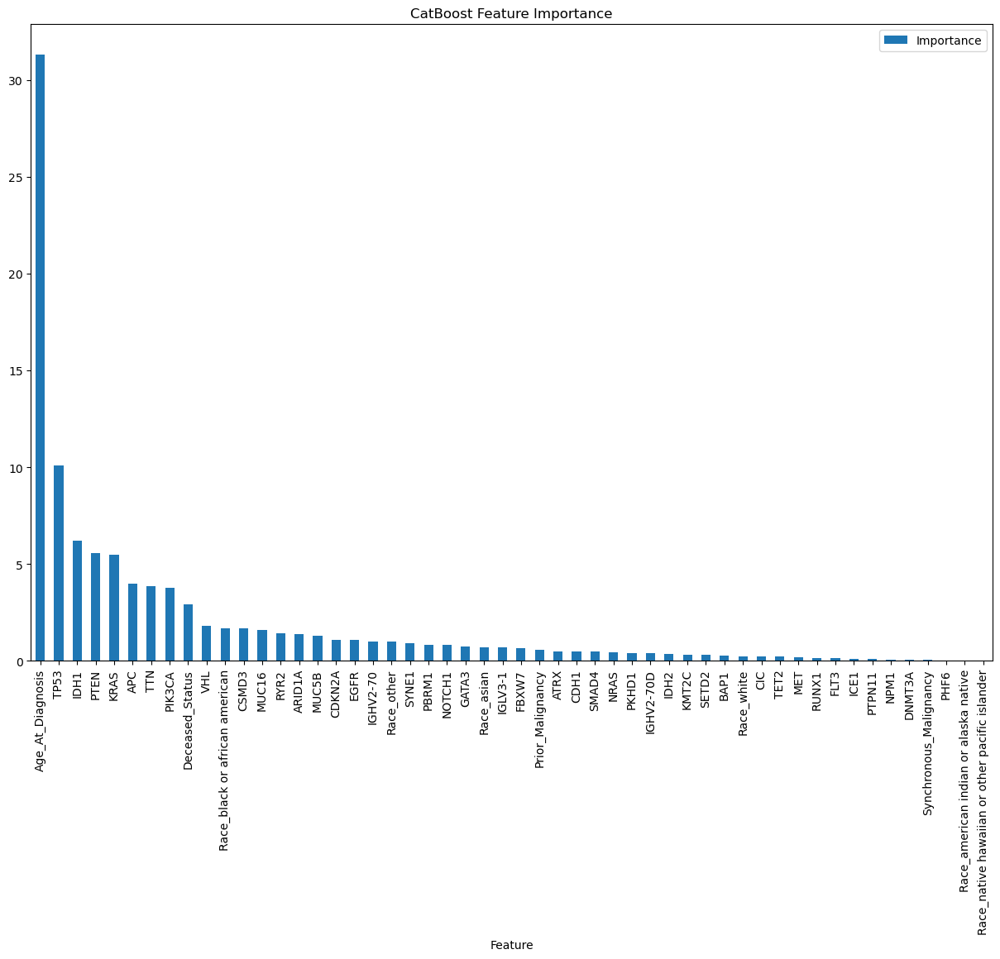

In [27]:
cat_feature_importance_df.plot(kind='bar', 
                                title='CatBoost Feature Importance', 
                                x='Feature', 
                                y='Importance', 
                                figsize=(15,10))

# Converting model to training job for deployment using joblib

In [28]:
import joblib

In [29]:
model_file_name = "tcga-catboost-classifier"
joblib.dump(cat_clf, model_file_name)

['tcga-catboost-classifier']

In [30]:
# Creating a sample testing csv to predict with the saved model
sample_test = cat_eval[0:5]
sample_test.head()

,Deceased_Status,Prior_Malignancy,Synchronous_Malignancy,TP53,PIK3CA,TTN,CDH1,GATA3,APC,KRAS,...,ICE1,SMAD4,CDKN2A,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_native hawaiian or other pacific islander,Race_other,Race_white,Age_At_Diagnosis
1617,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,63.31250
4952,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,58.87500
2168,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,54.00000
1090,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,48.65625
7757,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,50.25000


In [34]:
sample_test.to_csv('tcga-catboost-test.csv', sep=',', index=False)

In [32]:
test_clf = joblib.load(model_file_name)

In [35]:
test_data = pd.read_csv('tcga-catboost-test.csv', sep=',')
test_data.head()

,Deceased_Status,Prior_Malignancy,Synchronous_Malignancy,TP53,PIK3CA,TTN,CDH1,GATA3,APC,KRAS,...,ICE1,SMAD4,CDKN2A,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_native hawaiian or other pacific islander,Race_other,Race_white,Age_At_Diagnosis
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,63.30
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,58.88
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,54.00
3,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,48.66
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,50.25


In [38]:
test_pred = test_clf.predict(test_data)
test_pred

array([[0],
       [2],
       [2],
       [1],
       [3]], dtype=int64)